In [1]:
import numpy as np
import pandas as pd

def benchmark(x1, x2):
    return (    (1.3356 * (1.5 * (1 - x1))) 
                + (np.exp((2 * x1) - 1) * np.sin((3 * np.pi) * ((x1 - 0.6) ** 2)))
                + (np.exp(3 * (x2 - 0.5)) * np.sin((4 * np.pi) * ((x2 - 0.9) ** 2)))
            )

def getData(grid):
    x1 = np.linspace(0, 1, grid)
    x2 = np.linspace(0, 1, grid)
    x1, x2 = np.meshgrid(x1, x2)
    f_x1_x2 = benchmark(x1, x2)
    data = {'x1': x1.flatten(), 'x2': x2.flatten(), 'f(x1,x2)': f_x1_x2.flatten()}
    df = pd.DataFrame(data)
    return df


df_1000 = getData(32)
df_test = pd.read_excel("../Kriging-data.xlsx", sheet_name="Test")
df_training = pd.read_excel("../Kriging-data.xlsx", sheet_name="Training")
df_tudo = pd.read_excel("../Kriging-data.xlsx", sheet_name="Tudo")


exponential = pd.read_excel("../VirtualSamples.xlsx", sheet_name="Exponential")
spherical = pd.read_excel("../VirtualSamples.xlsx", sheet_name="Spherical")
gaussian = pd.read_excel("../VirtualSamples.xlsx", sheet_name="Gaussian")

/tmp/ipykernel_47091/2999369577.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


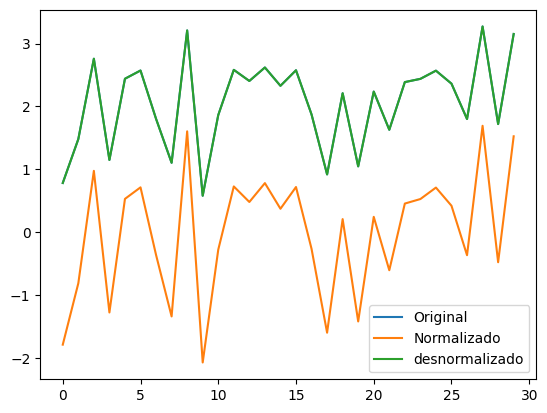

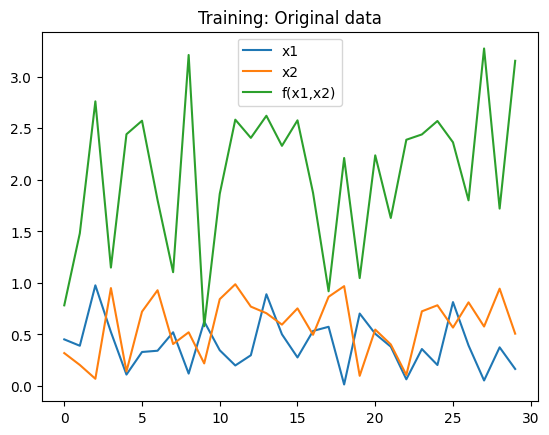

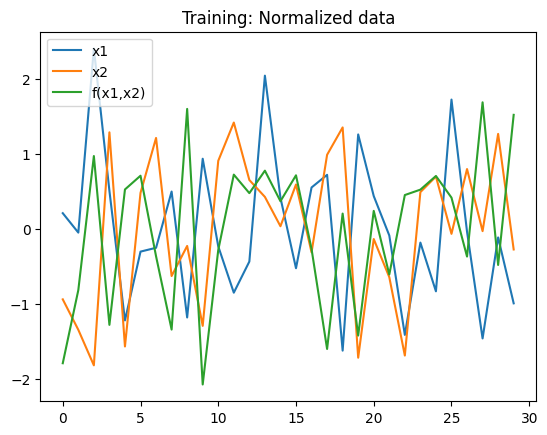

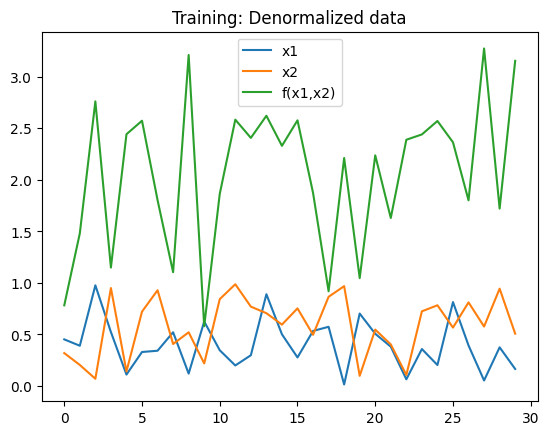

In [2]:
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

scaler = StandardScaler()
out_scaler = StandardScaler()

def show_norm(df, label="data", plot=False):
    df_norm = pd.DataFrame(scaler.transform(df), columns=df.columns)
    df_denorm = pd.DataFrame(scaler.inverse_transform(df_norm), columns=df_norm.columns)

    if (plot):
        df.plot(title=f"{label}: Original data")
        df_norm.plot(title=f"{label}: Normalized data")
        df_denorm.plot(title=f"{label}: Denormalized data")
    return (df_norm)


def test_out_scaler(df):
    out = df["f(x1,x2)"].values.reshape(-1, 1)  
    plt.plot(out, label='Original')
    out_scaler.fit(out)
    norm = out_scaler.transform(out)
    plt.plot(norm, label='Normalizado')
    plt.plot(out_scaler.inverse_transform(norm), label='desnormalizado')
    plt.legend()
    plt.show()

scaler.fit(df_training)
test_out_scaler(df_training)

df_tudo_norm = show_norm(df_training, "Training", True)
df_1000_norm = show_norm(df_1000)
df_exponential_norm = show_norm(pd.concat([df_training, exponential]))
df_spherical_norm = show_norm(pd.concat([df_training, exponential]))
df_gaussian_norm = show_norm(pd.concat([df_training, exponential]))


In [3]:
import plotly.graph_objs as go
import plotly.offline as py
import plotly.figure_factory as ff
from scipy.spatial import Delaunay

def plot_model_comparison(df_original, df_model, model_name):
    # Dados originais
    x_orig, y_orig, z_orig = df_original['x1'], df_original['x2'], df_original['f(x1,x2)']
    x_sup, y_sup, z_sup = df_1000['x1'], df_1000['x2'], df_1000['f(x1,x2)']

    # Dados do modelo específico
    x_model, y_model, z_model = df_model['x1'], df_model['x2'], df_model['f(x1,x2)']

    # Criação da superfície
    points = np.column_stack((x_sup, y_sup))
    tri = Delaunay(points)
    fig_surface = ff.create_trisurf(x=x_sup, y=y_sup, z=z_sup,
                                    simplices=tri.simplices, 
                                    title=f'Surface Fit - Original vs {model_name} Model')

    # Pontos das amostras originais
    original_data = go.Scatter3d(x=x_orig, y=y_orig, z=z_orig, mode='markers',
                                 marker=dict(size=5, color='red', opacity=0.8),
                                 name='Original Samples')

    # Pontos do modelo específico
    model_data = go.Scatter3d(x=x_model, y=y_model, z=z_model, mode='markers',
                              marker=dict(size=5, color='blue', opacity=0.8),
                              name=f'{model_name} Model')

    # Criando a figura
    fig = go.Figure(data=[fig_surface.data[0], original_data, model_data])
    fig.update_layout(
        scene=dict(
            xaxis_title='x1',
            yaxis_title='x2',
            zaxis_title='f(x1, x2)',
            aspectmode='cube'  
        )
    )

    # Plotando o gráfico
    py.iplot(fig)

plot_model_comparison(df_tudo, spherical, 'Spherical')
plot_model_comparison(df_tudo, gaussian, 'Gaussian')
plot_model_comparison(df_tudo, exponential, 'Exponential')

In [4]:
import os

os.chdir("./content")

lm_dir = "tf-levenberg-marquardt"
if not os.path.exists(lm_dir):
  !git clone https://github.com/fabiodimarco/$lm_dir

os.chdir(lm_dir)

In [5]:
def split_df(df):
    _input = np.vstack([df['x1'], df['x2']]).T
    _output = np.array(df['f(x1,x2)'])
    return (_input, _output)

In [6]:
import tensorflow as tf
import numpy as np
from keras import regularizers
from keras import initializers
import levenberg_marquardt as lm

# layers, neurons
class ShuffleArchitecture:
    def __init__(self, input_size, hidden_sizes, output_size, act_h, act_o, param_reg):
        self.input_size = input_size
        self.hidden_sizes = hidden_sizes
        self.output_size = output_size
        self.act_h = act_h
        self.act_o = act_o
        self.regularizer = regularizers.L2(param_reg)
        self.initializer = initializers.RandomUniform(minval=-0.5, maxval=0.5, seed=np.random.randint(1, 10000))

    def compute_k(self):
        total_parameters = 0
        for layer in self.model.layers:
            weights = layer.get_weights()
            if len(weights) > 0:  
                for w in weights:
                    total_parameters += np.prod(w.shape)
        return total_parameters
        
    def set_architecture(self):
        self.model = tf.keras.Sequential()
        self.model.add(tf.keras.layers.Dense(self.hidden_sizes[0],
                        input_shape=(self.input_size,),
                        activation=self.act_h,
                        kernel_regularizer=self.regularizer,
                        kernel_initializer=self.initializer,                        
                        ))  # input layer

        for size in self.hidden_sizes[1:]:  # hidden layers
            self.model.add(tf.keras.layers.Dense(size,
                            activation=self.act_h,
                            kernel_regularizer=self.regularizer,
                            kernel_initializer=self.initializer,  
                        ))

        self.model.add(tf.keras.layers.Dense(self.output_size,
                        activation=self.act_o,
                        kernel_regularizer=self.regularizer,
                        kernel_initializer=self.initializer,  
                        ))  # output layer

    def create_model(self, _learning_rate):
        self.model.compile(
            optimizer=tf.keras.optimizers.Adam(learning_rate=_learning_rate),
            loss=tf.keras.losses.MeanSquaredError())

        self.lm_model = lm.ModelWrapper(
            tf.keras.models.clone_model(self.model))

        self.lm_model.compile(
            optimizer=tf.keras.optimizers.SGD(learning_rate=_learning_rate),
            loss=lm.MeanSquaredError())
        return(self.lm_model)

2024-07-20 17:41:19.608235: I external/local_tsl/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
2024-07-20 17:41:19.652314: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-20 17:41:19.652347: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-20 17:41:19.653371: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-07-20 17:41:19.658930: I external/local_tsl/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
2024-07-20 17:41:19.659846: I tensorflow/core/platform/cpu_feature_guard.cc:1

In [7]:
from sklearn.model_selection import train_test_split
from keras.callbacks import EarlyStopping
from sklearn.metrics import r2_score, mean_squared_error, root_mean_squared_error, mean_absolute_percentage_error 

class TrainWithSmallDataset:
    def __init__(self, batch_size=1000):
        self.batch_size = batch_size
        self.betters = []
        self.k = 0

    def create_dataset(self, input, output):
      input = tf.expand_dims(tf.cast(input, tf.float32), axis=-1)
      output = tf.expand_dims(tf.cast(output, tf.float32), axis=-1)
      dataset = tf.data.Dataset.from_tensor_slices((input, output))
      dataset = dataset.shuffle(len(input))
      dataset = dataset.batch(self.batch_size).cache()
      dataset = dataset.prefetch(tf.data.experimental.AUTOTUNE)
      return (dataset, input, output)

    def split_dataset(self, input, output, sup_input, sup_output):
      input_train, input_vt, output_train, output_vt = train_test_split(input, output, test_size=0.3, shuffle = True)
      input_val, input_test, output_val, output_test = train_test_split(input_vt, output_vt, test_size=0.5, shuffle = True)

      self.train_dataset, self.train_input, self.train_output = self.create_dataset(input_train, output_train)
      self.val_dataset, self.val_input, self.val_output = self.create_dataset(input_val, output_val)
      self.test_dataset, self.test_input, self.test_output = self.create_dataset(input_test, output_test)
      self.vt_dataset, self.vt_input, self.vt_output = self.create_dataset(input_vt, output_vt)
      self.sup_dataset, self.sup_input, self.sup_output = self.create_dataset(sup_input, sup_output)
      self.dataset, self.input, self.output = self.create_dataset(input, output)

      self._data = (input, output)
      self._train = (input_train, output_train)
      self._vt = (input_vt, output_vt)
      self._val = (input_val, output_val)
      self._test = (input_test, output_test)
      self._sup = (sup_input, sup_output)

    def train_using_lm(self, train_dataset, epochs=1000):
      early_stopping_monitor = EarlyStopping(monitor='val_loss',
                                              patience=6,
                                              restore_best_weights=True)

      self.results = self.lm_model.fit(train_dataset,
                                            epochs=epochs,
                                            validation_data=self.val_dataset,
                                            callbacks=[early_stopping_monitor],
                                            verbose=0)
      print ("Stopped at epoch: ", early_stopping_monitor.stopped_epoch)
    
    def get_new_metrics(self, orig, pred, r2, mse):
      n = len(orig) # N: quantidade de saidas
      k = self.k
      waste = (orig.flatten() - pred.flatten())

      mape = mean_absolute_percentage_error(orig, pred)  
      r2_adj = 1 - (((n - 1)/(n - k - 1)) * (1 - r2))
      rsd = np.sqrt(np.sum(waste ** 2) / (n - 2))
      rmse = root_mean_squared_error(orig, pred)          
      aic = (-2 * np.log(mse)) + (2 * k)
      bic = (-2 * np.log(mse)) + (k * np.log(n))
      return (mape, r2_adj, rsd, rmse, aic, bic)
      

    def get_metrics(self):
          # Calculando a saida com os dados normalizados
          pred = self.lm_model.predict(self.input).flatten()
          test_pred = self.lm_model.predict(self.test_input).flatten()
          val_pred = self.lm_model.predict(self.val_input).flatten()
          vt_pred = self.lm_model.predict(self.vt_input).flatten()
          sup_pred = self.lm_model.predict(self.sup_input).flatten()

          # Calculando as metricas com a saida desnormalizada
          pred_denorm = out_scaler.inverse_transform(pred.reshape(-1, 1))
          test_pred_denorm = out_scaler.inverse_transform(test_pred.reshape(-1, 1))
          val_pred_denorm = out_scaler.inverse_transform(val_pred.reshape(-1, 1))
          vt_pred_denorm = out_scaler.inverse_transform(vt_pred.reshape(-1, 1))
          sup_pred_denorm = out_scaler.inverse_transform(sup_pred.reshape(-1, 1))

          out_denorm = out_scaler.inverse_transform(self._data[1].reshape(-1, 1))
          test_denorm = out_scaler.inverse_transform(self._test[1].reshape(-1, 1))
          val_denorm = out_scaler.inverse_transform(self._val[1].reshape(-1, 1))
          vt_denorm = out_scaler.inverse_transform(self._vt[1].reshape(-1, 1))    
          sup_denorm = out_scaler.inverse_transform(self._sup[1].reshape(-1, 1))

          r2 = r2_score(out_denorm, pred_denorm)
          r2_test = r2_score(test_denorm, test_pred_denorm)
          r2_val = r2_score(val_denorm, val_pred_denorm)
          r2_vt = r2_score(vt_denorm,  vt_pred_denorm)
          r2_sup = r2_score(sup_denorm,  sup_pred_denorm)

          mse = mean_squared_error(out_denorm, pred_denorm)
          mse_test = mean_squared_error(test_denorm, test_pred_denorm)
          mse_val = mean_squared_error(val_denorm, val_pred_denorm)
          mse_vt = mean_squared_error(vt_denorm,  vt_pred_denorm)
          mse_sup = mean_squared_error(sup_denorm,  sup_pred_denorm)
          
          mape, r2_adj, rsd, rmse, aic, bic = self.get_new_metrics(out_denorm, pred_denorm, r2, mse)
          metrics = {
                          'r2': r2,
                          'r2_sup': r2_sup,
                          'r2_test': r2_test,
                          'r2_val': r2_val,
                          'r2_vt': r2_vt,
                          'mse': mse,
                          'mse_sup': mse_sup,
                          'mse_test': mse_test,
                          'mse_val': mse_val,
                          'mse_vt': mse_vt,
                          'mape': mape,
                          'rmse': rmse,
                          'r2_adj': r2_adj,
                          'rsd': rsd,
                          'aic': aic,
                          'bic': bic
                          }

          return metrics

In [8]:
import pickle
from itertools import product

class Tester:
  def __init__(self, _df, _df_1000,  run_times=500, dataset_run_times=10):
    self.run_times = run_times
    self.better_metrics = {}
    self.dataset_run_times = dataset_run_times
    self.input, self.output = split_df(_df)
    self.input_1000, self.output_1000 = split_df(_df_1000)
  
  def setArchitecure(self, trainer, _hidden_sizes, _pg, _lr):
    shuffler = ShuffleArchitecture(input_size=2,
                                    hidden_sizes=_hidden_sizes,
                                    output_size=1,
                                    act_h='tanh',
                                    act_o='linear',
                                    param_reg=_pg)
    shuffler.set_architecture()    
    trainer.lm_model = shuffler.create_model(_lr)
    trainer.k = shuffler.compute_k()

  def Train(self, trainer, epochs=1000):
    trainer.train_using_lm(trainer.train_dataset, epochs=epochs)
    return(trainer.get_metrics(), trainer.lm_model)

  def SaveModelWeights(self, model, fileName):
    path = f"../models/{fileName}.keras"
    open(path,'w').close()
    model.save_weights(path)

  def SaveDataset(self, trainer, fileName):
    path = f"../dataset/{fileName}.pkl" 
    with open(path, 'wb') as f:
      pickle.dump((trainer._data, trainer._train, trainer._vt, trainer._val, trainer._test), f)
      
  def LoopWeights(self, sort_by, boundarie, trainer, idx):
    better_model = 0
    save = False

    for i in range(self.run_times):
      print (f"+++++++++++ [{idx}] | {i + 1} ++++++++++++++++++")
      metrics, model = self.Train(trainer)
      if (metrics[sort_by] <= boundarie): # should be >= to acsending metrics
        fileName = f"model_{idx}_{better_model}"
        self.SaveModelWeights(model, fileName)
        self.better_metrics[fileName] = metrics
        better_model += 1
        save = True
    return(save)

  def Loop(self, sort_by, boundarie, hidden_sizes, regularizers, learning_rate):
    trainer = TrainWithSmallDataset()

    for count, (hidden_size, reg, lr) in enumerate(product(hidden_sizes, regularizers, learning_rate), start=1):
      header =  f"Hidden Size={hidden_size}, regularizer={reg}, learning_rate={lr}"
      print(f"Testando combinacao{count}: {header}")
      self.setArchitecure(trainer, hidden_size, reg, lr)
      for j in range(self.dataset_run_times):
        trainer.split_dataset(self.input, self.output, self.input_1000, self.output_1000)
        if (self.LoopWeights(sort_by, boundarie, trainer, f"{count}_{j}") == True):
          self.SaveDataset(trainer, f"dataset_{count}_{j}")
          self.DisplayBetterResults('mse_sup', header, f"{count}_{j}")
        self.better_metrics = {}

  def DisplayBetterResults(self, sort_by, header, dataset=0):
    df = pd.DataFrame.from_dict(self.better_metrics, orient='index')
    df = df.sort_values([sort_by])
    display(df)
    path = f'../results/metrics_{dataset}'
    df.to_excel(f"{path}.xlsx", index=True)
    print(f"DataFrame salvo em {path}")
    with open(f"{path}.txt", 'w') as arquivo:
      arquivo.write(header)

# Treinando com dados gerados a partir do variograma Exponencial



In [9]:
tester = Tester(_df=df_exponential_norm,
                _df_1000=df_1000_norm,
                run_times=25, dataset_run_times=10)
tester.Loop(sort_by='mse_sup',
            boundarie = 0.5,
            hidden_sizes = [[40, 39], [20, 4], [15, 14], [26,18], [33, 21], [21, 12], [30, 21], [15, 2], [24, 7], [30, 16]],
            regularizers=[0.2, 0.0, 0.2, 0.5],
            learning_rate=[0.01, 0.1])

Testando combinacao1: Hidden Size=[40, 39], regularizer=0.2, learning_rate=0.01
+++++++++++ [1_0] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [1_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step


,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_0_20,0.596699,0.331862,0.553922,0.602276,0.587480,0.162570,0.396636,0.167209,0.152433,0.159821,0.226276,0.403200,1.030852,0.406438,3521.633293,8510.653167
model_1_0_22,0.608799,0.329031,0.579425,0.614392,0.605810,0.157693,0.398316,0.157649,0.147789,0.152719,0.222931,0.397105,1.029927,0.400295,3521.694215,8510.714089
model_1_0_19,0.589132,0.327101,0.548681,0.594310,0.581004,0.165620,0.399462,0.169173,0.155486,0.162329,0.228439,0.406965,1.031431,0.410234,3521.596113,8510.615987
model_1_0_21,0.601782,0.326662,0.572152,0.608214,0.599236,0.160521,0.399723,0.160375,0.150157,0.155266,0.225247,0.400651,1.030463,0.403869,3521.658655,8510.678530
model_1_0_18,0.581313,0.322176,0.542540,0.586026,0.573936,0.168772,0.402386,0.171475,0.158660,0.165068,0.230599,0.410819,1.032029,0.414119,3521.558407,8510.578282
model_1_0_17,0.573771,0.317774,0.538484,0.577130,0.567574,0.171813,0.404999,0.172995,0.162070,0.167533,0.232825,0.414503,1.032606,0.417832,3521.522703,8510.542577
model_1_0_16,0.565700,0.312962,0.532367,0.568725,0.560457,0.175066,0.407856,0.175288,0.165291,0.170290,0.235028,0.418409,1.033224,0.421769,3521.485187,8510.505061
model_1_0_15,0.557362,0.311499,0.526710,0.559682,0.553248,0.178427,0.408724,0.177409,0.168757,0.173083,0.237752,0.422406,1.033862,0.425799,3521.447153,8510.467028
model_1_0_14,0.547863,0.306958,0.518659,0.550238,0.544681,0.182256,0.411420,0.180427,0.172377,0.176402,0.240356,0.426914,1.034588,0.430343,3521.404687,8510.424562
model_1_0_13,0.538711,0.302939,0.510740,0.540302,0.535936,0.185945,0.413805,0.183395,0.176185,0.179790,0.242819,0.431214,1.035288,0.434677,3521.364608,8510.384482


DataFrame salvo em ../results/metrics_1_0
+++++++++++ [1_1] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_1] | 2 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_1] | 6 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_1] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_1_24,0.818389,0.479385,0.840250,0.806565,0.829671,0.073207,0.309060,0.104542,0.060343,0.082443,0.152908,0.270568,1.013893,0.272742,3523.228922,8512.248797
model_1_1_23,0.814788,0.476877,0.837277,0.802823,0.826455,0.074659,0.310549,0.106488,0.061511,0.083999,0.154360,0.273237,1.014169,0.275432,3523.189658,8512.209532
model_1_1_22,0.811102,0.474321,0.834203,0.798998,0.823145,0.076144,0.312066,0.108499,0.062704,0.085601,0.155832,0.275943,1.014451,0.278159,3523.150245,8512.170119
model_1_1_21,0.807344,0.471704,0.831070,0.795103,0.819772,0.077660,0.313619,0.110549,0.063919,0.087234,0.157314,0.278675,1.014738,0.280913,3523.110841,8512.130715
model_1_1_20,0.802535,0.467797,0.826129,0.787827,0.814086,0.079598,0.315939,0.113783,0.066189,0.089986,0.159343,0.282131,1.015106,0.284397,3523.061535,8512.081409
model_1_1_19,0.798631,0.465084,0.822962,0.783663,0.810604,0.081171,0.317549,0.115855,0.067488,0.091671,0.160857,0.284906,1.015405,0.287195,3523.022382,8512.042257
model_1_1_18,0.794633,0.462257,0.819639,0.779529,0.807025,0.082783,0.319227,0.118030,0.068777,0.093404,0.162393,0.287721,1.015710,0.290032,3522.983057,8512.002931
model_1_1_17,0.790563,0.459522,0.816326,0.775202,0.803391,0.084424,0.320851,0.120198,0.070127,0.095163,0.163939,0.290558,1.016022,0.292892,3522.943808,8511.963682
model_1_1_16,0.786416,0.456674,0.812977,0.770733,0.799687,0.086096,0.322542,0.122389,0.071521,0.096955,0.165497,0.293421,1.016339,0.295777,3522.904594,8511.924468
model_1_1_15,0.782137,0.453546,0.809320,0.766390,0.795815,0.087820,0.324399,0.124783,0.072876,0.098829,0.167099,0.296345,1.016666,0.298725,3522.864928,8511.884802


DataFrame salvo em ../results/metrics_1_1
+++++++++++ [1_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [1_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [1_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_2] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_2_24,0.888329,0.531959,0.878949,0.893060,0.886578,0.045014,0.277850,0.047716,0.047567,0.047641,0.119476,0.212166,1.008543,0.213870,3524.201542,8513.221416
model_1_2_23,0.886145,0.530267,0.876766,0.891139,0.884536,0.045895,0.278854,0.048577,0.048421,0.048499,0.120662,0.214231,1.008710,0.215952,3524.162801,8513.182675
model_1_2_22,0.883886,0.528637,0.874392,0.889147,0.882368,0.046805,0.279821,0.049512,0.049307,0.049410,0.121874,0.216345,1.008883,0.218083,3524.123519,8513.143393
model_1_2_21,0.881582,0.526785,0.872041,0.887009,0.880133,0.047734,0.280921,0.050439,0.050258,0.050348,0.123103,0.218482,1.009059,0.220237,3524.084209,8513.104084
model_1_2_20,0.879236,0.524946,0.869640,0.884884,0.877880,0.048680,0.282013,0.051386,0.051203,0.051295,0.124339,0.220635,1.009238,0.222407,3524.044988,8513.064863
model_1_2_19,0.876875,0.523214,0.867232,0.882854,0.875676,0.049632,0.283041,0.052335,0.052106,0.052221,0.125564,0.222781,1.009419,0.224571,3524.006257,8513.026131
model_1_2_18,0.874452,0.521369,0.864778,0.880703,0.873385,0.050608,0.284136,0.053302,0.053063,0.053183,0.126814,0.224963,1.009604,0.226770,3523.967276,8512.987151
model_1_2_17,0.871992,0.519511,0.862309,0.878550,0.871087,0.051600,0.285239,0.054275,0.054021,0.054148,0.128071,0.227156,1.009793,0.228981,3523.928471,8512.948346
model_1_2_16,0.869392,0.517987,0.859259,0.875661,0.868126,0.052648,0.286144,0.055477,0.055306,0.055392,0.129402,0.229451,1.009991,0.231294,3523.888262,8512.908137
model_1_2_15,0.866833,0.515991,0.856727,0.873358,0.865719,0.053680,0.287329,0.056475,0.056330,0.056403,0.130681,0.231689,1.010187,0.233550,3523.849444,8512.869319


DataFrame salvo em ../results/metrics_1_2
+++++++++++ [1_3] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_3] | 6 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_3] | 7 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_3] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_3_24,0.948234,0.577230,0.957846,0.950015,0.954229,0.020867,0.250975,0.015148,0.016735,0.015941,0.081739,0.144453,1.003960,0.145614,3525.739197,8514.759071
model_1_3_23,0.947214,0.576630,0.957002,0.949165,0.953385,0.021278,0.251331,0.015451,0.017019,0.016235,0.082545,0.145869,1.004038,0.147041,3525.700177,8514.720051
model_1_3_22,0.946155,0.575948,0.956119,0.948243,0.952486,0.021705,0.251736,0.015769,0.017328,0.016548,0.083373,0.147326,1.004119,0.148509,3525.660434,8514.680308
model_1_3_21,0.945309,0.575347,0.955400,0.947873,0.951937,0.022046,0.252093,0.016027,0.017452,0.016739,0.084028,0.148479,1.004184,0.149672,3525.629242,8514.649116
model_1_3_19,0.942296,0.574348,0.953177,0.945847,0.949817,0.023261,0.252685,0.016826,0.018130,0.017478,0.086254,0.152514,1.004414,0.153739,3525.521988,8514.541863
model_1_3_20,0.943268,0.573973,0.953555,0.946247,0.950204,0.022869,0.252908,0.016690,0.017996,0.017343,0.085537,0.151224,1.004340,0.152439,3525.555963,8514.575837
model_1_3_18,0.933752,0.567956,0.945910,0.938235,0.942409,0.026705,0.256480,0.019437,0.020679,0.020058,0.092343,0.163415,1.005068,0.164728,3525.245842,8514.265716
model_1_3_17,0.929485,0.564400,0.941282,0.935825,0.938863,0.028425,0.258591,0.021100,0.021486,0.021293,0.095085,0.168596,1.005394,0.169950,3525.120993,8514.140868
model_1_3_16,0.928035,0.563370,0.939977,0.934546,0.937576,0.029009,0.259202,0.021569,0.021914,0.021741,0.096055,0.170321,1.005505,0.171689,3525.080290,8514.100164
model_1_3_15,0.926565,0.562412,0.938566,0.933310,0.936253,0.029602,0.259771,0.022076,0.022327,0.022202,0.097020,0.172051,1.005618,0.173433,3525.039854,8514.059729


DataFrame salvo em ../results/metrics_1_3
+++++++++++ [1_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_4] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_4_24,0.973683,0.606051,0.967435,0.971402,0.971215,0.010609,0.233865,0.009158,0.013150,0.011154,0.057179,0.102998,1.002013,0.103825,3527.092198,8516.112072
model_1_4_23,0.973210,0.605556,0.966990,0.970964,0.970794,0.010799,0.234159,0.009283,0.013352,0.011317,0.057669,0.103919,1.002049,0.104754,3527.056575,8516.076449
model_1_4_22,0.972763,0.604927,0.966656,0.970601,0.970457,0.010979,0.234532,0.009377,0.013519,0.011448,0.058157,0.104783,1.002084,0.105624,3527.023474,8516.043348
model_1_4_21,0.972282,0.604424,0.966190,0.970144,0.970017,0.011173,0.234831,0.009508,0.013729,0.011618,0.058647,0.105703,1.002120,0.106552,3526.988497,8516.008371
model_1_4_20,0.971917,0.603933,0.965853,0.969982,0.969799,0.011320,0.235122,0.009603,0.013803,0.011703,0.059034,0.106396,1.002148,0.107251,3526.962345,8515.982219
model_1_4_19,0.971416,0.603675,0.965474,0.969543,0.969401,0.011522,0.235275,0.009709,0.014005,0.011857,0.059557,0.107342,1.002187,0.108205,3526.926930,8515.946804
model_1_4_18,0.970900,0.603291,0.964970,0.969099,0.968955,0.011730,0.235503,0.009851,0.014209,0.012030,0.060084,0.108307,1.002226,0.109177,3526.891156,8515.911031
model_1_4_17,0.970341,0.602875,0.964411,0.968573,0.968440,0.011955,0.235751,0.010008,0.014451,0.012230,0.060640,0.109341,1.002269,0.110219,3526.853140,8515.873015
model_1_4_16,0.969774,0.602423,0.963837,0.968042,0.967916,0.012184,0.236019,0.010169,0.014695,0.012432,0.061194,0.110381,1.002312,0.111267,3526.815276,8515.835150
model_1_4_15,0.968046,0.594308,0.959151,0.967552,0.965925,0.012881,0.240836,0.011487,0.014921,0.013204,0.063061,0.113493,1.002444,0.114404,3526.704071,8515.723945


DataFrame salvo em ../results/metrics_1_4
+++++++++++ [1_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [1_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_5] | 4 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_5] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_5_24,0.983811,0.613900,0.981781,0.976837,0.979735,0.006526,0.229206,0.008573,0.007696,0.008135,0.042593,0.080783,1.001238,0.081432,3528.063962,8517.083836
model_1_5_23,0.983629,0.613681,0.981887,0.976880,0.979815,0.006599,0.229335,0.008524,0.007682,0.008103,0.042946,0.081234,1.001252,0.081887,3528.041674,8517.061548
model_1_5_22,0.983308,0.613469,0.981609,0.976352,0.979434,0.006728,0.229461,0.008654,0.007857,0.008256,0.043411,0.082027,1.001277,0.082685,3528.002849,8517.022724
model_1_5_21,0.983030,0.613240,0.981445,0.976058,0.979216,0.006840,0.229597,0.008731,0.007955,0.008343,0.043839,0.082707,1.001298,0.083371,3527.969804,8516.989678
model_1_5_20,0.982777,0.612961,0.981398,0.975799,0.979081,0.006943,0.229763,0.008753,0.008041,0.008397,0.044255,0.083322,1.001318,0.083992,3527.940159,8516.960034
model_1_5_19,0.981038,0.611178,0.981302,0.975228,0.978788,0.007644,0.230821,0.008799,0.008231,0.008515,0.047096,0.087428,1.001451,0.088130,3527.747762,8516.767637
model_1_5_18,0.980781,0.610900,0.981317,0.975143,0.978762,0.007747,0.230986,0.008792,0.008259,0.008525,0.047505,0.088019,1.001470,0.088726,3527.720808,8516.740682
model_1_5_17,0.980545,0.610631,0.981361,0.975247,0.978831,0.007842,0.231146,0.008771,0.008224,0.008498,0.047888,0.088557,1.001488,0.089269,3527.696425,8516.716300
model_1_5_16,0.980031,0.608903,0.982136,0.977745,0.980319,0.008049,0.232172,0.008407,0.007394,0.007900,0.049026,0.089718,1.001528,0.090439,3527.644316,8516.664190
model_1_5_15,0.979356,0.608587,0.980904,0.975947,0.978852,0.008321,0.232360,0.008986,0.007992,0.008489,0.049807,0.091222,1.001579,0.091955,3527.577839,8516.597714


DataFrame salvo em ../results/metrics_1_5
+++++++++++ [1_6] | 1 ++++++++++++++++++
Stopped at epoch:  18
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [1_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_6] | 9 +++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_6_9,0.990432,0.614033,0.992144,0.984638,0.988908,0.003857,0.229127,0.003664,0.005651,0.004658,0.032660,0.062104,1.000732,0.062602,3529.115803,8518.135677
model_1_6_10,0.990604,0.614008,0.992289,0.984827,0.989072,0.003788,0.229142,0.003597,0.005581,0.004589,0.032361,0.061544,1.000719,0.062038,3529.152016,8518.171891
model_1_6_11,0.990773,0.614003,0.992432,0.985016,0.989234,0.003719,0.229145,0.003530,0.005512,0.004521,0.032066,0.060987,1.000706,0.061477,3529.188358,8518.208232
model_1_6_12,0.990937,0.613956,0.992559,0.985208,0.989389,0.003653,0.229172,0.003471,0.005441,0.004456,0.031782,0.060443,1.000693,0.060929,3529.224212,8518.244086
model_1_6_13,0.991097,0.613915,0.992682,0.985398,0.989540,0.003589,0.229197,0.003413,0.005371,0.004392,0.031502,0.059906,1.000681,0.060387,3529.259909,8518.279783
model_1_6_14,0.991255,0.613890,0.992804,0.985588,0.989691,0.003525,0.229212,0.003357,0.005302,0.004329,0.031220,0.059371,1.000669,0.059848,3529.295805,8518.315680
model_1_6_0,0.987390,0.613753,0.989469,0.981069,0.985860,0.005083,0.229293,0.004912,0.006964,0.005938,0.037548,0.071297,1.000965,0.071869,3528.563615,8517.583489
model_1_6_1,0.987627,0.613745,0.989686,0.981344,0.986101,0.004987,0.229297,0.004811,0.006863,0.005837,0.037188,0.070622,1.000947,0.071189,3528.601650,8517.621524
model_1_6_2,0.987859,0.613744,0.989893,0.981613,0.986334,0.004894,0.229298,0.004714,0.006763,0.005739,0.036832,0.069958,1.000929,0.070520,3528.639429,8517.659303
model_1_6_4,0.988307,0.613726,0.990302,0.982123,0.986784,0.004713,0.229309,0.004523,0.006576,0.005550,0.036130,0.068654,1.000894,0.069205,3528.714716,8517.734590


DataFrame salvo em ../results/metrics_1_6
+++++++++++ [1_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [1_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_7] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_7_24,0.995141,0.623694,0.993677,0.996501,0.994771,0.001959,0.223392,0.003311,0.001008,0.002159,0.023174,0.044258,1.000372,0.044614,3530.470872,8519.490746
model_1_7_23,0.995062,0.623169,0.993608,0.996488,0.994723,0.001991,0.223703,0.003347,0.001012,0.002179,0.023368,0.044616,1.000378,0.044974,3530.438676,8519.458550
model_1_7_22,0.994988,0.622853,0.993587,0.996456,0.994698,0.002020,0.223891,0.003358,0.001021,0.002189,0.023560,0.044947,1.000383,0.045308,3530.409091,8519.428965
model_1_7_21,0.994914,0.622589,0.993572,0.996431,0.994680,0.002050,0.224048,0.003366,0.001028,0.002197,0.023759,0.045279,1.000389,0.045643,3530.379653,8519.399527
model_1_7_20,0.994836,0.622317,0.993545,0.996403,0.994653,0.002081,0.224209,0.003380,0.001036,0.002208,0.023963,0.045623,1.000395,0.045989,3530.349404,8519.369278
model_1_7_19,0.994758,0.622074,0.993522,0.996373,0.994628,0.002113,0.224353,0.003392,0.001045,0.002218,0.024167,0.045969,1.000401,0.046339,3530.319124,8519.338998
model_1_7_18,0.994682,0.621561,0.993495,0.996345,0.994601,0.002144,0.224658,0.003406,0.001053,0.002229,0.024350,0.046299,1.000407,0.046671,3530.290546,8519.310420
model_1_7_17,0.994600,0.621190,0.993458,0.996321,0.994569,0.002177,0.224878,0.003426,0.001060,0.002243,0.024548,0.046656,1.000413,0.047031,3530.259784,8519.279659
model_1_7_16,0.994516,0.620774,0.993425,0.996280,0.994534,0.002211,0.225125,0.003442,0.001072,0.002257,0.024732,0.047017,1.000420,0.047395,3530.228976,8519.248850
model_1_7_15,0.994424,0.620481,0.993372,0.996243,0.994487,0.002248,0.225299,0.003471,0.001082,0.002276,0.024948,0.047408,1.000427,0.047789,3530.195873,8519.215747


DataFrame salvo em ../results/metrics_1_7
+++++++++++ [1_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [1_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [1_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_8] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_8_24,0.996821,0.628247,0.994260,0.998723,0.996526,0.001282,0.220689,0.002077,0.000466,0.001271,0.017664,0.035798,1.000243,0.036086,3531.319442,8520.339316
model_1_8_23,0.996784,0.628130,0.994329,0.998713,0.996555,0.001296,0.220758,0.002052,0.000470,0.001261,0.017798,0.036004,1.000246,0.036294,3531.296449,8520.316324
model_1_8_22,0.996746,0.628027,0.994398,0.998700,0.996582,0.001312,0.220820,0.002027,0.000475,0.001251,0.017960,0.036218,1.000249,0.036509,3531.272768,8520.292643
model_1_8_21,0.996706,0.627919,0.994464,0.998685,0.996608,0.001328,0.220883,0.002003,0.000480,0.001241,0.018128,0.036438,1.000252,0.036731,3531.248562,8520.268436
model_1_8_20,0.996665,0.627859,0.994528,0.998668,0.996631,0.001344,0.220919,0.001980,0.000486,0.001233,0.018299,0.036666,1.000255,0.036960,3531.223636,8520.243510
model_1_8_19,0.996622,0.627733,0.994591,0.998649,0.996653,0.001362,0.220994,0.001957,0.000493,0.001225,0.018474,0.036899,1.000258,0.037195,3531.198292,8520.218167
model_1_8_18,0.996579,0.627595,0.994654,0.998627,0.996673,0.001379,0.221076,0.001934,0.000501,0.001217,0.018652,0.037137,1.000262,0.037435,3531.172564,8520.192438
model_1_8_17,0.996534,0.627390,0.994722,0.998603,0.996694,0.001397,0.221197,0.001910,0.000510,0.001210,0.018829,0.037377,1.000265,0.037678,3531.146750,8520.166625
model_1_8_16,0.996487,0.627250,0.994779,0.998577,0.996710,0.001416,0.221281,0.001889,0.000519,0.001204,0.019012,0.037631,1.000269,0.037933,3531.119712,8520.139586
model_1_8_15,0.996438,0.627112,0.994837,0.998549,0.996724,0.001436,0.221362,0.001868,0.000530,0.001199,0.019198,0.037890,1.000272,0.038194,3531.092272,8520.112146


DataFrame salvo em ../results/metrics_1_8
+++++++++++ [1_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [1_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [1_9] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_9_24,0.997658,0.629258,0.997109,0.996341,0.996971,0.000944,0.220089,0.000790,0.002296,0.001543,0.014590,0.030727,1.000179,0.030974,3531.930408,8520.950283
model_1_9_23,0.997639,0.629232,0.997109,0.996362,0.996984,0.000952,0.220104,0.000789,0.002282,0.001536,0.014675,0.030850,1.000181,0.031098,3531.914463,8520.934337
model_1_9_22,0.997615,0.629178,0.997094,0.996372,0.996986,0.000961,0.220136,0.000794,0.002276,0.001535,0.014770,0.031005,1.000182,0.031254,3531.894473,8520.914347
model_1_9_21,0.997595,0.629142,0.997088,0.996395,0.996999,0.000969,0.220157,0.000795,0.002262,0.001529,0.014861,0.031135,1.000184,0.031385,3531.877729,8520.897603
model_1_9_20,0.997572,0.629104,0.997074,0.996411,0.997005,0.000979,0.220180,0.000799,0.002252,0.001525,0.014961,0.031284,1.000186,0.031535,3531.858657,8520.878531
model_1_9_19,0.997555,0.628992,0.997060,0.996453,0.997027,0.000986,0.220246,0.000803,0.002226,0.001514,0.015036,0.031394,1.000187,0.031646,3531.844538,8520.864412
model_1_9_18,0.997530,0.628945,0.997038,0.996469,0.997031,0.000996,0.220274,0.000809,0.002215,0.001512,0.015134,0.031552,1.000189,0.031805,3531.824481,8520.844356
model_1_9_17,0.997497,0.628923,0.996999,0.996459,0.997014,0.001009,0.220287,0.000820,0.002222,0.001521,0.015259,0.031762,1.000191,0.032017,3531.797931,8520.817805
model_1_9_16,0.997471,0.628891,0.996976,0.996471,0.997016,0.001020,0.220306,0.000826,0.002214,0.001520,0.015362,0.031931,1.000193,0.032188,3531.776670,8520.796545
model_1_9_15,0.997444,0.628840,0.996948,0.996488,0.997018,0.001030,0.220337,0.000834,0.002203,0.001519,0.015460,0.032100,1.000196,0.032358,3531.755614,8520.775488


DataFrame salvo em ../results/metrics_1_9
Testando combinacao2: Hidden Size=[40, 39], regularizer=0.2, learning_rate=0.1
+++++++++++ [2_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [=====

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_0_12,0.985047,0.655210,0.982309,0.975029,0.979134,0.006028,0.204682,0.006505,0.012681,0.009593,0.031844,0.077638,1.001144,0.078262,3528.222784,8517.242659
model_2_0_11,0.983280,0.654197,0.980551,0.973358,0.977507,0.006740,0.205283,0.007152,0.013530,0.010341,0.033791,0.082095,1.001279,0.082755,3527.999493,8517.019367
model_2_0_10,0.980312,0.654100,0.977355,0.971442,0.975171,0.007936,0.205341,0.008327,0.014503,0.011415,0.036677,0.089085,1.001506,0.089800,3527.672671,8516.692545
model_2_0_9,0.976836,0.653732,0.973505,0.968942,0.972251,0.009338,0.205560,0.009742,0.015772,0.012757,0.039861,0.096631,1.001772,0.097407,3527.347422,8516.367296
model_2_0_13,0.988252,0.653683,0.985825,0.976503,0.981353,0.004735,0.205589,0.005212,0.011933,0.008573,0.028203,0.068814,1.000899,0.069367,3528.705375,8517.725249
model_2_0_14,0.989520,0.653365,0.987005,0.977570,0.982414,0.004225,0.205777,0.004779,0.011391,0.008085,0.026391,0.064997,1.000802,0.065519,3528.933684,8517.953558
model_2_0_8,0.972521,0.653288,0.969076,0.966189,0.968958,0.011077,0.205823,0.011371,0.017171,0.014271,0.043648,0.105246,1.002102,0.106091,3527.005834,8516.025708
model_2_0_15,0.990324,0.652701,0.987716,0.977857,0.982857,0.003900,0.206172,0.004517,0.011245,0.007881,0.025135,0.062452,1.000740,0.062954,3529.093418,8518.113293
model_2_0_16,0.991255,0.652555,0.988466,0.978461,0.983491,0.003525,0.206259,0.004241,0.010938,0.007590,0.023519,0.059374,1.000669,0.059851,3529.295603,8518.315478
model_2_0_17,0.991997,0.652037,0.988978,0.978868,0.983920,0.003226,0.206566,0.004053,0.010732,0.007392,0.022055,0.056797,1.000612,0.057253,3529.473081,8518.492956


DataFrame salvo em ../results/metrics_2_0
+++++++++++ [2_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [2_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [2_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_1] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_1_12,0.997170,0.666159,0.990759,0.995257,0.993760,0.001141,0.198183,0.003622,0.003066,0.003344,0.011942,0.033777,1.000217,0.034048,3531.551941,8520.571815
model_2_1_10,0.997308,0.666088,0.992345,0.995507,0.994491,0.001085,0.198225,0.003001,0.002905,0.002953,0.012083,0.032941,1.000206,0.033206,3531.652115,8520.671990
model_2_1_13,0.997088,0.666064,0.990017,0.995130,0.993412,0.001174,0.198239,0.003913,0.003149,0.003531,0.011856,0.034259,1.000223,0.034534,3531.495277,8520.515151
model_2_1_11,0.997255,0.666058,0.991564,0.995405,0.994144,0.001107,0.198243,0.003307,0.002971,0.003139,0.012002,0.033265,1.000210,0.033532,3531.612992,8520.632866
model_2_1_14,0.996993,0.666008,0.989246,0.995004,0.993054,0.001212,0.198272,0.004215,0.003230,0.003723,0.011768,0.034813,1.000230,0.035092,3531.431078,8520.450953
model_2_1_16,0.996770,0.665912,0.987702,0.994720,0.992318,0.001302,0.198329,0.004821,0.003414,0.004117,0.011663,0.036085,1.000247,0.036374,3531.287562,8520.307437
model_2_1_15,0.996882,0.665905,0.988470,0.994855,0.992680,0.001257,0.198333,0.004520,0.003327,0.003923,0.011722,0.035451,1.000239,0.035736,3531.358398,8520.378272
model_2_1_20,0.996348,0.665879,0.985064,0.994236,0.991061,0.001472,0.198349,0.005855,0.003727,0.004791,0.011486,0.038367,1.000279,0.038675,3531.042225,8520.062099
model_2_1_19,0.996457,0.665859,0.985705,0.994356,0.991368,0.001428,0.198361,0.005604,0.003649,0.004626,0.011509,0.037793,1.000271,0.038096,3531.102540,8520.122415
model_2_1_21,0.996258,0.665858,0.984543,0.994127,0.990805,0.001508,0.198361,0.006059,0.003797,0.004928,0.011447,0.038838,1.000286,0.039150,3530.993404,8520.013278


DataFrame salvo em ../results/metrics_2_1
+++++++++++ [2_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [2_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_2] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_2_3,0.996376,0.667541,0.998745,0.983344,0.991062,0.001461,0.197362,0.000446,0.005907,0.003176,0.011209,0.038221,1.000277,0.038528,3531.057516,8520.077390
model_2_2_2,0.996432,0.667474,0.999038,0.985468,0.992268,0.001438,0.197402,0.000341,0.005154,0.002748,0.011313,0.037924,1.000273,0.038228,3531.088711,8520.108585
model_2_2_4,0.996280,0.667379,0.998365,0.981345,0.989874,0.001499,0.197458,0.000581,0.006616,0.003598,0.011029,0.038723,1.000285,0.039034,3531.005269,8520.025143
model_2_2_1,0.996427,0.667126,0.999217,0.987654,0.993448,0.001440,0.197609,0.000278,0.004379,0.002328,0.011343,0.037953,1.000273,0.038257,3531.085664,8520.105539
model_2_2_5,0.996163,0.667121,0.997923,0.979524,0.988745,0.001547,0.197611,0.000738,0.007262,0.004000,0.010803,0.039330,1.000294,0.039646,3530.943076,8519.962950
model_2_2_6,0.996029,0.666774,0.997438,0.977848,0.987666,0.001601,0.197817,0.000910,0.007856,0.004383,0.010556,0.040011,1.000304,0.040333,3530.874391,8519.894265
model_2_2_0,0.996317,0.666442,0.999232,0.989718,0.994486,0.001485,0.198015,0.000273,0.003647,0.001960,0.011275,0.038530,1.000282,0.038840,3531.025246,8520.045120
model_2_2_7,0.995888,0.666415,0.996940,0.976336,0.986663,0.001657,0.198030,0.001086,0.008392,0.004739,0.010368,0.040711,1.000315,0.041038,3530.805054,8519.824928
model_2_2_8,0.995753,0.665998,0.996444,0.975022,0.985759,0.001712,0.198278,0.001263,0.008858,0.005060,0.010229,0.041377,1.000325,0.041709,3530.740160,8519.760034
model_2_2_9,0.995611,0.665575,0.995956,0.973792,0.984902,0.001769,0.198529,0.001436,0.009295,0.005365,0.010098,0.042063,1.000336,0.042401,3530.674331,8519.694205


DataFrame salvo em ../results/metrics_2_2
+++++++++++ [2_3] | 1 ++++++++++++++++++
Stopped at epoch:  10
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_3] | 9 +++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_3_20,0.997809,0.662109,0.992877,0.994839,0.993581,0.000883,0.200586,0.004219,0.001568,0.002893,0.007321,0.029719,1.000168,0.029957,3532.063937,8521.083812
model_2_3_19,0.997826,0.662108,0.992926,0.994949,0.993650,0.000876,0.200587,0.004190,0.001534,0.002862,0.007334,0.029602,1.000166,0.029840,3532.079677,8521.099551
model_2_3_17,0.997863,0.662108,0.993041,0.995203,0.993811,0.000861,0.200587,0.004122,0.001457,0.002789,0.007364,0.029347,1.000163,0.029583,3532.114243,8521.134117
model_2_3_16,0.997883,0.662107,0.993107,0.995350,0.993904,0.000853,0.200588,0.004083,0.001412,0.002748,0.007381,0.029212,1.000162,0.029446,3532.132745,8521.152620
model_2_3_18,0.997844,0.662106,0.992980,0.995069,0.993726,0.000869,0.200588,0.004158,0.001498,0.002828,0.007348,0.029478,1.000165,0.029715,3532.096392,8521.116267
model_2_3_14,0.997922,0.662098,0.993257,0.995686,0.994116,0.000837,0.200593,0.003994,0.001310,0.002652,0.007430,0.028940,1.000159,0.029172,3532.170184,8521.190058
model_2_3_15,0.997903,0.662097,0.993178,0.995509,0.994005,0.000845,0.200594,0.004041,0.001364,0.002702,0.007401,0.029077,1.000160,0.029311,3532.151212,8521.171087
model_2_3_21,0.997792,0.662092,0.992830,0.994737,0.993516,0.000890,0.200597,0.004247,0.001598,0.002923,0.007309,0.029833,1.000169,0.030073,3532.048540,8521.068414
model_2_3_22,0.997777,0.662087,0.992789,0.994646,0.993458,0.000896,0.200599,0.004271,0.001626,0.002949,0.007298,0.029937,1.000170,0.030178,3532.034606,8521.054480
model_2_3_23,0.997762,0.662082,0.992751,0.994563,0.993405,0.000902,0.200602,0.004293,0.001651,0.002972,0.007288,0.030034,1.000171,0.030276,3532.021664,8521.041538


DataFrame salvo em ../results/metrics_2_3
+++++++++++ [2_4] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 4ms/step
+++++++++++ [2_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_4] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_4_0,0.996773,0.654209,0.990890,0.990815,0.991426,0.001301,0.205277,0.002549,0.003270,0.002910,0.011320,0.036066,1.000247,0.036355,3531.289669,8520.309543
model_2_4_1,0.995413,0.650318,0.982158,0.985954,0.985276,0.001849,0.207586,0.004993,0.005001,0.004997,0.013192,0.043001,1.000351,0.043347,3530.586085,8519.605959
model_2_4_2,0.993929,0.646488,0.972955,0.980864,0.978812,0.002447,0.209860,0.007568,0.006813,0.007190,0.014677,0.049469,1.000464,0.049867,3530.025624,8519.045498
model_2_4_3,0.992617,0.642942,0.964906,0.976378,0.973140,0.002976,0.211965,0.009820,0.008410,0.009115,0.015594,0.054555,1.000565,0.054993,3529.634205,8518.654079
model_2_4_4,0.991501,0.639765,0.958113,0.972550,0.968332,0.003426,0.213851,0.011721,0.009772,0.010747,0.016159,0.058531,1.000650,0.059001,3529.352826,8518.372700
model_2_4_5,0.990570,0.636969,0.952491,0.969319,0.964319,0.003801,0.215511,0.013294,0.010923,0.012109,0.016504,0.061655,1.000721,0.062150,3529.144788,8518.164662
model_2_4_6,0.989776,0.634488,0.947785,0.966527,0.960915,0.004121,0.216984,0.014611,0.011917,0.013264,0.016730,0.064196,1.000782,0.064712,3528.983250,8518.003124
model_2_4_7,0.989094,0.632278,0.943817,0.964090,0.957999,0.004396,0.218296,0.015722,0.012785,0.014253,0.016891,0.066305,1.000834,0.066838,3528.853960,8517.873835
model_2_4_8,0.988477,0.630272,0.940353,0.961835,0.955389,0.004645,0.219487,0.016691,0.013587,0.015139,0.017020,0.068152,1.000881,0.068700,3528.744046,8517.763920
model_2_4_9,0.987954,0.628498,0.937519,0.959847,0.953178,0.004856,0.220540,0.017484,0.014295,0.015889,0.017120,0.069684,1.000922,0.070244,3528.655134,8517.675008


DataFrame salvo em ../results/metrics_2_4
+++++++++++ [2_5] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [2_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_5] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_5_4,0.989764,0.632736,0.971599,0.982782,0.977194,0.004126,0.218024,0.015518,0.006585,0.011051,0.014051,0.064235,1.000783,0.064751,3528.980828,8518.000703
model_2_5_5,0.989435,0.632712,0.968613,0.982123,0.975250,0.004259,0.218038,0.017150,0.006837,0.011993,0.013708,0.065259,1.000808,0.065783,3528.917553,8517.937427
model_2_5_3,0.990039,0.632561,0.974867,0.983266,0.979227,0.004015,0.218128,0.013732,0.006400,0.010066,0.014403,0.063367,1.000762,0.063876,3529.035256,8518.055131
model_2_5_6,0.989073,0.632548,0.965909,0.981330,0.973413,0.004405,0.218135,0.018627,0.007140,0.012884,0.013381,0.066369,1.000836,0.066902,3528.850128,8517.870002
model_2_5_7,0.988693,0.632317,0.963445,0.980472,0.971685,0.004558,0.218273,0.019974,0.007468,0.013721,0.013075,0.067513,1.000865,0.068055,3528.781770,8517.801644
model_2_5_2,0.990221,0.632121,0.978398,0.983480,0.981302,0.003942,0.218389,0.011804,0.006318,0.009061,0.014763,0.062785,1.000748,0.063290,3529.072141,8518.092015
model_2_5_8,0.988304,0.632029,0.961183,0.979590,0.970061,0.004715,0.218443,0.021210,0.007805,0.014508,0.012791,0.068665,1.000895,0.069216,3528.714089,8517.733963
model_2_5_9,0.987918,0.631701,0.959125,0.978706,0.968552,0.004870,0.218638,0.022334,0.008143,0.015239,0.012533,0.069788,1.000924,0.070349,3528.649163,8517.669037
model_2_5_10,0.987539,0.631366,0.957240,0.977845,0.967150,0.005023,0.218837,0.023364,0.008473,0.015919,0.012295,0.070873,1.000953,0.071442,3528.587460,8517.607334
model_2_5_1,0.990269,0.631311,0.982166,0.983350,0.983375,0.003923,0.218869,0.009745,0.006367,0.008056,0.015140,0.062630,1.000744,0.063134,3529.082016,8518.101890


DataFrame salvo em ../results/metrics_2_5
+++++++++++ [2_6] | 1 ++++++++++++++++++
Stopped at epoch:  11
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [2_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [2_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [2_6] | 9 +++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_6_24,0.998756,0.672008,0.993868,0.997423,0.996201,0.000501,0.194710,0.001857,0.001395,0.001626,0.006148,0.022393,1.000095,0.022572,3533.196103,8522.215977
model_2_6_23,0.998759,0.671873,0.993904,0.997449,0.996230,0.000500,0.194790,0.001846,0.001381,0.001613,0.006172,0.022367,1.000095,0.022546,3533.200745,8522.220620
model_2_6_22,0.998761,0.671725,0.993943,0.997479,0.996263,0.000499,0.194878,0.001835,0.001364,0.001599,0.006199,0.022344,1.000095,0.022523,3533.204833,8522.224707
model_2_6_21,0.998763,0.671555,0.993986,0.997511,0.996298,0.000499,0.194979,0.001822,0.001347,0.001584,0.006228,0.022331,1.000095,0.022510,3533.207126,8522.227000
model_2_6_20,0.998763,0.671365,0.994032,0.997545,0.996336,0.000499,0.195092,0.001808,0.001329,0.001568,0.006262,0.022331,1.000095,0.022510,3533.207195,8522.227069
model_2_6_19,0.998761,0.671150,0.994083,0.997582,0.996378,0.000499,0.195219,0.001792,0.001309,0.001550,0.006300,0.022345,1.000095,0.022525,3533.204568,8522.224442
model_2_6_18,0.998758,0.670916,0.994143,0.997625,0.996426,0.000500,0.195358,0.001774,0.001285,0.001530,0.006337,0.022371,1.000095,0.022551,3533.199886,8522.219760
model_2_6_17,0.998753,0.670653,0.994207,0.997673,0.996479,0.000503,0.195514,0.001755,0.001259,0.001507,0.006379,0.022423,1.000095,0.022603,3533.190754,8522.210628
model_2_6_16,0.998743,0.670355,0.994275,0.997724,0.996535,0.000507,0.195692,0.001734,0.001232,0.001483,0.006426,0.022512,1.000096,0.022693,3533.174755,8522.194630
model_2_6_15,0.998728,0.670018,0.994352,0.997779,0.996597,0.000513,0.195892,0.001711,0.001202,0.001457,0.006477,0.022645,1.000097,0.022827,3533.151184,8522.171059


DataFrame salvo em ../results/metrics_2_6
+++++++++++ [2_7] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_7] | 9 ++++++++++++++++

2024-07-20 17:47:35.147579: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_7] | 16 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_7] | 17 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_7] | 18 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_7] | 19 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_7] | 20 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_7] | 21 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_7] | 22 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_7] | 23 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/ste

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_7_0,0.998898,0.670136,0.997480,0.999201,0.998287,0.000444,0.195821,0.001177,0.000324,0.000751,0.006261,0.021079,1.000084,0.021248,3533.437947,8522.457821
model_2_7_1,0.998891,0.669476,0.997333,0.998651,0.997953,0.000447,0.196213,0.001246,0.000548,0.000897,0.006322,0.021140,1.000085,0.021310,3533.426338,8522.446213
model_2_7_2,0.998853,0.668928,0.997186,0.998016,0.997582,0.000463,0.196539,0.001314,0.000805,0.001060,0.006395,0.021507,1.000088,0.021679,3533.357593,8522.377468
model_2_7_3,0.998798,0.668505,0.997061,0.997359,0.997210,0.000485,0.196790,0.001373,0.001072,0.001222,0.006444,0.022015,1.000092,0.022191,3533.264194,8522.284068
model_2_7_4,0.998718,0.668129,0.996929,0.996629,0.996802,0.000517,0.197013,0.001434,0.001369,0.001401,0.006503,0.022733,1.000098,0.022915,3533.135812,8522.155687
model_2_7_5,0.998617,0.667811,0.996791,0.995831,0.996359,0.000558,0.197202,0.001499,0.001692,0.001595,0.006568,0.023613,1.000106,0.023803,3532.983767,8522.003641
model_2_7_6,0.998504,0.667538,0.996658,0.995007,0.995906,0.000603,0.197364,0.001561,0.002027,0.001794,0.006630,0.024558,1.000114,0.024755,3532.826925,8521.846800
model_2_7_7,0.998377,0.667304,0.996516,0.994148,0.995432,0.000654,0.197503,0.001627,0.002376,0.002001,0.006693,0.025574,1.000124,0.025780,3532.664684,8521.684558
model_2_7_8,0.998252,0.667116,0.996386,0.993314,0.994977,0.000705,0.197615,0.001688,0.002714,0.002201,0.006748,0.026547,1.000134,0.026760,3532.515339,8521.535213
model_2_7_9,0.998119,0.666936,0.996250,0.992472,0.994514,0.000758,0.197721,0.001752,0.003056,0.002404,0.006801,0.027535,1.000144,0.027756,3532.369212,8521.389086


DataFrame salvo em ../results/metrics_2_7
+++++++++++ [2_8] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [2_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [2_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [2_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_8] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_8_3,0.998305,0.671646,0.994002,0.997523,0.996388,0.000683,0.194925,0.001470,0.000933,0.001202,0.007225,0.026143,1.000130,0.026353,3532.576707,8521.596582
model_2_8_4,0.998266,0.671618,0.992763,0.996987,0.995628,0.000699,0.194942,0.001774,0.001135,0.001455,0.007240,0.026441,1.000133,0.026653,3532.531367,8521.551241
model_2_8_2,0.998293,0.671502,0.995171,0.997998,0.997087,0.000688,0.195010,0.001184,0.000754,0.000969,0.007209,0.026229,1.000131,0.026439,3532.563623,8521.583497
model_2_8_5,0.998190,0.671452,0.991514,0.996397,0.994833,0.000730,0.195040,0.002080,0.001358,0.001719,0.007314,0.027010,1.000138,0.027227,3532.446239,8521.466113
model_2_8_6,0.998083,0.671224,0.990234,0.995767,0.994006,0.000773,0.195176,0.002394,0.001595,0.001994,0.007406,0.027797,1.000147,0.028021,3532.331250,8521.351124
model_2_8_1,0.998216,0.671188,0.996202,0.998400,0.997695,0.000719,0.195197,0.000931,0.000603,0.000767,0.007192,0.026815,1.000136,0.027030,3532.475230,8521.495104
model_2_8_7,0.997966,0.671028,0.988930,0.995213,0.993211,0.000820,0.195292,0.002714,0.001804,0.002259,0.007469,0.028637,1.000156,0.028867,3532.212284,8521.232158
model_2_8_8,0.997835,0.670796,0.987653,0.994653,0.992424,0.000873,0.195429,0.003026,0.002015,0.002520,0.007547,0.029541,1.000166,0.029779,3532.087859,8521.107733
model_2_8_0,0.998050,0.670578,0.997022,0.998682,0.998156,0.000786,0.195559,0.000730,0.000497,0.000613,0.007169,0.028039,1.000149,0.028265,3532.296580,8521.316454
model_2_8_9,0.997696,0.670520,0.986435,0.994085,0.991654,0.000929,0.195593,0.003325,0.002229,0.002777,0.007645,0.030475,1.000176,0.030720,3531.963420,8520.983295


DataFrame salvo em ../results/metrics_2_8
+++++++++++ [2_9] | 1 ++++++++++++++++++
Stopped at epoch:  18
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [2_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [2_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [2_9] | 9 +++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_2_9_0,0.998675,0.667438,0.998197,0.990044,0.995717,0.000534,0.197423,0.000778,0.002317,0.001547,0.005489,0.023115,1.000101,0.023301,3533.069106,8522.088981
model_2_9_1,0.998690,0.667293,0.998154,0.989934,0.995656,0.000528,0.197510,0.000796,0.002343,0.001570,0.005405,0.022982,1.000100,0.023167,3533.092152,8522.112026
model_2_9_2,0.998699,0.667154,0.998113,0.989825,0.995596,0.000524,0.197592,0.000814,0.002368,0.001591,0.005330,0.022898,1.000100,0.023082,3533.106892,8522.126766
model_2_9_3,0.998704,0.667021,0.998074,0.989716,0.995538,0.000522,0.197671,0.000831,0.002394,0.001612,0.005262,0.022852,1.000099,0.023036,3533.114795,8522.134670
model_2_9_4,0.998706,0.666895,0.998037,0.989610,0.995482,0.000522,0.197745,0.000847,0.002418,0.001632,0.005201,0.022837,1.000099,0.023020,3533.117488,8522.137362
model_2_9_5,0.998705,0.666777,0.998002,0.989508,0.995429,0.000522,0.197816,0.000861,0.002442,0.001652,0.005146,0.022844,1.000099,0.023027,3533.116329,8522.136203
model_2_9_6,0.998703,0.666664,0.997970,0.989411,0.995378,0.000523,0.197883,0.000875,0.002464,0.001670,0.005096,0.022866,1.000099,0.023049,3533.112478,8522.132353
model_2_9_7,0.998699,0.666561,0.997940,0.989320,0.995331,0.000524,0.197944,0.000888,0.002486,0.001687,0.005052,0.022899,1.000100,0.023083,3533.106699,8522.126573
model_2_9_8,0.998695,0.666467,0.997912,0.989238,0.995288,0.000526,0.198000,0.000900,0.002505,0.001703,0.005011,0.022937,1.000100,0.023121,3533.100086,8522.119960
model_2_9_9,0.998690,0.666376,0.997887,0.989160,0.995247,0.000528,0.198054,0.000911,0.002523,0.001717,0.004975,0.022981,1.000100,0.023165,3533.092422,8522.112296


DataFrame salvo em ../results/metrics_2_9
Testando combinacao3: Hidden Size=[40, 39], regularizer=0.0, learning_rate=0.01
+++++++++++ [3_0] | 1 ++++++++++++++++++
Stopped at epoch:  289
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [3_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [3_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_0_0,0.981237,0.637926,0.932514,0.948508,0.940021,0.007563,0.214943,0.026623,0.017559,0.022091,0.035500,0.086968,1.001435,0.087666,3527.768879,8516.788753
model_3_0_1,0.981344,0.637926,0.932647,0.948507,0.940092,0.007520,0.214943,0.026570,0.017559,0.022065,0.035223,0.086718,1.001427,0.087415,3527.780373,8516.800248
model_3_0_2,0.981397,0.637925,0.932712,0.948506,0.940126,0.007499,0.214944,0.026545,0.017559,0.022052,0.035086,0.086597,1.001423,0.087292,3527.785973,8516.805848
model_3_0_3,0.981448,0.637922,0.932775,0.948505,0.940159,0.007478,0.214945,0.026520,0.017560,0.022040,0.034951,0.086478,1.001419,0.087172,3527.791470,8516.811344
model_3_0_4,0.981497,0.637921,0.932839,0.948499,0.940191,0.007458,0.214946,0.026494,0.017562,0.022028,0.034818,0.086362,1.001415,0.087056,3527.796836,8516.816710
model_3_0_5,0.981546,0.637919,0.932900,0.948493,0.940220,0.007439,0.214947,0.026471,0.017564,0.022017,0.034691,0.086249,1.001412,0.086942,3527.802071,8516.821945
model_3_0_6,0.981593,0.637918,0.932959,0.948484,0.940248,0.007420,0.214947,0.026447,0.017567,0.022007,0.034565,0.086139,1.001408,0.086831,3527.807176,8516.827050
model_3_0_7,0.981639,0.637915,0.933016,0.948479,0.940276,0.007401,0.214949,0.026425,0.017569,0.021997,0.034443,0.086030,1.001405,0.086721,3527.812234,8516.832108
model_3_0_8,0.981685,0.637911,0.933073,0.948475,0.940305,0.007383,0.214952,0.026402,0.017570,0.021986,0.034322,0.085923,1.001401,0.086613,3527.817216,8516.837091
model_3_0_9,0.981730,0.637907,0.933128,0.948471,0.940333,0.007365,0.214954,0.026380,0.017572,0.021976,0.034202,0.085818,1.001398,0.086507,3527.822117,8516.841991


DataFrame salvo em ../results/metrics_3_0
+++++++++++ [3_1] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_1] | 2 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_1] | 3 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_1] | 6 ++++++++++++++++++
Stopped at epoch:  10
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_1] | 9 +++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_1_19,0.989706,0.643867,0.984569,0.961891,0.973051,0.004149,0.211416,0.004408,0.011409,0.007908,0.024596,0.064416,1.000787,0.064933,3528.969594,8517.989469
model_3_1_17,0.989511,0.643853,0.984260,0.962031,0.972972,0.004228,0.211424,0.004496,0.011367,0.007932,0.024872,0.065025,1.000802,0.065547,3528.931929,8517.951804
model_3_1_18,0.989614,0.643840,0.984426,0.962000,0.973037,0.004187,0.211432,0.004449,0.011376,0.007912,0.024732,0.064704,1.000795,0.065224,3528.951714,8517.971588
model_3_1_15,0.989302,0.643840,0.983922,0.962164,0.972875,0.004312,0.211432,0.004593,0.011327,0.007960,0.025177,0.065667,1.000818,0.066195,3528.892617,8517.912492
model_3_1_16,0.989409,0.643830,0.984097,0.962098,0.972926,0.004269,0.211438,0.004543,0.011347,0.007945,0.025021,0.065339,1.000810,0.065864,3528.912676,8517.932550
model_3_1_20,0.989786,0.643703,0.984817,0.961599,0.973023,0.004117,0.211514,0.004337,0.011496,0.007917,0.024478,0.064164,1.000781,0.064680,3528.985231,8518.005106
model_3_1_22,0.989954,0.643684,0.985109,0.961311,0.973018,0.004050,0.211524,0.004253,0.011583,0.007918,0.024227,0.063637,1.000769,0.064149,3529.018218,8518.038093
model_3_1_21,0.989872,0.643683,0.984957,0.961469,0.973024,0.004083,0.211525,0.004297,0.011535,0.007916,0.024351,0.063896,1.000775,0.064409,3529.002004,8518.021879
model_3_1_23,0.990033,0.643626,0.985230,0.961172,0.973005,0.004018,0.211559,0.004219,0.011624,0.007922,0.024108,0.063386,1.000762,0.063895,3529.034049,8518.053923
model_3_1_24,0.990079,0.643183,0.985536,0.960613,0.972870,0.003999,0.211822,0.004131,0.011792,0.007962,0.024031,0.063240,1.000759,0.063748,3529.043299,8518.063173


DataFrame salvo em ../results/metrics_3_1
+++++++++++ [3_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_2] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_2_24,0.992054,0.656668,0.970197,0.994636,0.984795,0.003203,0.203817,0.010100,0.002545,0.006323,0.021082,0.056596,1.000608,0.057051,3529.487234,8518.507109
model_3_2_23,0.991982,0.656370,0.970061,0.994694,0.984773,0.003232,0.203994,0.010146,0.002518,0.006332,0.021176,0.056852,1.000613,0.057309,3529.469181,8518.489055
model_3_2_22,0.991921,0.656053,0.969930,0.994815,0.984789,0.003257,0.204182,0.010191,0.002460,0.006325,0.021247,0.057067,1.000618,0.057526,3529.454099,8518.473974
model_3_2_21,0.991875,0.655815,0.969992,0.994870,0.984845,0.003275,0.204323,0.010170,0.002434,0.006302,0.021285,0.057228,1.000622,0.057688,3529.442836,8518.462710
model_3_2_20,0.991811,0.655582,0.969978,0.994920,0.984868,0.003301,0.204461,0.010175,0.002410,0.006292,0.021355,0.057453,1.000626,0.057914,3529.427170,8518.447044
model_3_2_19,0.991742,0.655223,0.969880,0.994999,0.984873,0.003329,0.204675,0.010208,0.002373,0.006290,0.021443,0.057697,1.000632,0.058160,3529.410230,8518.430105
model_3_2_18,0.991701,0.654845,0.969944,0.995169,0.984997,0.003345,0.204899,0.010186,0.002292,0.006239,0.021508,0.057838,1.000635,0.058303,3529.400409,8518.420283
model_3_2_17,0.991627,0.654436,0.969803,0.995270,0.984996,0.003375,0.205142,0.010234,0.002244,0.006239,0.021632,0.058094,1.000640,0.058561,3529.382739,8518.402613
model_3_2_16,0.991597,0.653152,0.969949,0.995447,0.985157,0.003387,0.205904,0.010184,0.002160,0.006172,0.021804,0.058202,1.000643,0.058669,3529.375362,8518.395236
model_3_2_15,0.991531,0.652634,0.969898,0.995567,0.985205,0.003414,0.206211,0.010202,0.002103,0.006152,0.021919,0.058428,1.000648,0.058897,3529.359844,8518.379718


DataFrame salvo em ../results/metrics_3_2
+++++++++++ [3_3] | 1 ++++++++++++++++++
Stopped at epoch:  20
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_3] | 9 +++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_3_18,0.994778,0.660066,0.993577,0.993032,0.993796,0.002105,0.201800,0.002209,0.002334,0.002272,0.017005,0.045881,1.000399,0.046249,3530.326830,8519.346705
model_3_3_19,0.994793,0.660051,0.993346,0.992837,0.993598,0.002099,0.201808,0.002289,0.002400,0.002344,0.016927,0.045812,1.000398,0.046180,3530.332805,8519.352679
model_3_3_17,0.994762,0.660034,0.993815,0.993231,0.993999,0.002111,0.201819,0.002127,0.002267,0.002197,0.017083,0.045950,1.000401,0.046319,3530.320777,8519.340651
model_3_3_20,0.994807,0.660032,0.993108,0.992645,0.993398,0.002093,0.201820,0.002371,0.002464,0.002417,0.016846,0.045752,1.000397,0.046119,3530.338106,8519.357980
model_3_3_21,0.994814,0.660028,0.992856,0.992424,0.993179,0.002090,0.201822,0.002457,0.002538,0.002498,0.016770,0.045721,1.000397,0.046088,3530.340771,8519.360645
model_3_3_22,0.994824,0.660006,0.992613,0.992222,0.992973,0.002087,0.201835,0.002541,0.002606,0.002573,0.016688,0.045680,1.000396,0.046046,3530.344418,8519.364292
model_3_3_16,0.994742,0.659985,0.994042,0.993419,0.994192,0.002119,0.201848,0.002049,0.002205,0.002127,0.017159,0.046037,1.000402,0.046407,3530.313202,8519.333077
model_3_3_23,0.994828,0.659984,0.992359,0.992005,0.992754,0.002085,0.201848,0.002628,0.002678,0.002653,0.016610,0.045659,1.000396,0.046026,3530.346234,8519.366108
model_3_3_24,0.994829,0.659961,0.992098,0.991774,0.992526,0.002084,0.201862,0.002718,0.002756,0.002737,0.016531,0.045656,1.000396,0.046023,3530.346476,8519.366351
model_3_3_14,0.994689,0.659957,0.994472,0.993752,0.994545,0.002141,0.201864,0.001901,0.002093,0.001997,0.017316,0.046269,1.000406,0.046641,3530.293129,8519.313003


DataFrame salvo em ../results/metrics_3_3
+++++++++++ [3_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_4] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_4_0,0.994872,0.659872,0.997176,0.988585,0.992691,0.002067,0.201915,0.001005,0.005553,0.003279,0.016422,0.045467,1.000392,0.045832,3530.363104,8519.382978
model_3_4_1,0.994911,0.659784,0.997102,0.988566,0.992651,0.002051,0.201967,0.001031,0.005562,0.003297,0.016315,0.045292,1.000389,0.045655,3530.378530,8519.398404
model_3_4_2,0.994948,0.659692,0.997022,0.988543,0.992607,0.002037,0.202022,0.001060,0.005574,0.003317,0.016210,0.045128,1.000386,0.045490,3530.393018,8519.412893
model_3_4_3,0.994982,0.659593,0.996938,0.988513,0.992557,0.002023,0.202080,0.001090,0.005588,0.003339,0.016106,0.044975,1.000384,0.045336,3530.406579,8519.426454
model_3_4_4,0.995013,0.659488,0.996849,0.988478,0.992503,0.002010,0.202143,0.001121,0.005605,0.003363,0.016003,0.044835,1.000381,0.045195,3530.419106,8519.438980
model_3_4_5,0.995042,0.659378,0.996755,0.988435,0.992442,0.001999,0.202208,0.001155,0.005626,0.003390,0.015902,0.044707,1.000379,0.045066,3530.430523,8519.450397
model_3_4_6,0.995068,0.659273,0.996657,0.988389,0.992378,0.001988,0.202270,0.001190,0.005648,0.003419,0.015802,0.044589,1.000377,0.044947,3530.441097,8519.460972
model_3_4_7,0.995091,0.659163,0.996553,0.988335,0.992308,0.001979,0.202336,0.001227,0.005674,0.003451,0.015704,0.044484,1.000376,0.044842,3530.450482,8519.470357
model_3_4_8,0.995111,0.659043,0.996445,0.988274,0.992232,0.001971,0.202407,0.001265,0.005704,0.003485,0.015610,0.044392,1.000374,0.044748,3530.458817,8519.478691
model_3_4_9,0.995129,0.658921,0.996332,0.988206,0.992150,0.001964,0.202479,0.001305,0.005738,0.003521,0.015521,0.044313,1.000373,0.044669,3530.465931,8519.485805


DataFrame salvo em ../results/metrics_3_4
+++++++++++ [3_5] | 1 ++++++++++++++++++
Stopped at epoch:  29
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [3_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [3_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_5] | 9 +++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_5_24,0.996555,0.657782,0.990064,0.994375,0.992775,0.001388,0.203156,0.003834,0.001382,0.002608,0.011896,0.037262,1.000264,0.037562,3531.159074,8520.178948
model_3_5_23,0.996556,0.657761,0.990227,0.994457,0.992890,0.001388,0.203168,0.003771,0.001362,0.002567,0.011919,0.037257,1.000263,0.037556,3531.159636,8520.179511
model_3_5_22,0.996557,0.657738,0.990391,0.994539,0.993006,0.001388,0.203181,0.003708,0.001342,0.002525,0.011941,0.037256,1.000263,0.037555,3531.159807,8520.179681
model_3_5_21,0.996557,0.657712,0.990556,0.994619,0.993121,0.001388,0.203197,0.003645,0.001322,0.002483,0.011963,0.037257,1.000263,0.037556,3531.159698,8520.179572
model_3_5_20,0.996556,0.657694,0.990723,0.994700,0.993238,0.001388,0.203208,0.003580,0.001302,0.002441,0.011986,0.037261,1.000263,0.037560,3531.159277,8520.179151
model_3_5_19,0.996554,0.657673,0.990889,0.994780,0.993354,0.001389,0.203220,0.003516,0.001283,0.002399,0.012009,0.037268,1.000264,0.037567,3531.158488,8520.178363
model_3_5_18,0.996553,0.657649,0.991061,0.994857,0.993472,0.001390,0.203234,0.003450,0.001264,0.002357,0.012031,0.037276,1.000264,0.037575,3531.157615,8520.177489
model_3_5_17,0.996551,0.657630,0.991233,0.994933,0.993590,0.001390,0.203245,0.003383,0.001245,0.002314,0.012053,0.037289,1.000264,0.037588,3531.156279,8520.176153
model_3_5_16,0.996548,0.657611,0.991406,0.995007,0.993707,0.001392,0.203257,0.003317,0.001227,0.002272,0.012076,0.037304,1.000264,0.037604,3531.154589,8520.174463
model_3_5_15,0.996544,0.657596,0.991582,0.995078,0.993826,0.001393,0.203266,0.003249,0.001209,0.002229,0.012098,0.037323,1.000264,0.037623,3531.152561,8520.172436


DataFrame salvo em ../results/metrics_3_5
+++++++++++ [3_6] | 1 ++++++++++++++++++
Stopped at epoch:  17
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [3_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [3_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_6] | 9 +++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_6_0,0.997137,0.656605,0.988243,0.997603,0.994898,0.001154,0.203854,0.003235,0.001623,0.002429,0.011447,0.033969,1.000219,0.034242,3531.529215,8520.549089
model_3_6_1,0.997171,0.656602,0.988437,0.997577,0.994936,0.001140,0.203856,0.003182,0.001641,0.002411,0.011416,0.033768,1.000216,0.034039,3531.553019,8520.572893
model_3_6_2,0.997195,0.656593,0.988512,0.997560,0.994946,0.001131,0.203861,0.003161,0.001652,0.002407,0.011402,0.033624,1.000215,0.033894,3531.570068,8520.589943
model_3_6_5,0.997269,0.656569,0.988878,0.997475,0.994991,0.001101,0.203875,0.003060,0.001709,0.002385,0.011324,0.033179,1.000209,0.033445,3531.623360,8520.643234
model_3_6_3,0.997223,0.656561,0.988614,0.997547,0.994966,0.001120,0.203880,0.003133,0.001660,0.002397,0.011385,0.033460,1.000212,0.033728,3531.589660,8520.609534
model_3_6_4,0.997243,0.656555,0.988686,0.997521,0.994968,0.001112,0.203884,0.003113,0.001679,0.002396,0.011369,0.033339,1.000211,0.033607,3531.604058,8520.623933
model_3_6_6,0.997276,0.656538,0.988828,0.997450,0.994959,0.001098,0.203894,0.003074,0.001727,0.002400,0.011333,0.033137,1.000208,0.033403,3531.628417,8520.648291
model_3_6_7,0.997290,0.656509,0.988844,0.997426,0.994946,0.001092,0.203911,0.003070,0.001743,0.002406,0.011330,0.033052,1.000207,0.033318,3531.638665,8520.658539
model_3_6_8,0.997301,0.656447,0.988838,0.997402,0.994927,0.001088,0.203948,0.003072,0.001759,0.002415,0.011335,0.032984,1.000206,0.033249,3531.646955,8520.666829
model_3_6_9,0.997321,0.656447,0.988937,0.997372,0.994935,0.001080,0.203948,0.003044,0.001779,0.002412,0.011315,0.032859,1.000205,0.033123,3531.662114,8520.681988


DataFrame salvo em ../results/metrics_3_6
+++++++++++ [3_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [3_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_7] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_7_24,0.997574,0.656098,0.995407,0.998191,0.996881,0.000978,0.204155,0.002310,0.000652,0.001481,0.010796,0.031270,1.000186,0.031521,3531.860436,8520.880310
model_3_7_23,0.997561,0.656070,0.995453,0.998222,0.996917,0.000983,0.204172,0.002287,0.000641,0.001464,0.010826,0.031358,1.000187,0.031610,3531.849092,8520.868967
model_3_7_22,0.997546,0.656042,0.995498,0.998253,0.996953,0.000989,0.204188,0.002264,0.000630,0.001447,0.010856,0.031452,1.000188,0.031705,3531.837185,8520.857059
model_3_7_21,0.997530,0.656001,0.995541,0.998284,0.996987,0.000995,0.204213,0.002243,0.000619,0.001431,0.010887,0.031551,1.000189,0.031805,3531.824564,8520.844438
model_3_7_20,0.997514,0.655959,0.995584,0.998312,0.997020,0.001002,0.204238,0.002221,0.000609,0.001415,0.010919,0.031657,1.000190,0.031912,3531.811128,8520.831003
model_3_7_19,0.997497,0.655918,0.995626,0.998341,0.997053,0.001009,0.204262,0.002200,0.000598,0.001399,0.010951,0.031767,1.000192,0.032022,3531.797328,8520.817202
model_3_7_18,0.997478,0.655868,0.995665,0.998367,0.997084,0.001017,0.204292,0.002180,0.000589,0.001385,0.010985,0.031885,1.000193,0.032141,3531.782517,8520.802391
model_3_7_17,0.997459,0.655837,0.995703,0.998400,0.997116,0.001024,0.204310,0.002162,0.000577,0.001369,0.011014,0.032002,1.000194,0.032259,3531.767806,8520.787680
model_3_7_16,0.997439,0.655783,0.995739,0.998426,0.997145,0.001032,0.204342,0.002143,0.000567,0.001355,0.011047,0.032131,1.000196,0.032389,3531.751775,8520.771649
model_3_7_15,0.997418,0.655732,0.995775,0.998451,0.997174,0.001041,0.204372,0.002125,0.000558,0.001342,0.011081,0.032264,1.000198,0.032523,3531.735248,8520.755123


DataFrame salvo em ../results/metrics_3_7
+++++++++++ [3_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [3_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [3_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [3_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_8] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_8_0,0.997659,0.656023,0.995254,0.999074,0.997259,0.000944,0.204200,0.001653,0.000335,0.000994,0.010718,0.030719,1.000179,0.030966,3531.931473,8520.951347
model_3_8_1,0.997736,0.655933,0.995690,0.998990,0.997427,0.000913,0.204253,0.001501,0.000365,0.000933,0.010641,0.030209,1.000173,0.030451,3531.998519,8521.018393
model_3_8_2,0.997805,0.655833,0.996081,0.998897,0.997568,0.000885,0.204312,0.001365,0.000399,0.000882,0.010567,0.029743,1.000168,0.029982,3532.060675,8521.080550
model_3_8_3,0.997867,0.655720,0.996422,0.998797,0.997682,0.000860,0.204379,0.001246,0.000435,0.000841,0.010497,0.029326,1.000163,0.029561,3532.117143,8521.137017
model_3_8_4,0.997922,0.655619,0.996732,0.998687,0.997776,0.000838,0.204440,0.001138,0.000475,0.000807,0.010425,0.028944,1.000159,0.029176,3532.169596,8521.189471
model_3_8_5,0.997970,0.655512,0.997003,0.998572,0.997848,0.000818,0.204503,0.001044,0.000517,0.000780,0.010352,0.028603,1.000155,0.028832,3532.217024,8521.236898
model_3_8_6,0.998013,0.655386,0.997234,0.998449,0.997898,0.000801,0.204578,0.000963,0.000561,0.000762,0.010284,0.028304,1.000152,0.028531,3532.259039,8521.278914
model_3_8_7,0.998048,0.655263,0.997425,0.998319,0.997925,0.000787,0.204651,0.000897,0.000608,0.000753,0.010248,0.028052,1.000149,0.028278,3532.294736,8521.314610
model_3_8_8,0.998077,0.655133,0.997578,0.998184,0.997931,0.000775,0.204728,0.000844,0.000657,0.000750,0.010227,0.027843,1.000147,0.028067,3532.324715,8521.344589
model_3_8_9,0.998099,0.654993,0.997699,0.998036,0.997915,0.000766,0.204811,0.000802,0.000711,0.000756,0.010210,0.027679,1.000145,0.027901,3532.348373,8521.368247


DataFrame salvo em ../results/metrics_3_8
+++++++++++ [3_9] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_9] | 3 ++++++++++++++++++
Stopped at epoch:  17
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [3_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [3_9] | 9 +++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_3_9_24,0.998704,0.658101,0.997663,0.998852,0.998261,0.000523,0.202966,0.001178,0.000510,0.000844,0.008299,0.022859,1.000099,0.023043,3533.113557,8522.133432
model_3_9_23,0.998693,0.657976,0.997664,0.998870,0.998270,0.000527,0.203040,0.001178,0.000502,0.000840,0.008324,0.022952,1.000100,0.023136,3533.097409,8522.117283
model_3_9_22,0.998682,0.657845,0.997664,0.998887,0.998277,0.000531,0.203118,0.001178,0.000495,0.000836,0.008357,0.023049,1.000101,0.023234,3533.080543,8522.100417
model_3_9_21,0.998677,0.657826,0.997676,0.998928,0.998302,0.000533,0.203129,0.001172,0.000476,0.000824,0.008364,0.023090,1.000101,0.023276,3533.073399,8522.093273
model_3_9_20,0.998665,0.657688,0.997672,0.998942,0.998307,0.000538,0.203211,0.001174,0.000470,0.000822,0.008397,0.023202,1.000102,0.023388,3533.054090,8522.073964
model_3_9_19,0.998652,0.657551,0.997669,0.998957,0.998312,0.000544,0.203293,0.001175,0.000463,0.000819,0.008430,0.023314,1.000103,0.023501,3533.034782,8522.054656
model_3_9_18,0.998639,0.657411,0.997669,0.998974,0.998320,0.000549,0.203376,0.001176,0.000456,0.000816,0.008462,0.023420,1.000104,0.023608,3533.016625,8522.036500
model_3_9_17,0.998625,0.657276,0.997662,0.998987,0.998322,0.000554,0.203456,0.001179,0.000450,0.000815,0.008495,0.023545,1.000105,0.023734,3532.995345,8522.015219
model_3_9_16,0.998612,0.657129,0.997663,0.999005,0.998331,0.000559,0.203543,0.001179,0.000442,0.000810,0.008528,0.023653,1.000106,0.023843,3532.977086,8521.996960
model_3_9_15,0.998597,0.656984,0.997658,0.999018,0.998334,0.000565,0.203629,0.001181,0.000436,0.000809,0.008562,0.023778,1.000107,0.023969,3532.955927,8521.975802


DataFrame salvo em ../results/metrics_3_9
Testando combinacao4: Hidden Size=[40, 39], regularizer=0.0, learning_rate=0.1
+++++++++++ [4_0] | 1 ++++++++++++++++++
Stopped at epoch:  23
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [====

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_0_19,0.950848,0.602042,0.942513,0.725312,0.841837,0.019813,0.236245,0.022939,0.103012,0.062975,0.037180,0.140759,1.003760,0.141890,3525.842822,8514.862696
model_4_0_18,0.950697,0.602037,0.943430,0.726665,0.842934,0.019874,0.236248,0.022573,0.102504,0.062539,0.038700,0.140975,1.003772,0.142108,3525.836677,8514.856552
model_4_0_20,0.950932,0.602020,0.941641,0.724083,0.840821,0.019779,0.236258,0.023287,0.103473,0.063380,0.035813,0.140638,1.003754,0.141768,3525.846256,8514.866130
model_4_0_17,0.950450,0.601988,0.944380,0.728099,0.844085,0.019974,0.236277,0.022194,0.101967,0.062080,0.040389,0.141328,1.003791,0.142463,3525.826684,8514.846558
model_4_0_21,0.950966,0.601980,0.940819,0.722966,0.839884,0.019765,0.236282,0.023615,0.103892,0.063753,0.034581,0.140589,1.003751,0.141719,3525.847645,8514.867519
model_4_0_22,0.950959,0.601919,0.940045,0.721925,0.839005,0.019769,0.236318,0.023924,0.104282,0.064103,0.033474,0.140601,1.003752,0.141730,3525.847327,8514.867201
model_4_0_16,0.950092,0.601890,0.945357,0.729700,0.845329,0.020118,0.236336,0.021804,0.101366,0.061585,0.042264,0.141838,1.003818,0.142977,3525.812275,8514.832150
model_4_0_23,0.950924,0.601850,0.939323,0.720982,0.838200,0.019782,0.236359,0.024212,0.104636,0.064424,0.032526,0.140650,1.003754,0.141780,3525.845921,8514.865796
model_4_0_24,0.950870,0.601773,0.938653,0.720124,0.837459,0.019804,0.236405,0.024479,0.104958,0.064719,0.031672,0.140728,1.003758,0.141858,3525.843719,8514.863593
model_4_0_15,0.949572,0.601707,0.946336,0.731371,0.846606,0.020327,0.236444,0.021414,0.100740,0.061077,0.044358,0.142574,1.003858,0.143719,3525.791569,8514.811443


DataFrame salvo em ../results/metrics_4_0
+++++++++++ [4_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_1] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_1_11,0.991513,0.647108,0.984750,0.980649,0.986828,0.003421,0.209492,0.004046,0.008330,0.006188,0.020562,0.058491,1.000649,0.058961,3529.355528,8518.375402
model_4_1_12,0.992016,0.647013,0.984169,0.979563,0.986167,0.003218,0.209549,0.004200,0.008798,0.006499,0.019945,0.056731,1.000611,0.057187,3529.477713,8518.497587
model_4_1_13,0.992418,0.646954,0.983630,0.978696,0.985617,0.003056,0.209583,0.004343,0.009171,0.006757,0.019344,0.055285,1.000580,0.055729,3529.581029,8518.600904
model_4_1_10,0.990818,0.646931,0.985268,0.981657,0.987436,0.003701,0.209597,0.003909,0.007896,0.005903,0.021275,0.060837,1.000702,0.061326,3529.198234,8518.218109
model_4_1_14,0.992710,0.646793,0.983086,0.977856,0.985079,0.002939,0.209679,0.004488,0.009533,0.007010,0.018829,0.054208,1.000558,0.054644,3529.659671,8518.679546
model_4_1_9,0.989935,0.646625,0.985785,0.982816,0.988113,0.004057,0.209779,0.003772,0.007398,0.005585,0.022028,0.063695,1.000770,0.064206,3529.014616,8518.034490
model_4_1_15,0.992928,0.646598,0.982557,0.977118,0.984591,0.002851,0.209795,0.004628,0.009850,0.007239,0.018370,0.053390,1.000541,0.053819,3529.720494,8518.740368
model_4_1_16,0.993091,0.646394,0.982051,0.976481,0.984157,0.002785,0.209916,0.004762,0.010124,0.007443,0.017941,0.052773,1.000529,0.053196,3529.767057,8518.786931
model_4_1_17,0.993205,0.646167,0.981571,0.975899,0.983754,0.002739,0.210050,0.004890,0.010375,0.007632,0.017560,0.052336,1.000520,0.052757,3529.800264,8518.820139
model_4_1_8,0.988809,0.646074,0.986279,0.984093,0.988838,0.004511,0.210106,0.003640,0.006848,0.005244,0.022838,0.067163,1.000856,0.067703,3528.802502,8517.822377


DataFrame salvo em ../results/metrics_4_1
+++++++++++ [4_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_2] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_2_24,0.995839,0.667470,0.993600,0.977259,0.987752,0.001677,0.197404,0.002570,0.008495,0.005533,0.011464,0.040956,1.000318,0.041285,3530.780999,8519.800874
model_4_2_23,0.995881,0.667337,0.993612,0.977584,0.987892,0.001660,0.197483,0.002565,0.008374,0.005469,0.011499,0.040748,1.000315,0.041075,3530.801428,8519.821303
model_4_2_22,0.995925,0.667185,0.993621,0.977933,0.988041,0.001643,0.197573,0.002562,0.008243,0.005402,0.011540,0.040530,1.000312,0.040856,3530.822840,8519.842715
model_4_2_21,0.995975,0.667013,0.993634,0.978337,0.988213,0.001622,0.197675,0.002557,0.008092,0.005325,0.011580,0.040278,1.000308,0.040602,3530.847786,8519.867660
model_4_2_20,0.996029,0.666826,0.993647,0.978773,0.988399,0.001601,0.197786,0.002551,0.007930,0.005240,0.011626,0.040011,1.000304,0.040332,3530.874439,8519.894313
model_4_2_19,0.996082,0.666617,0.993653,0.979233,0.988592,0.001579,0.197911,0.002549,0.007758,0.005153,0.011684,0.039741,1.000300,0.040060,3530.901525,8519.921400
model_4_2_18,0.996140,0.666326,0.993659,0.979746,0.988807,0.001556,0.198083,0.002546,0.007566,0.005056,0.011745,0.039445,1.000295,0.039762,3530.931371,8519.951246
model_4_2_17,0.996212,0.666030,0.993682,0.980367,0.989074,0.001527,0.198259,0.002537,0.007334,0.004936,0.011794,0.039075,1.000290,0.039389,3530.969114,8519.988989
model_4_2_16,0.996273,0.665693,0.993673,0.980969,0.989319,0.001502,0.198459,0.002541,0.007109,0.004825,0.011869,0.038761,1.000285,0.039072,3531.001395,8520.021269
model_4_2_15,0.996334,0.665351,0.993660,0.981613,0.989579,0.001478,0.198662,0.002546,0.006868,0.004707,0.011951,0.038443,1.000280,0.038752,3531.034265,8520.054139


DataFrame salvo em ../results/metrics_4_2
+++++++++++ [4_3] | 1 ++++++++++++++++++
Stopped at epoch:  20
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [4_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_3] | 9 +++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_3_0,0.999056,0.671485,0.997617,0.995933,0.997266,0.000381,0.195021,0.001496,0.000673,0.001085,0.006395,0.019511,1.000072,0.019668,3533.747078,8522.766952
model_4_3_1,0.999066,0.671453,0.997553,0.995931,0.997215,0.000377,0.195040,0.001537,0.000674,0.001105,0.006287,0.019408,1.000071,0.019564,3533.768184,8522.788058
model_4_3_2,0.999072,0.671415,0.997494,0.995926,0.997167,0.000374,0.195062,0.001574,0.000674,0.001124,0.006189,0.019344,1.000071,0.019499,3533.781562,8522.801437
model_4_3_3,0.999075,0.671381,0.997440,0.995918,0.997123,0.000373,0.195082,0.001607,0.000676,0.001142,0.006097,0.019308,1.000071,0.019463,3533.789043,8522.808917
model_4_3_4,0.999076,0.671349,0.997391,0.995910,0.997082,0.000372,0.195101,0.001639,0.000677,0.001158,0.006016,0.019295,1.000071,0.019450,3533.791669,8522.811543
model_4_3_5,0.999076,0.671318,0.997345,0.995898,0.997044,0.000373,0.195120,0.001667,0.000679,0.001173,0.005943,0.019301,1.000071,0.019456,3533.790360,8522.810234
model_4_3_6,0.999074,0.671290,0.997303,0.995884,0.997008,0.000373,0.195136,0.001693,0.000681,0.001187,0.005876,0.019320,1.000071,0.019475,3533.786414,8522.806289
model_4_3_7,0.999072,0.671260,0.997266,0.995872,0.996976,0.000374,0.195154,0.001717,0.000683,0.001200,0.005815,0.019345,1.000071,0.019500,3533.781315,8522.801189
model_4_3_8,0.999069,0.671237,0.997232,0.995859,0.996946,0.000375,0.195168,0.001738,0.000685,0.001212,0.005758,0.019377,1.000071,0.019533,3533.774666,8522.794541
model_4_3_9,0.999065,0.671215,0.997201,0.995847,0.996919,0.000377,0.195181,0.001758,0.000688,0.001223,0.005708,0.019412,1.000072,0.019568,3533.767477,8522.787351


DataFrame salvo em ../results/metrics_4_3
+++++++++++ [4_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_4] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_4_0,0.999095,0.670061,0.998309,0.998797,0.998599,0.000365,0.195866,0.000474,0.000472,0.000473,0.005354,0.019099,1.000069,0.019253,3533.832412,8522.852286
model_4_4_1,0.999046,0.668709,0.996908,0.998773,0.998004,0.000385,0.196668,0.000867,0.000481,0.000674,0.005650,0.019609,1.000073,0.019767,3533.727037,8522.746911
model_4_4_2,0.998923,0.666891,0.995021,0.998715,0.997187,0.000434,0.197748,0.001395,0.000504,0.000950,0.005947,0.020832,1.000082,0.020999,3533.485128,8522.505002
model_4_4_3,0.998763,0.664748,0.992944,0.998633,0.996277,0.000499,0.199020,0.001977,0.000536,0.001257,0.006178,0.022335,1.000095,0.022514,3533.206480,8522.226354
model_4_4_4,0.998589,0.662334,0.990889,0.998535,0.995368,0.000569,0.200453,0.002553,0.000575,0.001564,0.006352,0.023849,1.000108,0.024041,3532.943987,8521.963862
model_4_4_5,0.998403,0.659858,0.988841,0.998423,0.994453,0.000644,0.201923,0.003127,0.000619,0.001873,0.006480,0.025371,1.000122,0.025575,3532.696577,8521.716452
model_4_4_6,0.998216,0.657457,0.986875,0.998303,0.993567,0.000719,0.203348,0.003678,0.000666,0.002172,0.006572,0.026818,1.000136,0.027034,3532.474708,8521.494583
model_4_4_7,0.998026,0.655119,0.984967,0.998175,0.992700,0.000796,0.204736,0.004212,0.000716,0.002464,0.006639,0.028206,1.000151,0.028432,3532.272928,8521.292802
model_4_4_8,0.997837,0.652907,0.983116,0.998040,0.991854,0.000872,0.206049,0.004731,0.000769,0.002750,0.006694,0.029531,1.000166,0.029768,3532.089260,8521.109134
model_4_4_9,0.997649,0.650899,0.981335,0.997902,0.991034,0.000948,0.207241,0.005230,0.000823,0.003027,0.006740,0.030784,1.000180,0.031032,3531.922982,8520.942856


DataFrame salvo em ../results/metrics_4_4
+++++++++++ [4_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [4_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_5] | 6 ++++++++++++++++++
Stopped at epoch:  101
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_5] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_5] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 5ms/step
+++++++++++ [4_5] | 9 ++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_5_12,0.995433,0.638681,0.995036,0.976018,0.984811,0.001841,0.214494,0.001783,0.010425,0.006104,0.006725,0.042906,1.000349,0.043251,3530.594950,8519.614825
model_4_5_22,0.995433,0.638681,0.995036,0.976018,0.984811,0.001841,0.214494,0.001783,0.010425,0.006104,0.006725,0.042906,1.000349,0.043251,3530.594950,8519.614825
model_4_5_21,0.995433,0.638681,0.995036,0.976018,0.984811,0.001841,0.214494,0.001783,0.010425,0.006104,0.006725,0.042906,1.000349,0.043251,3530.594950,8519.614825
model_4_5_20,0.995433,0.638681,0.995036,0.976018,0.984811,0.001841,0.214494,0.001783,0.010425,0.006104,0.006725,0.042906,1.000349,0.043251,3530.594950,8519.614825
model_4_5_19,0.995433,0.638681,0.995036,0.976018,0.984811,0.001841,0.214494,0.001783,0.010425,0.006104,0.006725,0.042906,1.000349,0.043251,3530.594950,8519.614825
model_4_5_18,0.995433,0.638681,0.995036,0.976018,0.984811,0.001841,0.214494,0.001783,0.010425,0.006104,0.006725,0.042906,1.000349,0.043251,3530.594950,8519.614825
model_4_5_17,0.995433,0.638681,0.995036,0.976018,0.984811,0.001841,0.214494,0.001783,0.010425,0.006104,0.006725,0.042906,1.000349,0.043251,3530.594950,8519.614825
model_4_5_16,0.995433,0.638681,0.995036,0.976018,0.984811,0.001841,0.214494,0.001783,0.010425,0.006104,0.006725,0.042906,1.000349,0.043251,3530.594950,8519.614825
model_4_5_15,0.995433,0.638681,0.995036,0.976018,0.984811,0.001841,0.214494,0.001783,0.010425,0.006104,0.006725,0.042906,1.000349,0.043251,3530.594950,8519.614825
model_4_5_14,0.995433,0.638681,0.995036,0.976018,0.984811,0.001841,0.214494,0.001783,0.010425,0.006104,0.006725,0.042906,1.000349,0.043251,3530.594950,8519.614825


DataFrame salvo em ../results/metrics_4_5
+++++++++++ [4_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_6] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [4_6] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_6] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_6] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_6] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_6_0,0.995433,0.638681,0.998023,0.975731,0.987896,0.001841,0.214494,0.000904,0.00975,0.005327,0.006725,0.042906,1.000349,0.043251,3530.59495,8519.614825
model_4_6_22,0.995433,0.638681,0.998023,0.975731,0.987896,0.001841,0.214494,0.000904,0.00975,0.005327,0.006725,0.042906,1.000349,0.043251,3530.59495,8519.614825
model_4_6_21,0.995433,0.638681,0.998023,0.975731,0.987896,0.001841,0.214494,0.000904,0.00975,0.005327,0.006725,0.042906,1.000349,0.043251,3530.59495,8519.614825
model_4_6_20,0.995433,0.638681,0.998023,0.975731,0.987896,0.001841,0.214494,0.000904,0.00975,0.005327,0.006725,0.042906,1.000349,0.043251,3530.59495,8519.614825
model_4_6_19,0.995433,0.638681,0.998023,0.975731,0.987896,0.001841,0.214494,0.000904,0.00975,0.005327,0.006725,0.042906,1.000349,0.043251,3530.59495,8519.614825
model_4_6_18,0.995433,0.638681,0.998023,0.975731,0.987896,0.001841,0.214494,0.000904,0.00975,0.005327,0.006725,0.042906,1.000349,0.043251,3530.59495,8519.614825
model_4_6_17,0.995433,0.638681,0.998023,0.975731,0.987896,0.001841,0.214494,0.000904,0.00975,0.005327,0.006725,0.042906,1.000349,0.043251,3530.59495,8519.614825
model_4_6_16,0.995433,0.638681,0.998023,0.975731,0.987896,0.001841,0.214494,0.000904,0.00975,0.005327,0.006725,0.042906,1.000349,0.043251,3530.59495,8519.614825
model_4_6_15,0.995433,0.638681,0.998023,0.975731,0.987896,0.001841,0.214494,0.000904,0.00975,0.005327,0.006725,0.042906,1.000349,0.043251,3530.59495,8519.614825
model_4_6_14,0.995433,0.638681,0.998023,0.975731,0.987896,0.001841,0.214494,0.000904,0.00975,0.005327,0.006725,0.042906,1.000349,0.043251,3530.59495,8519.614825


DataFrame salvo em ../results/metrics_4_6
+++++++++++ [4_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_7] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_7_13,0.998089,0.654881,0.993093,0.994398,0.993731,0.000770,0.204877,0.002527,0.001607,0.002067,0.006930,0.027757,1.000146,0.027980,3532.337080,8521.356955
model_4_7_12,0.998126,0.654870,0.993711,0.994754,0.994229,0.000756,0.204884,0.002301,0.001505,0.001903,0.006962,0.027487,1.000143,0.027708,3532.376155,8521.396029
model_4_7_14,0.998045,0.654841,0.992512,0.994082,0.993272,0.000788,0.204901,0.002739,0.001697,0.002218,0.006893,0.028074,1.000150,0.028299,3532.291653,8521.311527
model_4_7_11,0.998154,0.654809,0.994377,0.995156,0.994774,0.000744,0.204920,0.002057,0.001389,0.001723,0.006983,0.027277,1.000141,0.027496,3532.406868,8521.426742
model_4_7_15,0.997998,0.654778,0.991979,0.993805,0.992855,0.000807,0.204939,0.002934,0.001777,0.002356,0.006853,0.028406,1.000153,0.028635,3532.244572,8521.264446
model_4_7_16,0.997950,0.654701,0.991488,0.993556,0.992475,0.000826,0.204984,0.003114,0.001848,0.002481,0.006812,0.028746,1.000157,0.028977,3532.196998,8521.216872
model_4_7_10,0.998168,0.654690,0.995076,0.995615,0.995361,0.000738,0.204991,0.001801,0.001258,0.001529,0.007003,0.027172,1.000140,0.027391,3532.422221,8521.442095
model_4_7_17,0.997903,0.654618,0.991045,0.993338,0.992135,0.000845,0.205034,0.003276,0.001910,0.002593,0.006769,0.029074,1.000160,0.029308,3532.151594,8521.171468
model_4_7_18,0.997856,0.654529,0.990639,0.993145,0.991825,0.000864,0.205087,0.003424,0.001966,0.002695,0.006728,0.029395,1.000164,0.029631,3532.107710,8521.127584
model_4_7_19,0.997811,0.654448,0.990267,0.992972,0.991543,0.000882,0.205134,0.003561,0.002016,0.002788,0.006688,0.029705,1.000167,0.029943,3532.065825,8521.085699


DataFrame salvo em ../results/metrics_4_7
+++++++++++ [4_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [4_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [4_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_8] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_8_3,0.998801,0.656979,0.999060,0.999012,0.999042,0.000483,0.203632,0.000363,0.000309,0.000336,0.005556,0.021983,1.000092,0.022159,3533.269959,8522.289833
model_4_8_4,0.998941,0.656913,0.999097,0.998663,0.998907,0.000427,0.203671,0.000348,0.000418,0.000383,0.005375,0.020660,1.000081,0.020826,3533.518269,8522.538143
model_4_8_2,0.998615,0.656859,0.998998,0.999341,0.999155,0.000558,0.203704,0.000386,0.000206,0.000296,0.005757,0.023625,1.000106,0.023815,3532.981815,8522.001690
model_4_8_5,0.999047,0.656735,0.999118,0.998319,0.998765,0.000384,0.203777,0.000340,0.000526,0.000433,0.005206,0.019601,1.000073,0.019759,3533.728664,8522.748538
model_4_8_6,0.999127,0.656491,0.999126,0.997996,0.998625,0.000352,0.203921,0.000337,0.000627,0.000482,0.005060,0.018763,1.000067,0.018913,3533.903566,8522.923440
model_4_8_1,0.998369,0.656436,0.998899,0.999621,0.999225,0.000658,0.203954,0.000425,0.000119,0.000272,0.005976,0.025642,1.000125,0.025848,3532.654079,8521.673954
model_4_8_7,0.999187,0.656214,0.999125,0.997703,0.998494,0.000328,0.204086,0.000337,0.000719,0.000528,0.004922,0.018099,1.000062,0.018245,3534.047566,8523.067440
model_4_8_8,0.999234,0.655927,0.999117,0.997447,0.998375,0.000309,0.204256,0.000341,0.000799,0.000570,0.004787,0.017576,1.000059,0.017717,3534.164883,8523.184758
model_4_8_9,0.999269,0.655628,0.999101,0.997224,0.998267,0.000295,0.204434,0.000347,0.000869,0.000608,0.004662,0.017171,1.000056,0.017309,3534.258062,8523.277937
model_4_8_0,0.998044,0.655585,0.998750,0.999822,0.999233,0.000788,0.204460,0.000482,0.000056,0.000269,0.006220,0.028079,1.000150,0.028305,3532.290893,8521.310767


DataFrame salvo em ../results/metrics_4_8
+++++++++++ [4_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [4_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [4_9] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_4_9_2,0.999274,0.653393,0.997635,0.997805,0.997724,0.000293,0.205761,0.000633,0.000544,0.000589,0.004881,0.017106,1.000056,0.017243,3534.273354,8523.293228
model_4_9_1,0.999448,0.653370,0.998864,0.999049,0.998956,0.000222,0.205775,0.000304,0.000236,0.000270,0.004240,0.014913,1.000042,0.015033,3534.822047,8523.841922
model_4_9_3,0.999009,0.653248,0.995950,0.996195,0.996080,0.000400,0.205847,0.001084,0.000944,0.001014,0.005432,0.019991,1.000076,0.020151,3533.649960,8522.669835
model_4_9_0,0.999484,0.653038,0.999359,0.999756,0.999551,0.000208,0.205972,0.000172,0.000060,0.000116,0.003579,0.014421,1.000039,0.014537,3534.956271,8523.976145
model_4_9_4,0.998699,0.652958,0.994117,0.994368,0.994256,0.000525,0.206019,0.001575,0.001397,0.001486,0.005890,0.022904,1.000100,0.023088,3533.105823,8522.125698
model_4_9_5,0.998375,0.652605,0.992322,0.992437,0.992401,0.000655,0.206229,0.002055,0.001876,0.001966,0.006275,0.025594,1.000124,0.025799,3532.661619,8521.681493
model_4_9_6,0.998073,0.652221,0.990758,0.990560,0.990692,0.000777,0.206457,0.002474,0.002342,0.002408,0.006569,0.027870,1.000147,0.028094,3532.320819,8521.340693
model_4_9_7,0.997795,0.651828,0.989423,0.988749,0.989133,0.000889,0.206690,0.002831,0.002791,0.002811,0.006807,0.029813,1.000169,0.030053,3532.051205,8521.071079
model_4_9_8,0.997541,0.651441,0.988288,0.987030,0.987722,0.000991,0.206919,0.003135,0.003217,0.003176,0.006992,0.031483,1.000188,0.031736,3531.833198,8520.853073
model_4_9_9,0.997308,0.651047,0.987327,0.985391,0.986438,0.001085,0.207153,0.003393,0.003624,0.003508,0.007152,0.032940,1.000206,0.033205,3531.652280,8520.672154


DataFrame salvo em ../results/metrics_4_9
Testando combinacao5: Hidden Size=[40, 39], regularizer=0.2, learning_rate=0.01
+++++++++++ [5_0] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_0] | 2 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 4ms/step
+++++++++++ [5_0] | 3 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_0] | 4 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [5_0] | 6 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [5_0] | 8 ++++++++++++++++++
Stopped at epoch:  7
32/32 [====

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_0_21,0.648932,0.437264,0.622181,0.660435,0.653589,0.141515,0.334064,0.148285,0.120015,0.134150,0.168866,0.376185,1.026856,0.379207,3521.910696,8510.930571
model_5_0_20,0.641768,0.432424,0.614392,0.653407,0.646435,0.144403,0.336938,0.151342,0.122500,0.136921,0.170547,0.380004,1.027404,0.383056,3521.870297,8510.890172
model_5_0_19,0.634466,0.427471,0.606437,0.646285,0.639154,0.147347,0.339878,0.154464,0.125017,0.139740,0.172244,0.383857,1.027963,0.386941,3521.829937,8510.849811
model_5_0_18,0.627003,0.422414,0.598300,0.638934,0.631676,0.150355,0.342880,0.157657,0.127615,0.142636,0.173959,0.387756,1.028534,0.390870,3521.789518,8510.809393
model_5_0_17,0.619389,0.417227,0.589993,0.631447,0.624049,0.153424,0.345959,0.160918,0.130261,0.145589,0.175690,0.391693,1.029116,0.394840,3521.749103,8510.768977
model_5_0_16,0.611626,0.411943,0.581519,0.623818,0.616274,0.156553,0.349096,0.164244,0.132957,0.148601,0.177436,0.395668,1.029710,0.398846,3521.708718,8510.728593
model_5_0_15,0.603701,0.406549,0.572879,0.615976,0.608318,0.159748,0.352298,0.167635,0.135729,0.151682,0.179199,0.399684,1.030317,0.402895,3521.668319,8510.688194
model_5_0_14,0.595612,0.401064,0.564045,0.607921,0.600165,0.163008,0.355554,0.171102,0.138576,0.154839,0.180976,0.403743,1.030935,0.406986,3521.627908,8510.647782
model_5_0_13,0.587358,0.395437,0.555007,0.599725,0.591845,0.166336,0.358895,0.174649,0.141473,0.158061,0.182770,0.407843,1.031567,0.411118,3521.587496,8510.607371
model_5_0_12,0.578942,0.389680,0.545806,0.591354,0.583362,0.169728,0.362312,0.178260,0.144431,0.161346,0.184580,0.411981,1.032211,0.415290,3521.547116,8510.566990


DataFrame salvo em ../results/metrics_5_0
+++++++++++ [5_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [5_1] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_1_24,0.783023,0.521011,0.765255,0.842629,0.826467,0.087463,0.284348,0.089408,0.064889,0.077149,0.133019,0.295742,1.016599,0.298117,3522.873076,8511.892950
model_5_1_23,0.778775,0.518263,0.761165,0.839776,0.823392,0.089176,0.285980,0.090966,0.066066,0.078516,0.134265,0.298623,1.016924,0.301022,3522.834292,8511.854167
model_5_1_22,0.774432,0.515514,0.757080,0.836790,0.820257,0.090926,0.287612,0.092522,0.067297,0.079910,0.135538,0.301540,1.017256,0.303962,3522.795409,8511.815283
model_5_1_21,0.769999,0.512680,0.752859,0.833754,0.817042,0.092713,0.289294,0.094130,0.068549,0.081339,0.136825,0.304488,1.017595,0.306934,3522.756493,8511.776367
model_5_1_20,0.765479,0.509773,0.748625,0.830598,0.813764,0.094535,0.291020,0.095742,0.069850,0.082796,0.138137,0.307466,1.017941,0.309936,3522.717563,8511.737438
model_5_1_19,0.760844,0.506915,0.744307,0.827281,0.810376,0.096404,0.292717,0.097387,0.071218,0.084302,0.139476,0.310489,1.018295,0.312983,3522.678424,8511.698298
model_5_1_18,0.756149,0.503869,0.739845,0.824067,0.806974,0.098296,0.294525,0.099087,0.072543,0.085815,0.140800,0.313522,1.018654,0.316041,3522.639539,8511.659414
model_5_1_17,0.751339,0.500768,0.735215,0.820774,0.803464,0.100235,0.296366,0.100850,0.073901,0.087375,0.142142,0.316599,1.019022,0.319142,3522.600477,8511.620352
model_5_1_16,0.746425,0.497619,0.730396,0.817403,0.799837,0.102216,0.298235,0.102685,0.075291,0.088988,0.143495,0.319712,1.019398,0.322280,3522.561334,8511.581208
model_5_1_15,0.741425,0.494369,0.725723,0.813872,0.796198,0.104231,0.300164,0.104465,0.076747,0.090606,0.144880,0.322849,1.019781,0.325442,3522.522284,8511.542158


DataFrame salvo em ../results/metrics_5_1
+++++++++++ [5_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [5_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [5_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_2] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_2_24,0.868310,0.580171,0.870675,0.896065,0.894683,0.053084,0.249228,0.051799,0.046912,0.049356,0.104198,0.230400,1.010074,0.232250,3523.871759,8512.891634
model_5_2_23,0.865672,0.578373,0.867973,0.894252,0.892654,0.054147,0.250296,0.052882,0.047730,0.050306,0.105214,0.232696,1.010276,0.234565,3523.832088,8512.851963
model_5_2_22,0.862978,0.576530,0.865205,0.892398,0.890579,0.055233,0.251390,0.053990,0.048567,0.051279,0.106241,0.235018,1.010482,0.236905,3523.792380,8512.812254
model_5_2_21,0.860230,0.574648,0.862381,0.890506,0.888461,0.056341,0.252507,0.055121,0.049420,0.052271,0.107278,0.237363,1.010692,0.239269,3523.752661,8512.772536
model_5_2_20,0.857425,0.572727,0.859497,0.888578,0.886300,0.057472,0.253648,0.056277,0.050291,0.053284,0.108326,0.239733,1.010907,0.241659,3523.712918,8512.732792
model_5_2_19,0.854564,0.570768,0.856552,0.886614,0.884096,0.058625,0.254811,0.057456,0.051177,0.054317,0.109383,0.242127,1.011126,0.244071,3523.673178,8512.693052
model_5_2_18,0.851641,0.568763,0.853546,0.884608,0.881845,0.059803,0.256001,0.058660,0.052083,0.055372,0.110453,0.244547,1.011349,0.246512,3523.633386,8512.653260
model_5_2_17,0.848657,0.566710,0.850467,0.882555,0.879541,0.061006,0.257220,0.059893,0.053009,0.056451,0.111534,0.246994,1.011578,0.248978,3523.593560,8512.613434
model_5_2_16,0.845614,0.564614,0.847330,0.880464,0.877193,0.062233,0.258464,0.061150,0.053953,0.057552,0.112625,0.249465,1.011810,0.251469,3523.553747,8512.573621
model_5_2_15,0.842506,0.562471,0.844119,0.878325,0.874791,0.063486,0.259736,0.062436,0.054919,0.058677,0.113728,0.251964,1.012048,0.253987,3523.513883,8512.533757


DataFrame salvo em ../results/metrics_5_2
+++++++++++ [5_3] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 5ms/step
+++++++++++ [5_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [5_3] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_3_24,0.925243,0.625012,0.945509,0.899320,0.925511,0.030134,0.222609,0.023222,0.036755,0.029988,0.078100,0.173592,1.005719,0.174987,3525.004181,8514.024055
model_5_3_23,0.923697,0.624132,0.944394,0.897140,0.923932,0.030758,0.223132,0.023697,0.037551,0.030624,0.078941,0.175379,1.005837,0.176787,3524.963229,8513.983103
model_5_3_22,0.922116,0.623203,0.943254,0.894900,0.922313,0.031395,0.223683,0.024183,0.038368,0.031275,0.079794,0.177186,1.005958,0.178610,3524.922212,8513.942087
model_5_3_21,0.920493,0.622246,0.942082,0.892557,0.920630,0.032049,0.224251,0.024682,0.039224,0.031953,0.080657,0.179023,1.006082,0.180461,3524.880959,8513.900833
model_5_3_20,0.918835,0.621231,0.940867,0.890171,0.918905,0.032717,0.224854,0.025200,0.040095,0.032647,0.081531,0.180880,1.006209,0.182333,3524.839693,8513.859568
model_5_3_19,0.917141,0.620166,0.939617,0.887692,0.917120,0.033401,0.225486,0.025733,0.041000,0.033366,0.082415,0.182758,1.006339,0.184226,3524.798369,8513.818243
model_5_3_18,0.915390,0.619032,0.938323,0.885047,0.915236,0.034106,0.226159,0.026284,0.041965,0.034124,0.083320,0.184679,1.006473,0.186162,3524.756551,8513.776425
model_5_3_17,0.913601,0.617847,0.937002,0.882309,0.913295,0.034827,0.226863,0.026847,0.042965,0.034906,0.084234,0.186621,1.006609,0.188120,3524.714697,8513.734572
model_5_3_16,0.911758,0.616577,0.935624,0.879459,0.911274,0.035570,0.227616,0.027434,0.044005,0.035720,0.085162,0.188601,1.006750,0.190116,3524.672492,8513.692366
model_5_3_15,0.909858,0.615228,0.934212,0.876400,0.909139,0.036336,0.228417,0.028036,0.045122,0.036579,0.086105,0.190620,1.006896,0.192152,3524.629884,8513.649758


DataFrame salvo em ../results/metrics_5_3
+++++++++++ [5_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [5_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_4] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_4_17,0.945933,0.627726,0.956566,0.872735,0.940221,0.021794,0.220998,0.015192,0.030567,0.022880,0.065602,0.147629,1.004136,0.148815,3525.652212,8514.672086
model_5_4_18,0.946855,0.627725,0.957272,0.873777,0.940870,0.021423,0.220999,0.014945,0.030317,0.022631,0.064986,0.146365,1.004066,0.147540,3525.686615,8514.706489
model_5_4_16,0.945001,0.627722,0.955844,0.871758,0.939585,0.022170,0.221000,0.015445,0.030801,0.023123,0.066224,0.148897,1.004207,0.150093,3525.618010,8514.637884
model_5_4_19,0.947750,0.627710,0.957957,0.874719,0.941479,0.021062,0.221007,0.014705,0.030090,0.022398,0.064376,0.145127,1.003997,0.146293,3525.720583,8514.740458
model_5_4_15,0.944042,0.627698,0.955095,0.870695,0.938909,0.022557,0.221015,0.015707,0.031057,0.023382,0.066854,0.150188,1.004281,0.151395,3525.583457,8514.603331
model_5_4_20,0.948628,0.627685,0.958627,0.875662,0.942081,0.020708,0.221022,0.014471,0.029864,0.022168,0.063772,0.143903,1.003930,0.145058,3525.754473,8514.774348
model_5_4_14,0.943069,0.627664,0.954327,0.869661,0.938233,0.022949,0.221035,0.015975,0.031305,0.023640,0.067490,0.151489,1.004355,0.152706,3525.548960,8514.568835
model_5_4_21,0.949489,0.627652,0.959277,0.876597,0.942672,0.020361,0.221042,0.014244,0.029639,0.021942,0.063175,0.142692,1.003864,0.143838,3525.788263,8514.808137
model_5_4_13,0.942070,0.627622,0.953545,0.868533,0.937522,0.023352,0.221060,0.016249,0.031576,0.023912,0.068131,0.152812,1.004432,0.154040,3525.514179,8514.534053
model_5_4_22,0.950331,0.627617,0.959911,0.877498,0.943244,0.020021,0.221062,0.014022,0.029423,0.021723,0.062584,0.141497,1.003800,0.142634,3525.821901,8514.841775


DataFrame salvo em ../results/metrics_5_4
+++++++++++ [5_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [5_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_5] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_5_24,0.970179,0.637438,0.969297,0.975423,0.972156,0.012021,0.215232,0.013595,0.006955,0.010275,0.049047,0.109639,1.002281,0.110520,3526.842250,8515.862124
model_5_5_23,0.969612,0.637185,0.968860,0.974990,0.971728,0.012249,0.215383,0.013788,0.007077,0.010433,0.049487,0.110676,1.002325,0.111565,3526.804591,8515.824466
model_5_5_22,0.969031,0.636931,0.968400,0.974547,0.971282,0.012483,0.215534,0.013992,0.007203,0.010597,0.049933,0.111729,1.002369,0.112627,3526.766705,8515.786580
model_5_5_21,0.968439,0.636664,0.967931,0.974097,0.970828,0.012722,0.215692,0.014200,0.007330,0.010765,0.050381,0.112793,1.002414,0.113699,3526.728802,8515.748676
model_5_5_20,0.967835,0.636389,0.967453,0.973639,0.970366,0.012966,0.215855,0.014411,0.007460,0.010935,0.050834,0.113867,1.002461,0.114782,3526.690887,8515.710761
model_5_5_19,0.967219,0.636103,0.966967,0.973174,0.969896,0.013214,0.216025,0.014627,0.007591,0.011109,0.051290,0.114952,1.002508,0.115876,3526.652956,8515.672830
model_5_5_18,0.966590,0.635811,0.966463,0.972700,0.969412,0.013468,0.216198,0.014850,0.007725,0.011288,0.051750,0.116051,1.002556,0.116983,3526.614918,8515.634792
model_5_5_17,0.965948,0.635505,0.965953,0.972218,0.968921,0.013726,0.216380,0.015076,0.007862,0.011469,0.052214,0.117159,1.002605,0.118100,3526.576880,8515.596754
model_5_5_16,0.965293,0.635193,0.965425,0.971728,0.968416,0.013990,0.216565,0.015309,0.008000,0.011655,0.052682,0.118281,1.002655,0.119231,3526.538777,8515.558652
model_5_5_15,0.964625,0.634869,0.964884,0.971230,0.967901,0.014260,0.216758,0.015549,0.008141,0.011845,0.053154,0.119414,1.002706,0.120373,3526.500626,8515.520501


DataFrame salvo em ../results/metrics_5_5
+++++++++++ [5_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [5_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_6] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_6_0,0.970687,0.637376,0.962829,0.959445,0.962394,0.011816,0.215269,0.016817,0.012338,0.014577,0.048657,0.108702,1.002242,0.109575,3526.876586,8515.896460
model_5_6_24,0.979617,0.637357,0.967454,0.969466,0.969025,0.008216,0.215281,0.014724,0.009290,0.012007,0.040383,0.090645,1.001559,0.091373,3527.603234,8516.623108
model_5_6_23,0.979328,0.637347,0.967315,0.969157,0.968823,0.008333,0.215286,0.014787,0.009384,0.012085,0.040695,0.091285,1.001581,0.092018,3527.575072,8516.594946
model_5_6_22,0.979035,0.637327,0.967180,0.968844,0.968622,0.008451,0.215298,0.014848,0.009479,0.012163,0.041008,0.091930,1.001604,0.092668,3527.546923,8516.566797
model_5_6_1,0.971182,0.637321,0.963170,0.960079,0.962841,0.011617,0.215302,0.016662,0.012146,0.014404,0.048265,0.107780,1.002205,0.108646,3526.910635,8515.930509
model_5_6_21,0.978737,0.637308,0.967049,0.968531,0.968422,0.008571,0.215310,0.014907,0.009574,0.012241,0.041323,0.092580,1.001627,0.093323,3527.518736,8516.538611
model_5_6_20,0.978436,0.637283,0.966926,0.968219,0.968228,0.008692,0.215324,0.014963,0.009669,0.012316,0.041641,0.093233,1.001650,0.093982,3527.490629,8516.510504
model_5_6_2,0.971662,0.637277,0.963497,0.960682,0.963269,0.011423,0.215328,0.016514,0.011962,0.014238,0.047882,0.106878,1.002168,0.107737,3526.944253,8515.964127
model_5_6_19,0.978128,0.637261,0.966801,0.967893,0.968027,0.008816,0.215338,0.015019,0.009768,0.012394,0.041961,0.093896,1.001673,0.094650,3527.462282,8516.482156
model_5_6_3,0.972128,0.637230,0.963800,0.961257,0.963671,0.011235,0.215356,0.016377,0.011787,0.014082,0.047503,0.105996,1.002132,0.106847,3526.977427,8515.997302


DataFrame salvo em ../results/metrics_5_6
+++++++++++ [5_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [5_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [5_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_7] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_7_24,0.988158,0.645030,0.989594,0.984076,0.986925,0.004774,0.210726,0.004299,0.006358,0.005328,0.030490,0.069092,1.000906,0.069647,3528.689274,8517.709148
model_5_7_23,0.987926,0.644843,0.989374,0.983823,0.986689,0.004867,0.210837,0.004390,0.006459,0.005424,0.030794,0.069763,1.000924,0.070324,3528.650589,8517.670463
model_5_7_22,0.987689,0.644654,0.989147,0.983561,0.986446,0.004963,0.210949,0.004483,0.006564,0.005523,0.031102,0.070446,1.000942,0.071012,3528.611612,8517.631486
model_5_7_21,0.987442,0.644444,0.988902,0.983278,0.986183,0.005062,0.211073,0.004585,0.006677,0.005631,0.031414,0.071147,1.000961,0.071719,3528.572010,8517.591884
model_5_7_20,0.987190,0.644228,0.988649,0.982983,0.985910,0.005164,0.211202,0.004689,0.006795,0.005742,0.031729,0.071858,1.000980,0.072435,3528.532259,8517.552133
model_5_7_19,0.986932,0.644007,0.988387,0.982675,0.985626,0.005268,0.211333,0.004798,0.006917,0.005857,0.032044,0.072580,1.001000,0.073163,3528.492265,8517.512139
model_5_7_18,0.986662,0.643776,0.988099,0.982350,0.985321,0.005376,0.211470,0.004917,0.007047,0.005982,0.032365,0.073324,1.001020,0.073913,3528.451485,8517.471360
model_5_7_17,0.986382,0.643533,0.987793,0.981993,0.984991,0.005490,0.211614,0.005043,0.007190,0.006116,0.032691,0.074091,1.001042,0.074686,3528.409828,8517.429703
model_5_7_16,0.986093,0.643279,0.987470,0.981627,0.984648,0.005606,0.211765,0.005176,0.007336,0.006256,0.033021,0.074874,1.001064,0.075475,3528.367820,8517.387694
model_5_7_15,0.985800,0.643036,0.987154,0.981255,0.984306,0.005724,0.211910,0.005307,0.007484,0.006396,0.033351,0.075656,1.001086,0.076264,3528.326232,8517.346106


DataFrame salvo em ../results/metrics_5_7
+++++++++++ [5_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [5_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [5_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_8] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_8_24,0.992560,0.650977,0.991173,0.991857,0.991521,0.002999,0.207195,0.002949,0.002804,0.002876,0.024612,0.054762,1.000569,0.055202,3529.619002,8518.638876
model_5_8_23,0.992431,0.650801,0.991119,0.991735,0.991432,0.003051,0.207300,0.002967,0.002846,0.002906,0.024793,0.055237,1.000579,0.055681,3529.584455,8518.604329
model_5_8_22,0.992297,0.650622,0.991059,0.991607,0.991337,0.003105,0.207406,0.002987,0.002890,0.002939,0.024978,0.055722,1.000589,0.056170,3529.549523,8518.569398
model_5_8_21,0.992161,0.650441,0.990996,0.991477,0.991240,0.003160,0.207513,0.003008,0.002935,0.002971,0.025164,0.056212,1.000600,0.056664,3529.514477,8518.534352
model_5_8_20,0.992023,0.650260,0.990930,0.991348,0.991143,0.003216,0.207621,0.003030,0.002980,0.003005,0.025351,0.056707,1.000610,0.057163,3529.479409,8518.499283
model_5_8_19,0.991879,0.650068,0.990860,0.991207,0.991036,0.003273,0.207735,0.003053,0.003028,0.003041,0.025541,0.057214,1.000621,0.057673,3529.443849,8518.463723
model_5_8_18,0.991733,0.649878,0.990785,0.991066,0.990928,0.003332,0.207848,0.003078,0.003077,0.003078,0.025733,0.057726,1.000632,0.058189,3529.408204,8518.428078
model_5_8_17,0.991583,0.649680,0.990706,0.990916,0.990813,0.003393,0.207965,0.003105,0.003128,0.003117,0.025928,0.058247,1.000644,0.058715,3529.372238,8518.392113
model_5_8_16,0.991430,0.649477,0.990624,0.990761,0.990694,0.003455,0.208085,0.003132,0.003182,0.003157,0.026124,0.058776,1.000656,0.059248,3529.336087,8518.355962
model_5_8_15,0.991272,0.649268,0.990537,0.990599,0.990569,0.003518,0.208209,0.003161,0.003237,0.003199,0.026323,0.059314,1.000668,0.059790,3529.299660,8518.319535


DataFrame salvo em ../results/metrics_5_8
+++++++++++ [5_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [5_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [5_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [5_9] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_9_0,0.992664,0.650741,0.990946,0.985264,0.988716,0.002957,0.207335,0.003087,0.003899,0.003493,0.024423,0.054378,1.000561,0.054815,3529.647168,8518.667043
model_5_9_1,0.992761,0.650515,0.990994,0.985235,0.988730,0.002918,0.207469,0.003070,0.003907,0.003488,0.024238,0.054017,1.000554,0.054451,3529.673810,8518.693685
model_5_9_2,0.992858,0.650282,0.991049,0.985207,0.988748,0.002879,0.207608,0.003051,0.003914,0.003483,0.024054,0.053656,1.000546,0.054087,3529.700616,8518.720491
model_5_9_3,0.992950,0.650052,0.991090,0.985172,0.988756,0.002842,0.207744,0.003037,0.003924,0.003480,0.023872,0.053309,1.000539,0.053737,3529.726613,8518.746487
model_5_9_4,0.993040,0.649838,0.991138,0.985129,0.988764,0.002806,0.207871,0.003021,0.003935,0.003478,0.023694,0.052967,1.000532,0.053392,3529.752344,8518.772219
model_5_9_5,0.993128,0.649628,0.991184,0.985085,0.988770,0.002770,0.207996,0.003005,0.003947,0.003476,0.023517,0.052630,1.000526,0.053053,3529.777843,8518.797717
model_5_9_6,0.993213,0.649414,0.991225,0.985030,0.988769,0.002736,0.208123,0.002992,0.003961,0.003476,0.023342,0.052305,1.000519,0.052725,3529.802648,8518.822522
model_5_9_7,0.993296,0.649215,0.991263,0.984979,0.988768,0.002702,0.208241,0.002979,0.003975,0.003477,0.023167,0.051985,1.000513,0.052403,3529.827205,8518.847079
model_5_9_8,0.993377,0.649008,0.991296,0.984928,0.988765,0.002670,0.208364,0.002967,0.003988,0.003478,0.022993,0.051670,1.000507,0.052086,3529.851474,8518.871348
model_5_9_9,0.993456,0.648807,0.991336,0.984868,0.988761,0.002638,0.208483,0.002954,0.004004,0.003479,0.022819,0.051361,1.000501,0.051773,3529.875527,8518.895401


DataFrame salvo em ../results/metrics_5_9
Testando combinacao6: Hidden Size=[40, 39], regularizer=0.2, learning_rate=0.1
+++++++++++ [6_0] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [6_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [=====

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_0_23,0.984939,0.655013,0.906780,0.990564,0.954347,0.006071,0.204799,0.032196,0.004220,0.018208,0.021639,0.077916,1.001152,0.078542,3528.208502,8517.228377
model_6_0_22,0.984532,0.654521,0.906674,0.990227,0.954112,0.006235,0.205091,0.032233,0.004371,0.018302,0.022787,0.078962,1.001183,0.079596,3528.155153,8517.175027
model_6_0_21,0.984025,0.653946,0.906503,0.989812,0.953806,0.006439,0.205433,0.032292,0.004556,0.018424,0.024063,0.080246,1.001222,0.080891,3528.090611,8517.110485
model_6_0_20,0.983378,0.653245,0.906133,0.989302,0.953359,0.006700,0.205849,0.032420,0.004785,0.018602,0.025482,0.081854,1.001272,0.082512,3528.011259,8517.031133
model_6_0_19,0.982568,0.652407,0.905569,0.988682,0.952767,0.007027,0.206346,0.032615,0.005062,0.018838,0.027060,0.083826,1.001334,0.084499,3527.916063,8516.935938
model_6_0_18,0.981562,0.651402,0.904805,0.987935,0.952017,0.007432,0.206943,0.032878,0.005396,0.019137,0.028810,0.086210,1.001410,0.086902,3527.803875,8516.823749
model_6_0_17,0.980314,0.650184,0.903775,0.987049,0.951075,0.007935,0.207666,0.033234,0.005793,0.019513,0.030797,0.089080,1.001506,0.089795,3527.672889,8516.692763
model_6_0_16,0.978741,0.648727,0.902252,0.985941,0.949794,0.008569,0.208531,0.033760,0.006288,0.020024,0.033072,0.092571,1.001626,0.093314,3527.519124,8516.538999
model_6_0_15,0.976802,0.646977,0.900397,0.984575,0.948225,0.009351,0.209570,0.034401,0.006899,0.020650,0.035788,0.096700,1.001775,0.097477,3527.344554,8516.364429
model_6_0_14,0.974376,0.644820,0.897824,0.982908,0.946176,0.010329,0.210850,0.035290,0.007645,0.021467,0.038833,0.101631,1.001960,0.102448,3527.145618,8516.165492


DataFrame salvo em ../results/metrics_6_0
+++++++++++ [6_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [6_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_1] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_1_3,0.992577,0.658340,0.991632,0.997228,0.994394,0.002992,0.202824,0.003319,0.001064,0.002192,0.016555,0.054702,1.000568,0.055141,3529.623445,8518.643319
model_6_1_4,0.993551,0.658165,0.991547,0.996917,0.994198,0.002599,0.202928,0.003352,0.001184,0.002268,0.016017,0.050984,1.000493,0.051394,3529.904952,8518.924826
model_6_1_2,0.991292,0.658163,0.991529,0.997200,0.994328,0.003510,0.202929,0.003360,0.001075,0.002217,0.017324,0.059246,1.000666,0.059722,3529.304220,8518.324094
model_6_1_5,0.994257,0.657766,0.991243,0.996271,0.993726,0.002315,0.203165,0.003473,0.001432,0.002453,0.015515,0.048114,1.000439,0.048501,3530.136717,8519.156591
model_6_1_1,0.989662,0.657640,0.991293,0.996855,0.994039,0.004167,0.203240,0.003453,0.001208,0.002330,0.018258,0.064553,1.000791,0.065072,3528.961067,8517.980941
model_6_1_6,0.994748,0.657175,0.990726,0.995388,0.993031,0.002117,0.203516,0.003678,0.001771,0.002725,0.015062,0.046013,1.000402,0.046383,3530.315314,8519.335188
model_6_1_0,0.987620,0.656617,0.990944,0.996180,0.993530,0.004990,0.203847,0.003592,0.001467,0.002529,0.019619,0.070642,1.000947,0.071209,3528.600532,8517.620407
model_6_1_7,0.995074,0.656481,0.990056,0.994359,0.992185,0.001986,0.203928,0.003944,0.002166,0.003055,0.014837,0.044560,1.000377,0.044918,3530.443700,8519.463574
model_6_1_8,0.995279,0.655703,0.989281,0.993251,0.991248,0.001903,0.204390,0.004251,0.002592,0.003421,0.014680,0.043626,1.000361,0.043976,3530.528432,8519.548306
model_6_1_9,0.995392,0.654884,0.988473,0.992115,0.990281,0.001857,0.204876,0.004572,0.003028,0.003800,0.014477,0.043096,1.000352,0.043442,3530.577281,8519.597155


DataFrame salvo em ../results/metrics_6_1
+++++++++++ [6_2] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [6_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_2] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_2_13,0.997177,0.656883,0.991823,0.990196,0.991877,0.001138,0.203689,0.003241,0.003847,0.003544,0.008707,0.033734,1.000216,0.034005,3531.556971,8520.576845
model_6_2_14,0.997098,0.656816,0.991771,0.989495,0.991538,0.001170,0.203729,0.003262,0.004122,0.003692,0.008604,0.034202,1.000222,0.034477,3531.501884,8520.521758
model_6_2_10,0.997357,0.656794,0.991976,0.992253,0.992872,0.001066,0.203742,0.003181,0.003040,0.003110,0.009125,0.032642,1.000202,0.032905,3531.688570,8520.708444
model_6_2_11,0.997299,0.656792,0.991929,0.991512,0.992517,0.001089,0.203743,0.003199,0.003330,0.003265,0.008959,0.032997,1.000207,0.033262,3531.645373,8520.665247
model_6_2_12,0.997236,0.656792,0.991874,0.990810,0.992177,0.001114,0.203743,0.003221,0.003606,0.003413,0.008834,0.033382,1.000211,0.033650,3531.598963,8520.618838
model_6_2_16,0.996939,0.656789,0.991678,0.988181,0.990905,0.001234,0.203745,0.003299,0.004638,0.003968,0.008417,0.035128,1.000234,0.035410,3531.395084,8520.414958
model_6_2_17,0.996851,0.656764,0.991608,0.987535,0.990583,0.001269,0.203760,0.003326,0.004891,0.004109,0.008348,0.035629,1.000241,0.035915,3531.338374,8520.358249
model_6_2_15,0.997015,0.656729,0.991732,0.988792,0.991204,0.001203,0.203780,0.003277,0.004398,0.003838,0.008508,0.034686,1.000228,0.034965,3531.445677,8520.465551
model_6_2_18,0.996751,0.656666,0.991554,0.986815,0.990234,0.001310,0.203818,0.003348,0.005174,0.004261,0.008318,0.036190,1.000249,0.036480,3531.275937,8520.295812
model_6_2_9,0.997380,0.656605,0.992003,0.992864,0.993158,0.001056,0.203854,0.003170,0.002800,0.002985,0.009312,0.032497,1.000200,0.032758,3531.706390,8520.726264


DataFrame salvo em ../results/metrics_6_2
+++++++++++ [6_3] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [6_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [6_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [6_3] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_3_0,0.997038,0.654601,0.997781,0.983532,0.991737,0.001194,0.205044,0.000824,0.004881,0.002853,0.008012,0.034553,1.000227,0.034830,3531.461076,8520.480950
model_6_3_1,0.997200,0.654455,0.997680,0.983734,0.991769,0.001129,0.205131,0.000862,0.004821,0.002841,0.008007,0.033595,1.000214,0.033865,3531.573479,8520.593353
model_6_3_2,0.997316,0.654341,0.997526,0.983838,0.991731,0.001082,0.205198,0.000919,0.004790,0.002855,0.008015,0.032895,1.000205,0.033160,3531.657687,8520.677561
model_6_3_3,0.997391,0.654280,0.997333,0.983836,0.991626,0.001052,0.205234,0.000991,0.004791,0.002891,0.008002,0.032431,1.000200,0.032691,3531.714566,8520.734441
model_6_3_4,0.997436,0.654209,0.997126,0.983748,0.991477,0.001034,0.205277,0.001068,0.004817,0.002942,0.007971,0.032150,1.000196,0.032408,3531.749391,8520.769265
model_6_3_5,0.997447,0.654094,0.996895,0.983529,0.991259,0.001029,0.205345,0.001154,0.004882,0.003018,0.007933,0.032079,1.000195,0.032336,3531.758247,8520.778122
model_6_3_6,0.997444,0.653969,0.996670,0.983281,0.991031,0.001031,0.205419,0.001238,0.004955,0.003096,0.007885,0.032102,1.000196,0.032359,3531.755407,8520.775281
model_6_3_7,0.997422,0.653788,0.996433,0.982976,0.990773,0.001039,0.205526,0.001325,0.005046,0.003186,0.007836,0.032238,1.000197,0.032497,3531.738393,8520.758267
model_6_3_8,0.997393,0.653609,0.996212,0.982662,0.990519,0.001051,0.205633,0.001408,0.005138,0.003273,0.007784,0.032419,1.000199,0.032680,3531.715988,8520.735862
model_6_3_9,0.997360,0.653440,0.996013,0.982350,0.990278,0.001064,0.205733,0.001482,0.005231,0.003356,0.007726,0.032622,1.000202,0.032884,3531.691064,8520.710938


DataFrame salvo em ../results/metrics_6_3
+++++++++++ [6_4] | 1 ++++++++++++++++++
Stopped at epoch:  16
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [6_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_4] | 9 +++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_4_24,0.995006,0.671994,0.967662,0.990367,0.981182,0.002013,0.194719,0.009300,0.004045,0.006673,0.009134,0.044865,1.000382,0.045226,3530.416370,8519.436245
model_6_4_23,0.995027,0.671958,0.967800,0.990406,0.981261,0.002005,0.194740,0.009261,0.004028,0.006644,0.009127,0.044772,1.000380,0.045132,3530.424664,8519.444538
model_6_4_22,0.995050,0.671919,0.967951,0.990449,0.981348,0.001995,0.194763,0.009217,0.004010,0.006614,0.009119,0.044670,1.000379,0.045029,3530.433797,8519.453671
model_6_4_21,0.995075,0.671874,0.968119,0.990497,0.981444,0.001985,0.194789,0.009169,0.003990,0.006580,0.009111,0.044557,1.000377,0.044915,3530.443948,8519.463822
model_6_4_20,0.995103,0.671825,0.968306,0.990549,0.981551,0.001974,0.194819,0.009115,0.003968,0.006542,0.009101,0.044431,1.000375,0.044788,3530.455282,8519.475157
model_6_4_19,0.995133,0.671770,0.968513,0.990607,0.981669,0.001962,0.194852,0.009056,0.003944,0.006500,0.009091,0.044292,1.000372,0.044647,3530.467834,8519.487708
model_6_4_18,0.995167,0.671708,0.968744,0.990672,0.981801,0.001948,0.194888,0.008989,0.003916,0.006453,0.009079,0.044136,1.000370,0.044490,3530.481920,8519.501794
model_6_4_17,0.995205,0.671639,0.968999,0.990744,0.981947,0.001933,0.194929,0.008916,0.003886,0.006401,0.009066,0.043964,1.000367,0.044317,3530.497522,8519.517396
model_6_4_16,0.995246,0.671560,0.969280,0.990822,0.982108,0.001916,0.194976,0.008835,0.003854,0.006344,0.009051,0.043775,1.000364,0.044127,3530.514778,8519.534652
model_6_4_15,0.995291,0.671473,0.969590,0.990908,0.982284,0.001898,0.195028,0.008746,0.003817,0.006282,0.009035,0.043566,1.000360,0.043916,3530.533890,8519.553764


DataFrame salvo em ../results/metrics_6_4
+++++++++++ [6_5] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [6_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [6_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_5] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_5_0,0.996370,0.670038,0.990384,0.997198,0.993415,0.001463,0.195880,0.004990,0.000992,0.002991,0.008898,0.038255,1.000278,0.038562,3531.053970,8520.073845
model_6_5_1,0.996822,0.668844,0.991455,0.997398,0.994105,0.001281,0.196589,0.004435,0.000921,0.002678,0.008823,0.035794,1.000243,0.036082,3531.319880,8520.339754
model_6_5_2,0.997179,0.667814,0.992257,0.997529,0.994614,0.001137,0.197200,0.004018,0.000875,0.002446,0.008655,0.033719,1.000216,0.033990,3531.558743,8520.578617
model_6_5_3,0.997451,0.666878,0.992825,0.997590,0.994963,0.001028,0.197756,0.003723,0.000853,0.002288,0.008502,0.032056,1.000195,0.032314,3531.761036,8520.780910
model_6_5_4,0.997689,0.666211,0.993311,0.997632,0.995257,0.000932,0.198152,0.003471,0.000838,0.002155,0.008277,0.030522,1.000177,0.030767,3531.957265,8520.977139
model_6_5_5,0.997888,0.665612,0.993729,0.997642,0.995499,0.000851,0.198507,0.003254,0.000835,0.002044,0.008054,0.029178,1.000162,0.029412,3532.137375,8521.157250
model_6_5_6,0.998042,0.665262,0.994023,0.997607,0.995653,0.000789,0.198715,0.003102,0.000847,0.001974,0.007864,0.028094,1.000150,0.028320,3532.288800,8521.308674
model_6_5_7,0.998174,0.664973,0.994289,0.997568,0.995790,0.000736,0.198887,0.002964,0.000861,0.001912,0.007652,0.027128,1.000140,0.027346,3532.428755,8521.448629
model_6_5_8,0.998276,0.664710,0.994495,0.997496,0.995880,0.000695,0.199043,0.002857,0.000886,0.001872,0.007450,0.026362,1.000132,0.026574,3532.543262,8521.563137
model_6_5_9,0.998360,0.664392,0.994682,0.997419,0.995957,0.000661,0.199231,0.002760,0.000914,0.001837,0.007268,0.025711,1.000125,0.025917,3532.643380,8521.663255


DataFrame salvo em ../results/metrics_6_5
+++++++++++ [6_6] | 1 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [6_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [6_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_6] | 9 +++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_6_0,0.999180,0.660434,0.997655,0.998020,0.997829,0.000330,0.201581,0.000826,0.000632,0.000729,0.005902,0.018176,1.000063,0.018322,3534.030521,8523.050395
model_6_6_1,0.999100,0.660016,0.997134,0.997486,0.997301,0.000363,0.201829,0.001010,0.000803,0.000906,0.006007,0.019047,1.000069,0.019200,3533.843440,8522.863314
model_6_6_2,0.998995,0.659584,0.996631,0.996808,0.996715,0.000405,0.202086,0.001187,0.001020,0.001103,0.006116,0.020129,1.000077,0.020291,3533.622297,8522.642172
model_6_6_3,0.998868,0.659161,0.996148,0.995993,0.996075,0.000456,0.202337,0.001357,0.001280,0.001318,0.006245,0.021363,1.000087,0.021534,3533.384402,8522.404277
model_6_6_4,0.998727,0.658776,0.995685,0.995101,0.995407,0.000513,0.202565,0.001520,0.001565,0.001543,0.006372,0.022649,1.000097,0.022831,3533.150561,8522.170435
model_6_6_5,0.998581,0.658418,0.995247,0.994172,0.994736,0.000572,0.202778,0.001674,0.001862,0.001768,0.006489,0.023917,1.000109,0.024109,3532.932600,8521.952474
model_6_6_6,0.998438,0.658096,0.994844,0.993274,0.994097,0.000629,0.202969,0.001817,0.002148,0.001982,0.006587,0.025089,1.000119,0.025291,3532.741304,8521.761178
model_6_6_7,0.998305,0.657795,0.994482,0.992437,0.993509,0.000683,0.203147,0.001944,0.002416,0.002180,0.006667,0.026137,1.000130,0.026347,3532.577674,8521.597548
model_6_6_8,0.998180,0.657531,0.994152,0.991653,0.992964,0.000734,0.203304,0.002060,0.002666,0.002363,0.006742,0.027085,1.000139,0.027302,3532.435127,8521.455001
model_6_6_9,0.998067,0.657296,0.993868,0.990938,0.992475,0.000779,0.203444,0.002160,0.002895,0.002527,0.006822,0.027914,1.000148,0.028138,3532.314467,8521.334342


DataFrame salvo em ../results/metrics_6_6
+++++++++++ [6_7] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [6_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_7] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_7_0,0.998245,0.655954,0.996780,0.996712,0.996933,0.000707,0.204241,0.001257,0.001548,0.001402,0.007292,0.026596,1.000134,0.026810,3532.507903,8521.527777
model_6_7_1,0.998361,0.655950,0.996658,0.996712,0.996881,0.000661,0.204243,0.001304,0.001548,0.001426,0.007281,0.025703,1.000125,0.025909,3532.644598,8521.664473
model_6_7_2,0.998443,0.655921,0.996503,0.996688,0.996803,0.000628,0.204260,0.001365,0.001559,0.001462,0.007262,0.025054,1.000119,0.025256,3532.746813,8521.766688
model_6_7_3,0.998499,0.655881,0.996332,0.996651,0.996710,0.000605,0.204284,0.001432,0.001577,0.001504,0.007232,0.024597,1.000115,0.024795,3532.820511,8521.840386
model_6_7_4,0.998534,0.655830,0.996146,0.996601,0.996605,0.000591,0.204314,0.001504,0.001600,0.001552,0.007203,0.024307,1.000112,0.024503,3532.867886,8521.887760
model_6_7_5,0.998555,0.655783,0.995957,0.996547,0.996497,0.000582,0.204342,0.001578,0.001625,0.001602,0.007173,0.024134,1.000111,0.024328,3532.896456,8521.916330
model_6_7_6,0.998565,0.655739,0.995772,0.996493,0.996390,0.000578,0.204368,0.001650,0.001651,0.001651,0.007146,0.024050,1.000110,0.024243,3532.910563,8521.930437
model_6_7_7,0.998567,0.655699,0.995592,0.996438,0.996285,0.000578,0.204392,0.001720,0.001677,0.001699,0.007117,0.024034,1.000110,0.024227,3532.913143,8521.933018
model_6_7_8,0.998563,0.655664,0.995418,0.996383,0.996183,0.000579,0.204412,0.001788,0.001703,0.001745,0.007089,0.024069,1.000110,0.024262,3532.907361,8521.927235
model_6_7_9,0.998555,0.655633,0.995255,0.996332,0.996087,0.000583,0.204431,0.001852,0.001727,0.001789,0.007060,0.024136,1.000111,0.024330,3532.896220,8521.916094


DataFrame salvo em ../results/metrics_6_7
+++++++++++ [6_8] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_8] | 9 ++++++++++++++++

2024-07-20 18:02:33.380605: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_8] | 21 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_8] | 22 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [6_8] | 23 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_8] | 24 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_8] | 25 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step


,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_8_7,0.999123,0.657788,0.997382,0.996668,0.997171,0.000354,0.203152,0.001056,0.000918,0.000987,0.005783,0.018805,1.000067,0.018956,3533.894523,8522.914397
model_6_8_8,0.999099,0.657784,0.997211,0.996428,0.996978,0.000363,0.203154,0.001125,0.000985,0.001055,0.005731,0.019062,1.000069,0.019215,3533.840213,8522.860087
model_6_8_6,0.999142,0.657779,0.997562,0.996908,0.997370,0.000346,0.203157,0.000984,0.000852,0.000918,0.005838,0.018599,1.000066,0.018748,3533.938637,8522.958511
model_6_8_9,0.999071,0.657767,0.997050,0.996192,0.996791,0.000374,0.203164,0.001190,0.001050,0.001120,0.005683,0.019350,1.000071,0.019505,3533.780296,8522.800170
model_6_8_5,0.999153,0.657749,0.997748,0.997139,0.997568,0.000341,0.203175,0.000909,0.000789,0.000849,0.005898,0.018472,1.000065,0.018621,3533.965903,8522.985777
model_6_8_10,0.999042,0.657744,0.996898,0.995963,0.996613,0.000386,0.203178,0.001251,0.001113,0.001182,0.005640,0.019652,1.000073,0.019810,3533.718348,8522.738222
model_6_8_11,0.999012,0.657716,0.996756,0.995744,0.996445,0.000398,0.203195,0.001308,0.001173,0.001241,0.005600,0.019957,1.000076,0.020117,3533.656789,8522.676664
model_6_8_4,0.999155,0.657693,0.997938,0.997353,0.997763,0.000341,0.203208,0.000832,0.000730,0.000781,0.005963,0.018461,1.000065,0.018609,3533.968384,8522.988258
model_6_8_12,0.998982,0.657685,0.996625,0.995536,0.996287,0.000410,0.203213,0.001361,0.001230,0.001296,0.005563,0.020256,1.000078,0.020419,3533.597218,8522.617093
model_6_8_13,0.998953,0.657652,0.996503,0.995340,0.996139,0.000422,0.203233,0.001411,0.001284,0.001347,0.005530,0.020546,1.000080,0.020711,3533.540286,8522.560161


DataFrame salvo em ../results/metrics_6_8
+++++++++++ [6_9] | 1 ++++++++++++++++++
Stopped at epoch:  11
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [6_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [6_9] | 9 +++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_9_0,0.999316,0.657051,0.997368,0.999503,0.998462,0.000276,0.203589,0.001111,0.000204,0.000657,0.004724,0.016606,1.000052,0.016739,3534.392005,8523.411879
model_6_9_1,0.999342,0.656968,0.997393,0.999411,0.998430,0.000265,0.203638,0.001101,0.000241,0.000671,0.004659,0.016282,1.000050,0.016413,3534.470727,8523.490602
model_6_9_2,0.999359,0.656874,0.997397,0.999324,0.998390,0.000258,0.203694,0.001099,0.000277,0.000688,0.004598,0.016072,1.000049,0.016201,3534.522632,8523.542507
model_6_9_3,0.999368,0.656768,0.997385,0.999236,0.998342,0.000255,0.203757,0.001104,0.000313,0.000709,0.004542,0.015963,1.000048,0.016091,3534.549876,8523.569750
model_6_9_4,0.999371,0.656662,0.997361,0.999152,0.998290,0.000254,0.203820,0.001114,0.000348,0.000731,0.004491,0.015928,1.000048,0.016056,3534.558638,8523.578513
model_6_9_5,0.999369,0.656546,0.997329,0.999071,0.998236,0.000254,0.203889,0.001127,0.000381,0.000754,0.004444,0.015951,1.000048,0.016079,3534.553049,8523.572923
model_6_9_6,0.999365,0.656437,0.997293,0.998997,0.998182,0.000256,0.203954,0.001143,0.000411,0.000777,0.004400,0.016004,1.000049,0.016133,3534.539553,8523.559428
model_6_9_7,0.999359,0.656333,0.997252,0.998933,0.998132,0.000259,0.204016,0.001160,0.000437,0.000799,0.004360,0.016080,1.000049,0.016209,3534.520831,8523.540706
model_6_9_8,0.999351,0.656227,0.997210,0.998870,0.998081,0.000262,0.204078,0.001178,0.000463,0.000820,0.004324,0.016179,1.000050,0.016309,3534.496235,8523.516109
model_6_9_9,0.999342,0.656129,0.997168,0.998813,0.998032,0.000265,0.204136,0.001196,0.000487,0.000841,0.004290,0.016286,1.000050,0.016417,3534.469753,8523.489627


DataFrame salvo em ../results/metrics_6_9
Testando combinacao7: Hidden Size=[40, 39], regularizer=0.5, learning_rate=0.01
+++++++++++ [7_0] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [7_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [====

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_0_19,0.676062,0.330558,0.636565,0.679829,0.708319,0.130579,0.397409,0.108944,0.142920,0.125932,0.210069,0.361357,1.024781,0.364260,3522.071553,8511.091427
model_7_0_18,0.669770,0.325572,0.630345,0.674338,0.703321,0.133115,0.400370,0.110809,0.145371,0.128090,0.212130,0.364850,1.025262,0.367780,3522.033078,8511.052952
model_7_0_17,0.663364,0.320517,0.624053,0.668729,0.698237,0.135698,0.403370,0.112695,0.147874,0.130285,0.214208,0.368372,1.025752,0.371330,3521.994653,8511.014527
model_7_0_16,0.656827,0.315377,0.617614,0.663010,0.693045,0.138333,0.406422,0.114625,0.150428,0.132526,0.216307,0.371931,1.026253,0.374918,3521.956189,8510.976063
model_7_0_15,0.650164,0.310146,0.611103,0.657180,0.687771,0.141018,0.409527,0.116576,0.153030,0.134803,0.218427,0.375524,1.026762,0.378541,3521.917729,8510.937603
model_7_0_14,0.643363,0.304794,0.604404,0.651260,0.682385,0.143760,0.412704,0.118585,0.155672,0.137129,0.220571,0.379157,1.027283,0.382203,3521.879218,8510.899092
model_7_0_13,0.636429,0.299327,0.597540,0.645202,0.676871,0.146555,0.415950,0.120642,0.158377,0.139510,0.222734,0.382825,1.027813,0.385900,3521.840706,8510.860581
model_7_0_12,0.629320,0.293745,0.590431,0.638980,0.671187,0.149421,0.419264,0.122773,0.161154,0.141964,0.224928,0.386550,1.028357,0.389655,3521.801979,8510.821854
model_7_0_11,0.622129,0.288095,0.583374,0.632740,0.665511,0.152319,0.422618,0.124889,0.163940,0.144414,0.227129,0.390281,1.028907,0.393416,3521.763552,8510.783427
model_7_0_10,0.614757,0.282396,0.576150,0.626252,0.659649,0.155291,0.426001,0.127054,0.166836,0.146945,0.229359,0.394070,1.029471,0.397235,3521.724905,8510.744780


DataFrame salvo em ../results/metrics_7_0
+++++++++++ [7_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [7_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [7_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_1] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_1_24,0.820490,0.451677,0.582578,0.862466,0.797925,0.072360,0.325508,0.079854,0.064699,0.072277,0.155472,0.268999,1.013732,0.271159,3523.252196,8512.272071
model_7_1_23,0.816938,0.448527,0.573043,0.860654,0.794183,0.073792,0.327378,0.081678,0.065551,0.073615,0.157107,0.271647,1.014004,0.273829,3523.213006,8512.232881
model_7_1_22,0.813298,0.445370,0.563338,0.858745,0.790332,0.075260,0.329253,0.083535,0.066449,0.074992,0.158749,0.274335,1.014283,0.276538,3523.173625,8512.193500
model_7_1_21,0.809576,0.442110,0.553429,0.856746,0.786368,0.076760,0.331188,0.085431,0.067389,0.076410,0.160409,0.277055,1.014567,0.279281,3523.134152,8512.154027
model_7_1_20,0.805774,0.438760,0.542985,0.854800,0.782295,0.078292,0.333176,0.087429,0.068305,0.077867,0.162093,0.279808,1.014858,0.282055,3523.094607,8512.114482
model_7_1_19,0.801885,0.435434,0.532332,0.852783,0.778120,0.079860,0.335151,0.089466,0.069253,0.079360,0.163785,0.282595,1.015156,0.284865,3523.054963,8512.074837
model_7_1_18,0.797898,0.431958,0.521307,0.850677,0.773787,0.081467,0.337214,0.091576,0.070244,0.080910,0.165505,0.285425,1.015461,0.287717,3523.015109,8512.034983
model_7_1_17,0.793820,0.428416,0.510010,0.848495,0.769331,0.083111,0.339317,0.093737,0.071271,0.082504,0.167242,0.288290,1.015773,0.290605,3522.975158,8511.995032
model_7_1_16,0.789640,0.424812,0.498211,0.846271,0.764712,0.084796,0.341457,0.095994,0.072317,0.084155,0.168998,0.291198,1.016092,0.293537,3522.935012,8511.954886
model_7_1_15,0.769992,0.404235,0.443392,0.835707,0.743105,0.092716,0.353672,0.106481,0.077286,0.091884,0.177223,0.304493,1.017595,0.306939,3522.756430,8511.776304


DataFrame salvo em ../results/metrics_7_1
+++++++++++ [7_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_2] | 5 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_2] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_2_24,0.892915,0.516877,0.905366,0.877269,0.893062,0.043166,0.286802,0.035631,0.048416,0.042024,0.118589,0.207764,1.008192,0.209432,3524.285418,8513.305293
model_7_2_23,0.890951,0.514949,0.903425,0.876131,0.891562,0.043957,0.287947,0.036362,0.048865,0.042613,0.119750,0.209660,1.008342,0.211344,3524.249068,8513.268942
model_7_2_22,0.888918,0.512964,0.901362,0.874907,0.889959,0.044777,0.289126,0.037138,0.049348,0.043243,0.120937,0.211606,1.008498,0.213305,3524.212122,8513.231996
model_7_2_21,0.886840,0.510956,0.899271,0.873645,0.888324,0.045615,0.290318,0.037926,0.049846,0.043886,0.122135,0.213576,1.008657,0.215292,3524.175049,8513.194923
model_7_2_20,0.884749,0.508947,0.897191,0.872434,0.886720,0.046458,0.291510,0.038709,0.050323,0.044516,0.123335,0.215540,1.008817,0.217272,3524.138429,8513.158303
model_7_2_19,0.882621,0.506912,0.895086,0.871221,0.885102,0.047315,0.292718,0.039501,0.050802,0.045152,0.124544,0.217521,1.008979,0.219268,3524.101845,8513.121719
model_7_2_18,0.880435,0.504790,0.892898,0.869948,0.883415,0.048196,0.293978,0.040325,0.051304,0.045815,0.125775,0.219537,1.009147,0.221300,3524.064944,8513.084819
model_7_2_17,0.878241,0.502692,0.890731,0.868767,0.881784,0.049081,0.295224,0.041141,0.051770,0.046456,0.126999,0.221542,1.009314,0.223322,3524.028571,8513.048445
model_7_2_16,0.875980,0.500499,0.888476,0.867465,0.880050,0.049992,0.296525,0.041990,0.052284,0.047137,0.128249,0.223590,1.009487,0.225386,3523.991768,8513.011643
model_7_2_15,0.873668,0.498309,0.886112,0.866167,0.878267,0.050924,0.297825,0.042880,0.052796,0.047838,0.129516,0.225664,1.009664,0.227477,3523.954833,8512.974707


DataFrame salvo em ../results/metrics_7_2
+++++++++++ [7_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [7_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_3] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_3_24,0.935463,0.569566,0.955485,0.925580,0.947596,0.026015,0.255524,0.015313,0.019614,0.017464,0.091966,0.161291,1.004937,0.162587,3525.298170,8514.318044
model_7_3_23,0.934153,0.568145,0.954453,0.924293,0.946554,0.026543,0.256368,0.015668,0.019954,0.017811,0.092911,0.162920,1.005037,0.164229,3525.257975,8514.277849
model_7_3_22,0.932816,0.566650,0.953376,0.923001,0.945488,0.027082,0.257255,0.016038,0.020294,0.018166,0.093867,0.164566,1.005140,0.165888,3525.217772,8514.237647
model_7_3_21,0.931448,0.565130,0.952250,0.921680,0.944384,0.027633,0.258158,0.016426,0.020642,0.018534,0.094833,0.166233,1.005244,0.167568,3525.177462,8514.197337
model_7_3_20,0.930063,0.563488,0.951122,0.920381,0.943288,0.028192,0.259132,0.016813,0.020985,0.018899,0.095798,0.167904,1.005350,0.169253,3525.137454,8514.157329
model_7_3_19,0.928637,0.561833,0.949933,0.919020,0.942136,0.028766,0.260115,0.017223,0.021343,0.019283,0.096780,0.169606,1.005459,0.170969,3525.097103,8514.116977
model_7_3_18,0.927184,0.560162,0.948709,0.917602,0.940944,0.029352,0.261107,0.017644,0.021717,0.019680,0.097768,0.171325,1.005570,0.172701,3525.056776,8514.076650
model_7_3_17,0.925698,0.558362,0.947463,0.916187,0.939741,0.029951,0.262175,0.018072,0.022090,0.020081,0.098769,0.173064,1.005684,0.174454,3525.016381,8514.036255
model_7_3_16,0.924172,0.556521,0.946158,0.914727,0.938491,0.030566,0.263268,0.018521,0.022475,0.020498,0.099782,0.174832,1.005801,0.176236,3524.975724,8513.995598
model_7_3_15,0.922616,0.554644,0.944805,0.913194,0.937186,0.031193,0.264383,0.018987,0.022879,0.020933,0.100803,0.176617,1.005920,0.178035,3524.935097,8513.954972


DataFrame salvo em ../results/metrics_7_3
+++++++++++ [7_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [7_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [7_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [7_4] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_4_24,0.960052,0.595026,0.961585,0.952024,0.956476,0.016103,0.240410,0.013299,0.019125,0.016212,0.071939,0.126898,1.003056,0.127917,3526.257502,8515.277376
model_7_4_23,0.959284,0.594199,0.960906,0.951241,0.955742,0.016413,0.240901,0.013534,0.019437,0.016486,0.072661,0.128112,1.003115,0.129141,3526.219400,8515.239274
model_7_4_22,0.958499,0.593362,0.960222,0.950442,0.954997,0.016729,0.241398,0.013771,0.019755,0.016763,0.073391,0.129340,1.003175,0.130379,3526.181244,8515.201118
model_7_4_21,0.957703,0.592503,0.959519,0.949640,0.954241,0.017050,0.241908,0.014015,0.020075,0.017045,0.074121,0.130576,1.003236,0.131624,3526.143214,8515.163088
model_7_4_20,0.956888,0.591634,0.958809,0.948804,0.953464,0.017379,0.242424,0.014260,0.020408,0.017334,0.074861,0.131828,1.003298,0.132887,3526.105035,8515.124910
model_7_4_19,0.956056,0.590742,0.958083,0.947959,0.952674,0.017714,0.242953,0.014512,0.020745,0.017628,0.075607,0.133093,1.003362,0.134162,3526.066831,8515.086705
model_7_4_18,0.955208,0.589849,0.957349,0.947085,0.951865,0.018056,0.243483,0.014766,0.021093,0.017930,0.076360,0.134371,1.003427,0.135451,3526.028588,8515.048462
model_7_4_17,0.954334,0.588957,0.956590,0.946169,0.951022,0.018408,0.244013,0.015028,0.021459,0.018244,0.077127,0.135676,1.003493,0.136765,3525.989956,8515.009830
model_7_4_16,0.953445,0.588031,0.955820,0.945238,0.950167,0.018766,0.244563,0.015295,0.021830,0.018562,0.077900,0.136990,1.003561,0.138090,3525.951387,8514.971261
model_7_4_15,0.952540,0.587097,0.955041,0.944297,0.949301,0.019131,0.245117,0.015565,0.022205,0.018885,0.078677,0.138315,1.003631,0.139426,3525.912875,8514.932749


DataFrame salvo em ../results/metrics_7_4
+++++++++++ [7_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [7_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [7_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_5] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_5_24,0.974205,0.608921,0.972975,0.957836,0.965888,0.010398,0.232162,0.008524,0.012207,0.010366,0.056659,0.101969,1.001973,0.102788,3527.132332,8516.152206
model_7_5_23,0.973774,0.608543,0.972759,0.957460,0.965597,0.010572,0.232386,0.008592,0.012316,0.010454,0.057175,0.102819,1.002006,0.103645,3527.099139,8516.119014
model_7_5_22,0.973334,0.608154,0.972533,0.957082,0.965299,0.010749,0.232617,0.008663,0.012426,0.010544,0.057697,0.103678,1.002040,0.104511,3527.065871,8516.085745
model_7_5_21,0.972884,0.607742,0.972295,0.956690,0.964989,0.010931,0.232862,0.008738,0.012539,0.010639,0.058233,0.104549,1.002074,0.105389,3527.032391,8516.052266
model_7_5_20,0.972425,0.607272,0.972063,0.956263,0.964665,0.011115,0.233141,0.008811,0.012663,0.010737,0.058769,0.105429,1.002109,0.106276,3526.998865,8516.018740
model_7_5_19,0.971954,0.606815,0.971815,0.955829,0.964330,0.011305,0.233411,0.008890,0.012788,0.010839,0.059314,0.106326,1.002145,0.107180,3526.964999,8515.984873
model_7_5_18,0.971472,0.606377,0.971537,0.955404,0.963983,0.011500,0.233671,0.008977,0.012912,0.010944,0.059868,0.107236,1.002182,0.108097,3526.930896,8515.950771
model_7_5_17,0.970979,0.605879,0.971262,0.954930,0.963614,0.011698,0.233967,0.009064,0.013049,0.011056,0.060422,0.108158,1.002220,0.109027,3526.896641,8515.916516
model_7_5_16,0.970481,0.605406,0.970968,0.954517,0.963265,0.011899,0.234248,0.009157,0.013168,0.011162,0.060993,0.109083,1.002258,0.109959,3526.862581,8515.882455
model_7_5_15,0.969965,0.604906,0.970657,0.954047,0.962880,0.012107,0.234545,0.009255,0.013304,0.011280,0.061584,0.110031,1.002298,0.110915,3526.827958,8515.847833


DataFrame salvo em ../results/metrics_7_5
+++++++++++ [7_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [7_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_6] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_6_24,0.984676,0.633511,0.987217,0.983810,0.985885,0.006177,0.217564,0.005845,0.004786,0.005316,0.043091,0.078595,1.001172,0.079226,3528.173792,8517.193667
model_7_6_23,0.984366,0.632702,0.986971,0.983494,0.985611,0.006302,0.218044,0.005958,0.004879,0.005419,0.043541,0.079386,1.001196,0.080023,3528.133752,8517.153626
model_7_6_22,0.984047,0.631876,0.986710,0.983164,0.985323,0.006431,0.218534,0.006077,0.004977,0.005527,0.043998,0.080191,1.001220,0.080835,3528.093378,8517.113252
model_7_6_21,0.983722,0.631053,0.986445,0.982831,0.985032,0.006562,0.219023,0.006199,0.005075,0.005637,0.044463,0.081003,1.001245,0.081654,3528.053071,8517.072946
model_7_6_20,0.983389,0.630208,0.986167,0.982488,0.984728,0.006696,0.219525,0.006326,0.005177,0.005751,0.044947,0.081827,1.001271,0.082485,3528.012569,8517.032444
model_7_6_19,0.983046,0.629345,0.985871,0.982128,0.984407,0.006834,0.220037,0.006461,0.005283,0.005872,0.045441,0.082669,1.001297,0.083333,3527.971644,8516.991518
model_7_6_18,0.982695,0.628471,0.985568,0.981760,0.984079,0.006975,0.220556,0.006600,0.005392,0.005996,0.045937,0.083519,1.001324,0.084190,3527.930719,8516.950593
model_7_6_17,0.982337,0.627579,0.985254,0.981388,0.983743,0.007120,0.221085,0.006743,0.005502,0.006122,0.046437,0.084379,1.001351,0.085057,3527.889750,8516.909624
model_7_6_16,0.981967,0.626668,0.984922,0.980994,0.983386,0.007269,0.221626,0.006895,0.005618,0.006257,0.046947,0.085258,1.001379,0.085943,3527.848299,8516.868174
model_7_6_15,0.981591,0.625750,0.984583,0.980595,0.983024,0.007421,0.222171,0.007050,0.005736,0.006393,0.047457,0.086143,1.001408,0.086835,3527.806968,8516.826842


DataFrame salvo em ../results/metrics_7_6
+++++++++++ [7_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [7_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_7] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_7_24,0.989109,0.636571,0.989950,0.974217,0.983544,0.004390,0.215747,0.003781,0.009254,0.006518,0.034722,0.066258,1.000833,0.066790,3528.856779,8517.876654
model_7_7_23,0.988979,0.636496,0.989812,0.974303,0.983517,0.004443,0.215792,0.003833,0.009223,0.006528,0.035010,0.066653,1.000843,0.067188,3528.833026,8517.852900
model_7_7_22,0.988847,0.636424,0.989673,0.974392,0.983492,0.004496,0.215835,0.003885,0.009191,0.006538,0.035299,0.067051,1.000853,0.067590,3528.809201,8517.829075
model_7_7_21,0.988705,0.636326,0.989528,0.974436,0.983443,0.004553,0.215892,0.003940,0.009176,0.006558,0.035598,0.067476,1.000864,0.068018,3528.783949,8517.803824
model_7_7_17,0.988189,0.636280,0.988904,0.975211,0.983498,0.004761,0.215920,0.004175,0.008897,0.006536,0.036769,0.068999,1.000904,0.069553,3528.694667,8517.714541
model_7_7_20,0.988562,0.636238,0.989379,0.974489,0.983396,0.004611,0.215945,0.003996,0.009157,0.006576,0.035899,0.067903,1.000875,0.068448,3528.758714,8517.778589
model_7_7_16,0.988031,0.636171,0.988737,0.975248,0.983435,0.004825,0.215985,0.004238,0.008884,0.006561,0.037083,0.069461,1.000916,0.070019,3528.667936,8517.687810
model_7_7_19,0.988403,0.636099,0.989226,0.974451,0.983306,0.004675,0.216027,0.004053,0.009170,0.006612,0.036211,0.068372,1.000887,0.068921,3528.731155,8517.751030
model_7_7_15,0.987867,0.636050,0.988569,0.975273,0.983367,0.004891,0.216056,0.004301,0.008875,0.006588,0.037400,0.069934,1.000928,0.070496,3528.640792,8517.660667
model_7_7_18,0.988253,0.636000,0.989072,0.974507,0.983258,0.004735,0.216086,0.004112,0.009150,0.006631,0.036517,0.068811,1.000899,0.069364,3528.705544,8517.725418


DataFrame salvo em ../results/metrics_7_7
+++++++++++ [7_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [7_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [7_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_8] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_8_24,0.991564,0.638237,0.993396,0.976034,0.987548,0.003401,0.214758,0.003227,0.005957,0.004592,0.030055,0.058315,1.000645,0.058783,3529.367610,8518.387484
model_7_8_23,0.991504,0.638174,0.993420,0.976437,0.987701,0.003425,0.214796,0.003215,0.005857,0.004536,0.030214,0.058521,1.000650,0.058991,3529.353491,8518.373365
model_7_8_22,0.991440,0.638103,0.993436,0.976830,0.987843,0.003450,0.214838,0.003208,0.005759,0.004484,0.030378,0.058741,1.000655,0.059213,3529.338486,8518.358361
model_7_8_21,0.991378,0.638055,0.993466,0.977239,0.988001,0.003475,0.214866,0.003193,0.005658,0.004425,0.030541,0.058953,1.000660,0.059427,3529.324059,8518.343933
model_7_8_20,0.991313,0.637998,0.993492,0.977640,0.988153,0.003502,0.214900,0.003180,0.005558,0.004369,0.030710,0.059177,1.000665,0.059652,3529.308894,8518.328768
model_7_8_19,0.991245,0.637944,0.993518,0.978036,0.988304,0.003529,0.214932,0.003168,0.005460,0.004314,0.030879,0.059408,1.000670,0.059885,3529.293336,8518.313210
model_7_8_18,0.991177,0.637904,0.993556,0.978440,0.988465,0.003557,0.214956,0.003149,0.005359,0.004254,0.031044,0.059637,1.000675,0.060116,3529.277930,8518.297804
model_7_8_17,0.991103,0.637851,0.993578,0.978835,0.988613,0.003586,0.214987,0.003139,0.005261,0.004200,0.031215,0.059885,1.000681,0.060366,3529.261325,8518.281200
model_7_8_16,0.991024,0.637777,0.993593,0.979203,0.988746,0.003618,0.215031,0.003131,0.005170,0.004150,0.031394,0.060152,1.000687,0.060635,3529.243527,8518.263401
model_7_8_15,0.990943,0.637706,0.993614,0.979566,0.988883,0.003651,0.215073,0.003121,0.005079,0.004100,0.031570,0.060423,1.000693,0.060909,3529.225511,8518.245385


DataFrame salvo em ../results/metrics_7_8
+++++++++++ [7_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [7_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_9] | 5 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 4ms/step
+++++++++++ [7_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [7_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [7_9] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_9_24,0.994730,0.651173,0.991906,0.993759,0.992726,0.002124,0.207079,0.004079,0.002349,0.003214,0.022728,0.046089,1.000403,0.046459,3530.308727,8519.328601
model_7_9_23,0.994654,0.650821,0.991801,0.993777,0.992673,0.002155,0.207288,0.004132,0.002342,0.003237,0.022916,0.046420,1.000409,0.046793,3530.280125,8519.300000
model_7_9_22,0.994574,0.650483,0.991673,0.993804,0.992612,0.002187,0.207489,0.004196,0.002332,0.003264,0.023108,0.046767,1.000415,0.047142,3530.250338,8519.270212
model_7_9_21,0.994490,0.650089,0.991547,0.993810,0.992543,0.002221,0.207722,0.004259,0.002330,0.003295,0.023318,0.047127,1.000421,0.047506,3530.219621,8519.239496
model_7_9_20,0.994402,0.649689,0.991404,0.993819,0.992465,0.002257,0.207960,0.004332,0.002326,0.003329,0.023531,0.047503,1.000428,0.047884,3530.187873,8519.207747
model_7_9_19,0.994323,0.649282,0.991329,0.993810,0.992419,0.002288,0.208201,0.004370,0.002330,0.003350,0.023731,0.047835,1.000434,0.048220,3530.159964,8519.179838
model_7_9_18,0.994230,0.648883,0.991168,0.993813,0.992328,0.002326,0.208438,0.004451,0.002329,0.003390,0.023933,0.048228,1.000441,0.048615,3530.127269,8519.147143
model_7_9_17,0.994031,0.648231,0.990846,0.993793,0.992136,0.002406,0.208825,0.004613,0.002336,0.003474,0.024432,0.049052,1.000457,0.049446,3530.059534,8519.079408
model_7_9_16,0.993930,0.647769,0.990687,0.993780,0.992039,0.002447,0.209099,0.004693,0.002341,0.003517,0.024706,0.049464,1.000464,0.049861,3530.026056,8519.045930
model_7_9_15,0.993834,0.647354,0.990563,0.993758,0.991959,0.002486,0.209346,0.004756,0.002349,0.003553,0.024970,0.049856,1.000472,0.050256,3529.994478,8519.014352


DataFrame salvo em ../results/metrics_7_9
Testando combinacao8: Hidden Size=[40, 39], regularizer=0.5, learning_rate=0.1
+++++++++++ [8_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [8_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [=====

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_0_22,0.991618,0.648672,0.979299,0.978628,0.979095,0.003379,0.208563,0.012187,0.008212,0.010199,0.019880,0.058128,1.000641,0.058595,3529.380410,8518.400284
model_8_0_21,0.991351,0.648090,0.979067,0.978355,0.978847,0.003486,0.208909,0.012323,0.008317,0.010320,0.020654,0.059046,1.000662,0.059520,3529.317787,8518.337661
model_8_0_20,0.991020,0.647429,0.978766,0.978028,0.978537,0.003620,0.209302,0.012500,0.008442,0.010471,0.021513,0.060164,1.000687,0.060647,3529.242718,8518.262592
model_8_0_19,0.990610,0.646656,0.978385,0.977625,0.978148,0.003785,0.209760,0.012725,0.008597,0.010661,0.022504,0.061524,1.000718,0.062018,3529.153305,8518.173180
model_8_0_18,0.990102,0.645756,0.977901,0.977139,0.977665,0.003990,0.210294,0.013009,0.008784,0.010897,0.023747,0.063167,1.000757,0.063674,3529.047895,8518.067769
model_8_0_17,0.989471,0.644711,0.977281,0.976551,0.977060,0.004244,0.210915,0.013374,0.009010,0.011192,0.025158,0.065148,1.000805,0.065672,3528.924350,8517.944224
model_8_0_16,0.988689,0.643489,0.976497,0.975830,0.976303,0.004559,0.211641,0.013836,0.009287,0.011561,0.026837,0.067523,1.000865,0.068066,3528.781121,8517.800995
model_8_0_15,0.987722,0.642061,0.975517,0.974941,0.975361,0.004949,0.212488,0.014413,0.009628,0.012021,0.028751,0.070352,1.000939,0.070917,3528.616968,8517.636842
model_8_0_14,0.986535,0.640389,0.974266,0.973922,0.974206,0.005428,0.213481,0.015149,0.010020,0.012585,0.030860,0.073674,1.001030,0.074266,3528.432405,8517.452280
model_8_0_13,0.985051,0.638424,0.972686,0.972616,0.972738,0.006026,0.214647,0.016079,0.010522,0.013301,0.033222,0.077627,1.001144,0.078250,3528.223376,8517.243250


DataFrame salvo em ../results/metrics_8_0
+++++++++++ [8_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [8_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_1] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_1_0,0.992221,0.645523,0.992830,0.976095,0.986752,0.003136,0.210433,0.002952,0.006508,0.004730,0.020251,0.055997,1.000595,0.056446,3529.529853,8518.549728
model_8_1_1,0.991956,0.639927,0.992231,0.968006,0.983323,0.003242,0.213755,0.003198,0.008711,0.005955,0.020578,0.056942,1.000615,0.057400,3529.462879,8518.482753
model_8_1_2,0.991734,0.637272,0.991159,0.960567,0.979868,0.003332,0.215331,0.003640,0.010736,0.007188,0.019774,0.057722,1.000632,0.058186,3529.408434,8518.428309
model_8_1_3,0.991552,0.636308,0.989633,0.955410,0.977022,0.003406,0.215903,0.004268,0.012140,0.008204,0.018931,0.058357,1.000646,0.058826,3529.364689,8518.384563
model_8_1_4,0.991408,0.635908,0.987832,0.952309,0.974801,0.003463,0.216141,0.005010,0.012984,0.008997,0.018133,0.058850,1.000657,0.059323,3529.331063,8518.350937
model_8_1_5,0.991232,0.635446,0.985884,0.950050,0.972817,0.003534,0.216415,0.005812,0.013599,0.009706,0.017482,0.059450,1.000671,0.059928,3529.290479,8518.310353
model_8_1_6,0.991023,0.634879,0.983991,0.948071,0.970971,0.003619,0.216752,0.006591,0.014138,0.010365,0.016936,0.060155,1.000687,0.060639,3529.243291,8518.263166
model_8_1_7,0.990800,0.634122,0.982148,0.946402,0.969272,0.003708,0.217201,0.007350,0.014593,0.010971,0.016499,0.060897,1.000704,0.061386,3529.194287,8518.214161
model_8_1_8,0.990510,0.633150,0.980338,0.944450,0.967484,0.003825,0.217778,0.008095,0.015124,0.011610,0.016190,0.061850,1.000726,0.062346,3529.132197,8518.152072
model_8_1_9,0.990284,0.632233,0.978781,0.943093,0.966069,0.003917,0.218323,0.008736,0.015494,0.012115,0.015891,0.062583,1.000743,0.063086,3529.085045,8518.104920


DataFrame salvo em ../results/metrics_8_1
+++++++++++ [8_2] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_2] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_2_12,0.997389,0.642918,0.994545,0.990131,0.993275,0.001053,0.211979,0.002455,0.003116,0.002786,0.009832,0.032445,1.000200,0.032705,3531.712894,8520.732768
model_8_2_13,0.997449,0.642900,0.994546,0.989791,0.993145,0.001028,0.211990,0.002455,0.003223,0.002839,0.009664,0.032067,1.000195,0.032325,3531.759675,8520.779550
model_8_2_11,0.997306,0.642880,0.994536,0.990501,0.993411,0.001086,0.212002,0.002459,0.002999,0.002729,0.010016,0.032951,1.000206,0.033215,3531.650968,8520.670842
model_8_2_14,0.997492,0.642855,0.994547,0.989466,0.993022,0.001011,0.212017,0.002455,0.003326,0.002891,0.009508,0.031797,1.000192,0.032053,3531.793513,8520.813387
model_8_2_15,0.997523,0.642791,0.994545,0.989176,0.992910,0.000998,0.212055,0.002456,0.003418,0.002937,0.009367,0.031599,1.000189,0.031853,3531.818545,8520.838419
model_8_2_10,0.997198,0.642752,0.994524,0.990901,0.993556,0.001129,0.212078,0.002465,0.002873,0.002669,0.010209,0.033606,1.000214,0.033876,3531.572192,8520.592066
model_8_2_16,0.997544,0.642708,0.994544,0.988905,0.992806,0.000990,0.212104,0.002456,0.003503,0.002980,0.009237,0.031464,1.000188,0.031717,3531.835613,8520.855488
model_8_2_17,0.997557,0.642612,0.994541,0.988651,0.992708,0.000985,0.212161,0.002457,0.003583,0.003020,0.009118,0.031383,1.000187,0.031635,3531.846012,8520.865886
model_8_2_9,0.997057,0.642533,0.994503,0.991340,0.993712,0.001186,0.212208,0.002474,0.002734,0.002604,0.010431,0.034445,1.000225,0.034722,3531.473535,8520.493409
model_8_2_18,0.997564,0.642518,0.994540,0.988421,0.992620,0.000982,0.212217,0.002458,0.003656,0.003057,0.009009,0.031335,1.000186,0.031587,3531.852061,8520.871936


DataFrame salvo em ../results/metrics_8_2
+++++++++++ [8_3] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_3] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_3_24,0.997910,0.659429,0.990172,0.995894,0.992868,0.000842,0.202178,0.004064,0.001512,0.002788,0.007375,0.029025,1.000160,0.029258,3532.158360,8521.178234
model_8_3_23,0.997925,0.659406,0.990229,0.995943,0.992922,0.000837,0.202191,0.004040,0.001494,0.002767,0.007385,0.028924,1.000159,0.029156,3532.172396,8521.192270
model_8_3_22,0.997939,0.659377,0.990289,0.995990,0.992976,0.000831,0.202208,0.004016,0.001477,0.002746,0.007397,0.028821,1.000158,0.029053,3532.186566,8521.206440
model_8_3_21,0.997956,0.659335,0.990357,0.996048,0.993039,0.000824,0.202234,0.003987,0.001455,0.002721,0.007409,0.028702,1.000156,0.028932,3532.203210,8521.223085
model_8_3_20,0.997980,0.659310,0.990451,0.996128,0.993126,0.000814,0.202248,0.003949,0.001426,0.002687,0.007416,0.028534,1.000155,0.028763,3532.226598,8521.246473
model_8_3_19,0.998001,0.659265,0.990542,0.996193,0.993205,0.000806,0.202275,0.003911,0.001402,0.002656,0.007431,0.028386,1.000153,0.028614,3532.247380,8521.267255
model_8_3_18,0.998024,0.659226,0.990638,0.996268,0.993291,0.000797,0.202298,0.003871,0.001374,0.002623,0.007445,0.028226,1.000151,0.028453,3532.270060,8521.289935
model_8_3_17,0.998049,0.659133,0.990742,0.996362,0.993390,0.000786,0.202353,0.003828,0.001340,0.002584,0.007458,0.028042,1.000149,0.028268,3532.296138,8521.316012
model_8_3_16,0.998078,0.659041,0.990860,0.996466,0.993502,0.000775,0.202408,0.003779,0.001302,0.002540,0.007475,0.027837,1.000147,0.028060,3532.325619,8521.345494
model_8_3_15,0.998108,0.658959,0.991005,0.996557,0.993621,0.000763,0.202456,0.003719,0.001268,0.002494,0.007494,0.027620,1.000145,0.027841,3532.356916,8521.376790


DataFrame salvo em ../results/metrics_8_3
+++++++++++ [8_4] | 1 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_4] | 9 +++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_4_0,0.998866,0.659481,0.999215,0.995433,0.996894,0.000457,0.202147,0.000235,0.002175,0.001205,0.005970,0.021383,1.000087,0.021554,3533.380689,8522.400563
model_8_4_1,0.998901,0.659376,0.999104,0.995454,0.996864,0.000443,0.202209,0.000268,0.002165,0.001217,0.005863,0.021046,1.000084,0.021215,3533.444172,8522.464046
model_8_4_2,0.998924,0.659251,0.998987,0.995453,0.996818,0.000434,0.202283,0.000303,0.002165,0.001234,0.005769,0.020828,1.000082,0.020996,3533.485753,8522.505628
model_8_4_3,0.998940,0.659130,0.998877,0.995450,0.996774,0.000427,0.202355,0.000336,0.002167,0.001251,0.005679,0.020671,1.000081,0.020837,3533.516043,8522.535917
model_8_4_4,0.998950,0.659035,0.998772,0.995443,0.996729,0.000423,0.202412,0.000368,0.002170,0.001269,0.005597,0.020569,1.000080,0.020734,3533.535835,8522.555709
model_8_4_5,0.998957,0.658935,0.998675,0.995432,0.996685,0.000421,0.202471,0.000397,0.002175,0.001286,0.005520,0.020508,1.000080,0.020673,3533.547681,8522.567555
model_8_4_6,0.998958,0.658836,0.998580,0.995415,0.996638,0.000420,0.202530,0.000425,0.002183,0.001304,0.005451,0.020491,1.000080,0.020655,3533.551115,8522.570989
model_8_4_7,0.998959,0.658772,0.998496,0.995401,0.996597,0.000420,0.202568,0.000450,0.002190,0.001320,0.005388,0.020486,1.000080,0.020650,3533.552139,8522.572013
model_8_4_8,0.998957,0.658701,0.998416,0.995384,0.996555,0.000420,0.202610,0.000474,0.002198,0.001336,0.005329,0.020504,1.000080,0.020669,3533.548565,8522.568439
model_8_4_9,0.998955,0.658654,0.998343,0.995370,0.996519,0.000421,0.202638,0.000496,0.002205,0.001350,0.005276,0.020528,1.000080,0.020693,3533.543832,8522.563707


DataFrame salvo em ../results/metrics_8_4
+++++++++++ [8_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [8_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [8_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_5] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_5_3,0.998825,0.658632,0.993392,0.999312,0.996412,0.000474,0.202651,0.002500,0.000268,0.001384,0.005215,0.021766,1.000090,0.021940,3533.309695,8522.329570
model_8_5_2,0.998876,0.658586,0.993828,0.999466,0.996703,0.000453,0.202678,0.002335,0.000208,0.001272,0.005108,0.021290,1.000086,0.021461,3533.398009,8522.417883
model_8_5_0,0.998904,0.658581,0.994487,0.999655,0.997122,0.000442,0.202681,0.002086,0.000135,0.001110,0.004960,0.021017,1.000084,0.021186,3533.449718,8522.469593
model_8_5_4,0.998770,0.658562,0.992991,0.999142,0.996129,0.000496,0.202692,0.002652,0.000334,0.001493,0.005310,0.022265,1.000094,0.022444,3533.218954,8522.238829
model_8_5_1,0.998894,0.658498,0.994128,0.999586,0.996911,0.000446,0.202731,0.002222,0.000161,0.001192,0.005018,0.021112,1.000085,0.021282,3533.431604,8522.451478
model_8_5_5,0.998700,0.658451,0.992517,0.998969,0.995810,0.000524,0.202758,0.002831,0.000402,0.001616,0.005400,0.022896,1.000099,0.023080,3533.107241,8522.127115
model_8_5_6,0.998617,0.658259,0.992020,0.998764,0.995462,0.000558,0.202872,0.003019,0.000482,0.001750,0.005521,0.023613,1.000106,0.023803,3532.983815,8522.003689
model_8_5_7,0.998550,0.658100,0.991619,0.998600,0.995182,0.000584,0.202967,0.003171,0.000546,0.001858,0.005614,0.024176,1.000111,0.024370,3532.889635,8521.909509
model_8_5_8,0.998480,0.657995,0.991222,0.998424,0.994899,0.000613,0.203029,0.003321,0.000614,0.001968,0.005707,0.024755,1.000116,0.024954,3532.794886,8521.814760
model_8_5_9,0.998407,0.657874,0.990820,0.998250,0.994614,0.000642,0.203101,0.003473,0.000682,0.002077,0.005804,0.025342,1.000122,0.025546,3532.701122,8521.720996


DataFrame salvo em ../results/metrics_8_5
+++++++++++ [8_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [8_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [8_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_6] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_6_0,0.998056,0.655891,0.999610,0.998332,0.999007,0.000784,0.204278,0.000131,0.000618,0.000374,0.006355,0.027995,1.000149,0.028220,3532.302901,8521.322776
model_8_6_1,0.998366,0.655340,0.999706,0.998208,0.998988,0.000659,0.204605,0.000099,0.000664,0.000381,0.006137,0.025665,1.000125,0.025871,3532.650505,8521.670380
model_8_6_2,0.998588,0.654735,0.999731,0.997940,0.998868,0.000569,0.204964,0.000090,0.000763,0.000427,0.005939,0.023861,1.000108,0.024053,3532.941985,8521.961859
model_8_6_3,0.998738,0.654118,0.999701,0.997563,0.998669,0.000509,0.205330,0.000101,0.000903,0.000502,0.005754,0.022551,1.000097,0.022732,3533.167965,8522.187840
model_8_6_4,0.998834,0.653520,0.999630,0.997104,0.998412,0.000470,0.205686,0.000124,0.001073,0.000599,0.005587,0.021683,1.000089,0.021858,3533.324845,8522.344719
model_8_6_5,0.998887,0.652955,0.999529,0.996597,0.998118,0.000449,0.206021,0.000158,0.001261,0.000709,0.005478,0.021182,1.000085,0.021352,3533.418402,8522.438276
model_8_6_6,0.998907,0.652419,0.999409,0.996054,0.997797,0.000441,0.206339,0.000199,0.001462,0.000830,0.005379,0.020993,1.000084,0.021161,3533.454338,8522.474212
model_8_6_7,0.998900,0.651894,0.999275,0.995481,0.997456,0.000443,0.206651,0.000244,0.001674,0.000959,0.005307,0.021057,1.000084,0.021226,3533.442030,8522.461904
model_8_6_8,0.998876,0.651415,0.999136,0.994909,0.997113,0.000453,0.206935,0.000290,0.001886,0.001088,0.005247,0.021288,1.000086,0.021459,3533.398484,8522.418358
model_8_6_9,0.998838,0.650964,0.998994,0.994344,0.996772,0.000468,0.207203,0.000338,0.002095,0.001217,0.005192,0.021638,1.000089,0.021812,3533.333152,8522.353027


DataFrame salvo em ../results/metrics_8_6
+++++++++++ [8_7] | 1 ++++++++++++++++++
Stopped at epoch:  16
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_7] | 9 +++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_7_0,0.998987,0.647826,0.994853,0.997504,0.996344,0.000408,0.209066,0.001934,0.000669,0.001302,0.003880,0.020204,1.000077,0.020366,3533.607583,8522.627457
model_8_7_1,0.999000,0.647813,0.994927,0.997455,0.996365,0.000403,0.209073,0.001906,0.000682,0.001294,0.003843,0.020074,1.000076,0.020235,3533.633318,8522.653192
model_8_7_2,0.999010,0.647797,0.994990,0.997400,0.996377,0.000399,0.209083,0.001883,0.000697,0.001290,0.003811,0.019981,1.000076,0.020141,3533.651991,8522.671866
model_8_7_3,0.999017,0.647780,0.995046,0.997342,0.996385,0.000396,0.209093,0.001862,0.000712,0.001287,0.003781,0.019911,1.000075,0.020071,3533.665988,8522.685862
model_8_7_4,0.999021,0.647763,0.995095,0.997282,0.996388,0.000395,0.209103,0.001843,0.000728,0.001286,0.003755,0.019862,1.000075,0.020022,3533.675771,8522.695645
model_8_7_5,0.999024,0.647745,0.995136,0.997221,0.996387,0.000393,0.209114,0.001828,0.000745,0.001286,0.003732,0.019833,1.000075,0.019993,3533.681554,8522.701428
model_8_7_6,0.999026,0.647729,0.995172,0.997163,0.996384,0.000393,0.209123,0.001815,0.000760,0.001287,0.003713,0.019816,1.000075,0.019975,3533.685135,8522.705009
model_8_7_7,0.999027,0.647713,0.995203,0.997107,0.996379,0.000392,0.209133,0.001803,0.000775,0.001289,0.003697,0.019807,1.000074,0.019966,3533.686858,8522.706732
model_8_7_8,0.999027,0.647696,0.995230,0.997052,0.996373,0.000392,0.209143,0.001793,0.000790,0.001291,0.003682,0.019807,1.000074,0.019966,3533.686904,8522.706778
model_8_7_9,0.999026,0.647683,0.995255,0.997001,0.996367,0.000392,0.209151,0.001783,0.000804,0.001293,0.003668,0.019810,1.000074,0.019969,3533.686367,8522.706241


DataFrame salvo em ../results/metrics_8_7
+++++++++++ [8_8] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [8_8] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_8_24,0.998329,0.661050,0.995774,0.993392,0.994468,0.000674,0.201215,0.001386,0.003070,0.002228,0.004898,0.025954,1.000128,0.026162,3532.605737,8521.625611
model_8_8_23,0.998349,0.661008,0.995822,0.993482,0.994539,0.000665,0.201240,0.001371,0.003029,0.002200,0.004895,0.025794,1.000126,0.026001,3532.630449,8521.650323
model_8_8_22,0.998371,0.660964,0.995873,0.993579,0.994616,0.000656,0.201267,0.001354,0.002984,0.002169,0.004892,0.025622,1.000125,0.025827,3532.657268,8521.677143
model_8_8_21,0.998395,0.660910,0.995928,0.993686,0.994700,0.000647,0.201299,0.001336,0.002934,0.002135,0.004889,0.025432,1.000123,0.025636,3532.686954,8521.706828
model_8_8_20,0.998423,0.660848,0.995994,0.993806,0.994796,0.000636,0.201335,0.001314,0.002878,0.002096,0.004884,0.025214,1.000121,0.025417,3532.721373,8521.741248
model_8_8_19,0.998452,0.660780,0.996066,0.993937,0.994901,0.000624,0.201376,0.001290,0.002817,0.002054,0.004879,0.024978,1.000118,0.025178,3532.759109,8521.778983
model_8_8_18,0.998486,0.660703,0.996149,0.994087,0.995021,0.000610,0.201421,0.001263,0.002748,0.002006,0.004872,0.024705,1.000116,0.024903,3532.802999,8521.822873
model_8_8_17,0.998521,0.660612,0.996235,0.994247,0.995149,0.000596,0.201475,0.001235,0.002673,0.001954,0.004867,0.024416,1.000113,0.024613,3532.849992,8521.869866
model_8_8_16,0.998561,0.660506,0.996333,0.994428,0.995293,0.000580,0.201538,0.001203,0.002589,0.001896,0.004859,0.024088,1.000110,0.024281,3532.904203,8521.924077
model_8_8_15,0.998603,0.660391,0.996440,0.994623,0.995449,0.000563,0.201606,0.001168,0.002499,0.001833,0.004850,0.023733,1.000107,0.023923,3532.963614,8521.983488


DataFrame salvo em ../results/metrics_8_8
+++++++++++ [8_9] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 4ms/step
+++++++++++ [8_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [8_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [8_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [8_9] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_9_0,0.998905,0.661189,0.999777,0.999533,0.999657,0.000442,0.201133,0.000109,0.000230,0.000170,0.004873,0.021012,1.000084,0.021181,3533.450557,8522.470431
model_8_9_1,0.999062,0.661141,0.999647,0.999522,0.999588,0.000378,0.201161,0.000172,0.000236,0.000204,0.004914,0.019445,1.000072,0.019602,3533.760577,8522.780452
model_8_9_2,0.999164,0.661077,0.999397,0.999516,0.999461,0.000337,0.201199,0.000294,0.000239,0.000267,0.005088,0.018360,1.000064,0.018508,3533.990273,8523.010147
model_8_9_3,0.999222,0.660993,0.999063,0.999508,0.999293,0.000314,0.201249,0.000457,0.000243,0.000350,0.005232,0.017714,1.000060,0.017856,3534.133699,8523.153573
model_8_9_4,0.999241,0.660865,0.998652,0.999492,0.999082,0.000306,0.201325,0.000658,0.000251,0.000454,0.005385,0.017494,1.000058,0.017635,3534.183589,8523.203463
model_8_9_5,0.999238,0.660729,0.998226,0.999470,0.998860,0.000307,0.201406,0.000866,0.000262,0.000564,0.005496,0.017528,1.000058,0.017669,3534.175876,8523.195750
model_8_9_6,0.999208,0.660548,0.997744,0.999439,0.998607,0.000319,0.201514,0.001101,0.000277,0.000689,0.005637,0.017868,1.000061,0.018012,3534.098910,8523.118784
model_8_9_7,0.999167,0.660404,0.997273,0.999401,0.998357,0.000336,0.201599,0.001331,0.000295,0.000813,0.005747,0.018325,1.000064,0.018472,3533.997970,8523.017844
model_8_9_8,0.999107,0.660217,0.996764,0.999352,0.998081,0.000360,0.201710,0.001579,0.000320,0.000950,0.005878,0.018973,1.000068,0.019125,3533.859037,8522.878912
model_8_9_9,0.999041,0.660059,0.996271,0.999296,0.997810,0.000387,0.201804,0.001820,0.000347,0.001084,0.005990,0.019663,1.000073,0.019821,3533.716076,8522.735951


DataFrame salvo em ../results/metrics_8_9
Testando combinacao9: Hidden Size=[20, 4], regularizer=0.2, learning_rate=0.01
+++++++++++ [9_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [9_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [9_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_0] | 6 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [=====

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_0_18,0.797620,0.522220,0.709904,0.498858,0.649826,0.081579,0.283631,0.158606,0.115481,0.137043,0.137124,0.285621,2.054063,0.287915,303.012362,725.618367
model_9_0_17,0.794163,0.521709,0.704453,0.481292,0.640847,0.082973,0.283934,0.161585,0.119528,0.140557,0.137274,0.288050,2.072069,0.290364,302.978485,725.584489
model_9_0_16,0.772968,0.512246,0.685512,0.412667,0.607413,0.091516,0.289552,0.171941,0.135342,0.153642,0.144592,0.302517,2.182457,0.304946,302.782477,725.388482
model_9_0_15,0.753248,0.502093,0.661381,0.354706,0.573494,0.099465,0.295579,0.185134,0.148698,0.166916,0.152139,0.315381,2.285164,0.317914,302.615893,725.221897
model_9_0_14,0.690187,0.477406,0.576183,0.201075,0.468752,0.124885,0.310234,0.231715,0.184100,0.207908,0.169731,0.353391,2.613609,0.356230,302.160720,724.766724
model_9_0_13,0.682217,0.473290,0.563788,0.180157,0.453936,0.128098,0.312678,0.238492,0.188920,0.213706,0.171559,0.357908,2.655118,0.360782,302.109922,724.715926
model_9_0_12,0.674707,0.470095,0.552282,0.157884,0.439341,0.131125,0.314575,0.244782,0.194053,0.219418,0.173250,0.362112,2.694234,0.365021,302.063204,724.669208
model_9_0_11,0.670382,0.469181,0.547703,0.145256,0.432425,0.132869,0.315117,0.247286,0.196963,0.222125,0.174408,0.364511,2.716758,0.367439,302.036791,724.642795
model_9_0_10,0.666584,0.464521,0.543604,0.137727,0.427345,0.134400,0.317883,0.249527,0.198698,0.224113,0.175542,0.366606,2.736543,0.369550,302.013873,724.619877
model_9_0_9,0.647047,0.459942,0.524309,0.082428,0.397587,0.142275,0.320602,0.260077,0.211441,0.235759,0.178966,0.377194,2.838299,0.380224,301.899984,724.505989


DataFrame salvo em ../results/metrics_9_0
+++++++++++ [9_1] | 1 ++++++++++++++++++
Stopped at epoch:  17
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_1] | 3 ++++++++++++++++++
Stopped at epoch:  11
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_1] | 4 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_1] | 7 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 4ms/step
+++++++++++ [9_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [9_1] | 9 +++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_1_4,0.875646,0.556190,0.803412,0.734277,0.779721,0.050127,0.263465,0.085232,0.073110,0.079171,0.106859,0.223891,1.647677,0.225689,303.986391,726.592396
model_9_1_3,0.875025,0.556179,0.803592,0.738357,0.781391,0.050377,0.263472,0.085155,0.071987,0.078571,0.107566,0.224449,1.650911,0.226252,303.976429,726.582434
model_9_1_5,0.875313,0.554673,0.801054,0.723598,0.774211,0.050261,0.264365,0.086255,0.076048,0.081151,0.106768,0.224190,1.649410,0.225991,303.981049,726.587053
model_9_1_2,0.864024,0.550088,0.785918,0.735485,0.769631,0.054812,0.267087,0.092817,0.072777,0.082797,0.113336,0.234120,1.708210,0.236000,303.807694,726.413699
model_9_1_0,0.838432,0.535872,0.749473,0.733617,0.746935,0.065128,0.275526,0.108618,0.073291,0.090955,0.124481,0.255202,1.841500,0.257252,303.462805,726.068809
model_9_1_15,0.895428,0.535732,0.820685,0.728985,0.788114,0.042153,0.275610,0.077743,0.074565,0.076154,0.100712,0.205311,1.544644,0.206960,304.332911,726.938915
model_9_1_16,0.897458,0.535104,0.825436,0.732845,0.792456,0.041335,0.275982,0.075684,0.073504,0.074594,0.099836,0.203309,1.534074,0.204942,304.372109,726.978113
model_9_1_14,0.895263,0.535069,0.821332,0.734714,0.790697,0.042219,0.276003,0.077463,0.072989,0.075226,0.101157,0.205474,1.545507,0.207124,304.329747,726.935751
model_9_1_13,0.893770,0.534064,0.818511,0.733260,0.788439,0.042821,0.276599,0.078686,0.073389,0.076038,0.101883,0.206933,1.553283,0.208595,304.301437,726.907441
model_9_1_17,0.895803,0.533903,0.822084,0.719649,0.785384,0.042002,0.276695,0.077137,0.077134,0.077135,0.100076,0.204943,1.542694,0.206590,304.340085,726.946090


DataFrame salvo em ../results/metrics_9_1
+++++++++++ [9_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_2] | 3 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_2] | 5 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [9_2] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_2_9,0.929794,0.533589,0.892870,0.923817,0.920615,0.028300,0.276882,0.029260,0.027400,0.028330,0.080750,0.168226,1.365658,0.169578,305.129781,727.735785
model_9_2_8,0.928433,0.533565,0.890513,0.923131,0.919367,0.028849,0.276896,0.029904,0.027647,0.028775,0.081581,0.169849,1.372744,0.171213,305.091391,727.697395
model_9_2_5,0.924430,0.533498,0.884127,0.920499,0.915597,0.030462,0.276936,0.031648,0.028594,0.030121,0.083877,0.174534,1.393593,0.175936,304.982540,727.588544
model_9_2_11,0.932224,0.533450,0.896467,0.924709,0.922440,0.027321,0.276964,0.028277,0.027080,0.027679,0.079277,0.165289,1.353002,0.166617,305.200229,727.806233
model_9_2_4,0.922842,0.533251,0.879763,0.919827,0.913588,0.031102,0.277082,0.032840,0.028836,0.030838,0.084784,0.176358,1.401863,0.177775,304.940955,727.546959
model_9_2_2,0.917984,0.533248,0.869122,0.913358,0.906256,0.033061,0.277084,0.035746,0.031162,0.033454,0.087572,0.181826,1.427168,0.183286,304.818822,727.424826
model_9_2_12,0.933604,0.533143,0.898668,0.925937,0.923902,0.026764,0.277147,0.027676,0.026638,0.027157,0.078302,0.163598,1.345815,0.164912,305.241370,727.847374
model_9_2_10,0.930975,0.533118,0.894337,0.924239,0.921389,0.027824,0.277161,0.028859,0.027249,0.028054,0.080074,0.166805,1.359507,0.168145,305.163708,727.769712
model_9_2_13,0.934699,0.532989,0.900099,0.926073,0.924517,0.026323,0.277238,0.027285,0.026589,0.026937,0.077630,0.162243,1.340110,0.163546,305.274639,727.880643
model_9_2_18,0.939598,0.532874,0.905614,0.927035,0.927112,0.024348,0.277306,0.025779,0.026243,0.026011,0.074668,0.156039,1.314595,0.157292,305.430602,728.036606


DataFrame salvo em ../results/metrics_9_2
+++++++++++ [9_3] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_3] | 2 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [9_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [9_3] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_3_7,0.953370,0.544706,0.938874,0.903053,0.918399,0.018797,0.270282,0.012414,0.034056,0.023235,0.065026,0.137101,1.242867,0.138202,305.948152,728.554156
model_9_3_9,0.954310,0.543562,0.940592,0.900967,0.917725,0.018417,0.270962,0.012065,0.034789,0.023427,0.064160,0.135711,1.237966,0.136801,305.988919,728.594923
model_9_3_6,0.953026,0.543238,0.938048,0.904739,0.919144,0.018935,0.271154,0.012582,0.033464,0.023023,0.065500,0.137606,1.244658,0.138711,305.933450,728.539454
model_9_3_5,0.952415,0.542350,0.937028,0.905167,0.919044,0.019181,0.271681,0.012789,0.033314,0.023051,0.065965,0.138497,1.247837,0.139609,305.907631,728.513635
model_9_3_24,0.963225,0.542145,0.949482,0.901016,0.920925,0.014824,0.271803,0.010260,0.034772,0.022516,0.056664,0.121753,1.191535,0.122731,306.423036,729.029040
model_9_3_8,0.953801,0.542140,0.939918,0.901712,0.917944,0.018623,0.271805,0.012202,0.034527,0.023365,0.064593,0.136465,1.240620,0.137561,305.966741,728.572745
model_9_3_4,0.951778,0.541799,0.935935,0.905626,0.918938,0.019438,0.272008,0.013011,0.033152,0.023082,0.066479,0.139421,1.251157,0.140541,305.881016,728.487020
model_9_3_23,0.962566,0.541675,0.948654,0.899443,0.919659,0.015089,0.272081,0.010428,0.035325,0.022876,0.057162,0.122839,1.194967,0.123826,306.387518,728.993522
model_9_3_22,0.962144,0.540830,0.948382,0.899388,0.919529,0.015260,0.272583,0.010483,0.035344,0.022913,0.057556,0.123530,1.197166,0.124522,306.365087,728.971091
model_9_3_21,0.961657,0.540529,0.947870,0.899197,0.919228,0.015456,0.272762,0.010587,0.035411,0.022999,0.058010,0.124323,1.199704,0.125321,306.339503,728.945507


DataFrame salvo em ../results/metrics_9_3
+++++++++++ [9_4] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_4] | 2 ++++++++++++++++++
Stopped at epoch:  46
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_4] | 3 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [9_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_4] | 9 +++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_4_24,0.988166,0.599380,0.987935,0.977536,0.982081,0.004770,0.237825,0.004969,0.013431,0.009200,0.031427,0.069067,1.061635,0.069622,308.690711,731.296715
model_9_4_2,0.981634,0.598441,0.987065,0.976686,0.981237,0.007403,0.238383,0.005327,0.013939,0.009633,0.038508,0.086044,1.095659,0.086735,307.811606,730.417610
model_9_4_1,0.980829,0.597338,0.986652,0.975898,0.980612,0.007728,0.239037,0.005498,0.014410,0.009954,0.039667,0.087909,1.099851,0.088615,307.725815,730.331819
model_9_4_23,0.987410,0.593663,0.988330,0.976756,0.981785,0.005075,0.241219,0.004806,0.013897,0.009352,0.032896,0.071238,1.065572,0.071811,308.566890,731.172894
model_9_4_22,0.987356,0.593564,0.988398,0.976879,0.981884,0.005097,0.241278,0.004778,0.013823,0.009301,0.033060,0.071392,1.065854,0.071965,308.558298,731.164303
model_9_4_21,0.987204,0.593213,0.988338,0.976752,0.981786,0.005158,0.241487,0.004803,0.013899,0.009351,0.033335,0.071819,1.066645,0.072396,308.534411,731.140415
model_9_4_20,0.987044,0.592547,0.988249,0.976637,0.981683,0.005223,0.241882,0.004840,0.013968,0.009404,0.033592,0.072269,1.067482,0.072849,308.509465,731.115470
model_9_4_19,0.986900,0.592449,0.988157,0.976599,0.981624,0.005281,0.241940,0.004878,0.013991,0.009434,0.033835,0.072667,1.068228,0.073251,308.487461,731.093465
model_9_4_18,0.986836,0.592385,0.988128,0.976789,0.981723,0.005307,0.241978,0.004890,0.013877,0.009384,0.034013,0.072846,1.068564,0.073431,308.477641,731.083645
model_9_4_12,0.983531,0.590679,0.986454,0.973476,0.979123,0.006639,0.242990,0.005579,0.015858,0.010718,0.037957,0.081478,1.085777,0.082133,308.029683,730.635687


DataFrame salvo em ../results/metrics_9_4
+++++++++++ [9_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [9_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_5] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_5_0,0.988337,0.598911,0.991652,0.980700,0.984727,0.004701,0.238104,0.002506,0.009999,0.006252,0.031197,0.068567,1.060745,0.069117,308.719805,731.325809
model_9_5_1,0.989245,0.593381,0.991901,0.981094,0.985067,0.004335,0.241387,0.002431,0.009795,0.006113,0.030029,0.065844,1.056017,0.066373,308.881856,731.487860
model_9_5_2,0.989382,0.592735,0.991936,0.981164,0.985125,0.004280,0.241770,0.002421,0.009758,0.006090,0.029815,0.065422,1.055300,0.065947,308.907617,731.513621
model_9_5_3,0.989508,0.591997,0.991925,0.981226,0.985160,0.004229,0.242208,0.002424,0.009726,0.006075,0.029599,0.065033,1.054646,0.065555,308.931436,731.537440
model_9_5_4,0.989641,0.591215,0.991933,0.981299,0.985209,0.004176,0.242672,0.002422,0.009689,0.006055,0.029379,0.064621,1.053956,0.065140,308.956849,731.562853
model_9_5_5,0.989766,0.590539,0.991942,0.981368,0.985256,0.004125,0.243073,0.002419,0.009653,0.006036,0.029163,0.064228,1.053301,0.064744,308.981268,731.587272
model_9_5_6,0.989884,0.589691,0.991917,0.981427,0.985284,0.004078,0.243577,0.002427,0.009622,0.006025,0.028965,0.063856,1.052686,0.064369,309.004486,731.610490
model_9_5_7,0.989993,0.588889,0.991896,0.981437,0.985282,0.004034,0.244053,0.002433,0.009617,0.006025,0.028768,0.063513,1.052122,0.064024,309.026018,731.632022
model_9_5_8,0.990102,0.588151,0.991859,0.981480,0.985296,0.003990,0.244491,0.002444,0.009595,0.006020,0.028602,0.063167,1.051554,0.063674,309.047906,731.653910
model_9_5_9,0.990197,0.587166,0.991744,0.981537,0.985290,0.003952,0.245076,0.002479,0.009565,0.006022,0.028453,0.062862,1.051057,0.063367,309.067275,731.673279


DataFrame salvo em ../results/metrics_9_5
+++++++++++ [9_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_6] | 9 ++++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_6_24,0.993499,0.596919,0.994449,0.988800,0.992366,0.002621,0.239286,0.003479,0.004168,0.003824,0.023023,0.051192,1.033861,0.051603,309.888671,732.494675
model_9_6_23,0.993483,0.596159,0.994403,0.989195,0.992484,0.002627,0.239738,0.003508,0.004021,0.003765,0.023116,0.051256,1.033945,0.051667,309.883706,732.489710
model_9_6_22,0.993442,0.595183,0.994289,0.989504,0.992527,0.002644,0.240317,0.003580,0.003906,0.003743,0.023197,0.051415,1.034156,0.051828,309.871299,732.477303
model_9_6_21,0.993399,0.594302,0.994762,0.991081,0.993409,0.002661,0.240840,0.003283,0.003319,0.003301,0.022855,0.051583,1.034380,0.051998,309.858232,732.464236
model_9_6_19,0.993200,0.593454,0.994862,0.991148,0.993497,0.002741,0.241343,0.003221,0.003294,0.003257,0.023060,0.052356,1.035418,0.052777,309.798749,732.404753
model_9_6_20,0.993342,0.593436,0.994767,0.991231,0.993468,0.002684,0.241354,0.003280,0.003263,0.003272,0.022953,0.051804,1.034675,0.052220,309.841152,732.447156
model_9_6_18,0.993160,0.592501,0.994858,0.991397,0.993587,0.002757,0.241909,0.003223,0.003201,0.003212,0.023121,0.052508,1.035624,0.052930,309.787124,732.393128
model_9_6_17,0.993061,0.591179,0.994818,0.991436,0.993576,0.002797,0.242694,0.003248,0.003187,0.003217,0.023347,0.052886,1.036139,0.053311,309.758438,732.364442
model_9_6_16,0.993014,0.590119,0.994852,0.991621,0.993666,0.002816,0.243323,0.003227,0.003118,0.003172,0.023407,0.053066,1.036385,0.053492,309.744880,732.350884
model_9_6_15,0.992947,0.588831,0.994823,0.991756,0.993698,0.002843,0.244088,0.003245,0.003068,0.003156,0.023499,0.053322,1.036736,0.053750,309.725654,732.331658


DataFrame salvo em ../results/metrics_9_6
+++++++++++ [9_7] | 1 ++++++++++++++++++
Stopped at epoch:  22
32/32 [==============================] - 0s 4ms/step
+++++++++++ [9_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [9_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_7] | 8 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_7] | 9 +++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_7_8,0.994513,0.615956,0.992344,0.991794,0.992371,0.002212,0.227985,0.002745,0.003381,0.003063,0.020996,0.047029,1.028577,0.047407,310.227975,732.833979
model_9_7_7,0.994505,0.615687,0.992456,0.992050,0.992552,0.002215,0.228145,0.002704,0.003276,0.002990,0.021066,0.047065,1.028621,0.047443,310.224918,732.830922
model_9_7_0,0.994724,0.615549,0.994275,0.994873,0.994813,0.002127,0.228227,0.002052,0.002113,0.002082,0.020715,0.046118,1.027480,0.046488,310.306246,732.912251
model_9_7_4,0.994641,0.615482,0.993276,0.993600,0.993714,0.002160,0.228266,0.002410,0.002637,0.002524,0.020876,0.046478,1.027912,0.046851,310.275096,732.881100
model_9_7_21,0.992807,0.615196,0.983563,0.983274,0.984078,0.002900,0.228436,0.005893,0.006892,0.006392,0.022222,0.053847,1.037464,0.054280,309.686426,732.292430
model_9_7_22,0.992800,0.615152,0.983389,0.983065,0.983893,0.002902,0.228462,0.005955,0.006978,0.006467,0.022142,0.053875,1.037502,0.054308,309.684370,732.290374
model_9_7_23,0.992759,0.615121,0.983015,0.982529,0.983452,0.002919,0.228481,0.006089,0.007199,0.006644,0.022008,0.054028,1.037716,0.054462,309.673032,732.279037
model_9_7_19,0.992837,0.615092,0.983666,0.983964,0.984479,0.002888,0.228498,0.005855,0.006608,0.006232,0.022390,0.053736,1.037310,0.054168,309.694674,732.300679
model_9_7_3,0.994643,0.615081,0.993412,0.993928,0.993943,0.002159,0.228505,0.002362,0.002502,0.002432,0.020910,0.046470,1.027902,0.046843,310.275784,732.881788
model_9_7_6,0.994531,0.615072,0.992836,0.992701,0.993056,0.002205,0.228510,0.002568,0.003008,0.002788,0.021135,0.046953,1.028484,0.047330,310.234473,732.840477


DataFrame salvo em ../results/metrics_9_7
+++++++++++ [9_8] | 1 ++++++++++++++++++
Stopped at epoch:  30
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [9_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_8] | 9 +++++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_8_0,0.995226,0.611864,0.995104,0.992869,0.994859,0.001924,0.230414,0.003149,0.001642,0.002396,0.018414,0.043867,1.024864,0.044220,310.506328,733.112332
model_9_8_1,0.995279,0.611596,0.995146,0.992697,0.994846,0.001903,0.230573,0.003122,0.001682,0.002402,0.018345,0.043624,1.024589,0.043974,310.528610,733.134614
model_9_8_2,0.995325,0.611036,0.995170,0.992474,0.994808,0.001884,0.230906,0.003107,0.001733,0.002420,0.018277,0.043411,1.024349,0.043759,310.548199,733.154203
model_9_8_3,0.995366,0.610370,0.995180,0.992246,0.994758,0.001868,0.231301,0.003100,0.001785,0.002443,0.018234,0.043221,1.024137,0.043569,310.565681,733.171685
model_9_8_4,0.995406,0.609790,0.995198,0.992001,0.994710,0.001852,0.231645,0.003089,0.001842,0.002465,0.018221,0.043033,1.023927,0.043379,310.583137,733.189141
model_9_8_5,0.995433,0.609091,0.995181,0.991710,0.994626,0.001841,0.232060,0.003100,0.001909,0.002504,0.018254,0.042906,1.023786,0.043251,310.594965,733.200969
model_9_8_6,0.995471,0.608466,0.995193,0.991481,0.994578,0.001826,0.232432,0.003092,0.001962,0.002527,0.018223,0.042730,1.023591,0.043073,310.611452,733.217456
model_9_8_7,0.995499,0.607829,0.995171,0.991252,0.994506,0.001814,0.232809,0.003106,0.002014,0.002560,0.018222,0.042595,1.023443,0.042937,310.624051,733.230055
model_9_8_8,0.995524,0.606635,0.995211,0.990851,0.994435,0.001804,0.233519,0.003080,0.002107,0.002593,0.018185,0.042476,1.023312,0.042818,310.635231,733.241235
model_9_8_9,0.995552,0.606098,0.995194,0.990609,0.994363,0.001793,0.233837,0.003091,0.002163,0.002627,0.018160,0.042344,1.023167,0.042684,310.647741,733.253745


DataFrame salvo em ../results/metrics_9_8
+++++++++++ [9_9] | 1 ++++++++++++++++++
Stopped at epoch:  17
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_9] | 2 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_9] | 3 ++++++++++++++++++
Stopped at epoch:  17
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_9] | 4 ++++++++++++++++++
Stopped at epoch:  10
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_9] | 5 ++++++++++++++++++
Stopped at epoch:  11
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [9_9] | 9 ++++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_9_8,0.997171,0.628345,0.991410,0.997286,0.994280,0.001140,0.220630,0.003340,0.001003,0.002171,0.014133,0.033768,1.014734,0.034040,311.552929,734.158933
model_9_9_9,0.996822,0.626711,0.989165,0.996840,0.992913,0.001281,0.221600,0.004213,0.001167,0.002690,0.014321,0.035790,1.016551,0.036078,311.320293,733.926297
model_9_9_10,0.996613,0.625623,0.987264,0.996691,0.991867,0.001365,0.222246,0.004953,0.001223,0.003088,0.014347,0.036950,1.017641,0.037247,311.192757,733.798761
model_9_9_5,0.997149,0.625608,0.992210,0.997077,0.994588,0.001149,0.222255,0.003029,0.001080,0.002055,0.014203,0.033899,1.014848,0.034171,311.537455,734.143460
model_9_9_6,0.997166,0.625501,0.992139,0.997096,0.994561,0.001142,0.222319,0.003057,0.001073,0.002065,0.014117,0.033799,1.014760,0.034071,311.549283,734.155287
model_9_9_4,0.997161,0.625404,0.992432,0.997112,0.994719,0.001144,0.222376,0.002943,0.001067,0.002005,0.014249,0.033828,1.014786,0.034100,311.545870,734.151875
model_9_9_7,0.997165,0.625326,0.991988,0.997097,0.994484,0.001143,0.222423,0.003116,0.001072,0.002094,0.014062,0.033802,1.014763,0.034074,311.548888,734.154892
model_9_9_14,0.996416,0.625132,0.984645,0.996239,0.990306,0.001445,0.222538,0.005971,0.001389,0.003680,0.013793,0.038008,1.018665,0.038313,311.079864,733.685868
model_9_9_15,0.996371,0.624726,0.984359,0.996151,0.990117,0.001463,0.222779,0.006082,0.001422,0.003752,0.013828,0.038248,1.018902,0.038555,311.054680,733.660684
model_9_9_16,0.996355,0.624554,0.984159,0.996129,0.990004,0.001469,0.222881,0.006160,0.001430,0.003795,0.013817,0.038333,1.018986,0.038641,311.045783,733.651787


DataFrame salvo em ../results/metrics_9_9
Testando combinacao10: Hidden Size=[20, 4], regularizer=0.2, learning_rate=0.1
+++++++++++ [10_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [10_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/3

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_0_4,0.977834,0.631130,0.972376,0.967415,0.970609,0.008935,0.218977,0.016811,0.013145,0.014978,0.037003,0.094526,1.115448,0.095285,307.435528,730.041532
model_10_0_3,0.977018,0.629731,0.973244,0.966290,0.970682,0.009264,0.219808,0.016283,0.013599,0.014941,0.037539,0.096249,1.119697,0.097023,307.363249,729.969253
model_10_0_2,0.916189,0.622257,0.930723,0.897037,0.917884,0.033784,0.224245,0.042159,0.041536,0.041848,0.079845,0.183805,1.436515,0.185281,304.775530,727.381534
model_10_0_5,0.988643,0.619997,0.982491,0.975478,0.979840,0.004578,0.225586,0.010655,0.009892,0.010274,0.026216,0.067660,1.059149,0.068203,308.773069,731.379073
model_10_0_6,0.988827,0.601476,0.973528,0.975066,0.974325,0.004504,0.236581,0.016110,0.010059,0.013084,0.019687,0.067112,1.058195,0.067651,308.805573,731.411577
model_10_0_7,0.988757,0.586146,0.970159,0.973349,0.971634,0.004532,0.245682,0.018160,0.010751,0.014456,0.016251,0.067321,1.058557,0.067861,308.793161,731.399165
model_10_0_8,0.987411,0.577742,0.963588,0.972727,0.967464,0.005075,0.250670,0.022159,0.011002,0.016581,0.014627,0.071237,1.065569,0.071809,308.566974,731.172978
model_10_0_9,0.986130,0.572472,0.957929,0.972443,0.963973,0.005591,0.253799,0.025603,0.011117,0.018360,0.014299,0.074772,1.072238,0.075373,308.373248,730.979252
model_10_0_10,0.985111,0.568738,0.953397,0.972423,0.961259,0.006002,0.256016,0.028361,0.011125,0.019743,0.014232,0.077472,1.077549,0.078094,308.231349,730.837353
model_10_0_11,0.984282,0.566149,0.949637,0.972555,0.959067,0.006336,0.257553,0.030649,0.011071,0.020860,0.014235,0.079597,1.081862,0.080237,308.123103,730.729107


DataFrame salvo em ../results/metrics_10_0
+++++++++++ [10_1] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_1_2,0.981439,0.625744,0.970001,0.930950,0.952995,0.007482,0.222175,0.013649,0.027574,0.020612,0.028990,0.086499,1.096674,0.087194,307.790482,730.396486
model_10_1_3,0.969278,0.606758,0.936736,0.877339,0.911327,0.012384,0.233445,0.028785,0.048983,0.038884,0.026333,0.111283,1.160009,0.112177,306.782714,729.388718
model_10_1_1,0.984736,0.605595,0.984236,0.966510,0.976572,0.006153,0.234136,0.007173,0.013374,0.010273,0.027092,0.078440,1.079499,0.079070,308.181690,730.787694
model_10_1_4,0.958173,0.583170,0.910446,0.827843,0.875151,0.016860,0.247448,0.040746,0.068749,0.054747,0.025830,0.129848,1.217849,0.130891,306.165571,728.771575
model_10_1_7,0.955462,0.578324,0.901957,0.817434,0.866007,0.017953,0.250325,0.044609,0.072906,0.058757,0.024827,0.133990,1.231969,0.135066,306.039966,728.645970
model_10_1_5,0.955165,0.578221,0.904066,0.813833,0.865461,0.018073,0.250386,0.043649,0.074343,0.058996,0.025499,0.134436,1.233517,0.135516,306.026667,728.632671
model_10_1_6,0.954739,0.576720,0.902652,0.811966,0.863877,0.018245,0.251277,0.044293,0.075089,0.059691,0.024930,0.135073,1.235735,0.136158,306.007764,728.613768
model_10_1_0,0.982270,0.576253,0.993032,0.989958,0.991812,0.007147,0.251554,0.003170,0.004010,0.003590,0.021915,0.084539,1.092343,0.085218,307.882152,730.488156
model_10_1_8,0.950452,0.565217,0.893281,0.790846,0.849400,0.019973,0.258106,0.048556,0.083523,0.066040,0.022589,0.141325,1.258063,0.142460,305.826770,728.432774
model_10_1_9,0.949055,0.562057,0.889192,0.786094,0.845114,0.020536,0.259982,0.050417,0.085421,0.067919,0.022577,0.143303,1.265338,0.144454,305.771166,728.377170


DataFrame salvo em ../results/metrics_10_1
+++++++++++ [10_2] | 1 ++++++++++++++++++
Stopped at epoch:  13
32/32 [==============================] - 0s 6ms/step
+++++++++++ [10_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_2] | 6 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_2] | 7 ++++++++++++++++++
Stopped at epoch:  11
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_2] | 8 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_2] | 9 +++

2024-07-20 18:15:37.918927: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


Stopped at epoch:  20
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_2] | 24 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_2] | 25 ++++++++++++++++++
Stopped at epoch:  16
32/32 [==============================] - 0s 3ms/step


,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_2_0,0.966537,0.594999,0.952804,0.975241,0.960487,0.013489,0.240426,0.029242,0.007981,0.018611,0.035767,0.116142,1.174288,0.117075,306.611760,729.217764
model_10_2_1,0.984125,0.545363,0.974689,0.975018,0.974805,0.006399,0.269892,0.015682,0.008053,0.011867,0.027906,0.079995,1.082682,0.080637,308.103177,730.709181
model_10_2_2,0.986718,0.497605,0.970763,0.956840,0.966002,0.005354,0.298243,0.018115,0.013912,0.016013,0.021508,0.073171,1.069177,0.073758,308.459841,731.065846
model_10_2_3,0.985826,0.493455,0.967673,0.953921,0.962971,0.005714,0.300707,0.020029,0.014853,0.017441,0.021815,0.075589,1.073825,0.076196,308.329792,730.935796
model_10_2_4,0.985273,0.485586,0.966927,0.950051,0.961156,0.005937,0.305378,0.020491,0.016101,0.018296,0.022142,0.077049,1.076705,0.077668,308.253234,730.859238
model_10_2_5,0.982787,0.431913,0.964112,0.928159,0.951814,0.006938,0.337241,0.022236,0.023157,0.022696,0.020393,0.083298,1.089650,0.083967,307.941344,730.547348
model_10_2_6,0.983945,0.429147,0.966182,0.932215,0.954564,0.006472,0.338883,0.020953,0.021850,0.021401,0.018512,0.080448,1.083621,0.081094,308.080592,730.686596
model_10_2_7,0.984064,0.424573,0.966633,0.932041,0.954800,0.006424,0.341598,0.020674,0.021906,0.021290,0.017983,0.080149,1.083000,0.080792,308.095496,730.701500
model_10_2_24,0.985188,0.422310,0.969981,0.934863,0.957968,0.005971,0.342942,0.018599,0.020996,0.019798,0.017159,0.077271,1.077146,0.077891,308.241768,730.847772
model_10_2_23,0.985186,0.422305,0.969979,0.934852,0.957963,0.005971,0.342945,0.018601,0.021000,0.019800,0.017162,0.077275,1.077156,0.077896,308.241516,730.847521


DataFrame salvo em ../results/metrics_10_2
+++++++++++ [10_3] | 1 ++++++++++++++++++
Stopped at epoch:  23
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [10_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [10_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_3] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_3_10,0.991678,0.666277,0.976510,0.968902,0.973076,0.003354,0.198112,0.010569,0.011665,0.011117,0.012547,0.057918,1.043342,0.058383,309.394939,732.000943
model_10_3_9,0.991694,0.666181,0.976299,0.969281,0.973134,0.003348,0.198169,0.010663,0.011523,0.011093,0.012600,0.057863,1.043260,0.058328,309.398714,732.004719
model_10_3_8,0.991653,0.665961,0.976057,0.969315,0.973017,0.003365,0.198300,0.010772,0.011510,0.011141,0.012795,0.058005,1.043473,0.058471,309.388881,731.994885
model_10_3_7,0.991648,0.665783,0.975910,0.969520,0.973030,0.003367,0.198406,0.010839,0.011433,0.011136,0.013090,0.058023,1.043500,0.058489,309.387637,731.993641
model_10_3_6,0.991537,0.664927,0.975584,0.969207,0.972711,0.003412,0.198914,0.010985,0.011551,0.011268,0.013497,0.058409,1.044080,0.058878,309.361152,731.967156
model_10_3_12,0.991532,0.664756,0.976935,0.967335,0.972597,0.003413,0.199015,0.010377,0.012253,0.011315,0.012502,0.058423,1.044102,0.058892,309.360169,731.966173
model_10_3_11,0.991580,0.664488,0.976960,0.967652,0.972754,0.003394,0.199174,0.010366,0.012134,0.011250,0.012551,0.058260,1.043856,0.058728,309.371352,731.977356
model_10_3_13,0.991404,0.664183,0.976790,0.966591,0.972179,0.003465,0.199355,0.010443,0.012532,0.011487,0.012571,0.058866,1.044773,0.059339,309.329979,731.935984
model_10_3_14,0.991200,0.663729,0.976458,0.965532,0.971518,0.003547,0.199625,0.010592,0.012929,0.011761,0.012588,0.059560,1.045835,0.060039,309.283062,731.889066
model_10_3_16,0.990821,0.663611,0.975829,0.963587,0.970291,0.003700,0.199695,0.010875,0.013659,0.012267,0.012612,0.060827,1.047806,0.061316,309.198878,731.804882


DataFrame salvo em ../results/metrics_10_3
+++++++++++ [10_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [10_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_4_0,0.988886,0.656868,0.976819,0.989261,0.984300,0.004480,0.203698,0.006964,0.004546,0.005755,0.020660,0.066932,1.057883,0.067469,308.816321,731.422325
model_10_4_2,0.985719,0.641264,0.912962,0.985091,0.955726,0.005756,0.212961,0.026147,0.006311,0.016229,0.025035,0.075871,1.074378,0.076481,308.314866,730.920870
model_10_4_3,0.985482,0.640636,0.909652,0.984909,0.954264,0.005852,0.213334,0.027142,0.006387,0.016765,0.025093,0.076499,1.075613,0.077113,308.281919,730.887923
model_10_4_1,0.982247,0.638228,0.920752,0.980235,0.956115,0.007156,0.214764,0.023807,0.008366,0.016086,0.028309,0.084594,1.092463,0.085274,307.879552,730.485556
model_10_4_4,0.981050,0.586019,0.873224,0.980882,0.937012,0.007639,0.245757,0.038085,0.008092,0.023089,0.027739,0.087399,1.098696,0.088101,307.749086,730.355090
model_10_4_5,0.980741,0.577606,0.869269,0.980482,0.935160,0.007763,0.250751,0.039274,0.008261,0.023767,0.027285,0.088110,1.100309,0.088818,307.716670,730.322674
model_10_4_6,0.980526,0.574141,0.864425,0.980876,0.933403,0.007850,0.252808,0.040729,0.008095,0.024412,0.026277,0.088600,1.101426,0.089311,307.694515,730.300519
model_10_4_7,0.980028,0.571684,0.857175,0.981489,0.930786,0.008051,0.254267,0.042907,0.007835,0.025371,0.025550,0.089726,1.104022,0.090447,307.643979,730.249983
model_10_4_8,0.979260,0.563335,0.851209,0.980143,0.927564,0.008360,0.259223,0.044699,0.008405,0.026552,0.025549,0.091434,1.108019,0.092168,307.568571,730.174575
model_10_4_9,0.978798,0.559821,0.845111,0.980758,0.925420,0.008547,0.261309,0.046531,0.008145,0.027338,0.025066,0.092448,1.110428,0.093190,307.524448,730.130452


DataFrame salvo em ../results/metrics_10_4
+++++++++++ [10_5] | 1 ++++++++++++++++++
Stopped at epoch:  10
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [10_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [10_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_5] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_5_0,0.984288,0.554229,0.987806,0.968758,0.978886,0.006333,0.264629,0.005210,0.011822,0.008516,0.025881,0.079583,1.081832,0.080222,308.123838,730.729842
model_10_5_1,0.984965,0.553494,0.984016,0.965004,0.975118,0.006060,0.265065,0.006829,0.013243,0.010036,0.025038,0.077849,1.078306,0.078474,308.211938,730.817942
model_10_5_2,0.985214,0.551990,0.980882,0.960260,0.971233,0.005960,0.265958,0.008168,0.015038,0.011603,0.024153,0.077203,1.077011,0.077823,308.245290,730.851294
model_10_5_3,0.984665,0.549439,0.975534,0.955447,0.966142,0.006181,0.267473,0.010453,0.016860,0.013656,0.023900,0.078622,1.079868,0.079253,308.172431,730.778435
model_10_5_4,0.983953,0.546402,0.971134,0.949605,0.961072,0.006469,0.269275,0.012333,0.019070,0.015702,0.023629,0.080428,1.083579,0.081074,308.081584,730.687589
model_10_5_5,0.983094,0.544623,0.966591,0.943469,0.955787,0.006815,0.270331,0.014274,0.021393,0.017833,0.023243,0.082551,1.088050,0.083214,307.977377,730.583381
model_10_5_6,0.982191,0.542448,0.962344,0.937847,0.950901,0.007179,0.271622,0.016088,0.023520,0.019804,0.022943,0.084729,1.092757,0.085409,307.873201,730.479205
model_10_5_7,0.981029,0.540558,0.957884,0.931313,0.945474,0.007647,0.272745,0.017994,0.025993,0.021993,0.022825,0.087447,1.098805,0.088150,307.746877,730.352881
model_10_5_8,0.980153,0.538192,0.954779,0.925929,0.941303,0.008000,0.274149,0.019321,0.028030,0.023675,0.022654,0.089445,1.103371,0.090163,307.656525,730.262529
model_10_5_9,0.979161,0.535605,0.950775,0.921063,0.936900,0.008400,0.275685,0.021031,0.029872,0.025451,0.022505,0.091652,1.108535,0.092388,307.559038,730.165042


DataFrame salvo em ../results/metrics_10_5
+++++++++++ [10_6] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [10_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_6_19,0.993868,0.602624,0.992859,0.966023,0.983676,0.002472,0.235899,0.004658,0.011728,0.008193,0.010989,0.049716,1.031936,0.050116,310.005680,732.611684
model_10_6_22,0.993779,0.602580,0.992725,0.965575,0.983435,0.002508,0.235926,0.004745,0.011882,0.008314,0.010833,0.050076,1.032399,0.050478,309.976891,732.582896
model_10_6_20,0.993789,0.602521,0.992711,0.965685,0.983464,0.002504,0.235961,0.004754,0.011845,0.008299,0.011049,0.050037,1.032349,0.050439,309.979999,732.586003
model_10_6_23,0.993625,0.602517,0.992606,0.964599,0.983022,0.002570,0.235963,0.004823,0.012220,0.008521,0.010892,0.050694,1.033205,0.051101,309.927767,732.533771
model_10_6_21,0.993582,0.602495,0.992492,0.964492,0.982911,0.002587,0.235976,0.004897,0.012256,0.008577,0.011115,0.050862,1.033425,0.051271,309.914551,732.520555
model_10_6_18,0.993800,0.602370,0.992679,0.965911,0.983520,0.002499,0.236050,0.004775,0.011767,0.008271,0.011634,0.049990,1.032289,0.050392,309.983695,732.589700
model_10_6_24,0.993533,0.602345,0.992509,0.964074,0.982779,0.002607,0.236065,0.004886,0.012401,0.008643,0.010928,0.051057,1.033682,0.051467,309.899273,732.505277
model_10_6_16,0.994153,0.601482,0.992789,0.968726,0.984560,0.002357,0.236578,0.004703,0.010795,0.007749,0.012422,0.048550,1.030456,0.048940,310.100631,732.706635
model_10_6_17,0.994074,0.601270,0.992701,0.968223,0.984330,0.002389,0.236703,0.004760,0.010969,0.007865,0.012312,0.048875,1.030865,0.049268,310.073927,732.679932
model_10_6_15,0.994246,0.601187,0.992814,0.969488,0.984839,0.002319,0.236753,0.004687,0.010532,0.007609,0.012575,0.048161,1.029969,0.048548,310.132851,732.738855


DataFrame salvo em ../results/metrics_10_6
+++++++++++ [10_7] | 1 ++++++++++++++++++
Stopped at epoch:  11
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [10_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [10_7] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_7_1,0.990085,0.600456,0.951835,0.987170,0.973652,0.003997,0.237186,0.016490,0.006895,0.011692,0.022626,0.063219,1.051640,0.063727,309.044600,731.650604
model_10_7_0,0.994862,0.599351,0.977890,0.995734,0.988888,0.002071,0.237843,0.007569,0.002293,0.004931,0.018112,0.045510,1.026761,0.045876,310.359256,732.965260
model_10_7_2,0.988725,0.599233,0.943637,0.984494,0.968869,0.004545,0.237913,0.019296,0.008333,0.013814,0.022310,0.067416,1.058723,0.067957,308.787515,731.393519
model_10_7_3,0.987401,0.599000,0.936684,0.981470,0.964355,0.005079,0.238051,0.021677,0.009958,0.015817,0.022030,0.071264,1.065619,0.071837,308.565432,731.171436
model_10_7_4,0.986585,0.597550,0.932562,0.979348,0.961480,0.005408,0.238912,0.023088,0.011098,0.017093,0.021653,0.073537,1.069871,0.074127,308.439887,731.045892
model_10_7_5,0.984873,0.596992,0.923923,0.975736,0.955961,0.006098,0.239243,0.026045,0.013039,0.019542,0.021546,0.078088,1.078788,0.078715,308.199663,730.805667
model_10_7_7,0.983539,0.594322,0.915082,0.974098,0.951559,0.006635,0.240828,0.029072,0.013919,0.021496,0.021498,0.081457,1.085732,0.082111,308.030717,730.636721
model_10_7_6,0.981832,0.593599,0.907400,0.970923,0.946673,0.007324,0.241257,0.031702,0.015626,0.023664,0.022541,0.085578,1.094627,0.086266,307.833291,730.439295
model_10_7_8,0.985274,0.593571,0.921675,0.978193,0.956581,0.005936,0.241274,0.026815,0.011719,0.019267,0.020697,0.077046,1.076699,0.077665,308.253391,730.859396
model_10_7_9,0.984682,0.592674,0.917906,0.977357,0.954621,0.006175,0.241806,0.028106,0.012168,0.020137,0.020268,0.078579,1.079781,0.079210,308.174617,730.780621


DataFrame salvo em ../results/metrics_10_7
+++++++++++ [10_8] | 1 ++++++++++++++++++
Stopped at epoch:  19
32/32 [==============================] - 0s 4ms/step
+++++++++++ [10_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_8] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_8_0,0.995717,0.587619,0.983993,0.990817,0.987446,0.001726,0.244807,0.006267,0.003597,0.004932,0.011011,0.041550,1.022306,0.041883,310.723469,733.329474
model_10_8_1,0.995844,0.587273,0.984073,0.990876,0.987515,0.001675,0.245012,0.006236,0.003574,0.004905,0.010746,0.040929,1.021645,0.041258,310.783628,733.389632
model_10_8_2,0.995994,0.586583,0.984169,0.991183,0.987716,0.001615,0.245422,0.006198,0.003454,0.004826,0.010415,0.040184,1.020864,0.040507,310.857142,733.463146
model_10_8_4,0.996189,0.586369,0.984456,0.991327,0.987930,0.001536,0.245549,0.006086,0.003398,0.004742,0.009902,0.039193,1.019847,0.039507,310.957070,733.563074
model_10_8_3,0.996100,0.586338,0.984189,0.991387,0.987827,0.001572,0.245567,0.006190,0.003374,0.004782,0.010112,0.039648,1.020311,0.039966,310.910882,733.516886
model_10_8_6,0.996330,0.585967,0.984444,0.991682,0.988101,0.001479,0.245788,0.006091,0.003258,0.004675,0.009449,0.038460,1.019112,0.038769,311.032524,733.638529
model_10_8_8,0.996320,0.585814,0.983225,0.992129,0.987717,0.001483,0.245879,0.006568,0.003084,0.004826,0.009112,0.038515,1.019167,0.038825,311.026804,733.632808
model_10_8_5,0.996284,0.585789,0.984514,0.991575,0.988083,0.001498,0.245894,0.006063,0.003300,0.004682,0.009644,0.038705,1.019357,0.039016,311.007105,733.613109
model_10_8_7,0.996369,0.585594,0.984385,0.991772,0.988117,0.001464,0.246009,0.006114,0.003223,0.004669,0.009251,0.038259,1.018913,0.038566,311.053496,733.659500
model_10_8_15,0.996360,0.583589,0.983245,0.992026,0.987676,0.001467,0.247200,0.006560,0.003124,0.004842,0.008982,0.038304,1.018957,0.038612,311.048786,733.654790


DataFrame salvo em ../results/metrics_10_8
+++++++++++ [10_9] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [10_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [10_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_10_9_3,0.991132,0.584187,0.968067,0.976117,0.972551,0.003575,0.246844,0.012260,0.010519,0.011390,0.016414,0.059790,1.046189,0.060270,309.267680,731.873684
model_10_9_4,0.990747,0.581021,0.967146,0.974306,0.971165,0.003730,0.248724,0.012614,0.011317,0.011965,0.016594,0.061074,1.048194,0.061564,309.182692,731.788696
model_10_9_2,0.992236,0.579627,0.972856,0.979000,0.976297,0.003130,0.249552,0.010422,0.009249,0.009835,0.015706,0.055942,1.040436,0.056391,309.533754,732.139758
model_10_9_0,0.996633,0.578637,0.994476,0.997745,0.996248,0.001357,0.250139,0.002121,0.000993,0.001557,0.011683,0.036840,1.017536,0.037136,311.204717,733.810721
model_10_9_5,0.988474,0.575497,0.960823,0.964963,0.963281,0.004646,0.252003,0.015042,0.015432,0.015237,0.017886,0.068161,1.060029,0.068709,308.743510,731.349514
model_10_9_6,0.988297,0.575108,0.960082,0.964384,0.962631,0.004718,0.252234,0.015326,0.015687,0.015506,0.017712,0.068685,1.060955,0.069237,308.712908,731.318912
model_10_9_7,0.988190,0.574598,0.959678,0.963974,0.962226,0.004761,0.252537,0.015481,0.015868,0.015674,0.017543,0.068998,1.061511,0.069552,308.694737,731.300741
model_10_9_8,0.987809,0.573607,0.958129,0.962832,0.960904,0.004914,0.253125,0.016076,0.016371,0.016223,0.017290,0.070101,1.063494,0.070664,308.631290,731.237294
model_10_9_9,0.987730,0.573247,0.957884,0.962509,0.960619,0.004946,0.253339,0.016170,0.016513,0.016341,0.017191,0.070327,1.063904,0.070892,308.618403,731.224407
model_10_9_17,0.986260,0.571451,0.953097,0.957493,0.955742,0.005539,0.254405,0.018008,0.018722,0.018365,0.016404,0.074422,1.071564,0.075020,308.391990,730.997994


DataFrame salvo em ../results/metrics_10_9
Testando combinacao11: Hidden Size=[20, 4], regularizer=0.0, learning_rate=0.01
+++++++++++ [11_0] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_0] | 2 ++++++++++++++++++
Stopped at epoch:  65
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_0] | 3 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 4ms/step
+++++++++++ [11_0] | 4 ++++++++++++++++++
Stopped at epoch:  10
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_0] | 5 ++++++++++++++++++
Stopped at epoch:  16
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_0] | 6 ++++++++++++++++++
Stopped at epoch:  50
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_0] | 7 ++++++++++++++++++
Stopped at epoch:  113
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_0] | 8 ++++++++++++++++++
Stopped at epoch:

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_0_4,0.928232,0.607284,0.910503,0.834502,0.893552,0.028930,0.233133,0.038801,0.028071,0.033436,0.091659,0.170087,1.373792,0.171453,305.085780,727.691784
model_11_0_5,0.981978,0.587671,0.968026,0.916944,0.955509,0.007265,0.244776,0.013862,0.014088,0.013975,0.042858,0.085233,1.093865,0.085918,307.849458,730.455462
model_11_0_6,0.983901,0.581814,0.970174,0.918139,0.957314,0.006490,0.248253,0.012931,0.013885,0.013408,0.039435,0.080559,1.083851,0.081206,308.075084,730.681088
model_11_0_7,0.984047,0.569879,0.970382,0.914118,0.956372,0.006431,0.255339,0.012841,0.014567,0.013704,0.038604,0.080191,1.083089,0.080836,308.093352,730.699356
model_11_0_8,0.984184,0.568959,0.970633,0.913832,0.956468,0.006375,0.255885,0.012732,0.014615,0.013674,0.038306,0.079846,1.082375,0.080488,308.110610,730.716614
model_11_0_9,0.984358,0.568785,0.970402,0.913723,0.956279,0.006305,0.255988,0.012832,0.014634,0.013733,0.037837,0.079407,1.081470,0.080044,308.132697,730.738701
model_11_0_10,0.984431,0.567622,0.970548,0.912889,0.956155,0.006276,0.256678,0.012769,0.014775,0.013772,0.037587,0.079220,1.081087,0.079856,308.142119,730.748123
model_11_0_11,0.984553,0.565903,0.970694,0.912804,0.956233,0.006227,0.257699,0.012705,0.014790,0.013748,0.037316,0.078909,1.080453,0.079543,308.157825,730.763829
model_11_0_12,0.985929,0.537794,0.975728,0.912301,0.959571,0.005672,0.274385,0.010523,0.014875,0.012699,0.035398,0.075312,1.073284,0.075917,308.344482,730.950486
model_11_0_13,0.986234,0.534679,0.976019,0.912150,0.959731,0.005549,0.276235,0.010397,0.014901,0.012649,0.034654,0.074492,1.071699,0.075091,308.388235,730.994239


DataFrame salvo em ../results/metrics_11_0
+++++++++++ [11_1] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 4ms/step
+++++++++++ [11_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_1] | 4 ++++++++++++++++++
Stopped at epoch:  11
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [11_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [11_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_1] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_1_0,0.987406,0.517421,0.990380,0.992442,0.992225,0.005077,0.286480,0.002644,0.003513,0.003079,0.031047,0.071250,1.065593,0.071822,308.566246,731.172251
model_11_1_2,0.988527,0.507310,0.988852,0.992033,0.991455,0.004625,0.292482,0.003065,0.003703,0.003384,0.029597,0.068004,1.059753,0.068551,308.752727,731.358731
model_11_1_1,0.988251,0.506551,0.988542,0.992084,0.991377,0.004736,0.292933,0.003150,0.003680,0.003415,0.030060,0.068818,1.061192,0.069371,308.705140,731.311144
model_11_1_11,0.983175,0.461762,0.924545,0.971071,0.956831,0.006782,0.319521,0.020742,0.013447,0.017094,0.029788,0.082354,1.087632,0.083016,307.986890,730.592895
model_11_1_12,0.982955,0.460727,0.922785,0.970419,0.955838,0.006871,0.320136,0.021226,0.013750,0.017488,0.029708,0.082891,1.088778,0.083557,307.960893,730.566897
model_11_1_13,0.980423,0.448292,0.911329,0.961151,0.946421,0.007891,0.327518,0.024375,0.018058,0.021216,0.030380,0.088834,1.101964,0.089548,307.683945,730.289949
model_11_1_3,0.988703,0.445395,0.975565,0.989828,0.985548,0.004554,0.329237,0.006717,0.004728,0.005723,0.028012,0.067483,1.058841,0.068025,308.783496,731.389500
model_11_1_10,0.983878,0.443358,0.928129,0.974326,0.959985,0.006499,0.330447,0.019757,0.011934,0.015845,0.028964,0.080614,1.083968,0.081262,308.072311,730.678315
model_11_1_14,0.979681,0.443293,0.904782,0.959818,0.943367,0.008191,0.330485,0.026175,0.018678,0.022426,0.030201,0.090502,1.105828,0.091229,307.609538,730.215542
model_11_1_9,0.984196,0.442192,0.930093,0.975363,0.961276,0.006371,0.331139,0.019217,0.011452,0.015334,0.028859,0.079816,1.082312,0.080457,308.112147,730.718152


DataFrame salvo em ../results/metrics_11_1
+++++++++++ [11_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [11_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_2] | 3 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [11_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_2] | 8 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_2_24,0.977057,0.399659,0.961992,0.952867,0.957816,0.009248,0.356388,0.019900,0.021312,0.020606,0.026686,0.096167,1.119493,0.096940,307.366664,729.972668
model_11_2_23,0.977513,0.395930,0.963495,0.954804,0.959517,0.009064,0.358602,0.019113,0.020437,0.019775,0.026621,0.095207,1.117119,0.095972,307.406795,730.012799
model_11_2_22,0.978001,0.390462,0.965813,0.955987,0.961308,0.008868,0.361848,0.017899,0.019902,0.018900,0.026486,0.094170,1.114580,0.094926,307.450631,730.056635
model_11_2_21,0.978298,0.387007,0.966822,0.957547,0.962570,0.008748,0.363899,0.017371,0.019197,0.018284,0.026446,0.093531,1.113030,0.094282,307.477868,730.083872
model_11_2_20,0.978893,0.383160,0.968656,0.959976,0.964677,0.008508,0.366183,0.016411,0.018098,0.017254,0.026285,0.092239,1.109931,0.092980,307.533468,730.139472
model_11_2_19,0.979146,0.378066,0.970467,0.960384,0.965836,0.008406,0.369207,0.015463,0.017914,0.016688,0.026197,0.091685,1.108614,0.092422,307.557578,730.163582
model_11_2_18,0.979359,0.374212,0.971647,0.961323,0.966904,0.008320,0.371495,0.014844,0.017489,0.016167,0.026160,0.091217,1.107507,0.091949,307.578066,730.184070
model_11_2_16,0.979375,0.370634,0.971717,0.963825,0.968100,0.008314,0.373619,0.014808,0.016357,0.015583,0.026225,0.091181,1.107423,0.091913,307.579633,730.185637
model_11_2_17,0.979648,0.370145,0.972626,0.962920,0.968168,0.008204,0.373909,0.014332,0.016767,0.015549,0.026151,0.090576,1.106002,0.091304,307.606258,730.212262
model_11_2_15,0.978995,0.367207,0.970115,0.964342,0.967480,0.008467,0.375653,0.015647,0.016124,0.015885,0.026298,0.092018,1.109403,0.092757,307.543096,730.149100


DataFrame salvo em ../results/metrics_11_2
+++++++++++ [11_3] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_3] | 2 ++++++++++++++++++
Stopped at epoch:  21
32/32 [==============================] - 0s 4ms/step
+++++++++++ [11_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_3] | 5 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_3] | 7 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_3] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_3_24,0.980763,0.477465,0.921443,0.961286,0.944081,0.007754,0.310200,0.028450,0.012310,0.020380,0.022254,0.088059,1.100192,0.088766,307.718994,730.324998
model_11_3_23,0.980740,0.476368,0.923151,0.961795,0.945151,0.007764,0.310851,0.027832,0.012148,0.019990,0.022596,0.088112,1.100313,0.088820,307.716595,730.322599
model_11_3_21,0.980733,0.475802,0.924020,0.962227,0.945772,0.007766,0.311187,0.027517,0.012011,0.019764,0.022791,0.088127,1.100347,0.088835,307.715908,730.321913
model_11_3_22,0.980770,0.475721,0.923700,0.962164,0.945585,0.007752,0.311235,0.027633,0.012031,0.019832,0.022699,0.088044,1.100158,0.088751,307.719686,730.325690
model_11_3_20,0.980774,0.474730,0.925757,0.962963,0.946956,0.007750,0.311823,0.026888,0.011777,0.019332,0.023115,0.088034,1.100135,0.088741,307.720133,730.326137
model_11_3_19,0.980901,0.473864,0.926949,0.963494,0.947780,0.007699,0.312337,0.026456,0.011608,0.019032,0.023212,0.087742,1.099472,0.088447,307.733429,730.339433
model_11_3_18,0.982740,0.461088,0.955854,0.961995,0.961487,0.006957,0.319922,0.015988,0.012084,0.014036,0.023748,0.083411,1.089894,0.084081,307.935905,730.541909
model_11_3_17,0.982656,0.460978,0.956710,0.962392,0.962086,0.006992,0.319987,0.015678,0.011958,0.013818,0.023977,0.083615,1.090336,0.084287,307.926114,730.532118
model_11_3_16,0.982756,0.460250,0.957773,0.963054,0.962902,0.006951,0.320419,0.015293,0.011748,0.013520,0.023902,0.083373,1.089813,0.084043,307.937706,730.543710
model_11_3_15,0.982925,0.457959,0.959773,0.963362,0.964030,0.006883,0.321779,0.014569,0.011650,0.013109,0.023902,0.082963,1.088932,0.083630,307.957429,730.563433


DataFrame salvo em ../results/metrics_11_3
+++++++++++ [11_4] | 1 ++++++++++++++++++
Stopped at epoch:  19
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_4] | 2 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_4] | 3 ++++++++++++++++++
Stopped at epoch:  14
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [11_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_4] | 9 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_4_22,0.986398,0.544863,0.894119,0.994216,0.962276,0.005483,0.270189,0.024863,0.002829,0.013846,0.019631,0.074046,1.070841,0.074640,308.412294,731.018298
model_11_4_21,0.986319,0.543772,0.893888,0.994255,0.962228,0.005515,0.270836,0.024917,0.002810,0.013864,0.019671,0.074261,1.071254,0.074858,308.400668,731.006672
model_11_4_20,0.986295,0.542548,0.894289,0.994300,0.962386,0.005524,0.271563,0.024823,0.002788,0.013806,0.019697,0.074326,1.071379,0.074923,308.397165,731.003169
model_11_4_19,0.986265,0.541721,0.894661,0.994330,0.962525,0.005537,0.272054,0.024736,0.002774,0.013755,0.019719,0.074408,1.071537,0.075006,308.392757,730.998761
model_11_4_24,0.986275,0.540953,0.891895,0.994140,0.961514,0.005532,0.272510,0.025385,0.002867,0.014126,0.019691,0.074380,1.071483,0.074978,308.394264,731.000268
model_11_4_18,0.986329,0.540618,0.896058,0.994390,0.963012,0.005511,0.272709,0.024408,0.002744,0.013576,0.019719,0.074233,1.071201,0.074830,308.402172,731.008176
model_11_4_23,0.986176,0.540602,0.891440,0.994164,0.961384,0.005572,0.272719,0.025492,0.002855,0.014173,0.019756,0.074648,1.071999,0.075248,308.379871,730.985875
model_11_4_17,0.986301,0.539369,0.896426,0.994444,0.963166,0.005522,0.273451,0.024321,0.002718,0.013519,0.019735,0.074310,1.071349,0.074907,308.398014,731.004018
model_11_4_16,0.986292,0.538703,0.897060,0.994480,0.963392,0.005526,0.273846,0.024172,0.002700,0.013436,0.019752,0.074336,1.071398,0.074933,308.396637,731.002642
model_11_4_15,0.986262,0.537466,0.897468,0.994526,0.963554,0.005538,0.274580,0.024076,0.002678,0.013377,0.019765,0.074415,1.071550,0.075013,308.392395,730.998399


DataFrame salvo em ../results/metrics_11_4
+++++++++++ [11_5] | 1 ++++++++++++++++++
Stopped at epoch:  19
4/4 [==============================] - 0s 3ms/step


2024-07-20 18:20:40.782441: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


32/32 [==============================] - 0s 4ms/step
+++++++++++ [11_5] | 2 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_5] | 4 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [11_5] | 9 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_5]

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_5_18,0.990342,0.584861,0.988698,0.925220,0.967124,0.003893,0.246444,0.004056,0.014159,0.009107,0.016421,0.062395,1.050302,0.062896,309.097098,731.703102
model_11_5_17,0.990346,0.584282,0.988909,0.925699,0.967425,0.003891,0.246788,0.003980,0.014068,0.009024,0.016472,0.062382,1.050281,0.062883,309.097922,731.703926
model_11_5_16,0.990360,0.583642,0.989142,0.926280,0.967774,0.003886,0.247168,0.003897,0.013958,0.008927,0.016518,0.062338,1.050211,0.062839,309.100722,731.706727
model_11_5_24,0.989530,0.583089,0.987115,0.908798,0.960487,0.004220,0.247496,0.004624,0.017268,0.010946,0.016069,0.064964,1.054530,0.065486,308.935685,731.541690
model_11_5_23,0.989540,0.582079,0.987358,0.909135,0.960759,0.004216,0.248096,0.004537,0.017204,0.010870,0.016109,0.064932,1.054477,0.065454,308.937630,731.543634
model_11_5_22,0.989547,0.581501,0.987579,0.909474,0.961019,0.004214,0.248439,0.004457,0.017140,0.010799,0.016150,0.064913,1.054444,0.065434,308.938831,731.544835
model_11_5_15,0.990338,0.580890,0.990065,0.926814,0.968554,0.003895,0.248802,0.003566,0.013857,0.008711,0.016625,0.062409,1.050325,0.062910,309.096174,731.702178
model_11_5_14,0.990345,0.580427,0.990337,0.927304,0.968898,0.003892,0.249077,0.003468,0.013764,0.008616,0.016678,0.062387,1.050289,0.062888,309.097616,731.703620
model_11_5_19,0.989772,0.579964,0.985897,0.921132,0.963913,0.004123,0.249352,0.005061,0.014933,0.009997,0.016497,0.064209,1.053269,0.064725,308.982459,731.588463
model_11_5_13,0.990339,0.579504,0.990560,0.927720,0.969185,0.003894,0.249624,0.003388,0.013685,0.008536,0.016736,0.062405,1.050318,0.062906,309.096433,731.702437


DataFrame salvo em ../results/metrics_11_5
+++++++++++ [11_6] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [11_6] | 3 ++++++++++++++++++
Stopped at epoch:  15
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_6] | 4 ++++++++++++++++++
Stopped at epoch:  11
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_6] | 5 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_6] | 9 ++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_6_19,0.991367,0.602480,0.986645,0.971920,0.979829,0.003480,0.235985,0.005414,0.009815,0.007614,0.015498,0.058990,1.044962,0.059464,309.321554,731.927558
model_11_6_20,0.991357,0.602345,0.986679,0.971369,0.979592,0.003484,0.236065,0.005400,0.010007,0.007704,0.015494,0.059025,1.045016,0.059499,309.319158,731.925162
model_11_6_18,0.991408,0.602079,0.986771,0.972535,0.980181,0.003463,0.236223,0.005363,0.009600,0.007481,0.015477,0.058851,1.044749,0.059323,309.331017,731.937021
model_11_6_17,0.991419,0.601199,0.986710,0.973137,0.980427,0.003459,0.236746,0.005387,0.009389,0.007388,0.015424,0.058813,1.044692,0.059285,309.333587,731.939591
model_11_6_15,0.991609,0.600422,0.986871,0.975337,0.981532,0.003383,0.237207,0.005322,0.008620,0.006971,0.015334,0.058160,1.043705,0.058627,309.378252,731.984256
model_11_6_16,0.991611,0.600306,0.986803,0.974964,0.981323,0.003382,0.237276,0.005350,0.008751,0.007050,0.015316,0.058152,1.043694,0.058619,309.378758,731.984762
model_11_6_14,0.991595,0.600147,0.986952,0.975635,0.981713,0.003388,0.237370,0.005289,0.008516,0.006903,0.015338,0.058206,1.043774,0.058673,309.375077,731.981081
model_11_6_24,0.991046,0.600139,0.984347,0.968760,0.977131,0.003609,0.237375,0.006345,0.010919,0.008632,0.015593,0.060077,1.046634,0.060560,309.248501,731.854505
model_11_6_13,0.991521,0.599509,0.987165,0.975825,0.981916,0.003418,0.237749,0.005203,0.008450,0.006826,0.015380,0.058463,1.044162,0.058933,309.357443,731.963447
model_11_6_11,0.991592,0.599330,0.987582,0.976934,0.982653,0.003389,0.237855,0.005034,0.008062,0.006548,0.015359,0.058219,1.043794,0.058686,309.374201,731.980205


DataFrame salvo em ../results/metrics_11_6
+++++++++++ [11_7] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_7] | 3 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 4ms/step
+++++++++++ [11_7] | 4 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_7] | 5 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 4ms/step
+++++++++++ [11_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [11_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_7] | 8 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_7_9,0.990995,0.616482,0.990424,0.979330,0.985571,0.003630,0.227673,0.003425,0.006199,0.004812,0.017508,0.060249,1.046901,0.060733,309.237077,731.843081
model_11_7_11,0.990882,0.616165,0.989534,0.977586,0.984310,0.003675,0.227861,0.003743,0.006721,0.005232,0.017618,0.060624,1.047488,0.061111,309.212232,731.818236
model_11_7_8,0.990967,0.616061,0.990839,0.979543,0.985890,0.003641,0.227923,0.003277,0.006135,0.004706,0.017534,0.060342,1.047046,0.060826,309.230933,731.836938
model_11_7_10,0.991049,0.615890,0.990174,0.979141,0.985352,0.003608,0.228024,0.003515,0.006255,0.004885,0.017395,0.060069,1.046621,0.060551,309.249063,731.855067
model_11_7_7,0.991043,0.615790,0.991617,0.980286,0.986641,0.003611,0.228084,0.002998,0.005912,0.004455,0.017441,0.060089,1.046652,0.060571,309.247724,731.853729
model_11_7_12,0.991212,0.615426,0.989340,0.977153,0.984012,0.003543,0.228300,0.003813,0.006851,0.005332,0.017162,0.059520,1.045773,0.059998,309.285779,731.891783
model_11_7_14,0.991183,0.614537,0.988604,0.976131,0.983157,0.003554,0.228828,0.004076,0.007158,0.005617,0.017086,0.059617,1.045922,0.060095,309.279291,731.885295
model_11_7_13,0.991103,0.614520,0.988653,0.976149,0.983192,0.003586,0.228837,0.004058,0.007152,0.005605,0.017181,0.059886,1.046338,0.060367,309.261253,731.867258
model_11_7_15,0.991217,0.614278,0.988432,0.975855,0.982941,0.003540,0.228982,0.004138,0.007241,0.005689,0.016944,0.059502,1.045745,0.059980,309.286998,731.893002
model_11_7_21,0.991458,0.610864,0.982566,0.970412,0.977348,0.003443,0.231008,0.006236,0.008873,0.007554,0.017915,0.058680,1.044491,0.059152,309.342594,731.948598


DataFrame salvo em ../results/metrics_11_7
+++++++++++ [11_8] | 1 ++++++++++++++++++
Stopped at epoch:  15
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_8] | 2 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [11_8] | 6 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 4ms/step
+++++++++++ [11_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [11_8] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_8_24,0.994568,0.651358,0.995080,0.986057,0.990694,0.002190,0.206969,0.001791,0.004810,0.003300,0.015204,0.046795,1.028293,0.047170,310.247952,732.853956
model_11_8_23,0.994550,0.650945,0.995133,0.986326,0.990852,0.002197,0.207214,0.001772,0.004717,0.003244,0.015259,0.046873,1.028388,0.047250,310.241243,732.847247
model_11_8_22,0.994526,0.650524,0.995172,0.986589,0.991000,0.002206,0.207464,0.001757,0.004626,0.003192,0.015312,0.046973,1.028510,0.047351,310.232697,732.838701
model_11_8_21,0.994477,0.646223,0.995733,0.989013,0.992467,0.002226,0.210017,0.001553,0.003790,0.002672,0.015133,0.047182,1.028764,0.047561,310.214959,732.820963
model_11_8_20,0.994439,0.645786,0.995667,0.989285,0.992565,0.002242,0.210277,0.001577,0.003696,0.002637,0.015242,0.047346,1.028964,0.047727,310.201054,732.807058
model_11_8_19,0.994399,0.645234,0.995691,0.989522,0.992693,0.002258,0.210604,0.001568,0.003614,0.002591,0.015295,0.047515,1.029170,0.047896,310.186875,732.792879
model_11_8_18,0.994350,0.644598,0.995683,0.989734,0.992792,0.002277,0.210982,0.001572,0.003541,0.002556,0.015351,0.047722,1.029426,0.048106,310.169416,732.775421
model_11_8_17,0.994318,0.643745,0.995749,0.990007,0.992958,0.002290,0.211489,0.001547,0.003447,0.002497,0.015348,0.047856,1.029591,0.048241,310.158212,732.764216
model_11_8_16,0.994277,0.643045,0.995788,0.990238,0.993090,0.002307,0.211904,0.001533,0.003368,0.002450,0.015388,0.048032,1.029810,0.048418,310.143510,732.749514
model_11_8_15,0.994190,0.642275,0.995668,0.990299,0.993059,0.002342,0.212361,0.001577,0.003346,0.002462,0.015426,0.048395,1.030261,0.048783,310.113470,732.719474


DataFrame salvo em ../results/metrics_11_8
+++++++++++ [11_9] | 1 ++++++++++++++++++
Stopped at epoch:  19
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_9] | 6 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [11_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [11_9] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_9_0,0.995756,0.646114,0.997233,0.996722,0.997236,0.001711,0.210082,0.001172,0.000855,0.001014,0.013969,0.041363,1.022106,0.041695,310.741467,733.347471
model_11_9_1,0.995810,0.646006,0.997164,0.996659,0.997174,0.001689,0.210146,0.001201,0.000872,0.001037,0.013920,0.041096,1.021821,0.041426,310.767426,733.373430
model_11_9_2,0.995869,0.645495,0.997118,0.996623,0.997134,0.001665,0.210450,0.001221,0.000881,0.001051,0.013857,0.040808,1.021517,0.041136,310.795495,733.401499
model_11_9_3,0.995919,0.645330,0.997047,0.996589,0.997081,0.001645,0.210547,0.001251,0.000890,0.001070,0.013796,0.040557,1.021253,0.040883,310.820205,733.426209
model_11_9_4,0.995961,0.644203,0.996961,0.996492,0.996997,0.001628,0.211217,0.001287,0.000915,0.001101,0.013730,0.040349,1.021035,0.040673,310.840789,733.446793
model_11_9_5,0.996065,0.643211,0.996825,0.996418,0.996893,0.001586,0.211805,0.001345,0.000935,0.001140,0.013607,0.039829,1.020497,0.040149,310.892630,733.498634
model_11_9_6,0.996113,0.642606,0.996754,0.996386,0.996840,0.001567,0.212165,0.001375,0.000943,0.001159,0.013540,0.039581,1.020242,0.039899,310.917608,733.523613
model_11_9_7,0.996159,0.642029,0.996669,0.996360,0.996782,0.001548,0.212507,0.001411,0.000950,0.001180,0.013474,0.039349,1.020006,0.039665,310.941139,733.547143
model_11_9_8,0.996200,0.641503,0.996570,0.996325,0.996712,0.001532,0.212819,0.001453,0.000959,0.001206,0.013416,0.039140,1.019793,0.039454,310.962492,733.568496
model_11_9_9,0.996239,0.640903,0.996474,0.996280,0.996641,0.001516,0.213175,0.001494,0.000971,0.001232,0.013358,0.038935,1.019587,0.039248,310.983401,733.589406


DataFrame salvo em ../results/metrics_11_9
Testando combinacao12: Hidden Size=[20, 4], regularizer=0.0, learning_rate=0.1
+++++++++++ [12_0] | 1 ++++++++++++++++++
Stopped at epoch:  29
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_0] | 2 ++++++++++++++++++
Stopped at epoch:  28
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_0] | 6 ++++++++++++++++++
Stopped at epoch:  11
32/32 [==============================] - 0s 4ms/step
+++++++++++ [12_0] | 7 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_0] | 8 ++++++++++++++++++
Stopped at epoch:  6


,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_0_0,0.981096,0.637615,0.975204,0.979381,0.977177,0.007620,0.215128,0.015115,0.008956,0.012036,0.041139,0.087294,1.098459,0.087995,307.753895,730.359899
model_12_0_1,0.986737,0.607886,0.970734,0.959993,0.966608,0.005346,0.232776,0.017840,0.017378,0.017609,0.022351,0.073119,1.069080,0.073707,308.462646,731.068650
model_12_0_2,0.983903,0.598892,0.967871,0.946507,0.959400,0.006489,0.238115,0.019586,0.023235,0.021410,0.023410,0.080553,1.083840,0.081200,308.075353,730.681357
model_12_0_3,0.980978,0.593808,0.969753,0.925675,0.951908,0.007668,0.241133,0.018438,0.032284,0.025361,0.023753,0.087565,1.099072,0.088268,307.741491,730.347495
model_12_0_4,0.978607,0.589863,0.968269,0.913105,0.945873,0.008624,0.243475,0.019343,0.037744,0.028544,0.025188,0.092863,1.111423,0.093609,307.506511,730.112515
model_12_0_5,0.977587,0.585799,0.967403,0.907850,0.943209,0.009035,0.245887,0.019871,0.040026,0.029949,0.025606,0.095050,1.116733,0.095814,307.413400,730.019404
model_12_0_6,0.976557,0.584687,0.966464,0.902808,0.940589,0.009450,0.246548,0.020444,0.042216,0.031330,0.026202,0.097210,1.122098,0.097991,307.323534,729.929538
model_12_0_7,0.976403,0.584404,0.966230,0.902185,0.940198,0.009512,0.246716,0.020586,0.042487,0.031536,0.026270,0.097529,1.122900,0.098312,307.310440,729.916444
model_12_0_8,0.976239,0.584258,0.965764,0.901828,0.939782,0.009578,0.246803,0.020870,0.042642,0.031756,0.026399,0.097867,1.123754,0.098653,307.296587,729.902592
model_12_0_9,0.975675,0.582229,0.964903,0.899557,0.938348,0.009805,0.248007,0.021395,0.043628,0.032512,0.026597,0.099022,1.126693,0.099818,307.249647,729.855651


DataFrame salvo em ../results/metrics_12_0
+++++++++++ [12_1] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [12_1] | 7 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_1_8,0.993444,0.628941,0.993320,0.973038,0.984847,0.002643,0.220277,0.003150,0.009791,0.006470,0.020664,0.051406,1.034144,0.051819,309.871987,732.477991
model_12_1_5,0.991899,0.628701,0.994877,0.973790,0.986027,0.003265,0.220419,0.002416,0.009518,0.005967,0.023045,0.057144,1.042192,0.057603,309.448729,732.054733
model_12_1_7,0.993348,0.628177,0.993755,0.974591,0.985748,0.002682,0.220730,0.002945,0.009227,0.006086,0.021118,0.051784,1.034647,0.052200,309.842729,732.448733
model_12_1_6,0.993161,0.627114,0.993994,0.976323,0.986617,0.002757,0.221361,0.002832,0.008598,0.005715,0.021531,0.052506,1.035621,0.052928,309.787325,732.393329
model_12_1_9,0.992096,0.625998,0.990414,0.960113,0.977747,0.003186,0.222024,0.004520,0.014484,0.009502,0.021054,0.056446,1.041168,0.056900,309.497856,732.103860
model_12_1_10,0.989415,0.624283,0.987195,0.939764,0.967318,0.004267,0.223042,0.006038,0.021874,0.013956,0.019146,0.065320,1.055128,0.065844,308.913852,731.519856
model_12_1_11,0.989184,0.622614,0.985094,0.939792,0.966170,0.004360,0.224032,0.007028,0.021864,0.014446,0.016909,0.066031,1.056335,0.066561,308.870534,731.476538
model_12_1_17,0.990580,0.622466,0.984405,0.950903,0.970514,0.003797,0.224121,0.007353,0.017829,0.012591,0.015568,0.061623,1.049064,0.062117,309.146912,731.752916
model_12_1_18,0.990580,0.622466,0.984405,0.950903,0.970514,0.003797,0.224121,0.007353,0.017829,0.012591,0.015568,0.061623,1.049064,0.062117,309.146912,731.752916
model_12_1_23,0.990580,0.622466,0.984405,0.950903,0.970514,0.003797,0.224121,0.007353,0.017829,0.012591,0.015568,0.061623,1.049064,0.062117,309.146912,731.752916


DataFrame salvo em ../results/metrics_12_1
+++++++++++ [12_2] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_2] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_2] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [12_2] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_2] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_2] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_2] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_2] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_2_0,0.99058,0.622466,0.982911,0.998564,0.992043,0.003797,0.224121,0.005705,0.000659,0.003182,0.015568,0.061623,1.049064,0.062117,309.146912,731.752916
model_12_2_22,0.99058,0.622466,0.982911,0.998564,0.992043,0.003797,0.224121,0.005705,0.000659,0.003182,0.015568,0.061623,1.049064,0.062117,309.146912,731.752916
model_12_2_21,0.99058,0.622466,0.982911,0.998564,0.992043,0.003797,0.224121,0.005705,0.000659,0.003182,0.015568,0.061623,1.049064,0.062117,309.146912,731.752916
model_12_2_20,0.99058,0.622466,0.982911,0.998564,0.992043,0.003797,0.224121,0.005705,0.000659,0.003182,0.015568,0.061623,1.049064,0.062117,309.146912,731.752916
model_12_2_19,0.99058,0.622466,0.982911,0.998564,0.992043,0.003797,0.224121,0.005705,0.000659,0.003182,0.015568,0.061623,1.049064,0.062117,309.146912,731.752916
model_12_2_18,0.99058,0.622466,0.982911,0.998564,0.992043,0.003797,0.224121,0.005705,0.000659,0.003182,0.015568,0.061623,1.049064,0.062117,309.146912,731.752916
model_12_2_17,0.99058,0.622466,0.982911,0.998564,0.992043,0.003797,0.224121,0.005705,0.000659,0.003182,0.015568,0.061623,1.049064,0.062117,309.146912,731.752916
model_12_2_16,0.99058,0.622466,0.982911,0.998564,0.992043,0.003797,0.224121,0.005705,0.000659,0.003182,0.015568,0.061623,1.049064,0.062117,309.146912,731.752916
model_12_2_15,0.99058,0.622466,0.982911,0.998564,0.992043,0.003797,0.224121,0.005705,0.000659,0.003182,0.015568,0.061623,1.049064,0.062117,309.146912,731.752916
model_12_2_14,0.99058,0.622466,0.982911,0.998564,0.992043,0.003797,0.224121,0.005705,0.000659,0.003182,0.015568,0.061623,1.049064,0.062117,309.146912,731.752916


DataFrame salvo em ../results/metrics_12_2
+++++++++++ [12_3] | 1 ++++++++++++++++++
Stopped at epoch:  17
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_3] | 6 ++++++++++++++++++
Stopped at epoch:  46
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_3] | 7 ++++++++++++++++++
Stopped at epoch:  10
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_3] | 8 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_3] | 9 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_3_3,0.969758,0.673789,0.960125,0.843839,0.897035,0.012191,0.193653,0.012623,0.066210,0.039417,0.027206,0.110411,1.157511,0.111298,306.814190,729.420194
model_12_3_2,0.974932,0.670950,0.969191,0.869980,0.915260,0.010105,0.195339,0.009753,0.055127,0.032440,0.026006,0.100524,1.130564,0.101331,307.189444,729.795448
model_12_3_4,0.951781,0.670774,0.879939,0.788078,0.833002,0.019437,0.195443,0.038007,0.089852,0.063930,0.030288,0.139417,1.251140,0.140536,305.881157,728.487162
model_12_3_1,0.983456,0.652874,0.979220,0.918627,0.946346,0.006669,0.206069,0.006578,0.034501,0.020540,0.022851,0.081662,1.086165,0.082318,308.020650,730.626654
model_12_3_5,0.927147,0.642202,0.619261,0.824954,0.745642,0.029367,0.212404,0.120528,0.074217,0.097373,0.031326,0.171368,1.379443,0.172745,305.055766,727.661770
model_12_3_6,0.925462,0.639696,0.607052,0.823447,0.739759,0.030046,0.213892,0.124393,0.074856,0.099625,0.031464,0.173338,1.388217,0.174730,305.010049,727.616053
model_12_3_7,0.923514,0.637485,0.591087,0.823084,0.732957,0.030831,0.215205,0.129447,0.075010,0.102228,0.031662,0.175588,1.398362,0.176999,304.958453,727.564458
model_12_3_8,0.922320,0.636554,0.581192,0.822943,0.728787,0.031313,0.215757,0.132579,0.075070,0.103825,0.031760,0.176954,1.404582,0.178375,304.927468,727.533472
model_12_3_24,0.898208,0.633161,0.339751,0.851182,0.644598,0.041032,0.217771,0.209011,0.063097,0.136054,0.035300,0.202564,1.530165,0.204191,304.386802,726.992806
model_12_3_23,0.898687,0.633094,0.344109,0.850945,0.646269,0.040839,0.217811,0.207631,0.063197,0.135414,0.035242,0.202087,1.527672,0.203710,304.396227,727.002231


DataFrame salvo em ../results/metrics_12_3
+++++++++++ [12_4] | 1 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 4ms/step
+++++++++++ [12_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_4] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_4_0,0.961041,0.653984,0.967753,0.847619,0.920456,0.015704,0.205410,0.013747,0.045857,0.029802,0.043633,0.125316,1.202909,0.126323,306.307661,728.913666
model_12_4_1,0.948501,0.554746,0.947016,0.697932,0.848542,0.020759,0.264322,0.022587,0.090904,0.056745,0.043370,0.144081,1.268225,0.145238,305.749528,728.355532
model_12_4_2,0.945022,0.545553,0.942595,0.656176,0.829257,0.022162,0.269779,0.024471,0.103470,0.063971,0.041624,0.148868,1.286345,0.150064,305.618783,728.224788
model_12_4_3,0.941603,0.536369,0.938454,0.619339,0.812106,0.023540,0.275231,0.026236,0.114556,0.070396,0.040250,0.153426,1.304149,0.154659,305.498140,728.104144
model_12_4_4,0.937082,0.530066,0.934396,0.577056,0.792817,0.025362,0.278973,0.027966,0.127280,0.077623,0.039955,0.159256,1.327700,0.160535,305.348981,727.954985
model_12_4_5,0.935247,0.524357,0.932482,0.555506,0.783074,0.026102,0.282362,0.028782,0.133766,0.081274,0.038687,0.161561,1.337255,0.162858,305.291500,727.897504
model_12_4_6,0.933865,0.520478,0.928634,0.541702,0.775340,0.026659,0.284665,0.030423,0.137920,0.084171,0.037525,0.163276,1.344454,0.164587,305.249254,727.855259
model_12_4_7,0.932158,0.516133,0.925636,0.525198,0.767006,0.027347,0.287244,0.031700,0.142886,0.087294,0.036484,0.165369,1.353342,0.166697,305.198304,727.804308
model_12_4_8,0.930207,0.511882,0.922695,0.507662,0.758291,0.028134,0.289768,0.032954,0.148164,0.090559,0.035662,0.167730,1.363506,0.169078,305.141587,727.747591
model_12_4_9,0.927282,0.504659,0.919700,0.482291,0.746397,0.029313,0.294056,0.034231,0.155799,0.095015,0.035008,0.171209,1.378740,0.172584,305.059474,727.665479


DataFrame salvo em ../results/metrics_12_4
+++++++++++ [12_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_5] | 3 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [12_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_5_20,0.988424,0.661097,0.987855,0.954063,0.969303,0.004666,0.201187,0.004095,0.026786,0.015440,0.016925,0.068310,1.060292,0.068859,308.734784,731.340789
model_12_5_21,0.988282,0.661045,0.987853,0.953396,0.968915,0.004723,0.201218,0.004096,0.027175,0.015635,0.016880,0.068728,1.061031,0.069280,308.710414,731.316419
model_12_5_19,0.990041,0.660791,0.988149,0.961526,0.973727,0.004015,0.201369,0.003996,0.022434,0.013215,0.016783,0.063360,1.051870,0.063869,309.035677,731.641681
model_12_5_22,0.987671,0.659766,0.987752,0.950651,0.967291,0.004970,0.201978,0.004129,0.028775,0.016452,0.017170,0.070497,1.064214,0.071064,308.608719,731.214723
model_12_5_23,0.986357,0.658737,0.987013,0.945014,0.963776,0.005499,0.202588,0.004379,0.032062,0.018220,0.017440,0.074157,1.071055,0.074753,308.406260,731.012264
model_12_5_24,0.986217,0.658547,0.986914,0.944419,0.963398,0.005556,0.202701,0.004412,0.032409,0.018411,0.017430,0.074539,1.071788,0.075138,308.385734,730.991739
model_12_5_18,0.989705,0.658419,0.988314,0.959997,0.972897,0.004150,0.202778,0.003940,0.023325,0.013633,0.017434,0.064418,1.053617,0.064936,308.969427,731.575431
model_12_5_16,0.990957,0.654832,0.988811,0.966075,0.976586,0.003645,0.204907,0.003772,0.019782,0.011777,0.017753,0.060376,1.047100,0.060861,309.228636,731.834640
model_12_5_17,0.990293,0.653391,0.988637,0.962963,0.974724,0.003913,0.205762,0.003831,0.021596,0.012714,0.017903,0.062552,1.050556,0.063054,309.087029,731.693033
model_12_5_15,0.991268,0.653261,0.989118,0.967531,0.977533,0.003520,0.205839,0.003669,0.018932,0.011301,0.017758,0.059330,1.045482,0.059807,309.298554,731.904558


DataFrame salvo em ../results/metrics_12_5
+++++++++++ [12_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_6] | 7 ++++++++++++++++++
Stopped at epoch:  23
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_6] | 8 ++++++++++++++++++
Stopped at epoch:  10
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_6] | 9 ++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_6_0,0.986953,0.656692,0.990649,0.962825,0.977305,0.005259,0.203802,0.004217,0.015781,0.009999,0.018299,0.072520,1.067953,0.073103,308.495548,731.101553
model_12_6_1,0.987499,0.655226,0.990821,0.959721,0.975898,0.005039,0.204673,0.004139,0.017098,0.010619,0.019273,0.070987,1.065110,0.071557,308.581034,731.187038
model_12_6_2,0.986976,0.651056,0.989832,0.952487,0.971906,0.005250,0.207148,0.004585,0.020170,0.012378,0.020186,0.072457,1.067833,0.073039,308.499069,731.105073
model_12_6_6,0.987311,0.648623,0.981658,0.940198,0.961803,0.005115,0.208592,0.008271,0.025386,0.016829,0.019294,0.071519,1.066090,0.072094,308.551141,731.157145
model_12_6_8,0.987712,0.648248,0.981215,0.942591,0.962729,0.004953,0.208815,0.008471,0.024370,0.016421,0.017630,0.070379,1.064000,0.070945,308.615424,731.221428
model_12_6_3,0.986799,0.647538,0.988870,0.948330,0.969412,0.005321,0.209236,0.005019,0.021934,0.013476,0.020700,0.072948,1.068757,0.073534,308.472022,731.078026
model_12_6_9,0.987587,0.646265,0.981039,0.941980,0.962344,0.005004,0.209993,0.008551,0.024630,0.016590,0.017538,0.070736,1.064650,0.071304,308.595193,731.201197
model_12_6_7,0.987383,0.646190,0.981368,0.940573,0.961835,0.005086,0.210037,0.008402,0.025227,0.016815,0.018540,0.071314,1.065711,0.071887,308.562634,731.168638
model_12_6_10,0.987651,0.646020,0.980853,0.942579,0.962538,0.004978,0.210138,0.008634,0.024376,0.016505,0.017474,0.070553,1.064316,0.071120,308.605551,731.211555
model_12_6_11,0.987681,0.645494,0.980782,0.942840,0.962627,0.004966,0.210450,0.008666,0.024265,0.016466,0.017468,0.070469,1.064163,0.071035,308.610330,731.216334


DataFrame salvo em ../results/metrics_12_6
+++++++++++ [12_7] | 1 ++++++++++++++++++
Stopped at epoch:  18
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [12_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_7] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_7_22,0.989812,0.643360,0.981680,0.958148,0.969545,0.004107,0.211717,0.007773,0.019427,0.013600,0.014586,0.064083,1.053061,0.064598,308.990309,731.596313
model_12_7_23,0.989737,0.643353,0.981376,0.957976,0.969312,0.004137,0.211721,0.007902,0.019506,0.013704,0.014559,0.064321,1.053455,0.064837,308.975500,731.581504
model_12_7_21,0.989873,0.643288,0.981742,0.958457,0.969735,0.004082,0.211760,0.007747,0.019283,0.013515,0.014681,0.063892,1.052746,0.064406,309.002219,731.608223
model_12_7_20,0.989934,0.643219,0.981918,0.958669,0.969929,0.004058,0.211800,0.007672,0.019185,0.013428,0.014777,0.063699,1.052426,0.064210,309.014364,731.620368
model_12_7_19,0.990066,0.643180,0.982289,0.959113,0.970336,0.004004,0.211824,0.007515,0.018979,0.013247,0.014885,0.063281,1.051740,0.063789,309.040699,731.646703
model_12_7_24,0.989723,0.643040,0.981654,0.957633,0.969265,0.004143,0.211907,0.007784,0.019666,0.013725,0.014513,0.064362,1.053524,0.064879,308.972900,731.578904
model_12_7_0,0.989485,0.642195,0.963701,0.996211,0.980787,0.004238,0.212408,0.015401,0.001759,0.008580,0.017619,0.065104,1.054764,0.065626,308.927106,731.533110
model_12_7_18,0.990147,0.641588,0.983605,0.958821,0.970809,0.003972,0.212769,0.006956,0.019114,0.013035,0.016176,0.063022,1.051318,0.063528,309.057088,731.663093
model_12_7_2,0.991640,0.641170,0.972182,0.994592,0.983974,0.003370,0.213017,0.011802,0.002510,0.007156,0.021692,0.058050,1.043540,0.058516,309.385814,731.991818
model_12_7_17,0.990331,0.640965,0.984134,0.959524,0.971426,0.003897,0.213139,0.006732,0.018788,0.012760,0.016399,0.062429,1.050358,0.062931,309.094870,731.700874


DataFrame salvo em ../results/metrics_12_7
+++++++++++ [12_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_8] | 2 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [12_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [12_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_8_0,0.991059,0.642023,0.967079,0.996683,0.984303,0.003604,0.212511,0.009779,0.001370,0.005574,0.014325,0.060035,1.046569,0.060517,309.251297,731.857302
model_12_8_15,0.976145,0.614905,0.816848,0.978117,0.910676,0.009616,0.228609,0.054403,0.009039,0.031721,0.018752,0.098061,1.124245,0.098848,307.288670,729.894674
model_12_8_14,0.976488,0.614889,0.819671,0.978493,0.912075,0.009478,0.228619,0.053565,0.008883,0.031224,0.018930,0.097354,1.122459,0.098136,307.317617,729.923621
model_12_8_16,0.975822,0.614882,0.814228,0.977762,0.909374,0.009746,0.228623,0.055182,0.009185,0.032183,0.018600,0.098722,1.125926,0.099515,307.261783,729.867787
model_12_8_17,0.975559,0.614864,0.812089,0.977473,0.908311,0.009852,0.228633,0.055817,0.009305,0.032561,0.018453,0.099259,1.127298,0.100056,307.240111,729.846115
model_12_8_13,0.976916,0.614859,0.823195,0.978963,0.913822,0.009305,0.228636,0.052518,0.008689,0.030604,0.019117,0.096463,1.120228,0.097237,307.354398,729.960402
model_12_8_18,0.975218,0.614735,0.809390,0.977112,0.906972,0.009989,0.228710,0.056618,0.009454,0.033036,0.018353,0.099947,1.129071,0.100750,307.212448,729.818452
model_12_8_19,0.975005,0.614706,0.807694,0.976873,0.906124,0.010075,0.228727,0.057122,0.009553,0.033337,0.018231,0.100376,1.130181,0.101182,307.195322,729.801326
model_12_8_12,0.977251,0.614598,0.826103,0.979324,0.915248,0.009170,0.228791,0.051654,0.008540,0.030097,0.019368,0.095760,1.118484,0.096530,307.383625,729.989629
model_12_8_20,0.974767,0.614587,0.805826,0.976608,0.905189,0.010171,0.228798,0.057677,0.009662,0.033670,0.018135,0.100854,1.131423,0.101664,307.176334,729.782338


DataFrame salvo em ../results/metrics_12_8
+++++++++++ [12_9] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [12_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [12_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_9_14,0.994365,0.647949,0.977471,0.980840,0.979218,0.002271,0.208992,0.008394,0.006080,0.007237,0.010908,0.047659,1.029348,0.048042,310.174706,732.780710
model_12_9_15,0.994423,0.647929,0.978021,0.980330,0.979280,0.002248,0.209005,0.008189,0.006242,0.007216,0.010761,0.047415,1.029048,0.047796,310.195294,732.801299
model_12_9_16,0.994461,0.647890,0.978489,0.979821,0.979298,0.002233,0.209027,0.008015,0.006403,0.007209,0.010622,0.047251,1.028847,0.047630,310.209154,732.815158
model_12_9_13,0.994295,0.647890,0.976811,0.981455,0.979145,0.002300,0.209028,0.008640,0.005885,0.007263,0.011077,0.047956,1.029715,0.048341,310.149877,732.755881
model_12_9_12,0.994202,0.647842,0.976024,0.982129,0.979031,0.002337,0.209056,0.008933,0.005671,0.007302,0.011256,0.048345,1.030198,0.048733,310.117607,732.723611
model_12_9_17,0.994489,0.647839,0.978875,0.979366,0.979297,0.002222,0.209058,0.007871,0.006548,0.007209,0.010499,0.047134,1.028705,0.047513,310.219028,732.825032
model_12_9_18,0.994511,0.647794,0.979201,0.978980,0.979296,0.002213,0.209085,0.007749,0.006670,0.007210,0.010420,0.047041,1.028591,0.047418,310.226983,732.832988
model_12_9_19,0.994523,0.647742,0.979487,0.978601,0.979276,0.002208,0.209116,0.007643,0.006790,0.007217,0.010343,0.046985,1.028524,0.047362,310.231720,732.837724
model_12_9_11,0.994075,0.647734,0.975105,0.982799,0.978845,0.002388,0.209121,0.009276,0.005458,0.007367,0.011453,0.048870,1.030858,0.049262,310.074400,732.680405
model_12_9_20,0.994530,0.647690,0.979731,0.978244,0.979244,0.002205,0.209147,0.007552,0.006904,0.007228,0.010276,0.046958,1.028491,0.047335,310.234014,732.840018


DataFrame salvo em ../results/metrics_12_9
Testando combinacao13: Hidden Size=[20, 4], regularizer=0.2, learning_rate=0.01
+++++++++++ [13_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [13_0] | 6 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 4ms/step
+++++++++++ [13_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_0_16,0.754177,0.462052,0.644840,0.831345,0.746353,0.099091,0.319349,0.151873,0.084951,0.118412,0.166472,0.314787,2.280326,0.317315,302.623436,725.229440
model_13_0_15,0.749542,0.458699,0.639226,0.829129,0.742587,0.100959,0.321340,0.154274,0.086067,0.120170,0.168135,0.317741,2.304468,0.320293,302.586076,725.192080
model_13_0_14,0.731124,0.447807,0.612792,0.816118,0.723461,0.108384,0.327806,0.165577,0.092621,0.129099,0.174158,0.329217,2.400395,0.331861,302.444158,725.050162
model_13_0_13,0.726363,0.445541,0.606286,0.812616,0.718592,0.110303,0.329151,0.168359,0.094384,0.131372,0.175682,0.332119,2.425195,0.334787,302.409049,725.015053
model_13_0_21,0.778593,0.434899,0.675074,0.852350,0.771532,0.089249,0.335468,0.138944,0.074371,0.106658,0.157605,0.298746,2.153161,0.301145,302.832653,725.438657
model_13_0_20,0.773742,0.430934,0.668279,0.848707,0.766455,0.091204,0.337822,0.141850,0.076206,0.109028,0.159286,0.302001,2.178426,0.304426,302.789306,725.395310
model_13_0_19,0.769288,0.428042,0.662044,0.846107,0.762197,0.093000,0.339539,0.144516,0.077515,0.111016,0.160835,0.304959,2.201627,0.307408,302.750313,725.356317
model_13_0_18,0.764739,0.425100,0.655757,0.843380,0.757846,0.094834,0.341286,0.147205,0.078889,0.113047,0.162399,0.307951,2.225319,0.310424,302.711263,725.317267
model_13_0_17,0.760031,0.422396,0.648975,0.840620,0.753251,0.096731,0.342890,0.150105,0.080279,0.115192,0.164005,0.311016,2.249837,0.313515,302.671639,725.277643
model_13_0_11,0.676076,0.419462,0.537169,0.779165,0.668891,0.130573,0.344632,0.197915,0.111234,0.154574,0.190571,0.361349,2.687103,0.364252,302.071641,724.677645


DataFrame salvo em ../results/metrics_13_0
+++++++++++ [13_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [13_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [13_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_1_24,0.907663,0.556262,0.787876,0.901734,0.851212,0.037221,0.263422,0.083662,0.041397,0.062529,0.088122,0.192927,1.480920,0.194477,304.581774,727.187778
model_13_1_23,0.906298,0.555183,0.785923,0.900316,0.849584,0.037771,0.264062,0.084433,0.041994,0.063213,0.088896,0.194348,1.488033,0.195910,304.552410,727.158414
model_13_1_22,0.904855,0.554395,0.783280,0.899379,0.847875,0.038353,0.264531,0.085475,0.042389,0.063932,0.089678,0.195839,1.495548,0.197412,304.521849,727.127854
model_13_1_21,0.902312,0.553020,0.779875,0.896713,0.844941,0.039378,0.265347,0.086818,0.043512,0.065165,0.090949,0.198439,1.508794,0.200033,304.469089,727.075093
model_13_1_20,0.893250,0.549002,0.770491,0.885844,0.835090,0.043031,0.267732,0.090519,0.048091,0.069305,0.094290,0.207439,1.555989,0.209105,304.291678,726.897682
model_13_1_19,0.895934,0.548864,0.768903,0.906505,0.844700,0.041949,0.267814,0.091145,0.039387,0.065266,0.092914,0.204814,1.542011,0.206460,304.342603,726.948607
model_13_1_18,0.895913,0.543575,0.781699,0.904229,0.849564,0.041957,0.270954,0.086098,0.040346,0.063222,0.094655,0.204835,1.542121,0.206480,304.342198,726.948202
model_13_1_16,0.888932,0.543278,0.773801,0.896381,0.841924,0.044771,0.271130,0.089213,0.043652,0.066433,0.098290,0.211592,1.578477,0.213292,304.212380,726.818384
model_13_1_17,0.892724,0.542597,0.778656,0.900593,0.846313,0.043243,0.271534,0.087299,0.041877,0.064588,0.096446,0.207949,1.558729,0.209619,304.281846,726.887850
model_13_1_15,0.886443,0.536956,0.775573,0.901981,0.845562,0.045775,0.274883,0.088515,0.041293,0.064904,0.098633,0.213950,1.591442,0.215669,304.168049,726.774053


DataFrame salvo em ../results/metrics_13_1
+++++++++++ [13_2] | 1 ++++++++++++++++++
Stopped at epoch:  15
32/32 [==============================] - 0s 4ms/step
+++++++++++ [13_2] | 2 ++++++++++++++++++
Stopped at epoch:  11
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_2] | 9 ++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_2_23,0.951838,0.589336,0.983131,0.860825,0.939580,0.019414,0.243788,0.008120,0.039311,0.023715,0.062681,0.139334,1.250844,0.140454,305.883514,728.489518
model_13_2_22,0.951135,0.589327,0.982842,0.860389,0.939246,0.019698,0.243793,0.008260,0.039434,0.023847,0.063242,0.140348,1.254506,0.141475,305.854526,728.460530
model_13_2_24,0.952531,0.589224,0.983372,0.861337,0.939912,0.019135,0.243854,0.008004,0.039166,0.023585,0.062143,0.138328,1.247234,0.139439,305.912507,728.518511
model_13_2_21,0.950375,0.588953,0.982628,0.859564,0.938818,0.020004,0.244015,0.008363,0.039667,0.024015,0.063811,0.141435,1.258464,0.142571,305.823663,728.429667
model_13_2_20,0.949641,0.588763,0.982381,0.859154,0.938519,0.020300,0.244128,0.008482,0.039783,0.024132,0.064368,0.142477,1.262287,0.143621,305.794298,728.400302
model_13_2_19,0.948823,0.588278,0.982101,0.858200,0.938004,0.020629,0.244416,0.008616,0.040052,0.024334,0.064958,0.143629,1.266545,0.144783,305.762089,728.368093
model_13_2_18,0.948021,0.587879,0.981757,0.857556,0.937561,0.020953,0.244653,0.008782,0.040234,0.024508,0.065544,0.144751,1.270725,0.145913,305.730972,728.336976
model_13_2_17,0.945328,0.585912,0.980357,0.853600,0.935280,0.022038,0.245820,0.009456,0.041351,0.025404,0.067415,0.148452,1.284748,0.149645,305.629966,728.235970
model_13_2_15,0.943633,0.585568,0.979627,0.852452,0.934419,0.022722,0.246025,0.009807,0.041676,0.025741,0.068533,0.150737,1.293580,0.151948,305.568874,728.174878
model_13_2_16,0.944432,0.585449,0.979985,0.852718,0.934734,0.022399,0.246095,0.009635,0.041600,0.025618,0.068023,0.149664,1.289416,0.150866,305.597444,728.203448


DataFrame salvo em ../results/metrics_13_2
+++++++++++ [13_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [13_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_3_1,0.952373,0.595781,0.915642,0.950730,0.942081,0.019198,0.239962,0.014022,0.019098,0.016560,0.063188,0.138558,1.248058,0.139671,305.905854,728.511858
model_13_3_2,0.952809,0.592530,0.912409,0.950593,0.941048,0.019023,0.241892,0.014559,0.019151,0.016855,0.062990,0.137923,1.245789,0.139031,305.924232,728.530236
model_13_3_0,0.953058,0.592400,0.942434,0.951745,0.950556,0.018922,0.241969,0.009568,0.018704,0.014136,0.062078,0.137559,1.244492,0.138664,305.934814,728.540818
model_13_3_3,0.953218,0.589725,0.909749,0.950098,0.939939,0.018858,0.243557,0.015001,0.019343,0.017172,0.062773,0.137323,1.243656,0.138426,305.941665,728.547669
model_13_3_4,0.953412,0.586153,0.904888,0.949319,0.937998,0.018780,0.245678,0.015809,0.019645,0.017727,0.062659,0.137039,1.242646,0.138139,305.949971,728.555975
model_13_3_5,0.949854,0.556030,0.833648,0.936849,0.908837,0.020214,0.263560,0.027650,0.024478,0.026064,0.064658,0.142175,1.261176,0.143317,305.802791,728.408795
model_13_3_7,0.949945,0.554595,0.834370,0.932179,0.905882,0.020177,0.264412,0.027530,0.026288,0.026909,0.063849,0.142046,1.260703,0.143187,305.806411,728.412415
model_13_3_6,0.949979,0.553958,0.831961,0.934661,0.906864,0.020163,0.264790,0.027931,0.025326,0.026628,0.064247,0.141998,1.260526,0.143139,305.807768,728.413772
model_13_3_8,0.948970,0.551080,0.819968,0.927989,0.898855,0.020570,0.266498,0.029924,0.027912,0.028918,0.063870,0.143423,1.265780,0.144575,305.767837,728.373841
model_13_3_9,0.947289,0.539924,0.797267,0.920060,0.886881,0.021248,0.273121,0.033697,0.030986,0.032341,0.064113,0.145766,1.274535,0.146937,305.703017,728.309021


DataFrame salvo em ../results/metrics_13_3
+++++++++++ [13_4] | 1 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [13_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_4] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_4_11,0.966559,0.538879,0.970191,0.910261,0.940218,0.013480,0.273741,0.010035,0.031062,0.020548,0.045726,0.116104,1.174173,0.117037,306.613076,729.219080
model_13_4_8,0.964758,0.538274,0.967709,0.907169,0.937446,0.014206,0.274100,0.010871,0.032132,0.021502,0.046978,0.119190,1.183554,0.120147,306.508161,729.114165
model_13_4_9,0.965338,0.538202,0.968577,0.907984,0.938281,0.013972,0.274143,0.010579,0.031850,0.021214,0.046525,0.118203,1.180529,0.119153,306.541397,729.147401
model_13_4_10,0.965960,0.537987,0.969556,0.908954,0.939249,0.013721,0.274271,0.010249,0.031514,0.020882,0.046094,0.117138,1.177290,0.118079,306.577603,729.183607
model_13_4_12,0.967071,0.537942,0.971104,0.910696,0.940884,0.013273,0.274298,0.009728,0.030911,0.020320,0.045361,0.115211,1.171503,0.116136,306.643977,729.249981
model_13_4_13,0.967415,0.536072,0.971873,0.910229,0.941026,0.013135,0.275407,0.009469,0.031073,0.020271,0.045085,0.114608,1.169712,0.115528,306.664965,729.270969
model_13_4_7,0.961815,0.535710,0.971320,0.903139,0.937185,0.015392,0.275623,0.009655,0.033527,0.021591,0.049348,0.124065,1.198879,0.125062,306.347785,728.953789
model_13_4_6,0.961080,0.535317,0.970460,0.901685,0.936032,0.015689,0.275856,0.009945,0.034030,0.021987,0.049854,0.125255,1.202710,0.126261,306.309619,728.915624
model_13_4_5,0.960227,0.535037,0.969106,0.899847,0.934444,0.016033,0.276022,0.010401,0.034666,0.022533,0.050384,0.126620,1.207153,0.127637,306.266263,728.872267
model_13_4_4,0.959468,0.534513,0.967451,0.898765,0.933088,0.016339,0.276333,0.010958,0.035041,0.022999,0.050883,0.127823,1.211107,0.128849,306.228449,728.834453


DataFrame salvo em ../results/metrics_13_4
+++++++++++ [13_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_5_24,0.976925,0.507517,0.977776,0.903569,0.943267,0.009302,0.292359,0.007108,0.027051,0.017079,0.034823,0.096445,1.120184,0.097220,307.355123,729.961127
model_13_5_23,0.976753,0.507160,0.977980,0.903698,0.943435,0.009371,0.292571,0.007043,0.027014,0.017029,0.034995,0.096804,1.121080,0.097581,307.340272,729.946276
model_13_5_22,0.976612,0.505966,0.978174,0.904172,0.943759,0.009428,0.293280,0.006981,0.026881,0.016931,0.035113,0.097096,1.121812,0.097876,307.328211,729.934215
model_13_5_20,0.976244,0.505658,0.978591,0.904359,0.944068,0.009576,0.293463,0.006848,0.026829,0.016838,0.035470,0.097857,1.123728,0.098643,307.297004,729.903008
model_13_5_21,0.976419,0.505352,0.978363,0.904196,0.943870,0.009505,0.293644,0.006921,0.026875,0.016898,0.035294,0.097495,1.122815,0.098278,307.311814,729.917818
model_13_5_19,0.974420,0.503592,0.979561,0.902307,0.943627,0.010311,0.294689,0.006537,0.027405,0.016971,0.037222,0.101545,1.133230,0.102361,307.149016,729.755020
model_13_5_15,0.973471,0.503218,0.980932,0.901971,0.944199,0.010694,0.294911,0.006099,0.027499,0.016799,0.037988,0.103411,1.138171,0.104241,307.076188,729.682192
model_13_5_18,0.974138,0.503204,0.979740,0.901928,0.943545,0.010425,0.294920,0.006480,0.027511,0.016996,0.037457,0.102103,1.134699,0.102923,307.127087,729.733091
model_13_5_14,0.973182,0.502867,0.981185,0.901624,0.944172,0.010810,0.295119,0.006018,0.027596,0.016807,0.038197,0.103973,1.139678,0.104808,307.054503,729.660507
model_13_5_17,0.973881,0.502544,0.980030,0.901703,0.943594,0.010529,0.295311,0.006388,0.027574,0.016981,0.037640,0.102610,1.136039,0.103434,307.107293,729.713297


DataFrame salvo em ../results/metrics_13_5
+++++++++++ [13_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_6] | 7 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_6_24,0.981686,0.539923,0.954465,0.991996,0.973179,0.007382,0.273122,0.022196,0.003733,0.012964,0.031291,0.085921,1.095387,0.086611,307.817300,730.423305
model_13_6_23,0.981625,0.539539,0.955046,0.992030,0.973487,0.007407,0.273350,0.021913,0.003717,0.012815,0.031436,0.086063,1.095702,0.086754,307.810700,730.416704
model_13_6_22,0.981544,0.538915,0.955519,0.992077,0.973748,0.007440,0.273720,0.021682,0.003695,0.012689,0.031588,0.086254,1.096127,0.086947,307.801834,730.407838
model_13_6_21,0.981448,0.538323,0.955981,0.992084,0.973985,0.007478,0.274072,0.021457,0.003692,0.012574,0.031754,0.086477,1.096626,0.087172,307.791485,730.397489
model_13_6_20,0.981348,0.537555,0.956398,0.992136,0.974220,0.007519,0.274527,0.021254,0.003668,0.012461,0.031911,0.086710,1.097147,0.087407,307.780734,730.386738
model_13_6_19,0.981234,0.536994,0.956816,0.992118,0.974422,0.007565,0.274860,0.021050,0.003676,0.012363,0.032076,0.086974,1.097740,0.087673,307.768564,730.374568
model_13_6_18,0.981116,0.536355,0.957214,0.992128,0.974628,0.007612,0.275240,0.020856,0.003672,0.012264,0.032238,0.087246,1.098352,0.087947,307.756072,730.362076
model_13_6_17,0.980915,0.535297,0.957198,0.992017,0.974566,0.007693,0.275868,0.020864,0.003723,0.012294,0.032447,0.087711,1.099403,0.088416,307.734811,730.340815
model_13_6_16,0.980774,0.534694,0.957551,0.991969,0.974721,0.007750,0.276225,0.020692,0.003746,0.012219,0.032616,0.088035,1.100137,0.088742,307.720092,730.326096
model_13_6_15,0.980619,0.534041,0.957811,0.991955,0.974846,0.007812,0.276614,0.020565,0.003752,0.012159,0.032810,0.088388,1.100942,0.089098,307.704085,730.310089


DataFrame salvo em ../results/metrics_13_6
+++++++++++ [13_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [13_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_7_0,0.982026,0.539867,0.978064,0.978356,0.978676,0.007245,0.273155,0.007668,0.006275,0.006972,0.030974,0.085119,1.093615,0.085803,307.854802,730.460806
model_13_7_1,0.982347,0.539597,0.978214,0.978828,0.978966,0.007116,0.273315,0.007615,0.006138,0.006877,0.030671,0.084357,1.091944,0.085034,307.890809,730.496813
model_13_7_3,0.982967,0.539504,0.978450,0.979824,0.979534,0.006866,0.273370,0.007533,0.005850,0.006691,0.030094,0.082862,1.088714,0.083527,307.962338,730.568342
model_13_7_2,0.982658,0.539478,0.978330,0.979334,0.979252,0.006991,0.273386,0.007575,0.005992,0.006783,0.030388,0.083610,1.090325,0.084282,307.926356,730.532360
model_13_7_4,0.983250,0.539280,0.978533,0.980164,0.979729,0.006752,0.273503,0.007504,0.005751,0.006627,0.029818,0.082170,1.087240,0.082830,307.995841,730.601846
model_13_7_5,0.983533,0.539168,0.978592,0.980548,0.979930,0.006638,0.273570,0.007483,0.005640,0.006562,0.029533,0.081474,1.085768,0.082128,308.029890,730.635895
model_13_7_6,0.983816,0.539121,0.978642,0.981014,0.980164,0.006524,0.273598,0.007466,0.005505,0.006485,0.029250,0.080769,1.084290,0.081418,308.064644,730.670648
model_13_7_7,0.984084,0.539007,0.978681,0.981381,0.980348,0.006416,0.273665,0.007452,0.005398,0.006425,0.028975,0.080099,1.082896,0.080742,308.097992,730.703996
model_13_7_8,0.984348,0.538984,0.978716,0.981778,0.980543,0.006309,0.273679,0.007440,0.005283,0.006361,0.028701,0.079431,1.081521,0.080069,308.131456,730.737460
model_13_7_9,0.984588,0.538689,0.978728,0.981995,0.980645,0.006212,0.273854,0.007436,0.005220,0.006328,0.028442,0.078819,1.080268,0.079452,308.162428,730.768432


DataFrame salvo em ../results/metrics_13_7
+++++++++++ [13_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [13_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_8_24,0.989657,0.545293,0.990246,0.966551,0.978394,0.004169,0.269934,0.003676,0.012928,0.008302,0.023801,0.064571,1.053872,0.065089,308.959970,731.565974
model_13_8_23,0.989710,0.544980,0.990914,0.966840,0.978867,0.004148,0.270119,0.003424,0.012816,0.008120,0.023725,0.064405,1.053596,0.064923,308.970235,731.576239
model_13_8_22,0.989734,0.544639,0.991495,0.967029,0.979247,0.004138,0.270322,0.003205,0.012744,0.007974,0.023678,0.064330,1.053470,0.064847,308.974927,731.580931
model_13_8_21,0.989795,0.544450,0.992199,0.967365,0.979761,0.004114,0.270434,0.002940,0.012614,0.007777,0.023596,0.064138,1.053152,0.064654,308.986850,731.592854
model_13_8_20,0.989810,0.544150,0.992780,0.967517,0.980123,0.004108,0.270612,0.002721,0.012555,0.007638,0.023548,0.064090,1.053072,0.064605,308.989877,731.595881
model_13_8_19,0.989813,0.543814,0.993310,0.967640,0.980444,0.004106,0.270812,0.002521,0.012507,0.007514,0.023506,0.064080,1.053056,0.064595,308.990488,731.596492
model_13_8_18,0.989812,0.543411,0.993820,0.967760,0.980755,0.004107,0.271051,0.002329,0.012461,0.007395,0.023460,0.064084,1.053062,0.064599,308.990255,731.596259
model_13_8_17,0.989806,0.543100,0.994309,0.967887,0.981059,0.004109,0.271236,0.002145,0.012412,0.007278,0.023411,0.064102,1.053091,0.064616,308.989145,731.595149
model_13_8_16,0.989818,0.542985,0.994878,0.968052,0.981420,0.004104,0.271304,0.001931,0.012348,0.007139,0.023304,0.064066,1.053032,0.064581,308.991368,731.597372
model_13_8_15,0.989771,0.542654,0.995249,0.968039,0.981596,0.004123,0.271500,0.001791,0.012353,0.007072,0.023283,0.064212,1.053274,0.064727,308.982285,731.588289


DataFrame salvo em ../results/metrics_13_8
+++++++++++ [13_9] | 1 ++++++++++++++++++
Stopped at epoch:  11
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [13_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_9] | 7 ++++++++++++++++++
Stopped at epoch:  10
32/32 [==============================] - 0s 4ms/step
+++++++++++ [13_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [13_9] | 9 ++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_9_24,0.989538,0.566189,0.966472,0.978812,0.974650,0.004217,0.257529,0.009697,0.007635,0.008666,0.024122,0.064940,1.054490,0.065462,308.937153,731.543157
model_13_9_23,0.989598,0.566031,0.967168,0.979306,0.975204,0.004193,0.257622,0.009496,0.007457,0.008477,0.024152,0.064752,1.054175,0.065272,308.948753,731.554758
model_13_9_22,0.989609,0.565584,0.967613,0.979638,0.975568,0.004189,0.257888,0.009367,0.007337,0.008352,0.024227,0.064719,1.054119,0.065239,308.950802,731.556806
model_13_9_21,0.989686,0.565264,0.968421,0.980182,0.976196,0.004157,0.258078,0.009134,0.007141,0.008138,0.024234,0.064478,1.053717,0.064996,308.965707,731.571712
model_13_9_20,0.989712,0.564866,0.968923,0.980596,0.976627,0.004147,0.258314,0.008988,0.006992,0.007990,0.024287,0.064398,1.053584,0.064916,308.970666,731.576670
model_13_9_19,0.989734,0.564476,0.969395,0.981019,0.977050,0.004138,0.258546,0.008852,0.006840,0.007846,0.024337,0.064330,1.053470,0.064846,308.974934,731.580938
model_13_9_18,0.989757,0.564085,0.969899,0.981452,0.977490,0.004129,0.258778,0.008706,0.006684,0.007695,0.024390,0.064255,1.053347,0.064772,308.979558,731.585562
model_13_9_17,0.989745,0.563249,0.970122,0.981834,0.977787,0.004134,0.259274,0.008642,0.006546,0.007594,0.024470,0.064294,1.053411,0.064811,308.977136,731.583140
model_13_9_16,0.989736,0.562819,0.970437,0.982195,0.978110,0.004138,0.259530,0.008550,0.006416,0.007483,0.024552,0.064324,1.053460,0.064840,308.975302,731.581307
model_13_9_15,0.989763,0.562398,0.971052,0.982614,0.978591,0.004126,0.259779,0.008373,0.006265,0.007319,0.024596,0.064238,1.053317,0.064754,308.980670,731.586674


DataFrame salvo em ../results/metrics_13_9
Testando combinacao14: Hidden Size=[20, 4], regularizer=0.2, learning_rate=0.1
+++++++++++ [14_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_0_3,0.961257,0.740283,0.959801,0.962422,0.961260,0.015617,0.154179,0.019228,0.017810,0.018519,0.055190,0.124969,1.201786,0.125973,306.318760,728.924764
model_14_0_2,0.874630,0.715960,0.921727,0.914535,0.918473,0.050537,0.168618,0.037438,0.040505,0.038972,0.093035,0.224804,1.652970,0.226609,303.970114,726.576118
model_14_0_23,0.973446,0.710663,0.983777,0.866635,0.925772,0.010704,0.171763,0.007759,0.063206,0.035483,0.014797,0.103459,1.138300,0.104290,307.074321,729.680326
model_14_0_4,0.985064,0.709687,0.981629,0.982168,0.981969,0.006021,0.172342,0.008787,0.008451,0.008619,0.031391,0.077593,1.077791,0.078216,308.225128,730.831132
model_14_0_22,0.976181,0.708097,0.984869,0.880988,0.933433,0.009601,0.173286,0.007237,0.056404,0.031821,0.014689,0.097986,1.124056,0.098773,307.291709,729.897713
model_14_0_21,0.979242,0.704915,0.986478,0.896637,0.941996,0.008367,0.175175,0.006468,0.048987,0.027727,0.014415,0.091474,1.108113,0.092208,307.566818,730.172822
model_14_0_20,0.980665,0.702276,0.987486,0.903657,0.945980,0.007794,0.176742,0.005986,0.045660,0.025823,0.014200,0.088283,1.100703,0.088992,307.708832,730.314837
model_14_0_19,0.983001,0.698680,0.988725,0.915630,0.952535,0.006852,0.178877,0.005393,0.039986,0.022689,0.014152,0.082778,1.088535,0.083443,307.966374,730.572378
model_14_0_14,0.984809,0.697606,0.990917,0.923821,0.957692,0.006124,0.179514,0.004344,0.036104,0.020224,0.013812,0.078253,1.079121,0.078882,308.191222,730.797226
model_14_0_15,0.984475,0.697577,0.990732,0.922038,0.956716,0.006258,0.179532,0.004433,0.036949,0.020691,0.013721,0.079109,1.080861,0.079745,308.147707,730.753711


DataFrame salvo em ../results/metrics_14_0
+++++++++++ [14_1] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_1] | 8 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 4ms/step
+++++++++++ [14_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_1_0,0.978641,0.699183,0.969475,0.938081,0.956608,0.008610,0.178578,0.012188,0.017187,0.014687,0.019818,0.092788,1.111243,0.093534,307.509735,730.115740
model_14_1_2,0.942075,0.576422,0.821321,0.747106,0.790922,0.023350,0.251454,0.071341,0.070197,0.070769,0.039504,0.152806,1.301695,0.154033,305.514345,728.120349
model_14_1_1,0.937160,0.576084,0.805372,0.771356,0.791458,0.025331,0.251655,0.077709,0.063466,0.070587,0.039880,0.159157,1.327293,0.160435,305.351468,727.957472
model_14_1_3,0.943208,0.570578,0.822652,0.731486,0.785302,0.022893,0.254923,0.070809,0.074533,0.072671,0.033471,0.151303,1.295790,0.152518,305.553879,728.159883
model_14_1_4,0.940920,0.565142,0.795090,0.730913,0.768811,0.023815,0.258151,0.081814,0.074692,0.078253,0.027013,0.154321,1.307706,0.155560,305.474885,728.080889
model_14_1_5,0.936050,0.559901,0.780256,0.704858,0.749378,0.025778,0.261262,0.087737,0.081924,0.084831,0.027761,0.160556,1.333074,0.161846,305.316446,727.922450
model_14_1_6,0.932272,0.558029,0.760424,0.696843,0.734395,0.027301,0.262373,0.095655,0.084149,0.089902,0.027632,0.165231,1.352752,0.166558,305.201646,727.807650
model_14_1_7,0.923400,0.547561,0.726436,0.657006,0.698015,0.030877,0.268587,0.109225,0.095207,0.102216,0.027051,0.175720,1.398958,0.177131,304.955463,727.561467
model_14_1_24,0.910767,0.540914,0.631573,0.670623,0.647648,0.035970,0.272533,0.147101,0.091427,0.119264,0.025766,0.189657,1.464754,0.191180,304.650160,727.256164
model_14_1_23,0.910451,0.540328,0.630626,0.668943,0.646401,0.036097,0.272881,0.147479,0.091893,0.119686,0.025811,0.189992,1.466400,0.191518,304.643091,727.249095


DataFrame salvo em ../results/metrics_14_1
+++++++++++ [14_2] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_2_0,0.952525,0.601112,0.989378,0.973438,0.984291,0.019137,0.236797,0.006128,0.008520,0.007324,0.038231,0.138337,1.247266,0.139448,305.912246,728.518250
model_14_2_24,0.935032,0.570584,0.771167,0.872194,0.814443,0.026189,0.254920,0.132026,0.040994,0.086510,0.031987,0.161829,1.338375,0.163129,305.284866,727.890871
model_14_2_23,0.934843,0.570540,0.769839,0.873486,0.814066,0.026265,0.254946,0.132792,0.040580,0.086686,0.032272,0.162063,1.339357,0.163365,305.279071,727.885075
model_14_2_21,0.934327,0.570524,0.766562,0.876388,0.813037,0.026473,0.254956,0.134683,0.039649,0.087166,0.032940,0.162704,1.342045,0.164011,305.263294,727.869298
model_14_2_22,0.934608,0.570506,0.768320,0.874839,0.813592,0.026360,0.254966,0.133669,0.040146,0.086907,0.032592,0.162356,1.340585,0.163660,305.271847,727.877851
model_14_2_20,0.934039,0.570477,0.764874,0.877914,0.812518,0.026589,0.254984,0.135657,0.039160,0.087408,0.033338,0.163060,1.343545,0.164370,305.254541,727.860545
model_14_2_19,0.933687,0.570469,0.762900,0.879629,0.811886,0.026731,0.254988,0.136796,0.038610,0.087703,0.033778,0.163495,1.345379,0.164808,305.243894,727.849898
model_14_2_18,0.933310,0.570321,0.760824,0.881584,0.811273,0.026883,0.255076,0.137994,0.037983,0.087988,0.034259,0.163959,1.347342,0.165276,305.232554,727.838558
model_14_2_17,0.932858,0.570243,0.758481,0.883696,0.810551,0.027065,0.255122,0.139345,0.037305,0.088325,0.034787,0.164514,1.349699,0.165836,305.219032,727.825036
model_14_2_16,0.932338,0.570014,0.756017,0.885857,0.809769,0.027275,0.255258,0.140767,0.036612,0.088689,0.035388,0.165150,1.352409,0.166477,305.203593,727.809597


DataFrame salvo em ../results/metrics_14_2
+++++++++++ [14_3] | 1 ++++++++++++++++++
Stopped at epoch:  15
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [14_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_3] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_3_0,0.947097,0.562348,0.750132,0.972733,0.855420,0.021325,0.259809,0.124041,0.011399,0.067720,0.028893,0.146031,1.275535,0.147204,305.695747,728.301751
model_14_3_1,0.945033,0.553369,0.738577,0.971000,0.848523,0.022157,0.265140,0.129777,0.012123,0.070950,0.029282,0.148853,1.286286,0.150048,305.619195,728.225200
model_14_3_2,0.942847,0.543955,0.726611,0.969318,0.841431,0.023038,0.270728,0.135717,0.012826,0.074272,0.029494,0.151784,1.297673,0.153003,305.541183,728.147187
model_14_3_3,0.941277,0.535851,0.717612,0.968457,0.836278,0.023671,0.275539,0.140185,0.013186,0.076686,0.029653,0.153854,1.305847,0.155090,305.487003,728.093008
model_14_3_4,0.938906,0.525271,0.704981,0.967306,0.829071,0.024627,0.281820,0.146455,0.013668,0.080061,0.030075,0.156929,1.318196,0.158190,305.407840,728.013844
model_14_3_5,0.938039,0.519112,0.699655,0.966883,0.826060,0.024977,0.285476,0.149099,0.013844,0.081472,0.029861,0.158040,1.322715,0.159309,305.379637,727.985641
model_14_3_6,0.936902,0.511414,0.692955,0.966581,0.822375,0.025435,0.290046,0.152425,0.013971,0.083198,0.029635,0.159482,1.328634,0.160763,305.343290,727.949294
model_14_3_7,0.935790,0.504220,0.686445,0.966399,0.818844,0.025883,0.294316,0.155657,0.014047,0.084852,0.029336,0.160881,1.334425,0.162174,305.308351,727.914355
model_14_3_8,0.934766,0.497461,0.680582,0.966066,0.815588,0.026296,0.298329,0.158568,0.014186,0.086377,0.028992,0.162160,1.339761,0.163462,305.276693,727.882697
model_14_3_9,0.933591,0.490977,0.673909,0.965833,0.811948,0.026769,0.302178,0.161880,0.014283,0.088082,0.028698,0.163614,1.345881,0.164928,305.240984,727.846989


DataFrame salvo em ../results/metrics_14_3
+++++++++++ [14_4] | 1 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_4] | 7 ++++++++++++++++++
Stopped at epoch:  14
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_4] | 9 ++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_4_2,0.985257,0.565315,0.974922,0.963120,0.969659,0.005943,0.258048,0.009671,0.013276,0.011473,0.025819,0.077091,1.076788,0.077710,308.251071,730.857075
model_14_4_3,0.985906,0.557990,0.972334,0.963298,0.968424,0.005681,0.262396,0.010669,0.013212,0.011940,0.025540,0.075373,1.073404,0.075979,308.341217,730.947221
model_14_4_4,0.986559,0.557581,0.969670,0.963473,0.967149,0.005418,0.262639,0.011696,0.013149,0.012423,0.024755,0.073607,1.070005,0.074199,308.436045,731.042049
model_14_4_5,0.986984,0.555760,0.967018,0.963605,0.965859,0.005247,0.263720,0.012719,0.013101,0.012910,0.024012,0.072435,1.067794,0.073017,308.500240,731.106244
model_14_4_6,0.989185,0.547369,0.958860,0.969686,0.964594,0.004360,0.268702,0.015865,0.010912,0.013389,0.019954,0.066027,1.056330,0.066558,308.870736,731.476740
model_14_4_1,0.981850,0.546627,0.987087,0.973115,0.980619,0.007316,0.269142,0.004980,0.009678,0.007329,0.022925,0.085535,1.094532,0.086222,307.835308,730.441312
model_14_4_0,0.979612,0.543174,0.989756,0.975147,0.982947,0.008218,0.271192,0.003950,0.008946,0.006448,0.023246,0.090656,1.106189,0.091384,307.602738,730.208742
model_14_4_9,0.990178,0.538848,0.958561,0.973783,0.966392,0.003959,0.273759,0.015980,0.009437,0.012709,0.018586,0.062922,1.051156,0.063428,309.063419,731.669423
model_14_4_10,0.990615,0.537934,0.960107,0.974119,0.967340,0.003783,0.274302,0.015384,0.009317,0.012350,0.017537,0.061507,1.048880,0.062001,309.154423,731.760427
model_14_4_7,0.990167,0.537454,0.959573,0.973854,0.966941,0.003964,0.274587,0.015590,0.009412,0.012501,0.019207,0.062958,1.051214,0.063464,309.061156,731.667160


DataFrame salvo em ../results/metrics_14_4
+++++++++++ [14_5] | 1 ++++++++++++++++++
Stopped at epoch:  16
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_5] | 7 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_5] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_5_7,0.986099,0.607755,0.945089,0.942827,0.944332,0.005604,0.232853,0.021554,0.015324,0.018439,0.018963,0.074857,1.072402,0.075458,308.368706,730.974710
model_14_5_6,0.987124,0.606243,0.951106,0.944548,0.948593,0.005190,0.233751,0.019192,0.014863,0.017027,0.018892,0.072043,1.067061,0.072622,308.521961,731.127965
model_14_5_5,0.989635,0.603840,0.970198,0.943658,0.959545,0.004178,0.235178,0.011698,0.015101,0.013399,0.018333,0.064640,1.053987,0.065159,308.955704,731.561708
model_14_5_4,0.988915,0.599963,0.968285,0.940302,0.957054,0.004468,0.237479,0.012449,0.016000,0.014225,0.019124,0.066845,1.057734,0.067382,308.821488,731.427492
model_14_5_3,0.989145,0.599034,0.969414,0.941809,0.958333,0.004376,0.238031,0.012006,0.015597,0.013801,0.019167,0.066150,1.056539,0.066681,308.863326,731.469330
model_14_5_8,0.983590,0.598579,0.930026,0.939569,0.934087,0.006615,0.238301,0.027466,0.016197,0.021832,0.018552,0.081331,1.085468,0.081984,308.036903,730.642907
model_14_5_9,0.983653,0.598037,0.930341,0.939589,0.934283,0.006589,0.238623,0.027342,0.016192,0.021767,0.018342,0.081176,1.085141,0.081828,308.044565,730.650569
model_14_5_10,0.983639,0.597333,0.930211,0.939529,0.934181,0.006595,0.239041,0.027394,0.016208,0.021801,0.018159,0.081210,1.085212,0.081862,308.042882,730.648886
model_14_5_11,0.983592,0.596685,0.929997,0.939281,0.933954,0.006614,0.239425,0.027478,0.016274,0.021876,0.018035,0.081326,1.085457,0.081979,308.037148,730.643152
model_14_5_12,0.983594,0.596258,0.930031,0.939174,0.933931,0.006613,0.239679,0.027464,0.016303,0.021884,0.017896,0.081322,1.085447,0.081975,308.037376,730.643380


DataFrame salvo em ../results/metrics_14_5
+++++++++++ [14_6] | 1 ++++++++++++++++++
Stopped at epoch:  11
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_6] | 2 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_6] | 4 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_6] | 6 ++++++++++++++++++
Stopped at epoch:  16
32/32 [==============================] - 0s 4ms/step
+++++++++++ [14_6] | 7 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_6] | 9 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_6_1,0.986582,0.623096,0.948473,0.965271,0.962553,0.005409,0.223747,0.013472,0.018737,0.016105,0.022583,0.073544,1.069886,0.074135,308.439460,731.045464
model_14_6_2,0.986221,0.622922,0.945140,0.963770,0.960598,0.005554,0.223850,0.014343,0.019547,0.016945,0.022163,0.074528,1.071767,0.075126,308.386339,730.992344
model_14_6_3,0.985950,0.618611,0.937668,0.962341,0.957430,0.005663,0.226409,0.016297,0.020318,0.018308,0.020719,0.075256,1.073177,0.075861,308.347427,730.953432
model_14_6_5,0.986041,0.618607,0.931387,0.964282,0.956738,0.005627,0.226412,0.017940,0.019271,0.018605,0.017360,0.075013,1.072704,0.075615,308.360397,730.966401
model_14_6_9,0.989737,0.617127,0.944169,0.976214,0.968108,0.004137,0.227290,0.014597,0.012833,0.013715,0.014114,0.064319,1.053452,0.064836,308.975591,731.581596
model_14_6_8,0.989534,0.617123,0.943205,0.975677,0.967478,0.004219,0.227293,0.014850,0.013123,0.013986,0.014241,0.064952,1.054509,0.065474,308.936431,731.542436
model_14_6_11,0.989907,0.617001,0.945349,0.976483,0.968636,0.004068,0.227365,0.014289,0.012688,0.013489,0.013945,0.063784,1.052567,0.064296,309.009004,731.615008
model_14_6_12,0.990252,0.616823,0.947090,0.977347,0.969707,0.003929,0.227471,0.013834,0.012222,0.013028,0.013711,0.062686,1.050772,0.063189,309.078497,731.684501
model_14_6_6,0.987854,0.616680,0.933097,0.972282,0.962276,0.004896,0.227555,0.017492,0.014955,0.016223,0.015780,0.069971,1.063259,0.070533,308.638693,731.244697
model_14_6_10,0.989816,0.616653,0.945000,0.976201,0.968353,0.004105,0.227571,0.014380,0.012840,0.013610,0.014034,0.064072,1.053042,0.064586,308.991022,731.597026


DataFrame salvo em ../results/metrics_14_6
+++++++++++ [14_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_7_2,0.991940,0.610361,0.981133,0.978750,0.979960,0.003249,0.231306,0.006183,0.007953,0.007068,0.016971,0.057000,1.041980,0.057458,309.458796,732.064800
model_14_7_0,0.993230,0.609554,0.984756,0.991625,0.988474,0.002729,0.231786,0.004996,0.003134,0.004065,0.012841,0.052240,1.035261,0.052659,309.807642,732.413646
model_14_7_1,0.993204,0.609314,0.984631,0.987856,0.986416,0.002740,0.231928,0.005037,0.004545,0.004791,0.014272,0.052342,1.035398,0.052762,309.799856,732.405860
model_14_7_3,0.989825,0.608217,0.977771,0.963933,0.970537,0.004102,0.232579,0.007285,0.013497,0.010391,0.017968,0.064043,1.052995,0.064558,308.992772,731.598777
model_14_7_4,0.987407,0.606411,0.971924,0.948656,0.959716,0.005076,0.233651,0.009201,0.019214,0.014208,0.018603,0.071248,1.065590,0.071821,308.566341,731.172345
model_14_7_6,0.983851,0.604746,0.967565,0.923250,0.944211,0.006510,0.234640,0.010630,0.028722,0.019676,0.019835,0.080683,1.084110,0.081331,308.068931,730.674935
model_14_7_5,0.986325,0.604720,0.969290,0.941507,0.954699,0.005512,0.234655,0.010064,0.021890,0.015977,0.019776,0.074245,1.071224,0.074842,308.401529,731.007533
model_14_7_7,0.981856,0.596835,0.961521,0.913717,0.936345,0.007314,0.239336,0.012611,0.032290,0.022450,0.021298,0.085521,1.094499,0.086208,307.835992,730.441996
model_14_7_8,0.978953,0.594322,0.957143,0.895136,0.924453,0.008484,0.240828,0.014045,0.039244,0.026645,0.021324,0.092108,1.109618,0.092848,307.539169,730.145173
model_14_7_9,0.975471,0.591392,0.952477,0.872923,0.910500,0.009888,0.242567,0.015575,0.047556,0.031566,0.021267,0.099436,1.127754,0.100235,307.232967,729.838971


DataFrame salvo em ../results/metrics_14_7
+++++++++++ [14_8] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_8] | 3 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_8] | 4 ++++++++++++++++++
Stopped at epoch:  10
32/32 [==============================] - 0s 4ms/step
+++++++++++ [14_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_8] | 8 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_8] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_8_0,0.969767,0.590125,0.966741,0.792291,0.907194,0.012187,0.243320,0.013985,0.047748,0.030867,0.026152,0.110394,1.157463,0.111281,306.814799,729.420803
model_14_8_2,0.969009,0.588327,0.968282,0.745793,0.892099,0.012492,0.244387,0.013337,0.058437,0.035887,0.025621,0.111769,1.161411,0.112667,306.765272,729.371276
model_14_8_1,0.969740,0.587810,0.966399,0.777787,0.901965,0.012198,0.244694,0.014129,0.051082,0.032606,0.025934,0.110444,1.157605,0.111331,306.812988,729.418992
model_14_8_24,0.967882,0.586088,0.958251,0.702880,0.870928,0.012947,0.245716,0.017555,0.068302,0.042928,0.018160,0.113784,1.167282,0.114698,306.693817,729.299821
model_14_8_23,0.967578,0.585884,0.958354,0.699156,0.869706,0.013069,0.245837,0.017512,0.069158,0.043335,0.018222,0.114321,1.168866,0.115240,306.674971,729.280975
model_14_8_22,0.966857,0.585058,0.958451,0.690591,0.866808,0.013360,0.246328,0.017471,0.071127,0.044299,0.018335,0.115586,1.172622,0.116514,306.630964,729.236968
model_14_8_21,0.966193,0.584361,0.958242,0.683254,0.864140,0.013628,0.246741,0.017559,0.072813,0.045186,0.018438,0.116738,1.176080,0.117675,306.591299,729.197303
model_14_8_20,0.965670,0.583451,0.958375,0.676933,0.862040,0.013838,0.247281,0.017503,0.074266,0.045885,0.018512,0.117637,1.178803,0.118582,306.560613,729.166617
model_14_8_3,0.968989,0.583020,0.965614,0.722227,0.882269,0.012500,0.247537,0.014459,0.063854,0.039157,0.024002,0.111805,1.161514,0.112703,306.763993,729.369998
model_14_8_19,0.964827,0.582206,0.958539,0.666827,0.858651,0.014178,0.248021,0.017434,0.076589,0.047012,0.018612,0.119073,1.183195,0.120029,306.512072,729.118076


DataFrame salvo em ../results/metrics_14_8
+++++++++++ [14_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [14_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [14_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_9_1,0.964163,0.594934,0.831355,0.984145,0.901455,0.014446,0.240465,0.069536,0.005234,0.037385,0.023527,0.120190,1.186649,0.121156,306.474712,729.080716
model_14_9_0,0.966548,0.591413,0.855081,0.985762,0.915053,0.013485,0.242555,0.059753,0.004700,0.032227,0.021692,0.116123,1.174231,0.117056,306.612414,729.218418
model_14_9_2,0.955129,0.553924,0.773534,0.962693,0.860700,0.018088,0.264810,0.093376,0.012316,0.052846,0.033720,0.134490,1.233704,0.135570,306.025062,728.631066
model_14_9_3,0.956943,0.551121,0.780031,0.960559,0.863302,0.017356,0.266474,0.090698,0.013021,0.051859,0.032232,0.131743,1.224255,0.132801,306.107608,728.713612
model_14_9_4,0.958749,0.549349,0.787424,0.959330,0.866785,0.016628,0.267526,0.087649,0.013426,0.050538,0.030886,0.128950,1.214849,0.129986,306.193309,728.799313
model_14_9_5,0.959890,0.546603,0.791257,0.958387,0.868458,0.016168,0.269156,0.086069,0.013738,0.049903,0.029710,0.127155,1.208907,0.128176,306.249399,728.855403
model_14_9_6,0.960776,0.544183,0.794016,0.957842,0.869720,0.015811,0.270593,0.084931,0.013918,0.049425,0.028659,0.125742,1.204291,0.126752,306.294084,728.900089
model_14_9_7,0.961294,0.542002,0.794986,0.957411,0.870059,0.015602,0.271887,0.084531,0.014060,0.049296,0.027749,0.124909,1.201593,0.125912,306.320673,728.926677
model_14_9_8,0.961583,0.539808,0.794751,0.957265,0.869868,0.015486,0.273190,0.084628,0.014108,0.049368,0.026897,0.124443,1.200090,0.125442,306.335643,728.941647
model_14_9_9,0.961509,0.537154,0.792416,0.957337,0.868630,0.015516,0.274765,0.085591,0.014085,0.049838,0.026125,0.124562,1.200474,0.125562,306.331809,728.937813


DataFrame salvo em ../results/metrics_14_9
Testando combinacao15: Hidden Size=[20, 4], regularizer=0.5, learning_rate=0.01
+++++++++++ [15_0] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 4ms/step
+++++++++++ [15_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_0_13,0.836071,0.507053,0.891266,0.740292,0.833058,0.066079,0.292635,0.031608,0.070608,0.051108,0.115164,0.257059,1.853795,0.259124,303.433795,726.039799
model_15_0_14,0.838619,0.506329,0.895212,0.736989,0.833465,0.065052,0.293064,0.030461,0.071506,0.050983,0.114324,0.255054,1.840525,0.257102,303.465124,726.071128
model_15_0_12,0.831833,0.504655,0.888043,0.724345,0.824447,0.067788,0.294058,0.032545,0.074944,0.053744,0.117506,0.260361,1.875869,0.262452,303.382744,725.988748
model_15_0_17,0.876381,0.500087,0.934322,0.767819,0.865723,0.049831,0.296770,0.019092,0.063124,0.041108,0.099075,0.223228,1.643851,0.225021,303.998242,726.604246
model_15_0_19,0.881307,0.495931,0.947682,0.735017,0.857500,0.047845,0.299237,0.015208,0.072042,0.043625,0.091364,0.218735,1.618193,0.220492,304.079575,726.685579
model_15_0_18,0.879418,0.495848,0.938523,0.753976,0.861570,0.048607,0.299287,0.017871,0.066888,0.042379,0.096980,0.220469,1.628032,0.222240,304.047995,726.653999
model_15_0_15,0.855565,0.492105,0.901838,0.767767,0.850278,0.058222,0.301508,0.028535,0.063138,0.045836,0.113264,0.241292,1.752266,0.243230,303.686997,726.293001
model_15_0_16,0.859070,0.492025,0.904358,0.771700,0.853221,0.056809,0.301556,0.027802,0.062069,0.044935,0.112285,0.238345,1.734008,0.240260,303.736137,726.342141
model_15_0_6,0.729963,0.488892,0.806841,0.574121,0.719192,0.108852,0.303416,0.056149,0.115786,0.085968,0.160861,0.329927,2.406441,0.332577,302.435541,725.041545
model_15_0_11,0.809479,0.470784,0.888210,0.687368,0.808108,0.076799,0.314165,0.032496,0.084997,0.058747,0.127398,0.277126,1.992295,0.279352,303.133135,725.739139


DataFrame salvo em ../results/metrics_15_0
+++++++++++ [15_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [15_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_1_22,0.938823,0.574312,0.908770,0.967649,0.947871,0.024661,0.252707,0.020808,0.014008,0.017408,0.061174,0.157037,1.318633,0.158298,305.405099,728.011103
model_15_1_21,0.936882,0.574030,0.907993,0.966006,0.946540,0.025443,0.252874,0.020985,0.014720,0.017852,0.061790,0.159509,1.328742,0.160790,305.342630,727.948634
model_15_1_20,0.935945,0.572933,0.910083,0.965244,0.946760,0.025820,0.253526,0.020508,0.015050,0.017779,0.062315,0.160687,1.333618,0.161978,305.313182,727.919186
model_15_1_19,0.935119,0.571947,0.913788,0.964476,0.947528,0.026153,0.254111,0.019663,0.015382,0.017523,0.062805,0.161720,1.337920,0.163019,305.287559,727.893563
model_15_1_18,0.935365,0.570503,0.918868,0.964848,0.949504,0.026054,0.254968,0.018505,0.015221,0.016863,0.062842,0.161414,1.336642,0.162710,305.295138,727.901142
model_15_1_17,0.931864,0.570119,0.906335,0.962292,0.943567,0.027466,0.255196,0.021363,0.016328,0.018846,0.064922,0.165728,1.354877,0.167059,305.189633,727.795637
model_15_1_23,0.940568,0.569701,0.898741,0.966014,0.943387,0.023957,0.255444,0.023095,0.014716,0.018906,0.060505,0.154780,1.309541,0.156024,305.462993,728.068997
model_15_1_16,0.930892,0.569462,0.913525,0.961076,0.945234,0.027857,0.255586,0.019723,0.016854,0.018289,0.065469,0.166906,1.359939,0.168246,305.161310,727.767314
model_15_1_24,0.944050,0.568341,0.892845,0.969793,0.943823,0.022553,0.256251,0.024440,0.013080,0.018760,0.058343,0.150177,1.291404,0.151384,305.583756,728.189760
model_15_1_15,0.929577,0.567990,0.912806,0.960395,0.944547,0.028387,0.256460,0.019887,0.017149,0.018518,0.066067,0.168485,1.366785,0.169839,305.123627,727.729631


DataFrame salvo em ../results/metrics_15_1
+++++++++++ [15_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [15_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_2_20,0.963978,0.579367,0.925690,0.960764,0.949011,0.014521,0.249706,0.025853,0.024880,0.025367,0.043571,0.120501,1.187616,0.121469,306.464378,729.070382
model_15_2_19,0.963446,0.578833,0.924245,0.960604,0.948404,0.014735,0.250023,0.026355,0.024982,0.025669,0.043917,0.121388,1.190386,0.122363,306.435064,729.041069
model_15_2_18,0.962909,0.578671,0.923402,0.960216,0.947862,0.014951,0.250119,0.026649,0.025228,0.025938,0.044260,0.122275,1.193182,0.123258,306.405916,729.011920
model_15_2_17,0.962197,0.578477,0.921632,0.959740,0.946939,0.015238,0.250234,0.027265,0.025530,0.026397,0.044710,0.123444,1.196890,0.124435,306.367882,728.973886
model_15_2_24,0.967482,0.578336,0.927686,0.961286,0.950042,0.013108,0.250318,0.025158,0.024550,0.024854,0.040603,0.114490,1.169363,0.115409,306.669082,729.275086
model_15_2_21,0.964435,0.578218,0.926117,0.961225,0.949454,0.014336,0.250388,0.025704,0.024588,0.025146,0.043188,0.119734,1.185235,0.120696,306.489924,729.095928
model_15_2_23,0.967767,0.578150,0.931747,0.963326,0.952761,0.012993,0.250428,0.023746,0.023256,0.023501,0.040681,0.113988,1.167882,0.114903,306.686652,729.292656
model_15_2_22,0.964849,0.577837,0.926452,0.961425,0.949699,0.014169,0.250614,0.025588,0.024461,0.025025,0.042911,0.119036,1.183080,0.119992,306.513333,729.119337
model_15_2_16,0.958755,0.577774,0.918640,0.958548,0.945134,0.016626,0.250652,0.028306,0.026286,0.027296,0.046784,0.128941,1.214817,0.129977,306.193606,728.799611
model_15_2_14,0.957716,0.574600,0.914862,0.958517,0.943792,0.017044,0.252536,0.029620,0.026306,0.027963,0.047301,0.130554,1.220227,0.131603,306.143860,728.749865


DataFrame salvo em ../results/metrics_15_2
+++++++++++ [15_3] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [15_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [15_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [15_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_3_24,0.974298,0.609153,0.953810,0.973470,0.963928,0.010360,0.232024,0.017928,0.009312,0.013620,0.034409,0.101785,1.133862,0.102603,307.139554,729.745558
model_15_3_23,0.974193,0.608592,0.954713,0.973705,0.964501,0.010403,0.232357,0.017578,0.009229,0.013404,0.034574,0.101994,1.134413,0.102814,307.131350,729.737354
model_15_3_22,0.973963,0.607901,0.954953,0.973968,0.964747,0.010496,0.232767,0.017485,0.009137,0.013311,0.034796,0.102448,1.135611,0.103271,307.113598,729.719602
model_15_3_21,0.973828,0.607758,0.955410,0.974067,0.965027,0.010550,0.232852,0.017308,0.009102,0.013205,0.035011,0.102713,1.136314,0.103538,307.103257,729.709261
model_15_3_20,0.973682,0.606684,0.956329,0.974196,0.965560,0.010609,0.233489,0.016951,0.009057,0.013004,0.035212,0.103000,1.137075,0.103827,307.092119,729.698123
model_15_3_19,0.973313,0.605907,0.955869,0.974289,0.965367,0.010758,0.233951,0.017129,0.009024,0.013077,0.035478,0.103719,1.138996,0.104552,307.064291,729.670295
model_15_3_18,0.972991,0.605259,0.955975,0.974345,0.965448,0.010887,0.234335,0.017088,0.009004,0.013046,0.035747,0.104343,1.140673,0.105181,307.040300,729.646305
model_15_3_17,0.972701,0.604543,0.956312,0.974403,0.965648,0.011004,0.234760,0.016957,0.008984,0.012971,0.035997,0.104900,1.142180,0.105743,307.018982,729.624986
model_15_3_16,0.972355,0.603934,0.956313,0.974410,0.965651,0.011144,0.235122,0.016957,0.008982,0.012969,0.036242,0.105564,1.143985,0.106412,306.993763,729.599767
model_15_3_15,0.971993,0.603281,0.956185,0.974440,0.965599,0.011289,0.235510,0.017007,0.008971,0.012989,0.036519,0.106252,1.145868,0.107105,306.967768,729.573772


DataFrame salvo em ../results/metrics_15_3
+++++++++++ [15_4] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [15_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [15_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_4_24,0.984899,0.615347,0.991413,0.990801,0.991233,0.006087,0.228347,0.002561,0.003622,0.003092,0.026510,0.078021,1.078652,0.078648,308.203105,730.809110
model_15_4_23,0.984632,0.615224,0.991416,0.990702,0.991179,0.006195,0.228420,0.002560,0.003662,0.003111,0.026713,0.078706,1.080039,0.079338,308.168136,730.774140
model_15_4_22,0.984345,0.615124,0.991399,0.990539,0.991081,0.006310,0.228479,0.002565,0.003725,0.003145,0.026935,0.079438,1.081534,0.080076,308.131129,730.737133
model_15_4_21,0.984082,0.615074,0.991445,0.990489,0.991072,0.006417,0.228509,0.002551,0.003745,0.003148,0.027121,0.080104,1.082907,0.080747,308.097739,730.703743
model_15_4_20,0.983779,0.614991,0.991438,0.990311,0.990970,0.006539,0.228558,0.002553,0.003815,0.003184,0.027340,0.080861,1.084483,0.081511,308.060080,730.666085
model_15_4_19,0.983484,0.614892,0.991428,0.990153,0.990878,0.006657,0.228616,0.002556,0.003878,0.003217,0.027554,0.081593,1.086018,0.082248,308.024054,730.630058
model_15_4_17,0.982850,0.614824,0.991357,0.989814,0.990658,0.006913,0.228657,0.002577,0.004011,0.003294,0.028017,0.083145,1.089322,0.083813,307.948671,730.554675
model_15_4_18,0.983177,0.614813,0.991395,0.990021,0.990790,0.006781,0.228664,0.002566,0.003929,0.003248,0.027777,0.082349,1.087620,0.083011,307.987150,730.593155
model_15_4_16,0.982512,0.614693,0.991316,0.989597,0.990520,0.007049,0.228735,0.002589,0.004096,0.003343,0.028274,0.083960,1.091083,0.084635,307.909643,730.515647
model_15_4_14,0.981843,0.614587,0.991182,0.989220,0.990253,0.007319,0.228798,0.002629,0.004245,0.003437,0.028791,0.085552,1.094570,0.086240,307.834505,730.440509


DataFrame salvo em ../results/metrics_15_4
+++++++++++ [15_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [15_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [15_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_5_0,0.986980,0.623044,0.980017,0.978206,0.980504,0.005248,0.223777,0.004759,0.006413,0.005586,0.025201,0.072447,1.067814,0.073028,308.499627,731.105631
model_15_5_1,0.987191,0.622089,0.980023,0.978621,0.980719,0.005163,0.224344,0.004758,0.006291,0.005524,0.025017,0.071856,1.066714,0.072433,308.532355,731.138359
model_15_5_2,0.987331,0.621620,0.980393,0.978610,0.980867,0.005107,0.224623,0.004669,0.006294,0.005482,0.024950,0.071462,1.065984,0.072036,308.554364,731.160368
model_15_5_3,0.987670,0.620948,0.982278,0.979216,0.981962,0.004970,0.225022,0.004220,0.006116,0.005168,0.024739,0.070501,1.064221,0.071067,308.608518,731.214522
model_15_5_4,0.987944,0.620934,0.982859,0.979772,0.982489,0.004860,0.225030,0.004082,0.005952,0.005017,0.024488,0.069711,1.062790,0.070271,308.653580,731.259584
model_15_5_5,0.989457,0.618583,0.985487,0.983746,0.985622,0.004250,0.226426,0.003456,0.004783,0.004120,0.022767,0.065191,1.054911,0.065714,308.921749,731.527753
model_15_5_6,0.989662,0.617227,0.985621,0.984431,0.986029,0.004167,0.227230,0.003424,0.004582,0.004003,0.022524,0.064553,1.053842,0.065072,308.961075,731.567079
model_15_5_7,0.989852,0.617004,0.985745,0.984789,0.986265,0.004090,0.227363,0.003395,0.004476,0.003935,0.022337,0.063957,1.052852,0.064471,308.998187,731.604191
model_15_5_8,0.989975,0.616834,0.985608,0.984844,0.986236,0.004041,0.227464,0.003427,0.004460,0.003944,0.022231,0.063570,1.052215,0.064081,309.022439,731.628443
model_15_5_9,0.990115,0.616407,0.985724,0.984884,0.986305,0.003985,0.227717,0.003400,0.004448,0.003924,0.022178,0.063125,1.051486,0.063632,309.050551,731.656555


DataFrame salvo em ../results/metrics_15_5
+++++++++++ [15_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_6] | 4 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_6] | 5 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_6] | 6 ++++++++++++++++++
Stopped at epoch:  10
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_6] | 8 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_6] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_6_0,0.990693,0.609241,0.997567,0.988898,0.993996,0.003752,0.231972,0.000796,0.002635,0.001716,0.020479,0.061250,1.048473,0.061742,309.171162,731.777166
model_15_6_1,0.990827,0.609193,0.997541,0.988739,0.993915,0.003698,0.232000,0.000805,0.002673,0.001739,0.020332,0.060809,1.047777,0.061297,309.200077,731.806081
model_15_6_2,0.990965,0.608466,0.997553,0.988442,0.993799,0.003642,0.232432,0.000801,0.002743,0.001772,0.020128,0.060348,1.047055,0.060832,309.230532,731.836536
model_15_6_3,0.991236,0.608247,0.997521,0.988727,0.993899,0.003533,0.232561,0.000811,0.002676,0.001743,0.019871,0.059437,1.045646,0.059915,309.291345,731.897349
model_15_6_4,0.991449,0.607726,0.997195,0.988565,0.993645,0.003447,0.232871,0.000918,0.002714,0.001816,0.019795,0.058711,1.044537,0.059182,309.340541,731.946545
model_15_6_5,0.991800,0.607497,0.995705,0.988544,0.992783,0.003305,0.233006,0.001405,0.002719,0.002062,0.019989,0.057492,1.042707,0.057954,309.424443,732.030447
model_15_6_21,0.991776,0.602940,0.981671,0.965989,0.975381,0.003315,0.235712,0.005997,0.008073,0.007035,0.020631,0.057576,1.042833,0.058039,309.418571,732.024575
model_15_6_20,0.991717,0.602707,0.981646,0.966029,0.975384,0.003339,0.235850,0.006006,0.008063,0.007034,0.020746,0.057784,1.043142,0.058248,309.404201,732.010205
model_15_6_24,0.991438,0.601141,0.978934,0.964359,0.973137,0.003451,0.236780,0.006893,0.008459,0.007676,0.020636,0.058746,1.044591,0.059218,309.338106,731.944110
model_15_6_23,0.991377,0.601045,0.978880,0.964341,0.973099,0.003476,0.236837,0.006911,0.008464,0.007687,0.020752,0.058957,1.044912,0.059431,309.323783,731.929787


DataFrame salvo em ../results/metrics_15_6
+++++++++++ [15_7] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [15_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_7] | 7 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_7] | 8 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_7_0,0.991649,0.600859,0.992448,0.994176,0.993395,0.003366,0.236947,0.002509,0.002172,0.002341,0.020407,0.058021,1.043497,0.058487,309.387777,731.993781
model_15_7_1,0.991705,0.600523,0.992233,0.993896,0.993146,0.003344,0.237147,0.002581,0.002277,0.002429,0.020320,0.057824,1.043201,0.058288,309.401438,732.007442
model_15_7_2,0.991787,0.600373,0.992107,0.993700,0.992984,0.003311,0.237236,0.002622,0.002350,0.002486,0.020210,0.057537,1.042774,0.057999,309.421306,732.027310
model_15_7_4,0.991954,0.600104,0.991876,0.993376,0.992706,0.003244,0.237396,0.002699,0.002470,0.002585,0.019978,0.056952,1.041909,0.057409,309.462187,732.068192
model_15_7_24,0.993244,0.600090,0.989177,0.987941,0.988580,0.002723,0.237404,0.003596,0.004498,0.004047,0.017619,0.052185,1.035187,0.052604,309.811845,732.417849
model_15_7_3,0.991870,0.600089,0.991999,0.993506,0.992832,0.003277,0.237405,0.002658,0.002422,0.002540,0.020095,0.057248,1.042345,0.057708,309.441452,732.047456
model_15_7_23,0.993209,0.599948,0.989186,0.988215,0.988728,0.002738,0.237488,0.003593,0.004395,0.003994,0.017714,0.052322,1.035372,0.052743,309.801327,732.407331
model_15_7_5,0.991997,0.599837,0.991611,0.993087,0.992429,0.003226,0.237554,0.002787,0.002578,0.002683,0.019888,0.056800,1.041685,0.057256,309.472908,732.078913
model_15_7_22,0.993164,0.599829,0.989205,0.988433,0.988852,0.002755,0.237559,0.003586,0.004314,0.003950,0.017817,0.052492,1.035602,0.052914,309.788353,732.394357
model_15_7_6,0.992132,0.599610,0.991300,0.992682,0.992070,0.003172,0.237689,0.002890,0.002729,0.002810,0.019659,0.056318,1.040981,0.056770,309.506972,732.112977


DataFrame salvo em ../results/metrics_15_7
+++++++++++ [15_8] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_8] | 6 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [15_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [15_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_8_24,0.996198,0.612216,0.995474,0.992918,0.994650,0.001533,0.230206,0.002363,0.001804,0.002083,0.014064,0.039150,1.019804,0.039464,310.961437,733.567441
model_15_8_23,0.996134,0.612192,0.995354,0.992974,0.994588,0.001558,0.230219,0.002425,0.001789,0.002107,0.014165,0.039475,1.020134,0.039792,310.928365,733.534369
model_15_8_22,0.995998,0.611337,0.995176,0.992895,0.994443,0.001613,0.230727,0.002518,0.001809,0.002164,0.014392,0.040165,1.020844,0.040487,310.859054,733.465058
model_15_8_21,0.995933,0.611089,0.995104,0.992864,0.994384,0.001639,0.230874,0.002556,0.001817,0.002186,0.014499,0.040490,1.021182,0.040815,310.826850,733.432854
model_15_8_12,0.995446,0.610495,0.995206,0.993050,0.994514,0.001836,0.231227,0.002502,0.001770,0.002136,0.015162,0.042845,1.023719,0.043189,310.600659,733.206663
model_15_8_16,0.995662,0.610442,0.995161,0.993114,0.994504,0.001749,0.231259,0.002526,0.001754,0.002140,0.014882,0.041818,1.022595,0.042154,310.697722,733.303727
model_15_8_20,0.995848,0.610433,0.995062,0.993063,0.994421,0.001674,0.231264,0.002578,0.001767,0.002172,0.014591,0.040912,1.021626,0.041240,310.785351,733.391355
model_15_8_17,0.995612,0.610299,0.994547,0.993313,0.994158,0.001769,0.231343,0.002846,0.001703,0.002275,0.014947,0.042057,1.022854,0.042395,310.674901,733.280905
model_15_8_18,0.995690,0.610292,0.994686,0.993261,0.994234,0.001737,0.231347,0.002774,0.001716,0.002245,0.014834,0.041679,1.022446,0.042014,310.710995,733.316999
model_15_8_19,0.995771,0.610173,0.994929,0.993056,0.994330,0.001705,0.231418,0.002647,0.001768,0.002208,0.014709,0.041286,1.022024,0.041618,310.748889,733.354893


DataFrame salvo em ../results/metrics_15_8
+++++++++++ [15_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [15_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [15_9] | 5 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [15_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_9_0,0.996195,0.612753,0.997253,0.998817,0.998119,0.001534,0.229887,0.001011,0.000530,0.000771,0.014230,0.039164,1.019818,0.039478,310.960012,733.566016
model_15_9_1,0.996251,0.612479,0.997213,0.998799,0.998091,0.001511,0.230049,0.001026,0.000538,0.000782,0.014163,0.038874,1.019526,0.039186,310.989700,733.595705
model_15_9_3,0.996351,0.612348,0.997135,0.998740,0.998023,0.001471,0.230127,0.001055,0.000565,0.000810,0.014062,0.038350,1.019003,0.038658,311.043995,733.649999
model_15_9_2,0.996295,0.612331,0.997141,0.998762,0.998038,0.001493,0.230137,0.001052,0.000555,0.000804,0.014126,0.038643,1.019295,0.038954,311.013533,733.619537
model_15_9_6,0.996496,0.611571,0.996666,0.998641,0.997759,0.001413,0.230588,0.001227,0.000609,0.000918,0.013854,0.037584,1.018251,0.037886,311.124739,733.730743
model_15_9_4,0.996421,0.611457,0.996840,0.998698,0.997868,0.001443,0.230656,0.001163,0.000584,0.000873,0.013949,0.037982,1.018639,0.038287,311.082623,733.688627
model_15_9_5,0.996458,0.611302,0.996733,0.998661,0.997800,0.001428,0.230748,0.001202,0.000600,0.000901,0.013903,0.037787,1.018449,0.038091,311.103156,733.709160
model_15_9_7,0.996555,0.611166,0.996647,0.998598,0.997727,0.001389,0.230829,0.001234,0.000628,0.000931,0.013745,0.037264,1.017942,0.037563,311.158935,733.764939
model_15_9_8,0.996581,0.611103,0.996525,0.998553,0.997647,0.001378,0.230866,0.001279,0.000649,0.000964,0.013724,0.037123,1.017806,0.037421,311.174084,733.780088
model_15_9_9,0.996619,0.610772,0.996429,0.998530,0.997592,0.001363,0.231063,0.001314,0.000659,0.000987,0.013650,0.036915,1.017608,0.037212,311.196526,733.802530


DataFrame salvo em ../results/metrics_15_9
Testando combinacao16: Hidden Size=[20, 4], regularizer=0.5, learning_rate=0.1
+++++++++++ [16_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_0_23,0.986322,0.670059,0.972221,0.944688,0.958521,0.005514,0.195867,0.011932,0.024404,0.018168,0.018936,0.074253,1.071239,0.074849,308.401107,731.007111
model_16_0_22,0.986348,0.669818,0.972349,0.944839,0.958660,0.005503,0.196010,0.011877,0.024337,0.018107,0.019144,0.074183,1.071105,0.074779,308.404862,731.010866
model_16_0_21,0.986369,0.669505,0.972452,0.945016,0.958800,0.005495,0.196196,0.011833,0.024259,0.018046,0.019373,0.074126,1.070996,0.074722,308.407930,731.013934
model_16_0_20,0.986399,0.669194,0.972616,0.945223,0.958984,0.005483,0.196381,0.011762,0.024167,0.017965,0.019623,0.074045,1.070840,0.074640,308.412334,731.018338
model_16_0_19,0.986430,0.668844,0.972752,0.945507,0.959194,0.005470,0.196589,0.011704,0.024042,0.017873,0.019887,0.073960,1.070678,0.074554,308.416910,731.022914
model_16_0_18,0.986435,0.668396,0.972844,0.945728,0.959350,0.005468,0.196854,0.011664,0.023944,0.017804,0.020206,0.073947,1.070653,0.074541,308.417611,731.023615
model_16_0_17,0.986447,0.667937,0.972991,0.946010,0.959564,0.005463,0.197127,0.011601,0.023820,0.017711,0.020601,0.073913,1.070588,0.074507,308.419467,731.025471
model_16_0_16,0.986426,0.667340,0.973050,0.946257,0.959717,0.005472,0.197481,0.011576,0.023711,0.017644,0.021072,0.073970,1.070697,0.074564,308.416365,731.022369
model_16_0_15,0.986371,0.666672,0.973012,0.946500,0.959821,0.005494,0.197878,0.011592,0.023604,0.017598,0.021648,0.074119,1.070982,0.074714,308.408328,731.014332
model_16_0_14,0.986277,0.665894,0.972949,0.946648,0.959865,0.005532,0.198340,0.011619,0.023539,0.017579,0.022291,0.074377,1.071476,0.074974,308.394454,731.000459


DataFrame salvo em ../results/metrics_16_0
+++++++++++ [16_1] | 1 ++++++++++++++++++
Stopped at epoch:  10
32/32 [==============================] - 0s 4ms/step
+++++++++++ [16_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_1] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_1_0,0.987815,0.660080,0.955763,0.976247,0.966049,0.004912,0.201791,0.015709,0.007538,0.011623,0.024182,0.070084,1.063463,0.070647,308.632266,731.238270
model_16_1_1,0.987730,0.657489,0.949616,0.978654,0.963977,0.004946,0.203329,0.017891,0.006774,0.012333,0.024397,0.070327,1.063904,0.070892,308.618406,731.224410
model_16_1_2,0.987725,0.655538,0.946776,0.978140,0.962266,0.004948,0.204488,0.018900,0.006937,0.012918,0.024348,0.070341,1.063930,0.070906,308.617606,731.223610
model_16_1_3,0.986951,0.653445,0.940137,0.977512,0.958532,0.005260,0.205730,0.021257,0.007136,0.014197,0.024650,0.072525,1.067962,0.073108,308.495275,731.101280
model_16_1_4,0.986031,0.650039,0.932740,0.975762,0.953884,0.005631,0.207752,0.023884,0.007692,0.015788,0.024882,0.075039,1.072755,0.075642,308.358985,730.964989
model_16_1_5,0.983352,0.644180,0.914819,0.972040,0.942865,0.006711,0.211230,0.030248,0.008873,0.019560,0.028157,0.081921,1.086711,0.082579,308.008023,730.614027
model_16_1_6,0.983690,0.642767,0.915098,0.972116,0.943045,0.006574,0.212069,0.030149,0.008849,0.019499,0.027363,0.081083,1.084946,0.081734,308.049143,730.655148
model_16_1_7,0.983629,0.640791,0.913258,0.971455,0.941785,0.006599,0.213242,0.030802,0.009058,0.019930,0.026688,0.081236,1.085267,0.081888,308.041603,730.647607
model_16_1_8,0.983349,0.638815,0.910520,0.970458,0.939903,0.006712,0.214415,0.031774,0.009375,0.020574,0.026208,0.081927,1.086725,0.082585,308.007687,730.613691
model_16_1_9,0.983206,0.637245,0.908885,0.969229,0.938485,0.006770,0.215347,0.032355,0.009765,0.021060,0.025565,0.082279,1.087471,0.082940,307.990569,730.596573


DataFrame salvo em ../results/metrics_16_1
+++++++++++ [16_2] | 1 ++++++++++++++++++
Stopped at epoch:  10
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_2] | 2 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_2] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_2_2,0.992503,0.664364,0.986419,0.992630,0.991078,0.003022,0.199248,0.005238,0.003826,0.004532,0.023472,0.054974,1.039048,0.055416,309.603577,732.209581
model_16_2_3,0.993123,0.664286,0.986357,0.992033,0.990750,0.002772,0.199294,0.005262,0.004135,0.004699,0.022480,0.052652,1.035819,0.053075,309.776196,732.382200
model_16_2_1,0.991856,0.664151,0.986396,0.993089,0.991304,0.003283,0.199375,0.005247,0.003587,0.004417,0.024292,0.057295,1.042415,0.057755,309.438174,732.044178
model_16_2_5,0.991816,0.663531,0.984481,0.982378,0.985105,0.003299,0.199742,0.005986,0.009147,0.007566,0.022881,0.057436,1.042624,0.057898,309.428319,732.034323
model_16_2_0,0.989762,0.663277,0.986300,0.991971,0.990697,0.004127,0.199893,0.005284,0.004167,0.004726,0.027513,0.064241,1.053322,0.064757,308.980480,731.586484
model_16_2_4,0.992006,0.662833,0.984163,0.986487,0.987083,0.003222,0.200157,0.006109,0.007014,0.006561,0.023554,0.056765,1.041635,0.057221,309.475314,732.081318
model_16_2_6,0.991944,0.661464,0.985852,0.979367,0.984087,0.003247,0.200970,0.005457,0.010709,0.008083,0.022138,0.056984,1.041956,0.057442,309.459942,732.065946
model_16_2_7,0.991689,0.641442,0.971071,0.984367,0.981030,0.003350,0.212856,0.011158,0.008114,0.009636,0.021311,0.057882,1.043288,0.058347,309.397408,732.003413
model_16_2_8,0.990535,0.637236,0.952735,0.988671,0.976267,0.003815,0.215352,0.018231,0.005880,0.012055,0.018838,0.061768,1.049296,0.062264,309.137506,731.743510
model_16_2_9,0.989941,0.636564,0.947949,0.988775,0.974504,0.004055,0.215751,0.020077,0.005826,0.012952,0.018649,0.063678,1.052392,0.064189,309.015670,731.621674


DataFrame salvo em ../results/metrics_16_2
+++++++++++ [16_3] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [16_3] | 5 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 4ms/step
+++++++++++ [16_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_3_11,0.940557,0.628824,0.906768,0.588051,0.754609,0.023962,0.220346,0.029737,0.125895,0.077816,0.030160,0.154795,1.309601,0.156039,305.462608,728.068612
model_16_3_10,0.941525,0.626870,0.909075,0.596301,0.759745,0.023571,0.221506,0.029001,0.123373,0.076187,0.030490,0.153529,1.304557,0.154762,305.495459,728.101463
model_16_3_7,0.958328,0.626060,0.931227,0.730325,0.835467,0.016798,0.221987,0.021936,0.082415,0.052175,0.030224,0.129607,1.217043,0.130648,306.172982,728.778986
model_16_3_6,0.970018,0.626013,0.953425,0.814447,0.887166,0.012086,0.222015,0.014856,0.056706,0.035781,0.029201,0.109934,1.156154,0.110817,306.831490,729.437494
model_16_3_0,0.982946,0.625310,0.997292,0.965520,0.982023,0.006874,0.222432,0.000864,0.010537,0.005701,0.020964,0.082912,1.088822,0.083578,307.959905,730.565910
model_16_3_9,0.943685,0.624149,0.912291,0.614391,0.770079,0.022701,0.223121,0.027976,0.117845,0.072910,0.030728,0.150668,1.293310,0.151878,305.570718,728.176722
model_16_3_12,0.933865,0.623875,0.896217,0.538629,0.725488,0.026659,0.223284,0.033103,0.140999,0.087051,0.030849,0.163276,1.344453,0.164587,305.249261,727.855265
model_16_3_8,0.948725,0.623395,0.918520,0.655247,0.792899,0.020669,0.223569,0.025989,0.105359,0.065674,0.030782,0.143767,1.267059,0.144922,305.758236,728.364240
model_16_3_1,0.984430,0.622988,0.993898,0.964856,0.979997,0.006276,0.223811,0.001946,0.010740,0.006343,0.023267,0.079223,1.081093,0.079859,308.141972,730.747976
model_16_3_2,0.984697,0.621101,0.989523,0.958400,0.974685,0.006169,0.224931,0.003342,0.012713,0.008028,0.025487,0.078540,1.079702,0.079171,308.176595,730.782599


DataFrame salvo em ../results/metrics_16_3
+++++++++++ [16_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [16_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_4_13,0.989964,0.624938,0.982494,0.961617,0.974718,0.004045,0.222653,0.007497,0.010359,0.008928,0.017363,0.063603,1.052268,0.064114,309.020391,731.626395
model_16_4_12,0.989151,0.624925,0.982962,0.960551,0.974595,0.004373,0.222661,0.007296,0.010646,0.008971,0.017938,0.066131,1.056507,0.066662,308.864460,731.470464
model_16_4_11,0.988132,0.624778,0.983551,0.959026,0.974370,0.004784,0.222748,0.007044,0.011058,0.009051,0.018564,0.069167,1.061813,0.069722,308.684933,731.290937
model_16_4_14,0.990590,0.624771,0.982029,0.962288,0.974693,0.003793,0.222752,0.007696,0.010178,0.008937,0.016845,0.061590,1.049012,0.062085,309.149031,731.755035
model_16_4_15,0.991063,0.624482,0.981618,0.962543,0.974541,0.003602,0.222923,0.007872,0.010109,0.008990,0.016388,0.060020,1.046545,0.060502,309.252341,731.858345
model_16_4_10,0.986828,0.624329,0.984206,0.956816,0.973922,0.005309,0.223015,0.006764,0.011655,0.009209,0.019303,0.072866,1.068603,0.073452,308.476517,731.082521
model_16_4_16,0.991438,0.624218,0.981295,0.962652,0.974387,0.003451,0.223080,0.008010,0.010079,0.009045,0.015958,0.058749,1.044595,0.059221,309.337924,731.943928
model_16_4_17,0.991735,0.623862,0.981029,0.962666,0.974231,0.003331,0.223292,0.008124,0.010076,0.009100,0.015535,0.057719,1.043044,0.058182,309.408708,732.014712
model_16_4_9,0.985114,0.623576,0.984820,0.953382,0.972982,0.006000,0.223462,0.006501,0.012581,0.009541,0.020173,0.077462,1.077530,0.078085,308.231853,730.837858
model_16_4_18,0.991954,0.623574,0.980776,0.962510,0.974018,0.003243,0.223463,0.008232,0.010118,0.009175,0.015162,0.056951,1.041907,0.057408,309.462268,732.068272


DataFrame salvo em ../results/metrics_16_4
+++++++++++ [16_5] | 1 ++++++++++++++++++
Stopped at epoch:  21
32/32 [==============================] - 0s 4ms/step
+++++++++++ [16_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_5] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_5_24,0.990547,0.646708,0.977142,0.968946,0.973623,0.003810,0.209729,0.012389,0.012880,0.012634,0.014973,0.061728,1.049233,0.062224,309.140041,731.746045
model_16_5_23,0.990542,0.646672,0.977140,0.968917,0.973610,0.003812,0.209751,0.012390,0.012892,0.012641,0.014977,0.061744,1.049259,0.062240,309.139008,731.745012
model_16_5_21,0.990537,0.646649,0.977128,0.968901,0.973596,0.003814,0.209764,0.012396,0.012899,0.012648,0.014982,0.061760,1.049284,0.062256,309.137971,731.743975
model_16_5_22,0.990538,0.646629,0.977133,0.968895,0.973596,0.003814,0.209777,0.012394,0.012901,0.012647,0.014979,0.061760,1.049284,0.062256,309.137991,731.743995
model_16_5_20,0.990530,0.646570,0.977131,0.968850,0.973576,0.003817,0.209811,0.012395,0.012920,0.012657,0.014999,0.061784,1.049322,0.062280,309.136432,731.742436
model_16_5_18,0.990524,0.646495,0.977172,0.968755,0.973557,0.003820,0.209856,0.012373,0.012959,0.012666,0.015025,0.061806,1.049356,0.062302,309.135040,731.741044
model_16_5_19,0.990526,0.646468,0.977158,0.968787,0.973564,0.003819,0.209872,0.012380,0.012946,0.012663,0.015002,0.061798,1.049345,0.062295,309.135512,731.741516
model_16_5_17,0.990520,0.646451,0.977177,0.968723,0.973546,0.003822,0.209882,0.012370,0.012973,0.012671,0.015038,0.061819,1.049377,0.062315,309.134192,731.740196
model_16_5_16,0.990435,0.645555,0.977112,0.968261,0.973310,0.003856,0.210414,0.012405,0.013164,0.012785,0.015123,0.062095,1.049820,0.062594,309.116361,731.722365
model_16_5_15,0.990417,0.645432,0.977075,0.968197,0.973261,0.003863,0.210487,0.012425,0.013191,0.012808,0.015144,0.062152,1.049911,0.062651,309.112705,731.718709


DataFrame salvo em ../results/metrics_16_5
+++++++++++ [16_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_6_1,0.989617,0.647009,0.983194,0.956053,0.975967,0.004185,0.209551,0.007982,0.007575,0.007778,0.027575,0.064695,1.054079,0.065215,308.952271,731.558275
model_16_6_5,0.991127,0.646718,0.982312,0.946203,0.972698,0.003577,0.209724,0.008400,0.009272,0.008836,0.022754,0.059806,1.046214,0.060286,309.266627,731.872631
model_16_6_0,0.991023,0.646608,0.987692,0.983657,0.986618,0.003619,0.209789,0.005845,0.002817,0.004331,0.019051,0.060156,1.046757,0.060640,309.243230,731.849234
model_16_6_2,0.989711,0.646197,0.982542,0.948114,0.973375,0.004147,0.210032,0.008291,0.008943,0.008617,0.026251,0.064401,1.053588,0.064918,308.970519,731.576523
model_16_6_4,0.990582,0.646188,0.982252,0.944211,0.972123,0.003796,0.210038,0.008429,0.009616,0.009022,0.023910,0.061614,1.049051,0.062109,309.147446,731.753450
model_16_6_3,0.989882,0.645650,0.981960,0.941828,0.971275,0.004078,0.210358,0.008567,0.010027,0.009297,0.025347,0.063863,1.052697,0.064376,309.004071,731.610075
model_16_6_6,0.990691,0.641486,0.977006,0.942252,0.967752,0.003752,0.212830,0.010920,0.009953,0.010437,0.020989,0.061257,1.048483,0.061749,309.170736,731.776740
model_16_6_7,0.990954,0.641458,0.976692,0.942767,0.967660,0.003646,0.212846,0.011069,0.009865,0.010467,0.019930,0.060386,1.047115,0.060871,309.227990,731.833994
model_16_6_9,0.991120,0.639897,0.976295,0.938775,0.966305,0.003580,0.213773,0.011258,0.010553,0.010905,0.018360,0.059830,1.046252,0.060311,309.264978,731.870982
model_16_6_10,0.991233,0.639754,0.975882,0.939601,0.966222,0.003534,0.213858,0.011454,0.010410,0.010932,0.017665,0.059448,1.045663,0.059926,309.290580,731.896584


DataFrame salvo em ../results/metrics_16_6
+++++++++++ [16_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_7] | 3 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_7] | 4 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_7_12,0.990602,0.648942,0.978510,0.946626,0.968704,0.003788,0.208403,0.011596,0.013526,0.012561,0.011133,0.061549,1.048947,0.062043,309.151683,731.757687
model_16_7_22,0.990602,0.648942,0.978510,0.946626,0.968704,0.003788,0.208403,0.011596,0.013526,0.012561,0.011133,0.061549,1.048947,0.062043,309.151683,731.757687
model_16_7_21,0.990602,0.648942,0.978510,0.946626,0.968704,0.003788,0.208403,0.011596,0.013526,0.012561,0.011133,0.061549,1.048947,0.062043,309.151683,731.757687
model_16_7_20,0.990602,0.648942,0.978510,0.946626,0.968704,0.003788,0.208403,0.011596,0.013526,0.012561,0.011133,0.061549,1.048947,0.062043,309.151683,731.757687
model_16_7_19,0.990602,0.648942,0.978510,0.946626,0.968704,0.003788,0.208403,0.011596,0.013526,0.012561,0.011133,0.061549,1.048947,0.062043,309.151683,731.757687
model_16_7_18,0.990602,0.648942,0.978510,0.946626,0.968704,0.003788,0.208403,0.011596,0.013526,0.012561,0.011133,0.061549,1.048947,0.062043,309.151683,731.757687
model_16_7_17,0.990602,0.648942,0.978510,0.946626,0.968704,0.003788,0.208403,0.011596,0.013526,0.012561,0.011133,0.061549,1.048947,0.062043,309.151683,731.757687
model_16_7_16,0.990602,0.648942,0.978510,0.946626,0.968704,0.003788,0.208403,0.011596,0.013526,0.012561,0.011133,0.061549,1.048947,0.062043,309.151683,731.757687
model_16_7_15,0.990602,0.648942,0.978510,0.946626,0.968704,0.003788,0.208403,0.011596,0.013526,0.012561,0.011133,0.061549,1.048947,0.062043,309.151683,731.757687
model_16_7_14,0.990602,0.648942,0.978510,0.946626,0.968704,0.003788,0.208403,0.011596,0.013526,0.012561,0.011133,0.061549,1.048947,0.062043,309.151683,731.757687


DataFrame salvo em ../results/metrics_16_7
+++++++++++ [16_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [16_8] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [16_8] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_8] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_8] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_8_0,0.990602,0.648942,0.993102,0.992144,0.992552,0.003788,0.208403,0.002535,0.004291,0.003413,0.011133,0.061549,1.048947,0.062043,309.151683,731.757687
model_16_8_22,0.990602,0.648942,0.993102,0.992144,0.992552,0.003788,0.208403,0.002535,0.004291,0.003413,0.011133,0.061549,1.048947,0.062043,309.151683,731.757687
model_16_8_21,0.990602,0.648942,0.993102,0.992144,0.992552,0.003788,0.208403,0.002535,0.004291,0.003413,0.011133,0.061549,1.048947,0.062043,309.151683,731.757687
model_16_8_20,0.990602,0.648942,0.993102,0.992144,0.992552,0.003788,0.208403,0.002535,0.004291,0.003413,0.011133,0.061549,1.048947,0.062043,309.151683,731.757687
model_16_8_19,0.990602,0.648942,0.993102,0.992144,0.992552,0.003788,0.208403,0.002535,0.004291,0.003413,0.011133,0.061549,1.048947,0.062043,309.151683,731.757687
model_16_8_18,0.990602,0.648942,0.993102,0.992144,0.992552,0.003788,0.208403,0.002535,0.004291,0.003413,0.011133,0.061549,1.048947,0.062043,309.151683,731.757687
model_16_8_17,0.990602,0.648942,0.993102,0.992144,0.992552,0.003788,0.208403,0.002535,0.004291,0.003413,0.011133,0.061549,1.048947,0.062043,309.151683,731.757687
model_16_8_16,0.990602,0.648942,0.993102,0.992144,0.992552,0.003788,0.208403,0.002535,0.004291,0.003413,0.011133,0.061549,1.048947,0.062043,309.151683,731.757687
model_16_8_15,0.990602,0.648942,0.993102,0.992144,0.992552,0.003788,0.208403,0.002535,0.004291,0.003413,0.011133,0.061549,1.048947,0.062043,309.151683,731.757687
model_16_8_14,0.990602,0.648942,0.993102,0.992144,0.992552,0.003788,0.208403,0.002535,0.004291,0.003413,0.011133,0.061549,1.048947,0.062043,309.151683,731.757687


DataFrame salvo em ../results/metrics_16_8
+++++++++++ [16_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 6ms/step
+++++++++++ [16_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [16_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_9] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_9] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_9] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [16_9] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [16_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_9_0,0.990602,0.648942,0.991809,0.996573,0.994311,0.003788,0.208403,0.004031,0.001853,0.002942,0.011133,0.061549,1.048947,0.062043,309.151683,731.757687
model_16_9_22,0.990602,0.648942,0.991809,0.996573,0.994311,0.003788,0.208403,0.004031,0.001853,0.002942,0.011133,0.061549,1.048947,0.062043,309.151683,731.757687
model_16_9_21,0.990602,0.648942,0.991809,0.996573,0.994311,0.003788,0.208403,0.004031,0.001853,0.002942,0.011133,0.061549,1.048947,0.062043,309.151683,731.757687
model_16_9_20,0.990602,0.648942,0.991809,0.996573,0.994311,0.003788,0.208403,0.004031,0.001853,0.002942,0.011133,0.061549,1.048947,0.062043,309.151683,731.757687
model_16_9_19,0.990602,0.648942,0.991809,0.996573,0.994311,0.003788,0.208403,0.004031,0.001853,0.002942,0.011133,0.061549,1.048947,0.062043,309.151683,731.757687
model_16_9_18,0.990602,0.648942,0.991809,0.996573,0.994311,0.003788,0.208403,0.004031,0.001853,0.002942,0.011133,0.061549,1.048947,0.062043,309.151683,731.757687
model_16_9_17,0.990602,0.648942,0.991809,0.996573,0.994311,0.003788,0.208403,0.004031,0.001853,0.002942,0.011133,0.061549,1.048947,0.062043,309.151683,731.757687
model_16_9_16,0.990602,0.648942,0.991809,0.996573,0.994311,0.003788,0.208403,0.004031,0.001853,0.002942,0.011133,0.061549,1.048947,0.062043,309.151683,731.757687
model_16_9_15,0.990602,0.648942,0.991809,0.996573,0.994311,0.003788,0.208403,0.004031,0.001853,0.002942,0.011133,0.061549,1.048947,0.062043,309.151683,731.757687
model_16_9_14,0.990602,0.648942,0.991809,0.996573,0.994311,0.003788,0.208403,0.004031,0.001853,0.002942,0.011133,0.061549,1.048947,0.062043,309.151683,731.757687


DataFrame salvo em ../results/metrics_16_9
Testando combinacao17: Hidden Size=[15, 14], regularizer=0.2, learning_rate=0.01
+++++++++++ [17_0] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_0] | 5 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_0] | 8 ++++++++++++++++++
Stopped at epoch:  7
3

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_0_20,0.767749,0.481299,0.720566,0.851889,0.782257,0.093620,0.307923,0.137898,0.063282,0.100590,0.152892,0.305974,1.182587,0.308432,572.737021,1378.241082
model_17_0_19,0.763787,0.479209,0.716702,0.848987,0.778851,0.095217,0.309164,0.139805,0.064521,0.102163,0.154218,0.308573,1.185702,0.311052,572.703187,1378.207249
model_17_0_18,0.759892,0.477328,0.711420,0.846372,0.774821,0.096787,0.310281,0.142411,0.065639,0.104025,0.155521,0.311106,1.188764,0.313605,572.670482,1378.174543
model_17_0_17,0.755150,0.474331,0.706338,0.843321,0.770696,0.098699,0.312060,0.144919,0.066942,0.105930,0.157035,0.314164,1.192492,0.316687,572.631362,1378.135423
model_17_0_16,0.713395,0.441414,0.654390,0.810142,0.727606,0.115530,0.331601,0.170555,0.081118,0.125836,0.170248,0.339897,1.225318,0.342627,572.316448,1377.820509
model_17_0_15,0.709276,0.439384,0.650613,0.807541,0.724386,0.117190,0.332806,0.172419,0.082229,0.127324,0.171590,0.342331,1.228556,0.345081,572.287910,1377.791972
model_17_0_13,0.692115,0.438742,0.644054,0.807698,0.720955,0.124108,0.333187,0.175656,0.082162,0.128909,0.175641,0.352290,1.242048,0.355120,572.173204,1377.677265
model_17_0_14,0.704698,0.437473,0.645949,0.804998,0.720718,0.119036,0.333940,0.174720,0.083316,0.129018,0.172994,0.345016,1.232155,0.347787,572.256663,1377.760724
model_17_0_12,0.687333,0.434838,0.637393,0.803186,0.715311,0.126036,0.335504,0.178943,0.084090,0.131516,0.177186,0.355015,1.245807,0.357867,572.142380,1377.646442
model_17_0_11,0.682101,0.432128,0.631519,0.799633,0.710531,0.128145,0.337113,0.181841,0.085608,0.133725,0.178728,0.357973,1.249921,0.360848,572.109190,1377.613251


DataFrame salvo em ../results/metrics_17_0
+++++++++++ [17_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [17_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [17_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_1] | 8 ++++++++++++++++++
Stopped at epoch:  11
32/32 [==============================] - 0s 4ms/step
+++++++++++ [17_1] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_1_24,0.894129,0.556672,0.906318,0.900035,0.909726,0.042676,0.263179,0.042695,0.045805,0.044250,0.102857,0.206583,1.083232,0.208242,574.308220,1379.812282
model_17_1_23,0.879248,0.552191,0.893987,0.884734,0.896842,0.048675,0.265839,0.048315,0.052817,0.050566,0.110101,0.220624,1.094931,0.222396,574.045179,1379.549241
model_17_1_22,0.876883,0.550587,0.892064,0.882585,0.894944,0.049628,0.266791,0.049192,0.053801,0.051496,0.111185,0.222774,1.096790,0.224563,574.006394,1379.510456
model_17_1_21,0.875028,0.549488,0.890320,0.881407,0.893582,0.050376,0.267443,0.049987,0.054341,0.052164,0.112142,0.224447,1.098249,0.226249,573.976469,1379.480531
model_17_1_20,0.872556,0.547713,0.888345,0.879134,0.891602,0.051373,0.268497,0.050886,0.055383,0.053134,0.113238,0.226655,1.100192,0.228476,573.937301,1379.441363
model_17_1_19,0.870058,0.546407,0.886234,0.876984,0.889616,0.052380,0.269272,0.051849,0.056368,0.054108,0.114370,0.228866,1.102156,0.230704,573.898474,1379.402536
model_17_1_18,0.867571,0.545009,0.884143,0.874989,0.887711,0.053382,0.270102,0.052802,0.057282,0.055042,0.115483,0.231046,1.104111,0.232901,573.860562,1379.364624
model_17_1_17,0.865003,0.543370,0.882017,0.872729,0.885667,0.054417,0.271075,0.053770,0.058317,0.056044,0.116626,0.233275,1.106130,0.235149,573.822148,1379.326209
model_17_1_16,0.862505,0.541436,0.879974,0.870212,0.883540,0.055424,0.272224,0.054702,0.059471,0.057086,0.117699,0.235424,1.108094,0.237315,573.785475,1379.289537
model_17_1_15,0.842608,0.529153,0.863367,0.851933,0.867276,0.063444,0.279515,0.062270,0.067846,0.065058,0.126007,0.251882,1.123736,0.253905,573.515183,1379.019244


DataFrame salvo em ../results/metrics_17_1
+++++++++++ [17_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_2] | 9 ++++++

2024-07-20 18:43:10.993679: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [17_2] | 19 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_2] | 20 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_2] | 21 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_2] | 22 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_2] | 23 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [17_2] | 24 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_2] | 25 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step


,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_2_24,0.931505,0.572202,0.935587,0.934342,0.935939,0.027610,0.253959,0.029711,0.026952,0.028332,0.082302,0.166163,1.053848,0.167498,575.179136,1380.683198
model_17_2_23,0.930213,0.571598,0.934552,0.933274,0.934903,0.028131,0.254318,0.030188,0.027391,0.028790,0.083036,0.167724,1.054864,0.169071,575.141753,1380.645814
model_17_2_22,0.928887,0.570986,0.933498,0.932154,0.933834,0.028666,0.254681,0.030675,0.027851,0.029263,0.083796,0.169309,1.055906,0.170669,575.104116,1380.608177
model_17_2_21,0.927527,0.570328,0.932406,0.930983,0.932721,0.029214,0.255072,0.031178,0.028331,0.029755,0.084572,0.170920,1.056976,0.172293,575.066232,1380.570293
model_17_2_20,0.926152,0.569730,0.931304,0.929832,0.931612,0.029768,0.255427,0.031687,0.028804,0.030245,0.085345,0.172534,1.058057,0.173920,575.028633,1380.532695
model_17_2_19,0.924751,0.569112,0.930166,0.928639,0.930465,0.030333,0.255794,0.032211,0.029293,0.030752,0.086128,0.174163,1.059158,0.175562,574.991046,1380.495108
model_17_2_18,0.923331,0.568541,0.929044,0.927455,0.929331,0.030905,0.256133,0.032729,0.029779,0.031254,0.086906,0.175799,1.060274,0.177211,574.953658,1380.457720
model_17_2_17,0.921872,0.567896,0.927867,0.926192,0.928130,0.031493,0.256516,0.033272,0.030298,0.031785,0.087723,0.177464,1.061422,0.178889,574.915954,1380.420016
model_17_2_16,0.920397,0.567374,0.926694,0.924947,0.926941,0.032088,0.256825,0.033813,0.030809,0.032311,0.088538,0.179131,1.062581,0.180570,574.878551,1380.382613
model_17_2_15,0.918894,0.566828,0.925465,0.923673,0.925709,0.032694,0.257149,0.034380,0.031332,0.032856,0.089366,0.180815,1.063763,0.182267,574.841132,1380.345194


DataFrame salvo em ../results/metrics_17_2
+++++++++++ [17_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_3_24,0.957985,0.593905,0.960275,0.961612,0.961309,0.016936,0.241075,0.018019,0.017454,0.017737,0.064118,0.130139,1.033030,0.131184,576.156623,1381.660684
model_17_3_23,0.957168,0.593261,0.959575,0.960883,0.960602,0.017266,0.241458,0.018337,0.017786,0.018061,0.064753,0.131399,1.033673,0.132454,576.118080,1381.622142
model_17_3_22,0.956329,0.592571,0.958860,0.960114,0.959866,0.017604,0.241867,0.018661,0.018135,0.018398,0.065404,0.132679,1.034332,0.133744,576.079297,1381.583358
model_17_3_21,0.955487,0.591841,0.958127,0.959371,0.959135,0.017943,0.242301,0.018994,0.018473,0.018733,0.066049,0.133952,1.034994,0.135027,576.041109,1381.545171
model_17_3_20,0.954617,0.591164,0.957386,0.958589,0.958381,0.018294,0.242703,0.019330,0.018829,0.019079,0.066705,0.135255,1.035679,0.136341,576.002379,1381.506441
model_17_3_19,0.953729,0.590449,0.956627,0.957787,0.957608,0.018652,0.243127,0.019674,0.019193,0.019434,0.067369,0.136571,1.036376,0.137668,575.963635,1381.467697
model_17_3_18,0.952818,0.589691,0.955845,0.956959,0.956810,0.019019,0.243577,0.020029,0.019570,0.019799,0.068048,0.137910,1.037093,0.139018,575.924612,1381.428673
model_17_3_17,0.951892,0.588886,0.955039,0.956135,0.956002,0.019392,0.244055,0.020394,0.019945,0.020169,0.068723,0.139256,1.037821,0.140375,575.885756,1381.389817
model_17_3_16,0.950948,0.588035,0.954231,0.955273,0.955176,0.019773,0.244560,0.020761,0.020337,0.020549,0.069408,0.140616,1.038563,0.141745,575.846896,1381.350957
model_17_3_15,0.949985,0.587210,0.953412,0.954377,0.954326,0.020161,0.245050,0.021132,0.020744,0.020938,0.070103,0.141989,1.039320,0.143129,575.808024,1381.312085


DataFrame salvo em ../results/metrics_17_3
+++++++++++ [17_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [17_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_4_4,0.961150,0.594251,0.946010,0.930827,0.944296,0.015660,0.240870,0.018536,0.017306,0.017921,0.061474,0.125142,1.030543,0.126147,576.313237,1381.817299
model_17_4_5,0.961863,0.594142,0.946821,0.931959,0.945168,0.015373,0.240935,0.018257,0.017023,0.017640,0.060904,0.123988,1.029982,0.124984,576.350268,1381.854330
model_17_4_0,0.958203,0.594006,0.942661,0.925972,0.940620,0.016848,0.241015,0.019685,0.018520,0.019103,0.063798,0.129801,1.032859,0.130844,576.167012,1381.671074
model_17_4_1,0.958959,0.593954,0.943508,0.927176,0.941541,0.016544,0.241046,0.019395,0.018219,0.018807,0.063211,0.128622,1.032265,0.129655,576.203516,1381.707578
model_17_4_2,0.959700,0.593926,0.944352,0.928337,0.942443,0.016245,0.241063,0.019105,0.017929,0.018517,0.062626,0.127455,1.031682,0.128479,576.239971,1381.744033
model_17_4_6,0.962562,0.593888,0.947616,0.933144,0.946053,0.015091,0.241085,0.017984,0.016726,0.017355,0.060314,0.122846,1.029432,0.123833,576.387290,1381.891352
model_17_4_3,0.960427,0.593659,0.945123,0.929491,0.943303,0.015952,0.241222,0.018840,0.017640,0.018240,0.062066,0.126301,1.031111,0.127315,576.276355,1381.780417
model_17_4_7,0.963237,0.593541,0.948363,0.934220,0.946870,0.014819,0.241292,0.017728,0.016457,0.017092,0.059749,0.121733,1.028902,0.122711,576.423685,1381.927747
model_17_4_8,0.963920,0.593209,0.949136,0.935402,0.947742,0.014544,0.241489,0.017462,0.016161,0.016812,0.059172,0.120598,1.028365,0.121566,576.461183,1381.965245
model_17_4_9,0.964573,0.592979,0.949846,0.936483,0.948541,0.014281,0.241625,0.017219,0.015891,0.016555,0.058638,0.119501,1.027851,0.120461,576.497717,1382.001778


DataFrame salvo em ../results/metrics_17_4
+++++++++++ [17_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [17_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_5_24,0.982338,0.602924,0.976128,0.977823,0.977108,0.007120,0.235721,0.009251,0.009438,0.009345,0.041598,0.084378,1.013886,0.085056,577.889772,1383.393833
model_17_5_23,0.982041,0.602516,0.976019,0.977426,0.976849,0.007239,0.235964,0.009294,0.009607,0.009451,0.041934,0.085083,1.014118,0.085766,577.856520,1383.360582
model_17_5_22,0.981740,0.602109,0.975908,0.977022,0.976587,0.007360,0.236206,0.009337,0.009779,0.009558,0.042270,0.085793,1.014355,0.086482,577.823263,1383.327325
model_17_5_21,0.981433,0.601715,0.975790,0.976611,0.976316,0.007484,0.236439,0.009382,0.009954,0.009668,0.042609,0.086512,1.014597,0.087207,577.789889,1383.293951
model_17_5_20,0.981118,0.601277,0.975667,0.976187,0.976036,0.007611,0.236699,0.009430,0.010135,0.009782,0.042955,0.087244,1.014845,0.087944,577.756199,1383.260261
model_17_5_19,0.980796,0.600843,0.975541,0.975757,0.975752,0.007741,0.236957,0.009479,0.010318,0.009898,0.043302,0.087983,1.015097,0.088690,577.722438,1383.226500
model_17_5_18,0.980468,0.600406,0.975409,0.975317,0.975461,0.007873,0.237216,0.009530,0.010505,0.010017,0.043652,0.088731,1.015355,0.089444,577.688569,1383.192631
model_17_5_17,0.980133,0.599957,0.975272,0.974869,0.975162,0.008008,0.237483,0.009583,0.010696,0.010139,0.044006,0.089489,1.015619,0.090208,577.654538,1383.158600
model_17_5_16,0.979791,0.599505,0.975129,0.974411,0.974855,0.008146,0.237751,0.009639,0.010890,0.010265,0.044364,0.090257,1.015888,0.090982,577.620368,1383.124430
model_17_5_15,0.979440,0.599045,0.974979,0.973941,0.974539,0.008288,0.238024,0.009697,0.011090,0.010394,0.044726,0.091037,1.016164,0.091768,577.585960,1383.090021


DataFrame salvo em ../results/metrics_17_5
+++++++++++ [17_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [17_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [17_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_6_24,0.988565,0.606528,0.977033,0.986623,0.984493,0.004609,0.233582,0.005162,0.005682,0.005422,0.033503,0.067891,1.008989,0.068437,578.759378,1384.263439
model_17_6_23,0.988378,0.606447,0.976874,0.986461,0.984343,0.004685,0.233630,0.005198,0.005751,0.005474,0.033798,0.068446,1.009137,0.068996,578.726855,1384.230916
model_17_6_22,0.988183,0.606364,0.976682,0.986293,0.984179,0.004763,0.233679,0.005241,0.005822,0.005532,0.034097,0.069017,1.009290,0.069571,578.693613,1384.197675
model_17_6_21,0.987984,0.606289,0.976479,0.986121,0.984010,0.004843,0.233724,0.005287,0.005895,0.005591,0.034398,0.069595,1.009446,0.070154,578.660261,1384.164322
model_17_6_20,0.987785,0.606230,0.976278,0.985959,0.983847,0.004924,0.233759,0.005332,0.005964,0.005648,0.034695,0.070170,1.009603,0.070734,578.627327,1384.131388
model_17_6_19,0.987580,0.606195,0.976087,0.985783,0.983678,0.005006,0.233780,0.005375,0.006039,0.005707,0.034999,0.070755,1.009764,0.071323,578.594119,1384.098181
model_17_6_18,0.987374,0.606074,0.975903,0.985610,0.983514,0.005089,0.233851,0.005416,0.006112,0.005764,0.035301,0.071340,1.009926,0.071913,578.561209,1384.065271
model_17_6_17,0.987165,0.605925,0.975750,0.985423,0.983351,0.005174,0.233940,0.005451,0.006192,0.005821,0.035606,0.071928,1.010090,0.072505,578.528377,1384.032439
model_17_6_16,0.986945,0.605810,0.975522,0.985237,0.983165,0.005263,0.234008,0.005502,0.006271,0.005886,0.035915,0.072543,1.010263,0.073126,578.494295,1383.998356
model_17_6_15,0.986719,0.605766,0.975245,0.985060,0.982968,0.005353,0.234034,0.005564,0.006346,0.005955,0.036228,0.073167,1.010441,0.073755,578.460049,1383.964111


DataFrame salvo em ../results/metrics_17_6
+++++++++++ [17_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [17_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_7_24,0.992530,0.608282,0.991625,0.981091,0.989736,0.003011,0.232541,0.003969,0.003550,0.003760,0.027134,0.054873,1.005873,0.055314,579.610901,1385.114962
model_17_7_23,0.992415,0.608230,0.991558,0.980964,0.989661,0.003058,0.232571,0.004000,0.003574,0.003787,0.027335,0.055295,1.005963,0.055739,579.580310,1385.084372
model_17_7_22,0.992300,0.608201,0.991497,0.980842,0.989590,0.003104,0.232589,0.004029,0.003597,0.003813,0.027535,0.055712,1.006053,0.056159,579.550253,1385.054314
model_17_7_21,0.992180,0.608156,0.991423,0.980711,0.989508,0.003152,0.232616,0.004064,0.003622,0.003843,0.027739,0.056144,1.006148,0.056595,579.519308,1385.023370
model_17_7_19,0.991932,0.608151,0.991274,0.980398,0.989332,0.003252,0.232618,0.004135,0.003680,0.003908,0.028163,0.057028,1.006343,0.057486,579.456860,1384.960922
model_17_7_20,0.992057,0.608105,0.991345,0.980572,0.989422,0.003202,0.232646,0.004101,0.003648,0.003874,0.027953,0.056585,1.006245,0.057039,579.488046,1384.992108
model_17_7_18,0.991804,0.608064,0.991196,0.980246,0.989242,0.003304,0.232670,0.004172,0.003709,0.003940,0.028384,0.057478,1.006443,0.057940,579.425392,1384.929453
model_17_7_17,0.991674,0.607995,0.991110,0.980102,0.989150,0.003356,0.232711,0.004212,0.003736,0.003974,0.028615,0.057934,1.006546,0.058399,579.393824,1384.897886
model_17_7_16,0.991539,0.607935,0.991018,0.979954,0.989052,0.003410,0.232747,0.004256,0.003764,0.004010,0.028849,0.058399,1.006651,0.058868,579.361816,1384.865878
model_17_7_15,0.991395,0.607907,0.990945,0.979701,0.988940,0.003468,0.232763,0.004291,0.003811,0.004051,0.029107,0.058894,1.006765,0.059367,579.328085,1384.832147


DataFrame salvo em ../results/metrics_17_7
+++++++++++ [17_8] | 1 ++++++++++++++++++
Stopped at epoch:  18
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_8] | 5 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_8] | 6 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_8] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_8_24,0.996492,0.611617,0.996494,0.997121,0.996821,0.001414,0.230561,0.001598,0.001354,0.001476,0.018910,0.037603,1.002758,0.037905,581.122706,1386.626768
model_17_8_23,0.996436,0.611589,0.996483,0.997084,0.996797,0.001437,0.230578,0.001603,0.001371,0.001487,0.019056,0.037905,1.002802,0.038209,581.090700,1386.594762
model_17_8_22,0.996377,0.611528,0.996469,0.997044,0.996770,0.001460,0.230614,0.001610,0.001390,0.001500,0.019205,0.038216,1.002848,0.038523,581.057980,1386.562042
model_17_8_21,0.996317,0.611491,0.996453,0.997004,0.996742,0.001485,0.230636,0.001617,0.001409,0.001513,0.019356,0.038531,1.002895,0.038840,581.025169,1386.529231
model_17_8_20,0.996255,0.611443,0.996435,0.996963,0.996712,0.001509,0.230664,0.001625,0.001428,0.001527,0.019508,0.038851,1.002944,0.039163,580.992041,1386.496103
model_17_8_19,0.996192,0.611390,0.996415,0.996921,0.996681,0.001535,0.230695,0.001634,0.001448,0.001541,0.019661,0.039177,1.002993,0.039491,580.958690,1386.462752
model_17_8_18,0.996129,0.611361,0.996396,0.996881,0.996651,0.001561,0.230713,0.001643,0.001467,0.001555,0.019815,0.039504,1.003044,0.039822,580.925380,1386.429441
model_17_8_17,0.996063,0.611314,0.996374,0.996838,0.996619,0.001587,0.230741,0.001653,0.001487,0.001570,0.019970,0.039837,1.003095,0.040157,580.891807,1386.395869
model_17_8_16,0.995995,0.611266,0.996349,0.996794,0.996584,0.001614,0.230769,0.001664,0.001508,0.001586,0.020127,0.040178,1.003148,0.040501,580.857754,1386.361816
model_17_8_15,0.995926,0.611216,0.996323,0.996747,0.996548,0.001642,0.230799,0.001676,0.001529,0.001603,0.020285,0.040523,1.003203,0.040849,580.823511,1386.327572


DataFrame salvo em ../results/metrics_17_8
+++++++++++ [17_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [17_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [17_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_9_24,0.997533,0.616412,0.997754,0.994170,0.996441,0.000994,0.227714,0.001052,0.001946,0.001499,0.015343,0.031533,1.001939,0.031786,581.826856,1387.330917
model_17_9_23,0.997503,0.616372,0.997761,0.994135,0.996431,0.001007,0.227738,0.001048,0.001958,0.001503,0.015451,0.031726,1.001963,0.031981,581.802434,1387.306496
model_17_9_22,0.997473,0.616314,0.997770,0.994105,0.996424,0.001019,0.227772,0.001045,0.001968,0.001506,0.015560,0.031917,1.001987,0.032173,581.778481,1387.282543
model_17_9_21,0.997442,0.616275,0.997773,0.994082,0.996417,0.001031,0.227796,0.001043,0.001976,0.001509,0.015670,0.032109,1.002011,0.032367,581.754463,1387.258525
model_17_9_20,0.997412,0.616216,0.997779,0.994061,0.996411,0.001043,0.227831,0.001040,0.001983,0.001512,0.015779,0.032299,1.002035,0.032558,581.730876,1387.234937
model_17_9_19,0.997378,0.616146,0.997784,0.994017,0.996397,0.001057,0.227873,0.001038,0.001997,0.001518,0.015893,0.032512,1.002062,0.032773,581.704602,1387.208664
model_17_9_18,0.997375,0.615653,0.997898,0.994674,0.996721,0.001058,0.228165,0.000985,0.001778,0.001381,0.016217,0.032530,1.002064,0.032791,581.702373,1387.206435
model_17_9_17,0.997341,0.615560,0.997905,0.994651,0.996715,0.001072,0.228220,0.000982,0.001786,0.001384,0.016329,0.032740,1.002091,0.033003,581.676615,1387.180677
model_17_9_16,0.997305,0.615380,0.997910,0.994620,0.996706,0.001086,0.228327,0.000979,0.001796,0.001388,0.016441,0.032959,1.002119,0.033224,581.649905,1387.153967
model_17_9_14,0.997233,0.615167,0.997922,0.994565,0.996691,0.001115,0.228454,0.000974,0.001814,0.001394,0.016668,0.033397,1.002175,0.033666,581.597103,1387.101165


DataFrame salvo em ../results/metrics_17_9
Testando combinacao18: Hidden Size=[15, 14], regularizer=0.2, learning_rate=0.1
+++++++++++ [18_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_0_23,0.980034,0.640156,0.931639,0.953890,0.943783,0.008048,0.213619,0.027681,0.022344,0.025013,0.027300,0.089712,1.015697,0.090433,577.644594,1383.148656
model_18_0_22,0.979973,0.638188,0.932450,0.954429,0.944445,0.008073,0.214787,0.027352,0.022084,0.024718,0.028268,0.089850,1.015745,0.090571,577.638471,1383.142533
model_18_0_21,0.979658,0.636740,0.932587,0.954517,0.944556,0.008200,0.215647,0.027297,0.022041,0.024669,0.029400,0.090554,1.015992,0.091281,577.607243,1383.111305
model_18_0_20,0.979136,0.635419,0.932550,0.954089,0.944306,0.008410,0.216431,0.027312,0.022248,0.024780,0.030834,0.091707,1.016402,0.092444,577.556608,1383.060670
model_18_0_19,0.978522,0.632828,0.932726,0.953580,0.944109,0.008658,0.217969,0.027240,0.022495,0.024868,0.032467,0.093048,1.016886,0.093795,577.498560,1383.002621
model_18_0_18,0.977710,0.630452,0.932462,0.952975,0.943659,0.008985,0.219380,0.027347,0.022788,0.025068,0.034204,0.094789,1.017523,0.095550,577.424423,1382.928484
model_18_0_17,0.976428,0.625086,0.931635,0.951190,0.942311,0.009502,0.222565,0.027682,0.023653,0.025667,0.036204,0.097478,1.018532,0.098261,577.312523,1382.816585
model_18_0_16,0.973075,0.617784,0.954199,0.953653,0.953920,0.010853,0.226900,0.018545,0.022459,0.020502,0.053128,0.104180,1.021167,0.105016,577.046559,1382.550621
model_18_0_15,0.969777,0.612568,0.952549,0.951458,0.951973,0.012183,0.229997,0.019214,0.023523,0.021368,0.057502,0.110376,1.023760,0.111262,576.815456,1382.319518
model_18_0_14,0.965595,0.605816,0.950034,0.948630,0.949289,0.013868,0.234005,0.020232,0.024894,0.022563,0.062446,0.117764,1.027048,0.118710,576.556275,1382.060336


DataFrame salvo em ../results/metrics_18_0
+++++++++++ [18_1] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 5ms/step
+++++++++++ [18_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [18_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [18_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_1_0,0.988798,0.644718,0.995000,0.996166,0.995804,0.004515,0.210911,0.001913,0.001723,0.001818,0.020991,0.067196,1.008806,0.067736,578.800547,1384.304608
model_18_1_1,0.990727,0.643689,0.995215,0.996566,0.996106,0.003738,0.211522,0.001830,0.001543,0.001687,0.019576,0.061138,1.007290,0.061629,579.178463,1384.682524
model_18_1_2,0.992177,0.641939,0.995246,0.996820,0.996252,0.003153,0.212560,0.001819,0.001429,0.001624,0.018455,0.056154,1.006150,0.056605,579.518648,1385.022709
model_18_1_3,0.993437,0.640162,0.995215,0.997012,0.996338,0.002646,0.213615,0.001830,0.001343,0.001587,0.017377,0.051436,1.005160,0.051849,579.869701,1385.373762
model_18_1_4,0.994454,0.638378,0.995162,0.997129,0.996375,0.002236,0.214675,0.001851,0.001290,0.001571,0.016372,0.047283,1.004360,0.047663,580.206377,1385.710438
model_18_1_5,0.995247,0.636377,0.995060,0.997141,0.996336,0.001916,0.215862,0.001890,0.001285,0.001587,0.015505,0.043774,1.003737,0.044125,580.514896,1386.018957
model_18_1_6,0.995879,0.634664,0.994946,0.997047,0.996237,0.001661,0.216879,0.001934,0.001327,0.001630,0.014741,0.040755,1.003239,0.041083,580.800667,1386.304728
model_18_1_7,0.996369,0.633059,0.994805,0.996855,0.996075,0.001463,0.217832,0.001987,0.001413,0.001700,0.014080,0.038255,1.002854,0.038562,581.053905,1386.557967
model_18_1_8,0.996744,0.631569,0.994657,0.996582,0.995868,0.001312,0.218717,0.002044,0.001536,0.001790,0.013504,0.036228,1.002560,0.036519,581.271656,1386.775718
model_18_1_9,0.997026,0.630198,0.994489,0.996264,0.995629,0.001199,0.219531,0.002108,0.001679,0.001894,0.012987,0.034623,1.002338,0.034901,581.453000,1386.957061


DataFrame salvo em ../results/metrics_18_1
+++++++++++ [18_2] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [18_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [18_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_2_24,0.991667,0.637350,0.835293,0.991578,0.967477,0.003359,0.215285,0.017593,0.004667,0.011130,0.009757,0.057957,1.006551,0.058422,579.392234,1384.896296
model_18_2_23,0.991741,0.637178,0.836922,0.991625,0.967769,0.003329,0.215387,0.017419,0.004642,0.011031,0.009776,0.057701,1.006493,0.058164,579.409931,1384.913992
model_18_2_22,0.991824,0.636994,0.838784,0.991678,0.968102,0.003296,0.215496,0.017220,0.004612,0.010916,0.009796,0.057407,1.006427,0.057868,579.430334,1384.934395
model_18_2_21,0.991919,0.636776,0.840895,0.991739,0.968481,0.003257,0.215625,0.016995,0.004579,0.010787,0.009814,0.057073,1.006353,0.057531,579.453708,1384.957770
model_18_2_20,0.992024,0.636536,0.843222,0.991809,0.968901,0.003215,0.215768,0.016747,0.004540,0.010643,0.009837,0.056700,1.006270,0.057156,579.479896,1384.983958
model_18_2_19,0.992141,0.636271,0.845813,0.991885,0.969367,0.003168,0.215925,0.016470,0.004498,0.010484,0.009865,0.056285,1.006179,0.056737,579.509283,1385.013344
model_18_2_18,0.992266,0.635989,0.848607,0.991970,0.969872,0.003117,0.216093,0.016171,0.004451,0.010311,0.009894,0.055834,1.006080,0.056282,579.541502,1385.045564
model_18_2_17,0.992407,0.635630,0.851755,0.992064,0.970440,0.003061,0.216306,0.015835,0.004398,0.010117,0.009925,0.055322,1.005969,0.055767,579.578307,1385.082369
model_18_2_16,0.992558,0.635224,0.855117,0.992170,0.971050,0.003000,0.216547,0.015476,0.004339,0.009908,0.009961,0.054770,1.005851,0.055210,579.618419,1385.122480
model_18_2_15,0.992717,0.634786,0.858665,0.992287,0.971698,0.002936,0.216807,0.015097,0.004275,0.009686,0.010002,0.054182,1.005725,0.054617,579.661656,1385.165717


DataFrame salvo em ../results/metrics_18_2
+++++++++++ [18_3] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 4ms/step
+++++++++++ [18_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_3_12,0.992703,0.643662,0.971994,0.986357,0.980383,0.002942,0.211538,0.011919,0.007284,0.009601,0.013393,0.054236,1.005737,0.054672,579.657620,1385.161682
model_18_3_13,0.992668,0.643446,0.971885,0.986161,0.980229,0.002955,0.211666,0.011965,0.007388,0.009677,0.013272,0.054364,1.005764,0.054800,579.648240,1385.152301
model_18_3_7,0.992987,0.643323,0.978626,0.983323,0.981611,0.002827,0.211739,0.009097,0.008904,0.009000,0.011563,0.053169,1.005513,0.053596,579.737096,1385.241158
model_18_3_14,0.992615,0.643314,0.971586,0.986048,0.980037,0.002977,0.211744,0.012093,0.007449,0.009771,0.013181,0.054560,1.005806,0.054998,579.633803,1385.137865
model_18_3_15,0.992583,0.643135,0.971458,0.985915,0.979909,0.002990,0.211850,0.012147,0.007520,0.009833,0.013088,0.054681,1.005831,0.055120,579.624977,1385.129038
model_18_3_8,0.993099,0.643029,0.978226,0.983966,0.981788,0.002782,0.211914,0.009267,0.008560,0.008914,0.011626,0.052743,1.005425,0.053167,579.769300,1385.273361
model_18_3_16,0.992552,0.642966,0.971353,0.985786,0.979793,0.003002,0.211951,0.012192,0.007589,0.009890,0.013003,0.054795,1.005856,0.055235,579.616642,1385.120703
model_18_3_9,0.993102,0.642924,0.977677,0.984224,0.981690,0.002780,0.211976,0.009500,0.008423,0.008962,0.011709,0.052729,1.005423,0.053153,579.770332,1385.274394
model_18_3_10,0.993092,0.642838,0.977148,0.984423,0.981569,0.002785,0.212027,0.009726,0.008316,0.009021,0.011800,0.052770,1.005431,0.053194,579.767212,1385.271274
model_18_3_17,0.992519,0.642835,0.971242,0.985664,0.979678,0.003016,0.212029,0.012239,0.007654,0.009947,0.012927,0.054915,1.005881,0.055356,579.607877,1385.111939


DataFrame salvo em ../results/metrics_18_3
+++++++++++ [18_4] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 4ms/step
+++++++++++ [18_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_4_14,0.992310,0.656063,0.950889,0.981067,0.972265,0.003100,0.204176,0.011564,0.008659,0.010111,0.017662,0.055677,1.006046,0.056124,579.552772,1385.056834
model_18_4_13,0.992446,0.656063,0.951150,0.981895,0.972869,0.003045,0.204176,0.011502,0.008280,0.009891,0.017570,0.055181,1.005939,0.055624,579.588557,1385.092619
model_18_4_15,0.992183,0.656051,0.950629,0.980321,0.971714,0.003151,0.204183,0.011625,0.009000,0.010312,0.017734,0.056136,1.006146,0.056587,579.519927,1385.023989
model_18_4_12,0.992590,0.656049,0.951425,0.982794,0.973522,0.002987,0.204184,0.011438,0.007869,0.009653,0.017470,0.054653,1.005826,0.055092,579.626974,1385.131035
model_18_4_11,0.992741,0.656040,0.951669,0.983796,0.974229,0.002926,0.204190,0.011380,0.007411,0.009395,0.017359,0.054094,1.005707,0.054528,579.668139,1385.172200
model_18_4_17,0.991944,0.656036,0.950121,0.978988,0.970713,0.003247,0.204192,0.011745,0.009610,0.010677,0.017855,0.056986,1.006333,0.057444,579.459812,1384.963874
model_18_4_16,0.992060,0.656034,0.950369,0.979629,0.971195,0.003201,0.204193,0.011686,0.009317,0.010501,0.017798,0.056574,1.006242,0.057028,579.488856,1384.992918
model_18_4_18,0.991840,0.656034,0.949903,0.978420,0.970286,0.003289,0.204193,0.011796,0.009869,0.010833,0.017897,0.057351,1.006415,0.057812,579.434227,1384.938289
model_18_4_19,0.991745,0.656031,0.949689,0.977911,0.969898,0.003328,0.204195,0.011846,0.010102,0.010974,0.017931,0.057687,1.006490,0.058150,579.410924,1384.914985
model_18_4_10,0.992899,0.656029,0.951967,0.984858,0.974992,0.002863,0.204196,0.011310,0.006925,0.009117,0.017222,0.053503,1.005583,0.053933,579.712064,1385.216126


DataFrame salvo em ../results/metrics_18_4
+++++++++++ [18_5] | 1 ++++++++++++++++++
Stopped at epoch:  11
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [18_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [18_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_5] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_5_0,0.993447,0.658962,0.982196,0.977676,0.979928,0.002642,0.202455,0.005855,0.009369,0.007612,0.014435,0.051396,1.005152,0.051809,579.872797,1385.376859
model_18_5_1,0.993271,0.658325,0.981119,0.976336,0.978720,0.002713,0.202833,0.006209,0.009932,0.008070,0.014306,0.052083,1.005290,0.052501,579.819678,1385.323740
model_18_5_2,0.993030,0.657659,0.979943,0.974871,0.977399,0.002810,0.203228,0.006596,0.010547,0.008571,0.014208,0.053006,1.005480,0.053432,579.749409,1385.253470
model_18_5_3,0.992776,0.657027,0.978879,0.973401,0.976125,0.002912,0.203603,0.006945,0.011163,0.009054,0.014113,0.053963,1.005679,0.054397,579.677795,1385.181857
model_18_5_4,0.992499,0.656439,0.977866,0.971884,0.974846,0.003023,0.203953,0.007279,0.011800,0.009539,0.014025,0.054986,1.005897,0.055428,579.602712,1385.106774
model_18_5_5,0.992221,0.655862,0.976969,0.970366,0.973617,0.003136,0.204295,0.007573,0.012437,0.010005,0.013937,0.055999,1.006116,0.056449,579.529694,1385.033756
model_18_5_6,0.991946,0.655311,0.976174,0.968882,0.972451,0.003247,0.204623,0.007835,0.013060,0.010448,0.013863,0.056979,1.006332,0.057437,579.460299,1384.964360
model_18_5_7,0.991685,0.654797,0.975480,0.967475,0.971372,0.003352,0.204927,0.008063,0.013650,0.010857,0.013813,0.057894,1.006537,0.058359,579.396557,1384.900619
model_18_5_8,0.991440,0.654319,0.974879,0.966155,0.970381,0.003450,0.205211,0.008261,0.014205,0.011233,0.013761,0.058740,1.006729,0.059212,579.338542,1384.842604
model_18_5_9,0.991211,0.653873,0.974347,0.964922,0.969468,0.003543,0.205476,0.008436,0.014722,0.011579,0.013708,0.059522,1.006910,0.060000,579.285650,1384.789711


DataFrame salvo em ../results/metrics_18_5
+++++++++++ [18_6] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_6_0,0.992306,0.646878,0.988392,0.975933,0.984258,0.003101,0.209628,0.005918,0.006390,0.006154,0.013090,0.055689,1.006048,0.056136,579.551882,1385.055944
model_18_6_1,0.992948,0.646324,0.987611,0.978190,0.984515,0.002843,0.209957,0.006316,0.005791,0.006054,0.012891,0.053317,1.005544,0.053745,579.725985,1385.230046
model_18_6_2,0.993453,0.645069,0.987001,0.979864,0.984686,0.002639,0.210702,0.006627,0.005347,0.005987,0.012628,0.051370,1.005147,0.051783,579.874774,1385.378836
model_18_6_3,0.993829,0.643266,0.986274,0.981235,0.984677,0.002487,0.211773,0.006998,0.004982,0.005990,0.012389,0.049875,1.004851,0.050275,579.992966,1385.497028
model_18_6_4,0.994089,0.641290,0.985417,0.982318,0.984486,0.002383,0.212946,0.007435,0.004695,0.006065,0.012206,0.048812,1.004647,0.049204,580.079115,1385.583176
model_18_6_5,0.994254,0.639438,0.984488,0.983148,0.984162,0.002316,0.214045,0.007909,0.004475,0.006192,0.012036,0.048125,1.004517,0.048511,580.135822,1385.639884
model_18_6_6,0.994324,0.637629,0.983420,0.983772,0.983678,0.002288,0.215119,0.008453,0.004309,0.006381,0.011880,0.047833,1.004462,0.048217,580.160138,1385.664200
model_18_6_7,0.994329,0.635899,0.982303,0.984233,0.983106,0.002286,0.216146,0.009023,0.004186,0.006604,0.011739,0.047813,1.004459,0.048197,580.161850,1385.665911
model_18_6_8,0.994299,0.634256,0.981254,0.984538,0.982526,0.002298,0.217122,0.009557,0.004105,0.006831,0.011606,0.047939,1.004482,0.048324,580.151317,1385.655378
model_18_6_9,0.994236,0.632754,0.980224,0.984748,0.981925,0.002323,0.218013,0.010083,0.004050,0.007066,0.011475,0.048202,1.004531,0.048589,580.129394,1385.633456


DataFrame salvo em ../results/metrics_18_6
+++++++++++ [18_7] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 5ms/step
+++++++++++ [18_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [18_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_7_24,0.998173,0.634473,0.991045,0.997992,0.995157,0.000737,0.216993,0.003713,0.001128,0.002421,0.007444,0.027140,1.001437,0.027358,582.426937,1387.930998
model_18_7_23,0.998175,0.634402,0.991069,0.998006,0.995174,0.000735,0.217035,0.003703,0.001120,0.002412,0.007463,0.027120,1.001434,0.027338,582.429963,1387.934025
model_18_7_22,0.998178,0.634325,0.991096,0.998020,0.995193,0.000735,0.217081,0.003692,0.001112,0.002402,0.007485,0.027102,1.001433,0.027320,582.432586,1387.936647
model_18_7_21,0.998180,0.634240,0.991124,0.998036,0.995214,0.000734,0.217131,0.003681,0.001103,0.002392,0.007509,0.027089,1.001431,0.027306,582.434576,1387.938638
model_18_7_20,0.998181,0.634142,0.991156,0.998053,0.995237,0.000733,0.217189,0.003667,0.001094,0.002380,0.007534,0.027078,1.001430,0.027295,582.436199,1387.940261
model_18_7_19,0.998182,0.634032,0.991191,0.998072,0.995262,0.000733,0.217255,0.003653,0.001083,0.002368,0.007564,0.027073,1.001429,0.027291,582.436838,1387.940899
model_18_7_18,0.998181,0.633910,0.991228,0.998093,0.995289,0.000733,0.217327,0.003638,0.001071,0.002354,0.007597,0.027079,1.001430,0.027297,582.435986,1387.940048
model_18_7_17,0.998178,0.633772,0.991267,0.998116,0.995318,0.000734,0.217409,0.003622,0.001058,0.002340,0.007634,0.027099,1.001432,0.027316,582.433061,1387.937122
model_18_7_16,0.998173,0.633617,0.991308,0.998141,0.995349,0.000736,0.217501,0.003605,0.001044,0.002324,0.007673,0.027136,1.001436,0.027354,582.427519,1387.931580
model_18_7_15,0.998165,0.633446,0.991349,0.998169,0.995382,0.000740,0.217602,0.003588,0.001028,0.002308,0.007718,0.027198,1.001443,0.027416,582.418484,1387.922546


DataFrame salvo em ../results/metrics_18_7
+++++++++++ [18_8] | 1 ++++++++++++++++++
Stopped at epoch:  88
32/32 [==============================] - 0s 4ms/step
+++++++++++ [18_8] | 2 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_8] | 3 ++++++++++++++++++
Stopped at epoch:  20
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_8] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_8] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_8] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_8] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [18_8] | 9 ++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_8_0,0.998209,0.631663,0.996553,0.992926,0.995044,0.000722,0.218661,0.001879,0.002909,0.002394,0.006941,0.026871,1.001408,0.027087,582.466778,1387.970839
model_18_8_1,0.998209,0.631663,0.996553,0.992926,0.995044,0.000722,0.218661,0.001880,0.002909,0.002394,0.006941,0.026872,1.001408,0.027088,582.466688,1387.970750
model_18_8_22,0.998208,0.631663,0.996552,0.992925,0.995043,0.000722,0.218661,0.001880,0.002909,0.002395,0.006941,0.026874,1.001409,0.027090,582.466344,1387.970405
model_18_8_21,0.998208,0.631663,0.996552,0.992925,0.995043,0.000722,0.218661,0.001880,0.002909,0.002395,0.006941,0.026874,1.001409,0.027090,582.466344,1387.970405
model_18_8_20,0.998208,0.631663,0.996552,0.992925,0.995043,0.000722,0.218661,0.001880,0.002909,0.002395,0.006941,0.026874,1.001409,0.027090,582.466344,1387.970405
model_18_8_19,0.998208,0.631663,0.996552,0.992925,0.995043,0.000722,0.218661,0.001880,0.002909,0.002395,0.006941,0.026874,1.001409,0.027090,582.466344,1387.970405
model_18_8_18,0.998208,0.631663,0.996552,0.992925,0.995043,0.000722,0.218661,0.001880,0.002909,0.002395,0.006941,0.026874,1.001409,0.027090,582.466344,1387.970405
model_18_8_17,0.998208,0.631663,0.996552,0.992925,0.995043,0.000722,0.218661,0.001880,0.002909,0.002395,0.006941,0.026874,1.001409,0.027090,582.466344,1387.970405
model_18_8_16,0.998208,0.631663,0.996552,0.992925,0.995043,0.000722,0.218661,0.001880,0.002909,0.002395,0.006941,0.026874,1.001409,0.027090,582.466344,1387.970405
model_18_8_15,0.998208,0.631663,0.996552,0.992925,0.995043,0.000722,0.218661,0.001880,0.002909,0.002395,0.006941,0.026874,1.001409,0.027090,582.466344,1387.970405


DataFrame salvo em ../results/metrics_18_8
+++++++++++ [18_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [18_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_9] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_9] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_9] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_9] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [18_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_9_0,0.998208,0.631663,0.999189,0.996427,0.998017,0.000722,0.218661,0.000359,0.001404,0.000882,0.006941,0.026874,1.001409,0.02709,582.466344,1387.970405
model_18_9_22,0.998208,0.631663,0.999189,0.996427,0.998017,0.000722,0.218661,0.000359,0.001404,0.000882,0.006941,0.026874,1.001409,0.02709,582.466344,1387.970405
model_18_9_21,0.998208,0.631663,0.999189,0.996427,0.998017,0.000722,0.218661,0.000359,0.001404,0.000882,0.006941,0.026874,1.001409,0.02709,582.466344,1387.970405
model_18_9_20,0.998208,0.631663,0.999189,0.996427,0.998017,0.000722,0.218661,0.000359,0.001404,0.000882,0.006941,0.026874,1.001409,0.02709,582.466344,1387.970405
model_18_9_19,0.998208,0.631663,0.999189,0.996427,0.998017,0.000722,0.218661,0.000359,0.001404,0.000882,0.006941,0.026874,1.001409,0.02709,582.466344,1387.970405
model_18_9_18,0.998208,0.631663,0.999189,0.996427,0.998017,0.000722,0.218661,0.000359,0.001404,0.000882,0.006941,0.026874,1.001409,0.02709,582.466344,1387.970405
model_18_9_17,0.998208,0.631663,0.999189,0.996427,0.998017,0.000722,0.218661,0.000359,0.001404,0.000882,0.006941,0.026874,1.001409,0.02709,582.466344,1387.970405
model_18_9_16,0.998208,0.631663,0.999189,0.996427,0.998017,0.000722,0.218661,0.000359,0.001404,0.000882,0.006941,0.026874,1.001409,0.02709,582.466344,1387.970405
model_18_9_15,0.998208,0.631663,0.999189,0.996427,0.998017,0.000722,0.218661,0.000359,0.001404,0.000882,0.006941,0.026874,1.001409,0.02709,582.466344,1387.970405
model_18_9_14,0.998208,0.631663,0.999189,0.996427,0.998017,0.000722,0.218661,0.000359,0.001404,0.000882,0.006941,0.026874,1.001409,0.02709,582.466344,1387.970405


DataFrame salvo em ../results/metrics_18_9
Testando combinacao19: Hidden Size=[15, 14], regularizer=0.0, learning_rate=0.01
+++++++++++ [19_0] | 1 ++++++++++++++++++
Stopped at epoch:  14
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_0] | 2 ++++++++++++++++++
Stopped at epoch:  152
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_0] | 3 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_0] | 4 ++++++++++++++++++
Stopped at epoch:  18
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_0] | 8 ++++++++++++++++++
Stopped at epoch: 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_0_16,0.974172,0.639369,0.948114,0.964056,0.958077,0.010411,0.214086,0.016508,0.014780,0.015644,0.048017,0.102035,1.020305,0.102855,577.129749,1382.633810
model_19_0_18,0.975188,0.639070,0.947303,0.962922,0.957107,0.010002,0.214264,0.016766,0.015246,0.016006,0.046504,0.100008,1.019506,0.100811,577.210038,1382.714099
model_19_0_17,0.974206,0.639011,0.947309,0.963455,0.957403,0.010397,0.214299,0.016764,0.015027,0.015896,0.047801,0.101967,1.020278,0.102786,577.132407,1382.636468
model_19_0_19,0.975956,0.638523,0.946135,0.961964,0.956081,0.009692,0.214588,0.017138,0.015640,0.016389,0.045210,0.098448,1.018902,0.099239,577.272900,1382.776962
model_19_0_20,0.976128,0.638426,0.946300,0.961482,0.955886,0.009623,0.214646,0.017085,0.015838,0.016462,0.044943,0.098095,1.018767,0.098883,577.287275,1382.791337
model_19_0_23,0.976456,0.638413,0.945880,0.959944,0.954859,0.009491,0.214654,0.017219,0.016471,0.016845,0.044265,0.097420,1.018510,0.098202,577.314898,1382.818960
model_19_0_21,0.976317,0.638362,0.946253,0.961294,0.955763,0.009547,0.214684,0.017100,0.015916,0.016508,0.044683,0.097707,1.018619,0.098492,577.303130,1382.807191
model_19_0_24,0.976700,0.638359,0.945859,0.959108,0.954390,0.009392,0.214686,0.017226,0.016815,0.017020,0.043782,0.096913,1.018318,0.097692,577.335746,1382.839808
model_19_0_22,0.976284,0.638287,0.945890,0.960160,0.954983,0.009560,0.214729,0.017216,0.016382,0.016799,0.044510,0.097775,1.018645,0.098561,577.300334,1382.804396
model_19_0_15,0.973343,0.637353,0.946642,0.964673,0.957790,0.010745,0.215283,0.016976,0.014526,0.015751,0.049134,0.103660,1.020957,0.104493,577.066543,1382.570605


DataFrame salvo em ../results/metrics_19_0
+++++++++++ [19_1] | 1 ++++++++++++++++++
Stopped at epoch:  52
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_1] | 2 ++++++++++++++++++
Stopped at epoch:  14
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_1] | 4 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_1] | 5 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_1] | 8 ++++++++++++++++++
Stopped at epoch:  11
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_1] | 9 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_1_2,0.988639,0.664515,0.980677,0.983120,0.983881,0.004580,0.199159,0.007296,0.006325,0.006810,0.028789,0.067672,1.008931,0.068216,578.772314,1384.276375
model_19_1_3,0.988773,0.664191,0.980375,0.982734,0.983575,0.004526,0.199351,0.007410,0.006469,0.006940,0.028502,0.067273,1.008826,0.067813,578.796002,1384.300064
model_19_1_5,0.988958,0.664139,0.979640,0.982536,0.983159,0.004451,0.199382,0.007688,0.006543,0.007116,0.028217,0.066716,1.008681,0.067252,578.829251,1384.333312
model_19_1_4,0.988842,0.664101,0.979613,0.982549,0.983153,0.004498,0.199404,0.007698,0.006539,0.007118,0.028352,0.067067,1.008772,0.067605,578.808271,1384.312332
model_19_1_1,0.988764,0.664008,0.981249,0.983857,0.984463,0.004529,0.199460,0.007080,0.006048,0.006564,0.028733,0.067299,1.008833,0.067839,578.794461,1384.298523
model_19_1_0,0.987779,0.662313,0.982884,0.983896,0.985212,0.004926,0.200465,0.006463,0.006034,0.006248,0.030722,0.070186,1.009607,0.070750,578.626409,1384.130471
model_19_1_6,0.989072,0.661713,0.977488,0.980471,0.981282,0.004405,0.200822,0.008500,0.007317,0.007909,0.027832,0.066371,1.008591,0.066904,578.849988,1384.354050
model_19_1_7,0.989613,0.659358,0.977965,0.980313,0.981425,0.004187,0.202220,0.008320,0.007377,0.007848,0.027187,0.064707,1.008166,0.065227,578.951529,1384.455590
model_19_1_8,0.988929,0.657203,0.974809,0.977785,0.978893,0.004463,0.203499,0.009512,0.008324,0.008918,0.028034,0.066802,1.008703,0.067339,578.824063,1384.328124
model_19_1_9,0.989380,0.650726,0.975741,0.973697,0.977497,0.004281,0.207344,0.009160,0.009856,0.009508,0.027640,0.065429,1.008349,0.065954,578.907170,1384.411232


DataFrame salvo em ../results/metrics_19_1
+++++++++++ [19_2] | 1 ++++++++++++++++++
Stopped at epoch:  74
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_2] | 2 ++++++++++++++++++
Stopped at epoch:  15
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_2] | 3 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_2] | 4 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_2] | 7 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_2] | 9 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_2_10,0.992454,0.668297,0.977175,0.986002,0.979632,0.003042,0.196913,0.014091,0.002934,0.008512,0.018444,0.055154,1.005933,0.055597,579.590519,1385.094581
model_19_2_9,0.992376,0.668292,0.976892,0.986153,0.979461,0.003073,0.196916,0.014265,0.002903,0.008584,0.018548,0.055436,1.005994,0.055881,579.570102,1385.074164
model_19_2_24,0.991951,0.668190,0.974694,0.979893,0.976267,0.003245,0.196977,0.015623,0.004215,0.009919,0.016978,0.056961,1.006328,0.057419,579.461530,1384.965591
model_19_2_23,0.991970,0.668055,0.974822,0.979925,0.976370,0.003237,0.197057,0.015544,0.004208,0.009876,0.017038,0.056895,1.006313,0.057352,579.466215,1384.970276
model_19_2_13,0.992726,0.667744,0.977943,0.985426,0.980055,0.002932,0.197241,0.013617,0.003055,0.008336,0.017853,0.054149,1.005719,0.054584,579.664063,1385.168124
model_19_2_14,0.992733,0.667567,0.977992,0.985100,0.980009,0.002929,0.197347,0.013586,0.003123,0.008355,0.017820,0.054125,1.005713,0.054559,579.665865,1385.169927
model_19_2_6,0.992287,0.667221,0.978007,0.986682,0.980417,0.003109,0.197552,0.013577,0.002792,0.008184,0.019484,0.055759,1.006064,0.056207,579.546869,1385.050931
model_19_2_15,0.992698,0.667161,0.977835,0.984849,0.979830,0.002943,0.197588,0.013683,0.003176,0.008430,0.017811,0.054253,1.005741,0.054689,579.656383,1385.160445
model_19_2_22,0.992390,0.666986,0.976514,0.981018,0.977894,0.003067,0.197691,0.014499,0.003979,0.009239,0.017070,0.055384,1.005982,0.055829,579.573859,1385.077921
model_19_2_7,0.992336,0.666849,0.978175,0.986508,0.980497,0.003089,0.197773,0.013474,0.002828,0.008151,0.019391,0.055580,1.006025,0.056027,579.559694,1385.063756


DataFrame salvo em ../results/metrics_19_2
+++++++++++ [19_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_3_0,0.992079,0.667972,0.995398,0.996166,0.996015,0.003193,0.197106,0.001110,0.001460,0.001285,0.016899,0.056505,1.006227,0.056959,579.493699,1384.997761
model_19_3_1,0.992196,0.667489,0.995321,0.996094,0.995943,0.003146,0.197393,0.001128,0.001487,0.001308,0.016855,0.056086,1.006135,0.056536,579.523485,1385.027547
model_19_3_2,0.992319,0.667416,0.995216,0.996068,0.995888,0.003096,0.197436,0.001154,0.001497,0.001325,0.016757,0.055645,1.006039,0.056092,579.555053,1385.059115
model_19_3_3,0.992436,0.667329,0.995098,0.996038,0.995827,0.003049,0.197488,0.001182,0.001508,0.001345,0.016662,0.055216,1.005946,0.055660,579.585981,1385.090043
model_19_3_4,0.992551,0.667266,0.994972,0.996007,0.995761,0.003003,0.197525,0.001212,0.001520,0.001366,0.016566,0.054798,1.005856,0.055238,579.616407,1385.120468
model_19_3_5,0.992661,0.667174,0.994831,0.995972,0.995688,0.002959,0.197580,0.001246,0.001534,0.001390,0.016472,0.054392,1.005770,0.054829,579.646120,1385.150181
model_19_3_6,0.992766,0.667059,0.994680,0.995935,0.995609,0.002916,0.197648,0.001283,0.001548,0.001415,0.016383,0.054000,1.005687,0.054433,579.675110,1385.179172
model_19_3_7,0.992868,0.666949,0.994511,0.995899,0.995525,0.002875,0.197714,0.001324,0.001561,0.001442,0.016293,0.053617,1.005607,0.054047,579.703577,1385.207639
model_19_3_8,0.992967,0.666831,0.994337,0.995859,0.995436,0.002835,0.197784,0.001365,0.001577,0.001471,0.016205,0.053246,1.005529,0.053673,579.731367,1385.235428
model_19_3_9,0.993062,0.666725,0.994154,0.995817,0.995343,0.002797,0.197846,0.001409,0.001593,0.001501,0.016120,0.052884,1.005454,0.053309,579.758636,1385.262698


DataFrame salvo em ../results/metrics_19_3
+++++++++++ [19_4] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 4ms/step
+++++++++++ [19_4] | 2 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 4ms/step
+++++++++++ [19_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_4_24,0.995669,0.667762,0.997395,0.986896,0.993757,0.001746,0.197231,0.001379,0.003683,0.002531,0.013033,0.041783,1.003405,0.042118,580.701074,1386.205135
model_19_4_23,0.995641,0.667654,0.997429,0.987040,0.993828,0.001757,0.197295,0.001361,0.003643,0.002502,0.013107,0.041917,1.003427,0.042253,580.688297,1386.192359
model_19_4_22,0.995618,0.667562,0.997467,0.987230,0.993919,0.001766,0.197350,0.001341,0.003589,0.002465,0.013179,0.042028,1.003445,0.042366,580.677657,1386.181719
model_19_4_21,0.995585,0.667465,0.997503,0.987336,0.993979,0.001780,0.197407,0.001322,0.003560,0.002441,0.013256,0.042186,1.003471,0.042525,580.662650,1386.166711
model_19_4_20,0.995556,0.667376,0.997549,0.987477,0.994058,0.001791,0.197460,0.001298,0.003520,0.002409,0.013328,0.042323,1.003493,0.042663,580.649705,1386.153766
model_19_4_19,0.995523,0.667291,0.997578,0.987612,0.994124,0.001805,0.197511,0.001283,0.003482,0.002382,0.013404,0.042483,1.003520,0.042825,580.634568,1386.138630
model_19_4_18,0.995495,0.667215,0.997605,0.987821,0.994214,0.001816,0.197555,0.001268,0.003423,0.002346,0.013475,0.042613,1.003541,0.042955,580.622413,1386.126474
model_19_4_17,0.995473,0.667145,0.997649,0.988060,0.994326,0.001825,0.197597,0.001245,0.003356,0.002300,0.013541,0.042717,1.003559,0.043060,580.612613,1386.116674
model_19_4_16,0.995438,0.667042,0.997683,0.988201,0.994397,0.001839,0.197658,0.001227,0.003316,0.002272,0.013613,0.042884,1.003587,0.043228,580.597049,1386.101110
model_19_4_15,0.995401,0.666958,0.997711,0.988351,0.994467,0.001854,0.197708,0.001212,0.003274,0.002243,0.013686,0.043056,1.003615,0.043401,580.581054,1386.085116


DataFrame salvo em ../results/metrics_19_4
+++++++++++ [19_5] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [19_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_5_24,0.996482,0.668860,0.989653,0.997672,0.994378,0.001418,0.196579,0.003539,0.001121,0.002330,0.012231,0.037655,1.002765,0.037958,581.117128,1386.621189
model_19_5_21,0.996429,0.668859,0.990030,0.997722,0.994562,0.001440,0.196579,0.003410,0.001097,0.002254,0.012322,0.037942,1.002808,0.038246,581.086829,1386.590891
model_19_5_20,0.996418,0.668809,0.990205,0.997753,0.994653,0.001444,0.196610,0.003350,0.001082,0.002216,0.012344,0.037996,1.002816,0.038302,581.081059,1386.585120
model_19_5_22,0.996458,0.668777,0.989961,0.997721,0.994533,0.001428,0.196629,0.003434,0.001098,0.002266,0.012287,0.037786,1.002785,0.038089,581.103281,1386.607343
model_19_5_19,0.996407,0.668769,0.990376,0.997783,0.994740,0.001449,0.196633,0.003292,0.001068,0.002180,0.012371,0.038059,1.002825,0.038365,581.074444,1386.578505
model_19_5_23,0.996471,0.668766,0.989810,0.997695,0.994456,0.001423,0.196635,0.003485,0.001110,0.002298,0.012264,0.037717,1.002774,0.038020,581.110609,1386.614671
model_19_5_18,0.996389,0.668711,0.990518,0.997808,0.994813,0.001455,0.196667,0.003243,0.001056,0.002149,0.012404,0.038150,1.002838,0.038456,581.064949,1386.569011
model_19_5_17,0.996384,0.668673,0.990730,0.997847,0.994924,0.001458,0.196690,0.003170,0.001037,0.002104,0.012424,0.038180,1.002843,0.038486,581.061806,1386.565868
model_19_5_16,0.996359,0.668653,0.990848,0.997855,0.994977,0.001468,0.196702,0.003130,0.001033,0.002082,0.012459,0.038310,1.002862,0.038618,581.048176,1386.552238
model_19_5_12,0.996267,0.668588,0.991377,0.997937,0.995243,0.001505,0.196740,0.002949,0.000994,0.001971,0.012586,0.038791,1.002935,0.039103,580.998231,1386.502293


DataFrame salvo em ../results/metrics_19_5
+++++++++++ [19_6] | 1 ++++++++++++++++++
Stopped at epoch:  23
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_6] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_6_0,0.996856,0.666906,0.983254,0.999484,0.993023,0.001267,0.197739,0.002978,0.000139,0.001558,0.010955,0.035601,1.002472,0.035887,581.341542,1386.845604
model_19_6_1,0.996862,0.666728,0.982783,0.999475,0.992830,0.001265,0.197844,0.003062,0.000141,0.001602,0.010907,0.035567,1.002467,0.035853,581.345296,1386.849358
model_19_6_2,0.996863,0.666601,0.982231,0.999471,0.992608,0.001265,0.197920,0.003160,0.000142,0.001651,0.010863,0.035560,1.002466,0.035846,581.346086,1386.850147
model_19_6_3,0.996866,0.666474,0.981711,0.999464,0.992396,0.001263,0.197995,0.003253,0.000144,0.001698,0.010821,0.035545,1.002464,0.035831,581.347767,1386.851829
model_19_6_4,0.996867,0.666379,0.981183,0.999459,0.992183,0.001263,0.198052,0.003347,0.000146,0.001746,0.010772,0.035537,1.002463,0.035823,581.348697,1386.852758
model_19_6_5,0.996865,0.666268,0.980622,0.999450,0.991954,0.001264,0.198118,0.003447,0.000148,0.001797,0.010727,0.035547,1.002464,0.035833,581.347590,1386.851651
model_19_6_6,0.996863,0.666159,0.980068,0.999441,0.991728,0.001265,0.198183,0.003545,0.000150,0.001848,0.010680,0.035560,1.002466,0.035846,581.346134,1386.850196
model_19_6_7,0.996860,0.666067,0.979506,0.999429,0.991497,0.001266,0.198237,0.003645,0.000153,0.001899,0.010632,0.035580,1.002469,0.035865,581.343934,1386.847996
model_19_6_8,0.996855,0.665978,0.978940,0.999420,0.991267,0.001268,0.198290,0.003746,0.000156,0.001951,0.010582,0.035604,1.002472,0.035890,581.341165,1386.845227
model_19_6_9,0.996850,0.665864,0.978381,0.999407,0.991036,0.001270,0.198358,0.003845,0.000159,0.002002,0.010536,0.035633,1.002476,0.035919,581.337950,1386.842012


DataFrame salvo em ../results/metrics_19_6
+++++++++++ [19_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [19_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_7_17,0.997439,0.665047,0.998671,0.997244,0.997870,0.001032,0.198842,0.000497,0.001331,0.000914,0.008637,0.032129,1.002013,0.032387,581.752018,1387.256079
model_19_7_16,0.997407,0.665038,0.998661,0.997284,0.997887,0.001045,0.198848,0.000501,0.001312,0.000906,0.008688,0.032332,1.002039,0.032592,581.726795,1387.230856
model_19_7_18,0.997473,0.664992,0.998683,0.997213,0.997858,0.001019,0.198875,0.000493,0.001346,0.000919,0.008602,0.031918,1.001987,0.032175,581.778311,1387.282372
model_19_7_15,0.997374,0.664955,0.998652,0.997326,0.997908,0.001058,0.198897,0.000504,0.001291,0.000898,0.008744,0.032533,1.002064,0.032795,581.701959,1387.206021
model_19_7_14,0.997341,0.664935,0.998639,0.997370,0.997927,0.001072,0.198909,0.000509,0.001270,0.000890,0.008809,0.032741,1.002091,0.033004,581.676509,1387.180571
model_19_7_13,0.997305,0.664926,0.998622,0.997410,0.997942,0.001086,0.198914,0.000515,0.001250,0.000883,0.008876,0.032961,1.002119,0.033225,581.649773,1387.153835
model_19_7_20,0.997533,0.664920,0.998698,0.997138,0.997822,0.000994,0.198918,0.000487,0.001382,0.000935,0.008551,0.031532,1.001939,0.031785,581.827050,1387.331112
model_19_7_19,0.997503,0.664893,0.998693,0.997174,0.997840,0.001006,0.198934,0.000489,0.001365,0.000927,0.008581,0.031723,1.001963,0.031978,581.802867,1387.306929
model_19_7_12,0.997268,0.664877,0.998606,0.997448,0.997956,0.001101,0.198944,0.000521,0.001232,0.000877,0.008946,0.033186,1.002148,0.033452,581.622553,1387.126614
model_19_7_21,0.997565,0.664859,0.998704,0.997114,0.997811,0.000982,0.198954,0.000485,0.001394,0.000939,0.008528,0.031329,1.001914,0.031581,581.852829,1387.356891


DataFrame salvo em ../results/metrics_19_7
+++++++++++ [19_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [19_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [19_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_8_5,0.997843,0.665837,0.998803,0.998035,0.998526,0.000869,0.198374,0.000442,0.000443,0.000443,0.008364,0.029486,1.001696,0.029723,582.095383,1387.599445
model_19_8_4,0.997814,0.665834,0.998826,0.998087,0.998560,0.000881,0.198375,0.000434,0.000431,0.000432,0.008389,0.029687,1.001719,0.029925,582.068203,1387.572265
model_19_8_6,0.997872,0.665722,0.998763,0.998015,0.998494,0.000858,0.198442,0.000457,0.000447,0.000452,0.008312,0.029286,1.001673,0.029521,582.122614,1387.626676
model_19_8_7,0.997901,0.665671,0.998739,0.997966,0.998461,0.000846,0.198472,0.000466,0.000458,0.000462,0.008286,0.029090,1.001650,0.029324,582.149443,1387.653505
model_19_8_3,0.997777,0.665528,0.998826,0.998107,0.998567,0.000896,0.198557,0.000434,0.000427,0.000430,0.008397,0.029933,1.001747,0.030173,582.035240,1387.539301
model_19_8_2,0.997742,0.665498,0.998818,0.998154,0.998580,0.000910,0.198575,0.000437,0.000416,0.000426,0.008422,0.030170,1.001775,0.030413,582.003580,1387.507642
model_19_8_1,0.997709,0.665467,0.998851,0.998176,0.998609,0.000923,0.198593,0.000424,0.000411,0.000418,0.008445,0.030389,1.001801,0.030633,581.974715,1387.478776
model_19_8_0,0.997684,0.665180,0.998878,0.998311,0.998676,0.000934,0.198763,0.000414,0.000381,0.000397,0.008416,0.030555,1.001821,0.030800,581.952922,1387.456983
model_19_8_8,0.997907,0.664996,0.998633,0.997764,0.998320,0.000844,0.198873,0.000505,0.000504,0.000504,0.008213,0.029047,1.001646,0.029281,582.155330,1387.659391
model_19_8_11,0.997965,0.664258,0.998411,0.997600,0.998121,0.000820,0.199311,0.000587,0.000541,0.000564,0.008093,0.028638,1.001599,0.028868,582.212150,1387.716211


DataFrame salvo em ../results/metrics_19_8
+++++++++++ [19_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [19_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [19_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_9_24,0.997070,0.662483,0.994356,0.987916,0.990696,0.001181,0.200365,0.001579,0.005044,0.003312,0.007929,0.034368,1.002304,0.034644,581.482545,1386.986606
model_19_9_23,0.997117,0.662386,0.994443,0.988216,0.990907,0.001162,0.200422,0.001555,0.004919,0.003237,0.007920,0.034092,1.002267,0.034366,581.514722,1387.018783
model_19_9_22,0.997162,0.662299,0.994529,0.988510,0.991113,0.001144,0.200474,0.001531,0.004796,0.003163,0.007911,0.033822,1.002231,0.034094,581.546526,1387.050588
model_19_9_21,0.997208,0.662224,0.994629,0.988799,0.991322,0.001125,0.200519,0.001503,0.004675,0.003089,0.007904,0.033547,1.002195,0.033816,581.579254,1387.083316
model_19_9_20,0.997249,0.662175,0.994728,0.989059,0.991513,0.001109,0.200547,0.001475,0.004567,0.003021,0.007901,0.033299,1.002162,0.033566,581.608956,1387.113018
model_19_9_19,0.997293,0.662097,0.994824,0.989340,0.991716,0.001091,0.200594,0.001448,0.004450,0.002949,0.007897,0.033031,1.002128,0.033297,581.641200,1387.145261
model_19_9_18,0.997335,0.662013,0.994918,0.989608,0.991910,0.001074,0.200644,0.001422,0.004338,0.002880,0.007894,0.032777,1.002095,0.033040,581.672090,1387.176152
model_19_9_17,0.997382,0.661824,0.994984,0.989934,0.992127,0.001055,0.200756,0.001403,0.004202,0.002802,0.007890,0.032485,1.002058,0.032746,581.707869,1387.211930
model_19_9_16,0.997423,0.661756,0.995077,0.990199,0.992319,0.001039,0.200796,0.001377,0.004091,0.002734,0.007887,0.032233,1.002026,0.032492,581.739032,1387.243093
model_19_9_15,0.997466,0.661651,0.995170,0.990486,0.992524,0.001021,0.200858,0.001351,0.003971,0.002661,0.007882,0.031958,1.001992,0.032215,581.773276,1387.277337


DataFrame salvo em ../results/metrics_19_9
Testando combinacao20: Hidden Size=[15, 14], regularizer=0.0, learning_rate=0.1
+++++++++++ [20_0] | 1 ++++++++++++++++++
Stopped at epoch:  56
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_0] | 2 ++++++++++++++++++
Stopped at epoch:  11
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_0] | 3 ++++++++++++++++++
Stopped at epoch:  10
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_0] | 5 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_0] | 8 ++++++++++++++++++
Stopped at epoch:  6

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_0_0,0.995100,0.641824,0.979374,0.986876,0.983996,0.001975,0.212629,0.008243,0.004620,0.006431,0.013865,0.044444,1.003852,0.044801,580.454065,1385.958127
model_20_0_1,0.995233,0.639555,0.979517,0.987290,0.984248,0.001922,0.213976,0.008185,0.004475,0.006330,0.012964,0.043836,1.003748,0.044188,580.509222,1386.013283
model_20_0_2,0.995198,0.637342,0.978823,0.987692,0.984079,0.001936,0.215289,0.008462,0.004333,0.006398,0.012685,0.043997,1.003775,0.044350,580.494552,1385.998614
model_20_0_3,0.995185,0.636978,0.978840,0.987557,0.984028,0.001941,0.215506,0.008456,0.004380,0.006418,0.012611,0.044054,1.003785,0.044408,580.489334,1385.993395
model_20_0_4,0.995187,0.635590,0.978864,0.987502,0.984016,0.001940,0.216329,0.008446,0.004400,0.006423,0.012445,0.044046,1.003784,0.044400,580.490053,1385.994114
model_20_0_5,0.995178,0.635426,0.978802,0.987493,0.983982,0.001944,0.216427,0.008471,0.004403,0.006437,0.012414,0.044088,1.003791,0.044442,580.486248,1385.990310
model_20_0_6,0.995171,0.635191,0.978780,0.987455,0.983954,0.001947,0.216567,0.008480,0.004416,0.006448,0.012371,0.044122,1.003797,0.044476,580.483205,1385.987266
model_20_0_7,0.995136,0.634351,0.978666,0.987317,0.983837,0.001961,0.217065,0.008526,0.004465,0.006495,0.012379,0.044279,1.003824,0.044635,580.468945,1385.973007
model_20_0_8,0.995137,0.634192,0.978695,0.987283,0.983836,0.001960,0.217160,0.008514,0.004477,0.006495,0.012295,0.044273,1.003823,0.044629,580.469501,1385.973563
model_20_0_9,0.995100,0.633165,0.978589,0.987099,0.983703,0.001975,0.217769,0.008556,0.004542,0.006549,0.012141,0.044444,1.003852,0.044801,580.454064,1385.958125


DataFrame salvo em ../results/metrics_20_0
+++++++++++ [20_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_1_1,0.994156,0.639315,0.988810,0.984799,0.987046,0.002356,0.214118,0.005764,0.006540,0.006152,0.017706,0.048536,1.004594,0.048926,580.101804,1385.605866
model_20_1_0,0.995454,0.634178,0.990956,0.996302,0.993420,0.001833,0.217168,0.004659,0.001591,0.003125,0.013211,0.042808,1.003574,0.043152,580.604081,1386.108142
model_20_1_2,0.993266,0.624282,0.985578,0.978067,0.982244,0.002714,0.223042,0.007429,0.009436,0.008433,0.015593,0.052099,1.005294,0.052518,579.818417,1385.322479
model_20_1_3,0.992175,0.609502,0.982180,0.975296,0.979145,0.003154,0.231816,0.009180,0.010628,0.009904,0.017980,0.056164,1.006152,0.056615,579.517896,1385.021957
model_20_1_4,0.991923,0.607608,0.982056,0.973630,0.978324,0.003256,0.232941,0.009243,0.011345,0.010294,0.018040,0.057061,1.006350,0.057519,579.454528,1384.958590
model_20_1_6,0.991845,0.607555,0.981862,0.972634,0.977767,0.003287,0.232972,0.009344,0.011773,0.010558,0.017244,0.057336,1.006412,0.057797,579.435287,1384.939349
model_20_1_7,0.991779,0.607546,0.981705,0.972142,0.977459,0.003314,0.232978,0.009424,0.011985,0.010705,0.016903,0.057568,1.006463,0.058030,579.419161,1384.923223
model_20_1_5,0.991869,0.607229,0.981900,0.973091,0.977995,0.003278,0.233166,0.009324,0.011576,0.010450,0.017689,0.057250,1.006392,0.057710,579.441300,1384.945361
model_20_1_9,0.991582,0.607179,0.981305,0.970980,0.976716,0.003393,0.233196,0.009630,0.012485,0.011057,0.016319,0.058253,1.006618,0.058721,579.371816,1384.875878
model_20_1_11,0.991418,0.607107,0.980980,0.970060,0.976123,0.003459,0.233238,0.009798,0.012881,0.011339,0.015767,0.058815,1.006747,0.059288,579.333425,1384.837486


DataFrame salvo em ../results/metrics_20_1
+++++++++++ [20_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [20_2] | 2 ++++++++++++++++++
Stopped at epoch:  15
32/32 [==============================] - 0s 4ms/step
+++++++++++ [20_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [20_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_2] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_2_1,0.994216,0.629306,0.977627,0.994824,0.988305,0.002331,0.220060,0.008764,0.003307,0.006035,0.018407,0.048284,1.004547,0.048672,580.122590,1385.626652
model_20_2_2,0.994488,0.628010,0.977867,0.994824,0.988395,0.002222,0.220829,0.008670,0.003307,0.005989,0.017463,0.047135,1.004333,0.047514,580.218948,1385.723009
model_20_2_3,0.994705,0.626743,0.978081,0.994791,0.988456,0.002134,0.221581,0.008586,0.003328,0.005957,0.016610,0.046200,1.004163,0.046571,580.299129,1385.803191
model_20_2_4,0.994879,0.625616,0.978233,0.994764,0.988497,0.002064,0.222250,0.008526,0.003346,0.005936,0.015861,0.045436,1.004026,0.045801,580.365787,1385.869849
model_20_2_5,0.995014,0.624654,0.978356,0.994718,0.988515,0.002010,0.222822,0.008478,0.003375,0.005927,0.015234,0.044834,1.003920,0.045194,580.419197,1385.923258
model_20_2_6,0.995119,0.623759,0.978452,0.994666,0.988520,0.001967,0.223353,0.008441,0.003408,0.005924,0.014669,0.044356,1.003837,0.044713,580.462001,1385.966062
model_20_2_0,0.990506,0.623175,0.996148,0.998299,0.997485,0.003827,0.223699,0.001509,0.001087,0.001298,0.022546,0.061864,1.007464,0.062361,579.131236,1384.635297
model_20_2_7,0.995201,0.622942,0.978537,0.994602,0.988512,0.001935,0.223838,0.008407,0.003449,0.005928,0.014161,0.043984,1.003773,0.044338,580.495688,1385.999750
model_20_2_8,0.995265,0.622181,0.978613,0.994538,0.988501,0.001909,0.224290,0.008378,0.003490,0.005934,0.013698,0.043689,1.003723,0.044040,580.522615,1386.026676
model_20_2_9,0.995313,0.621488,0.978669,0.994472,0.988482,0.001889,0.224701,0.008356,0.003532,0.005944,0.013284,0.043466,1.003685,0.043815,580.543075,1386.047137


DataFrame salvo em ../results/metrics_20_2
+++++++++++ [20_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [20_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [20_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_3_0,0.995770,0.616370,0.992563,0.997303,0.995270,0.001705,0.227740,0.002771,0.001102,0.001936,0.011592,0.041292,1.003325,0.041624,580.748301,1386.252362
model_20_3_1,0.995297,0.614514,0.986077,0.997042,0.992189,0.001896,0.228841,0.005187,0.001209,0.003198,0.012683,0.043539,1.003697,0.043888,580.536420,1386.040481
model_20_3_2,0.994285,0.611651,0.976784,0.996577,0.987728,0.002304,0.230541,0.008650,0.001399,0.005024,0.013664,0.047995,1.004493,0.048381,580.146612,1385.650673
model_20_3_3,0.993171,0.608591,0.967192,0.996144,0.983147,0.002753,0.232357,0.012223,0.001576,0.006899,0.014281,0.052465,1.005368,0.052887,579.790406,1385.294468
model_20_3_4,0.992367,0.606126,0.959969,0.995759,0.979668,0.003077,0.233821,0.014915,0.001733,0.008324,0.014574,0.055469,1.006001,0.055914,579.567748,1385.071809
model_20_3_5,0.991747,0.603915,0.954135,0.995508,0.976889,0.003327,0.235133,0.017088,0.001835,0.009462,0.014528,0.057677,1.006488,0.058141,579.411572,1384.915633
model_20_3_6,0.991290,0.601552,0.949655,0.995272,0.974732,0.003511,0.236536,0.018757,0.001932,0.010344,0.014267,0.059255,1.006848,0.059730,579.303652,1384.807714
model_20_3_7,0.991021,0.599388,0.946695,0.995074,0.973287,0.003619,0.237820,0.019860,0.002013,0.010936,0.013901,0.060162,1.007059,0.060645,579.242865,1384.746927
model_20_3_8,0.990882,0.597211,0.944887,0.994861,0.972358,0.003676,0.239113,0.020533,0.002100,0.011317,0.013564,0.060627,1.007169,0.061114,579.212061,1384.716122
model_20_3_9,0.990721,0.594757,0.943213,0.994558,0.971445,0.003740,0.240570,0.021157,0.002223,0.011690,0.013352,0.061157,1.007294,0.061648,579.177244,1384.681306


DataFrame salvo em ../results/metrics_20_3
+++++++++++ [20_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_4_0,0.989835,0.562993,0.957780,0.994092,0.975665,0.004098,0.259426,0.017613,0.002224,0.009918,0.015132,0.064013,1.007992,0.064527,578.994667,1384.498728
model_20_4_1,0.990069,0.557172,0.956189,0.993759,0.974697,0.004003,0.262882,0.018277,0.002349,0.010313,0.014941,0.063272,1.007808,0.063780,579.041240,1384.545302
model_20_4_2,0.990164,0.551576,0.954909,0.992835,0.973615,0.003965,0.266204,0.018811,0.002697,0.010754,0.014739,0.062968,1.007733,0.063474,579.060521,1384.564582
model_20_4_3,0.990099,0.545495,0.953675,0.991272,0.972262,0.003991,0.269814,0.019325,0.003285,0.011305,0.014642,0.063174,1.007783,0.063681,579.047470,1384.551532
model_20_4_4,0.989872,0.539473,0.952115,0.989399,0.970599,0.004083,0.273389,0.019976,0.003990,0.011983,0.014548,0.063895,1.007962,0.064408,579.002081,1384.506142
model_20_4_5,0.989551,0.534061,0.950518,0.987296,0.968810,0.004212,0.276602,0.020642,0.004782,0.012712,0.014475,0.064898,1.008214,0.065420,578.939740,1384.443801
model_20_4_6,0.989056,0.528569,0.948213,0.985046,0.966591,0.004411,0.279862,0.021604,0.005629,0.013616,0.014487,0.066419,1.008604,0.066952,578.847089,1384.351151
model_20_4_7,0.988534,0.523763,0.945869,0.982912,0.964406,0.004622,0.282715,0.022582,0.006432,0.014507,0.014592,0.067985,1.009014,0.068531,578.753900,1384.257961
model_20_4_8,0.987943,0.519539,0.943169,0.980873,0.962083,0.004860,0.285223,0.023708,0.007199,0.015454,0.014693,0.069716,1.009479,0.070276,578.653319,1384.157380
model_20_4_9,0.987373,0.515851,0.940350,0.979285,0.959907,0.005090,0.287412,0.024884,0.007797,0.016340,0.014765,0.071344,1.009927,0.071917,578.560961,1384.065022


DataFrame salvo em ../results/metrics_20_4
+++++++++++ [20_5] | 1 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_5] | 9 +++++

2024-07-20 18:55:39.220487: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [20_5] | 15 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [20_5] | 16 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_5] | 17 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_5] | 18 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_5] | 19 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_5] | 20 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_5] | 21 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_5] | 22 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_5_24,0.995533,0.543336,0.997031,0.963947,0.982261,0.001801,0.271095,0.001055,0.010866,0.005960,0.008288,0.042435,1.003512,0.042776,580.639113,1386.143175
model_20_5_23,0.995559,0.543221,0.997047,0.964181,0.982374,0.001790,0.271164,0.001050,0.010795,0.005922,0.008323,0.042309,1.003491,0.042648,580.651063,1386.155124
model_20_5_22,0.995589,0.543090,0.997061,0.964443,0.982499,0.001778,0.271241,0.001045,0.010716,0.005880,0.008362,0.042169,1.003468,0.042508,580.664246,1386.168307
model_20_5_21,0.995620,0.542968,0.997075,0.964734,0.982637,0.001765,0.271314,0.001040,0.010628,0.005834,0.008403,0.042017,1.003443,0.042354,580.678759,1386.182821
model_20_5_20,0.995654,0.542827,0.997085,0.965050,0.982785,0.001752,0.271397,0.001036,0.010533,0.005785,0.008450,0.041855,1.003417,0.042191,580.694168,1386.198230
model_20_5_19,0.995689,0.542636,0.997088,0.965393,0.982940,0.001738,0.271511,0.001035,0.010430,0.005732,0.008503,0.041687,1.003389,0.042022,580.710235,1386.214296
model_20_5_18,0.995725,0.542410,0.997083,0.965769,0.983106,0.001723,0.271645,0.001037,0.010316,0.005677,0.008562,0.041510,1.003361,0.041844,580.727245,1386.231307
model_20_5_17,0.995764,0.542179,0.997069,0.966188,0.983287,0.001707,0.271782,0.001042,0.010190,0.005616,0.008625,0.041320,1.003330,0.041652,580.745634,1386.249696
model_20_5_16,0.995805,0.541916,0.997044,0.966644,0.983477,0.001691,0.271938,0.001051,0.010053,0.005552,0.008697,0.041124,1.003298,0.041454,580.764640,1386.268702
model_20_5_15,0.995844,0.541621,0.997006,0.967129,0.983675,0.001675,0.272113,0.001064,0.009907,0.005486,0.008775,0.040928,1.003267,0.041257,580.783760,1386.287821


DataFrame salvo em ../results/metrics_20_5
+++++++++++ [20_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [20_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [20_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_6_17,0.997017,0.587551,0.997174,0.967027,0.987777,0.001202,0.244847,0.001152,0.006823,0.003987,0.008210,0.034677,1.002345,0.034956,581.446717,1386.950779
model_20_6_24,0.997017,0.587551,0.997174,0.967027,0.987777,0.001202,0.244847,0.001152,0.006823,0.003987,0.008210,0.034677,1.002345,0.034956,581.446717,1386.950779
model_20_6_22,0.997017,0.587551,0.997174,0.967027,0.987777,0.001202,0.244847,0.001152,0.006823,0.003987,0.008210,0.034677,1.002345,0.034956,581.446717,1386.950779
model_20_6_21,0.997017,0.587551,0.997174,0.967027,0.987777,0.001202,0.244847,0.001152,0.006823,0.003987,0.008210,0.034677,1.002345,0.034956,581.446717,1386.950779
model_20_6_20,0.997017,0.587551,0.997174,0.967027,0.987777,0.001202,0.244847,0.001152,0.006823,0.003987,0.008210,0.034677,1.002345,0.034956,581.446717,1386.950779
model_20_6_19,0.997017,0.587551,0.997174,0.967027,0.987777,0.001202,0.244847,0.001152,0.006823,0.003987,0.008210,0.034677,1.002345,0.034956,581.446717,1386.950779
model_20_6_18,0.997017,0.587551,0.997174,0.967027,0.987777,0.001202,0.244847,0.001152,0.006823,0.003987,0.008210,0.034677,1.002345,0.034956,581.446717,1386.950779
model_20_6_23,0.997017,0.587551,0.997174,0.967027,0.987777,0.001202,0.244847,0.001152,0.006823,0.003987,0.008210,0.034677,1.002345,0.034956,581.446717,1386.950779
model_20_6_16,0.997017,0.587551,0.997174,0.967027,0.987777,0.001202,0.244847,0.001152,0.006823,0.003987,0.008210,0.034677,1.002345,0.034955,581.446720,1386.950782
model_20_6_15,0.996935,0.586848,0.997311,0.965717,0.987448,0.001236,0.245265,0.001096,0.007094,0.004095,0.008667,0.035150,1.002410,0.035433,581.392495,1386.896556


DataFrame salvo em ../results/metrics_20_6
+++++++++++ [20_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 6ms/step
+++++++++++ [20_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [20_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [20_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_7] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_7] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_7] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_7] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_7_0,0.997017,0.587551,0.996246,0.999675,0.997797,0.001202,0.244847,0.002095,0.000147,0.001121,0.00821,0.034677,1.002345,0.034956,581.446717,1386.950779
model_20_7_22,0.997017,0.587551,0.996246,0.999675,0.997797,0.001202,0.244847,0.002095,0.000147,0.001121,0.00821,0.034677,1.002345,0.034956,581.446717,1386.950779
model_20_7_21,0.997017,0.587551,0.996246,0.999675,0.997797,0.001202,0.244847,0.002095,0.000147,0.001121,0.00821,0.034677,1.002345,0.034956,581.446717,1386.950779
model_20_7_20,0.997017,0.587551,0.996246,0.999675,0.997797,0.001202,0.244847,0.002095,0.000147,0.001121,0.00821,0.034677,1.002345,0.034956,581.446717,1386.950779
model_20_7_19,0.997017,0.587551,0.996246,0.999675,0.997797,0.001202,0.244847,0.002095,0.000147,0.001121,0.00821,0.034677,1.002345,0.034956,581.446717,1386.950779
model_20_7_18,0.997017,0.587551,0.996246,0.999675,0.997797,0.001202,0.244847,0.002095,0.000147,0.001121,0.00821,0.034677,1.002345,0.034956,581.446717,1386.950779
model_20_7_17,0.997017,0.587551,0.996246,0.999675,0.997797,0.001202,0.244847,0.002095,0.000147,0.001121,0.00821,0.034677,1.002345,0.034956,581.446717,1386.950779
model_20_7_16,0.997017,0.587551,0.996246,0.999675,0.997797,0.001202,0.244847,0.002095,0.000147,0.001121,0.00821,0.034677,1.002345,0.034956,581.446717,1386.950779
model_20_7_15,0.997017,0.587551,0.996246,0.999675,0.997797,0.001202,0.244847,0.002095,0.000147,0.001121,0.00821,0.034677,1.002345,0.034956,581.446717,1386.950779
model_20_7_14,0.997017,0.587551,0.996246,0.999675,0.997797,0.001202,0.244847,0.002095,0.000147,0.001121,0.00821,0.034677,1.002345,0.034956,581.446717,1386.950779


DataFrame salvo em ../results/metrics_20_7
+++++++++++ [20_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_8] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_8] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_8] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_8] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_8_0,0.997017,0.587551,0.998992,0.997542,0.998149,0.001202,0.244847,0.000334,0.001185,0.00076,0.00821,0.034677,1.002345,0.034956,581.446717,1386.950779
model_20_8_22,0.997017,0.587551,0.998992,0.997542,0.998149,0.001202,0.244847,0.000334,0.001185,0.00076,0.00821,0.034677,1.002345,0.034956,581.446717,1386.950779
model_20_8_21,0.997017,0.587551,0.998992,0.997542,0.998149,0.001202,0.244847,0.000334,0.001185,0.00076,0.00821,0.034677,1.002345,0.034956,581.446717,1386.950779
model_20_8_20,0.997017,0.587551,0.998992,0.997542,0.998149,0.001202,0.244847,0.000334,0.001185,0.00076,0.00821,0.034677,1.002345,0.034956,581.446717,1386.950779
model_20_8_19,0.997017,0.587551,0.998992,0.997542,0.998149,0.001202,0.244847,0.000334,0.001185,0.00076,0.00821,0.034677,1.002345,0.034956,581.446717,1386.950779
model_20_8_18,0.997017,0.587551,0.998992,0.997542,0.998149,0.001202,0.244847,0.000334,0.001185,0.00076,0.00821,0.034677,1.002345,0.034956,581.446717,1386.950779
model_20_8_17,0.997017,0.587551,0.998992,0.997542,0.998149,0.001202,0.244847,0.000334,0.001185,0.00076,0.00821,0.034677,1.002345,0.034956,581.446717,1386.950779
model_20_8_16,0.997017,0.587551,0.998992,0.997542,0.998149,0.001202,0.244847,0.000334,0.001185,0.00076,0.00821,0.034677,1.002345,0.034956,581.446717,1386.950779
model_20_8_15,0.997017,0.587551,0.998992,0.997542,0.998149,0.001202,0.244847,0.000334,0.001185,0.00076,0.00821,0.034677,1.002345,0.034956,581.446717,1386.950779
model_20_8_14,0.997017,0.587551,0.998992,0.997542,0.998149,0.001202,0.244847,0.000334,0.001185,0.00076,0.00821,0.034677,1.002345,0.034956,581.446717,1386.950779


DataFrame salvo em ../results/metrics_20_8
+++++++++++ [20_9] | 1 ++++++++++++++++++
Stopped at epoch:  17
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [20_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [20_9] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_9_24,0.998188,0.608539,0.995876,0.992138,0.993957,0.000730,0.232388,0.001598,0.003214,0.002406,0.006966,0.027027,1.001425,0.027244,582.443718,1387.947780
model_20_9_23,0.998210,0.608415,0.995904,0.992277,0.994042,0.000721,0.232462,0.001587,0.003157,0.002372,0.006973,0.026859,1.001407,0.027075,582.468558,1387.972619
model_20_9_22,0.998235,0.608262,0.995934,0.992431,0.994136,0.000712,0.232553,0.001575,0.003094,0.002335,0.006986,0.026676,1.001388,0.026890,582.496032,1388.000093
model_20_9_21,0.998261,0.608079,0.995968,0.992598,0.994238,0.000701,0.232661,0.001563,0.003026,0.002294,0.007001,0.026477,1.001367,0.026690,582.525855,1388.029917
model_20_9_20,0.998288,0.607883,0.995999,0.992780,0.994346,0.000690,0.232778,0.001551,0.002951,0.002251,0.007018,0.026271,1.001346,0.026482,582.557227,1388.061289
model_20_9_19,0.998317,0.607708,0.996031,0.992983,0.994466,0.000678,0.232881,0.001538,0.002869,0.002203,0.007038,0.026045,1.001323,0.026255,582.591644,1388.095706
model_20_9_18,0.998348,0.607447,0.996066,0.993201,0.994595,0.000666,0.233036,0.001524,0.002779,0.002152,0.007062,0.025809,1.001299,0.026017,582.628085,1388.132147
model_20_9_17,0.998380,0.607179,0.996104,0.993442,0.994738,0.000653,0.233195,0.001510,0.002681,0.002095,0.007084,0.025555,1.001274,0.025760,582.667756,1388.171817
model_20_9_16,0.998413,0.606815,0.996143,0.993700,0.994889,0.000640,0.233411,0.001494,0.002576,0.002035,0.007109,0.025295,1.001248,0.025498,582.708652,1388.212713
model_20_9_15,0.998446,0.606461,0.996173,0.993985,0.995050,0.000627,0.233622,0.001483,0.002459,0.001971,0.007131,0.025031,1.001222,0.025232,582.750620,1388.254681


DataFrame salvo em ../results/metrics_20_9
Testando combinacao21: Hidden Size=[15, 14], regularizer=0.2, learning_rate=0.01
+++++++++++ [21_0] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [21_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
3

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_0_23,0.898027,0.531874,0.802069,0.903320,0.857539,0.041105,0.277900,0.060950,0.034950,0.047950,0.090522,0.202744,1.080168,0.204373,574.383236,1379.887298
model_21_0_22,0.890428,0.528307,0.785961,0.894352,0.845354,0.044168,0.280017,0.065910,0.038192,0.052051,0.094425,0.210163,1.086141,0.211851,574.239494,1379.743556
model_21_0_21,0.884291,0.526528,0.776522,0.884097,0.835529,0.046642,0.281073,0.068816,0.041900,0.055358,0.097863,0.215968,1.090966,0.217703,574.130494,1379.634556
model_21_0_20,0.871998,0.516487,0.753143,0.878877,0.822032,0.051597,0.287034,0.076016,0.043787,0.059901,0.101983,0.227150,1.100630,0.228975,573.928571,1379.432633
model_21_0_19,0.859823,0.508262,0.729811,0.872795,0.808093,0.056505,0.291917,0.083200,0.045985,0.064593,0.106743,0.237708,1.110202,0.239618,573.746844,1379.250906
model_21_0_16,0.840092,0.501902,0.689930,0.861524,0.783796,0.064459,0.295693,0.095481,0.050060,0.072771,0.113939,0.253887,1.125714,0.255926,573.483463,1378.987525
model_21_0_18,0.853344,0.501176,0.721863,0.868511,0.802156,0.059117,0.296124,0.085648,0.047534,0.066591,0.110302,0.243139,1.115295,0.245092,573.656484,1379.160545
model_21_0_17,0.840377,0.500105,0.690698,0.858665,0.782613,0.064344,0.296759,0.095245,0.051093,0.073169,0.113789,0.253661,1.125490,0.255699,573.487021,1378.991083
model_21_0_15,0.837150,0.499578,0.684537,0.859401,0.780190,0.065645,0.297072,0.097142,0.050827,0.073984,0.114974,0.256212,1.128027,0.258270,573.446994,1378.951056
model_21_0_14,0.834688,0.497965,0.679095,0.857068,0.776447,0.066637,0.298030,0.098817,0.051671,0.075244,0.115357,0.258142,1.129962,0.260215,573.416989,1378.921050


DataFrame salvo em ../results/metrics_21_0
+++++++++++ [21_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [21_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_1_24,0.944017,0.594954,0.977313,0.980423,0.978804,0.022567,0.240453,0.011084,0.008350,0.009717,0.063452,0.150223,1.044012,0.151429,575.582547,1381.086609
model_21_1_23,0.942923,0.593766,0.977021,0.980062,0.978481,0.023008,0.241158,0.011227,0.008504,0.009865,0.063964,0.151683,1.044872,0.152901,575.543856,1381.047918
model_21_1_22,0.941782,0.592463,0.976641,0.979664,0.978093,0.023468,0.241931,0.011412,0.008674,0.010043,0.064531,0.153192,1.045769,0.154422,575.504263,1381.008325
model_21_1_21,0.940627,0.591200,0.976270,0.979248,0.977702,0.023933,0.242681,0.011593,0.008851,0.010222,0.065089,0.154703,1.046677,0.155946,575.464991,1380.969053
model_21_1_20,0.939415,0.590132,0.975863,0.978819,0.977286,0.024422,0.243316,0.011792,0.009034,0.010413,0.065651,0.156274,1.047630,0.157530,575.424571,1380.928632
model_21_1_19,0.938171,0.588814,0.975390,0.978354,0.976817,0.024923,0.244098,0.012024,0.009233,0.010628,0.066261,0.157871,1.048608,0.159139,575.383907,1380.887969
model_21_1_18,0.936909,0.587458,0.974907,0.977863,0.976331,0.025432,0.244903,0.012259,0.009442,0.010851,0.066868,0.159474,1.049600,0.160755,575.343507,1380.847568
model_21_1_17,0.935639,0.586077,0.974445,0.977371,0.975856,0.025944,0.245723,0.012485,0.009652,0.011069,0.067465,0.161071,1.050598,0.162365,575.303637,1380.807698
model_21_1_16,0.934324,0.584746,0.973956,0.976843,0.975350,0.026474,0.246513,0.012724,0.009877,0.011301,0.068073,0.162709,1.051632,0.164015,575.263180,1380.767242
model_21_1_15,0.932956,0.583295,0.973416,0.976271,0.974797,0.027025,0.247374,0.012988,0.010121,0.011554,0.068708,0.164393,1.052707,0.165714,575.221972,1380.726033


DataFrame salvo em ../results/metrics_21_1
+++++++++++ [21_2] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [21_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_2_24,0.965359,0.616472,0.956105,0.958656,0.957101,0.013964,0.227679,0.020283,0.012013,0.016148,0.049550,0.118168,1.027233,0.119117,576.542592,1382.046654
model_21_2_23,0.964741,0.615762,0.955706,0.957786,0.956520,0.014213,0.228100,0.020468,0.012265,0.016367,0.050002,0.119217,1.027719,0.120175,576.507226,1382.011287
model_21_2_22,0.964123,0.615140,0.955370,0.956829,0.955945,0.014462,0.228470,0.020623,0.012543,0.016583,0.050463,0.120259,1.028206,0.121225,576.472439,1381.976501
model_21_2_21,0.963484,0.614412,0.954946,0.955971,0.955353,0.014719,0.228901,0.020819,0.012793,0.016806,0.050925,0.121324,1.028707,0.122298,576.437173,1381.941235
model_21_2_20,0.962848,0.613670,0.954607,0.955037,0.954785,0.014976,0.229342,0.020975,0.013064,0.017020,0.051399,0.122376,1.029207,0.123359,576.402636,1381.906697
model_21_2_19,0.962179,0.612979,0.954159,0.954107,0.954150,0.015245,0.229752,0.021183,0.013334,0.017259,0.051889,0.123472,1.029733,0.124464,576.366950,1381.871012
model_21_2_18,0.961490,0.612272,0.953697,0.953157,0.953501,0.015523,0.230172,0.021396,0.013610,0.017503,0.052378,0.124592,1.030275,0.125593,576.330840,1381.834902
model_21_2_17,0.960800,0.611521,0.953242,0.952176,0.952842,0.015801,0.230618,0.021606,0.013895,0.017751,0.052892,0.125704,1.030818,0.126714,576.295305,1381.799367
model_21_2_16,0.960047,0.610857,0.952580,0.951183,0.952053,0.016105,0.231012,0.021912,0.014184,0.018048,0.053415,0.126906,1.031410,0.127926,576.257227,1381.761289
model_21_2_15,0.959343,0.610115,0.952260,0.950016,0.951406,0.016389,0.231452,0.022060,0.014523,0.018291,0.053948,0.128019,1.031963,0.129047,576.222301,1381.726363


DataFrame salvo em ../results/metrics_21_2
+++++++++++ [21_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_3] | 3 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_3_24,0.979431,0.642481,0.969343,0.957660,0.962477,0.008291,0.212239,0.008697,0.017212,0.012954,0.038587,0.091056,1.016170,0.091787,577.585120,1383.089181
model_21_3_23,0.979497,0.641769,0.969711,0.959291,0.963588,0.008265,0.212661,0.008593,0.016549,0.012571,0.038736,0.090911,1.016119,0.091641,577.591489,1383.095551
model_21_3_22,0.979612,0.641004,0.970392,0.961055,0.964907,0.008218,0.213115,0.008399,0.015831,0.012115,0.038927,0.090655,1.016028,0.091383,577.602787,1383.106849
model_21_3_21,0.979520,0.640302,0.970433,0.961898,0.965420,0.008256,0.213532,0.008388,0.015489,0.011938,0.039172,0.090860,1.016101,0.091590,577.593748,1383.097810
model_21_3_20,0.979460,0.639524,0.970849,0.962766,0.966101,0.008279,0.213994,0.008270,0.015136,0.011703,0.039400,0.090992,1.016147,0.091722,577.587954,1383.092016
model_21_3_19,0.979352,0.638714,0.971251,0.963373,0.966624,0.008323,0.214475,0.008156,0.014889,0.011522,0.039623,0.091231,1.016232,0.091963,577.577456,1383.081517
model_21_3_18,0.979291,0.637842,0.972182,0.963857,0.967292,0.008348,0.214993,0.007892,0.014692,0.011292,0.039778,0.091365,1.016280,0.092099,577.571566,1383.075627
model_21_3_17,0.979041,0.637063,0.972353,0.963709,0.967275,0.008448,0.215455,0.007843,0.014753,0.011298,0.040027,0.091915,1.016477,0.092653,577.547564,1383.051625
model_21_3_16,0.978727,0.636350,0.972136,0.963464,0.967041,0.008575,0.215879,0.007905,0.014852,0.011378,0.040330,0.092601,1.016724,0.093345,577.517813,1383.021874
model_21_3_15,0.978430,0.635500,0.972437,0.962990,0.966886,0.008695,0.216383,0.007819,0.015045,0.011432,0.040682,0.093246,1.016957,0.093995,577.490076,1382.994138


DataFrame salvo em ../results/metrics_21_3
+++++++++++ [21_4] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [21_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_4] | 5 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_4_24,0.988392,0.662075,0.974096,0.980799,0.978573,0.004679,0.200607,0.010534,0.008100,0.009317,0.028988,0.068404,1.009126,0.068953,578.729300,1384.233362
model_21_4_23,0.988313,0.661731,0.974186,0.980804,0.978617,0.004711,0.200811,0.010498,0.008098,0.009298,0.029135,0.068638,1.009188,0.069189,578.715631,1384.219693
model_21_4_22,0.988207,0.661435,0.974410,0.980437,0.978544,0.004754,0.200987,0.010407,0.008253,0.009330,0.029252,0.068949,1.009272,0.069502,578.697580,1384.201641
model_21_4_21,0.988075,0.661018,0.974335,0.980283,0.978435,0.004807,0.201234,0.010437,0.008318,0.009377,0.029440,0.069332,1.009375,0.069889,578.675374,1384.179435
model_21_4_20,0.987293,0.657745,0.974970,0.979072,0.978144,0.005122,0.203178,0.010179,0.008829,0.009504,0.030373,0.071570,1.009990,0.072145,578.548324,1384.052385
model_21_4_19,0.987061,0.657616,0.974179,0.979006,0.977742,0.005216,0.203254,0.010501,0.008857,0.009679,0.030536,0.072219,1.010172,0.072800,578.512185,1384.016246
model_21_4_18,0.986874,0.657139,0.973911,0.978810,0.977522,0.005291,0.203537,0.010610,0.008939,0.009774,0.030755,0.072740,1.010319,0.073325,578.483435,1383.987496
model_21_4_16,0.986760,0.656602,0.974765,0.978944,0.977986,0.005337,0.203856,0.010262,0.008883,0.009572,0.030900,0.073055,1.010409,0.073642,578.466148,1383.970210
model_21_4_17,0.986655,0.656593,0.973574,0.978533,0.977229,0.005379,0.203861,0.010747,0.009056,0.009902,0.031028,0.073343,1.010491,0.073932,578.450418,1383.954479
model_21_4_15,0.986623,0.656132,0.974883,0.978709,0.977927,0.005392,0.204135,0.010214,0.008982,0.009598,0.031079,0.073432,1.010517,0.074022,578.445578,1383.949640


DataFrame salvo em ../results/metrics_21_4
+++++++++++ [21_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [21_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [21_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [21_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_5_24,0.992618,0.666021,0.994693,0.989865,0.992068,0.002976,0.198265,0.001610,0.003698,0.002654,0.023614,0.054549,1.005803,0.054987,579.634609,1385.138671
model_21_5_23,0.992510,0.666004,0.994647,0.989906,0.992070,0.003019,0.198274,0.001624,0.003683,0.002654,0.023802,0.054947,1.005888,0.055388,579.605557,1385.109618
model_21_5_22,0.992398,0.665978,0.994596,0.989940,0.992065,0.003064,0.198290,0.001640,0.003670,0.002655,0.023988,0.055355,1.005976,0.055800,579.575919,1385.079981
model_21_5_21,0.992282,0.665936,0.994539,0.989963,0.992052,0.003111,0.198315,0.001657,0.003662,0.002660,0.024176,0.055777,1.006068,0.056226,579.545540,1385.049601
model_21_5_20,0.992161,0.665891,0.994478,0.989974,0.992030,0.003160,0.198341,0.001676,0.003658,0.002667,0.024366,0.056212,1.006162,0.056663,579.514535,1385.018596
model_21_5_19,0.992037,0.665840,0.994412,0.989972,0.991999,0.003210,0.198372,0.001695,0.003659,0.002677,0.024558,0.056657,1.006261,0.057112,579.482937,1384.986999
model_21_5_18,0.991907,0.665788,0.994342,0.989957,0.991960,0.003262,0.198403,0.001717,0.003664,0.002690,0.024751,0.057117,1.006363,0.057576,579.450596,1384.954658
model_21_5_17,0.991771,0.665718,0.994263,0.989927,0.991907,0.003317,0.198444,0.001741,0.003675,0.002708,0.024946,0.057594,1.006469,0.058056,579.417371,1384.921433
model_21_5_16,0.991631,0.665605,0.994181,0.989883,0.991846,0.003374,0.198512,0.001766,0.003691,0.002728,0.025145,0.058083,1.006579,0.058549,579.383561,1384.887623
model_21_5_15,0.991486,0.665502,0.994092,0.989826,0.991774,0.003432,0.198573,0.001793,0.003712,0.002752,0.025343,0.058584,1.006694,0.059055,579.349159,1384.853220


DataFrame salvo em ../results/metrics_21_5
+++++++++++ [21_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [21_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_6_24,0.994562,0.671601,0.993480,0.993279,0.993477,0.002192,0.194952,0.003290,0.002307,0.002798,0.019868,0.046820,1.004275,0.047196,580.245771,1385.749833
model_21_6_23,0.994528,0.671420,0.993619,0.993316,0.993574,0.002206,0.195059,0.003219,0.002294,0.002757,0.019947,0.046967,1.004302,0.047344,580.233220,1385.737282
model_21_6_22,0.994489,0.671216,0.993758,0.993330,0.993661,0.002222,0.195180,0.003149,0.002289,0.002719,0.020031,0.047134,1.004333,0.047512,580.219068,1385.723130
model_21_6_21,0.994450,0.671072,0.993900,0.993344,0.993750,0.002237,0.195266,0.003078,0.002284,0.002681,0.020118,0.047300,1.004363,0.047680,580.204974,1385.709035
model_21_6_20,0.994408,0.670953,0.994031,0.993362,0.993835,0.002254,0.195337,0.003011,0.002278,0.002645,0.020205,0.047479,1.004396,0.047860,580.189904,1385.693966
model_21_6_19,0.994364,0.670768,0.994156,0.993383,0.993916,0.002272,0.195446,0.002948,0.002271,0.002610,0.020293,0.047666,1.004431,0.048049,580.174167,1385.678228
model_21_6_18,0.994316,0.670586,0.994282,0.993388,0.993992,0.002291,0.195555,0.002885,0.002269,0.002577,0.020382,0.047868,1.004469,0.048252,580.157258,1385.661319
model_21_6_17,0.994264,0.670339,0.994381,0.993416,0.994062,0.002312,0.195701,0.002835,0.002260,0.002547,0.020480,0.048084,1.004509,0.048470,580.139231,1385.643293
model_21_6_16,0.994212,0.670159,0.994486,0.993430,0.994129,0.002333,0.195808,0.002782,0.002255,0.002518,0.020605,0.048302,1.004550,0.048690,580.121111,1385.625172
model_21_6_15,0.994157,0.669946,0.994576,0.993461,0.994194,0.002355,0.195934,0.002737,0.002244,0.002490,0.020725,0.048532,1.004594,0.048921,580.102160,1385.606222


DataFrame salvo em ../results/metrics_21_6
+++++++++++ [21_7] | 1 ++++++++++++++++++
Stopped at epoch:  26
32/32 [==============================] - 0s 4ms/step
+++++++++++ [21_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [21_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_7] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_7_24,0.994532,0.676471,0.985625,0.987293,0.987422,0.002204,0.192061,0.006274,0.004342,0.005308,0.016990,0.046949,1.004299,0.047326,580.234791,1385.738853
model_21_7_23,0.994559,0.676354,0.985769,0.987543,0.987598,0.002193,0.192130,0.006211,0.004257,0.005234,0.016987,0.046831,1.004277,0.047208,580.244798,1385.748859
model_21_7_22,0.994584,0.676296,0.985874,0.987833,0.987769,0.002183,0.192165,0.006165,0.004158,0.005162,0.016982,0.046726,1.004258,0.047101,580.253838,1385.757900
model_21_7_21,0.994606,0.676237,0.985985,0.988100,0.987935,0.002174,0.192200,0.006117,0.004067,0.005092,0.016983,0.046631,1.004241,0.047006,580.261954,1385.766015
model_21_7_20,0.994630,0.676153,0.986125,0.988351,0.988109,0.002165,0.192249,0.006056,0.003981,0.005018,0.016980,0.046527,1.004222,0.046900,580.270932,1385.774994
model_21_7_19,0.994657,0.676033,0.986299,0.988587,0.988294,0.002154,0.192321,0.005980,0.003900,0.004940,0.016973,0.046407,1.004200,0.046780,580.281239,1385.785301
model_21_7_18,0.994679,0.675981,0.986416,0.988854,0.988463,0.002145,0.192352,0.005929,0.003809,0.004869,0.016976,0.046315,1.004184,0.046687,580.289173,1385.793235
model_21_7_17,0.994701,0.675905,0.986582,0.989074,0.988638,0.002136,0.192397,0.005857,0.003734,0.004795,0.016976,0.046216,1.004166,0.046587,580.297755,1385.801816
model_21_7_16,0.994728,0.675817,0.986757,0.989315,0.988826,0.002125,0.192449,0.005780,0.003652,0.004716,0.016969,0.046097,1.004144,0.046467,580.308012,1385.812073
model_21_7_15,0.994755,0.675698,0.986963,0.989523,0.989016,0.002114,0.192520,0.005690,0.003580,0.004635,0.016967,0.045982,1.004124,0.046351,580.318019,1385.822080


DataFrame salvo em ../results/metrics_21_7
+++++++++++ [21_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [21_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [21_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [21_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_8_7,0.995216,0.676693,0.997369,0.995646,0.996535,0.001928,0.191929,0.000954,0.001479,0.001217,0.015794,0.043914,1.003761,0.044267,580.502077,1386.006139
model_21_8_4,0.995014,0.676686,0.997578,0.995754,0.996696,0.002010,0.191933,0.000878,0.001443,0.001160,0.016165,0.044831,1.003920,0.045191,580.419458,1385.923520
model_21_8_3,0.994939,0.676681,0.997609,0.995793,0.996731,0.002040,0.191936,0.000867,0.001430,0.001148,0.016315,0.045167,1.003979,0.045530,580.389525,1385.893586
model_21_8_6,0.995155,0.676680,0.997460,0.995700,0.996609,0.001953,0.191937,0.000921,0.001461,0.001191,0.015916,0.044193,1.003809,0.044548,580.476759,1385.980821
model_21_8_5,0.995087,0.676678,0.997530,0.995726,0.996658,0.001980,0.191938,0.000895,0.001452,0.001174,0.016038,0.044501,1.003862,0.044858,580.448982,1385.953043
model_21_8_8,0.995269,0.676653,0.997279,0.995552,0.996444,0.001907,0.191953,0.000986,0.001511,0.001249,0.015708,0.043670,1.003719,0.044021,580.524368,1386.028429
model_21_8_9,0.995318,0.676646,0.997167,0.995464,0.996344,0.001887,0.191957,0.001027,0.001541,0.001284,0.015655,0.043441,1.003680,0.043790,580.545400,1386.049461
model_21_8_10,0.995362,0.676641,0.997041,0.995351,0.996224,0.001870,0.191960,0.001073,0.001580,0.001326,0.015616,0.043241,1.003647,0.043588,580.563878,1386.067939
model_21_8_2,0.994853,0.676640,0.997616,0.995785,0.996731,0.002075,0.191961,0.000864,0.001432,0.001148,0.016474,0.045551,1.004047,0.045917,580.355671,1385.859732
model_21_8_1,0.994754,0.676592,0.997593,0.995729,0.996691,0.002115,0.191989,0.000873,0.001451,0.001162,0.016636,0.045986,1.004124,0.046356,580.317641,1385.821703


DataFrame salvo em ../results/metrics_21_8
+++++++++++ [21_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [21_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [21_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_9_24,0.996152,0.684316,0.995069,0.994637,0.994847,0.001551,0.187404,0.001816,0.003032,0.002424,0.014427,0.039383,1.003025,0.039700,580.937660,1386.441721
model_21_9_23,0.996158,0.684079,0.995138,0.994811,0.994978,0.001549,0.187544,0.001790,0.002934,0.002362,0.014455,0.039353,1.003020,0.039669,580.940701,1386.444763
model_21_9_22,0.996163,0.683827,0.995208,0.994986,0.995111,0.001547,0.187694,0.001765,0.002835,0.002300,0.014482,0.039327,1.003016,0.039643,580.943351,1386.447412
model_21_9_21,0.996166,0.683568,0.995272,0.995156,0.995238,0.001546,0.187848,0.001741,0.002739,0.002240,0.014509,0.039314,1.003014,0.039630,580.944721,1386.448782
model_21_9_20,0.996162,0.683305,0.995343,0.995296,0.995350,0.001547,0.188004,0.001715,0.002660,0.002187,0.014545,0.039332,1.003017,0.039648,580.942880,1386.446942
model_21_9_19,0.996159,0.683038,0.995414,0.995445,0.995467,0.001548,0.188162,0.001688,0.002575,0.002132,0.014578,0.039346,1.003019,0.039662,580.941450,1386.445511
model_21_9_18,0.996160,0.682747,0.995488,0.995612,0.995597,0.001548,0.188335,0.001661,0.002481,0.002071,0.014604,0.039344,1.003019,0.039660,580.941662,1386.445723
model_21_9_17,0.996150,0.682470,0.995557,0.995735,0.995698,0.001552,0.188499,0.001636,0.002411,0.002024,0.014638,0.039395,1.003027,0.039711,580.936461,1386.440523
model_21_9_16,0.996142,0.682166,0.995630,0.995871,0.995808,0.001555,0.188680,0.001609,0.002334,0.001972,0.014671,0.039437,1.003033,0.039753,580.932250,1386.436312
model_21_9_15,0.996131,0.681869,0.995696,0.996003,0.995914,0.001560,0.188856,0.001585,0.002260,0.001922,0.014707,0.039491,1.003042,0.039808,580.926734,1386.430796


DataFrame salvo em ../results/metrics_21_9
Testando combinacao22: Hidden Size=[15, 14], regularizer=0.2, learning_rate=0.1
+++++++++++ [22_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [22_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_0_7,0.955715,0.672074,0.974803,0.952318,0.963939,0.017851,0.194671,0.011084,0.021293,0.016188,0.055000,0.133609,1.034815,0.134682,576.051355,1381.555417
model_22_0_8,0.962993,0.671990,0.978128,0.956992,0.967893,0.014917,0.194721,0.009621,0.019206,0.014414,0.050485,0.122137,1.029093,0.123118,576.410457,1381.914519
model_22_0_6,0.946875,0.671523,0.970694,0.946769,0.959167,0.021415,0.194998,0.012891,0.023771,0.018331,0.059966,0.146338,1.041765,0.147514,575.687343,1381.191405
model_22_0_9,0.968954,0.671360,0.980895,0.960862,0.971174,0.012515,0.195095,0.008404,0.017478,0.012941,0.046394,0.111869,1.024407,0.112767,576.761710,1382.265771
model_22_0_10,0.973874,0.670534,0.983168,0.964060,0.973878,0.010531,0.195585,0.007404,0.016050,0.011727,0.042632,0.102622,1.020539,0.103446,577.106819,1382.610881
model_22_0_3,0.794154,0.670348,0.865713,0.845616,0.857422,0.082976,0.195696,0.059071,0.068943,0.064007,0.109313,0.288056,1.161829,0.290370,572.978398,1378.482460
model_22_0_5,0.935820,0.670184,0.965473,0.939847,0.953166,0.025871,0.195793,0.015188,0.026862,0.021025,0.065628,0.160844,1.050456,0.162136,575.309274,1380.813336
model_22_0_11,0.977828,0.669455,0.984954,0.966554,0.975993,0.008938,0.196226,0.006619,0.014936,0.010777,0.039447,0.094539,1.017431,0.095298,577.434986,1382.939047
model_22_0_12,0.981033,0.668205,0.986389,0.968591,0.977710,0.007645,0.196968,0.005987,0.014026,0.010007,0.036614,0.087438,1.014911,0.088140,577.747301,1383.251362
model_22_0_13,0.983655,0.666878,0.987535,0.970266,0.979104,0.006589,0.197756,0.005483,0.013278,0.009381,0.034042,0.081171,1.012850,0.081823,578.044769,1383.548831


DataFrame salvo em ../results/metrics_22_0
+++++++++++ [22_1] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [22_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [22_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_1_3,0.994605,0.665521,0.993967,0.979925,0.987199,0.002175,0.198561,0.002241,0.006942,0.004592,0.018725,0.046635,1.004242,0.047010,580.261622,1385.765683
model_22_1_2,0.994556,0.665251,0.993998,0.982251,0.988336,0.002195,0.198722,0.002230,0.006138,0.004184,0.019023,0.046846,1.004280,0.047222,580.243554,1385.747615
model_22_1_4,0.994610,0.665243,0.993809,0.977585,0.985989,0.002173,0.198726,0.002300,0.007752,0.005026,0.018245,0.046612,1.004237,0.046986,580.263590,1385.767651
model_22_1_5,0.994333,0.664845,0.993282,0.974168,0.984069,0.002284,0.198962,0.002496,0.008933,0.005715,0.018177,0.047795,1.004455,0.048179,580.163354,1385.667415
model_22_1_6,0.994241,0.664434,0.992899,0.971949,0.982801,0.002321,0.199207,0.002638,0.009700,0.006169,0.017709,0.048180,1.004527,0.048567,580.131211,1385.635272
model_22_1_7,0.994131,0.664012,0.992522,0.969889,0.981612,0.002366,0.199457,0.002778,0.010413,0.006596,0.017265,0.048637,1.004614,0.049028,580.093450,1385.597511
model_22_1_8,0.994028,0.663643,0.992192,0.968106,0.980582,0.002407,0.199676,0.002901,0.011029,0.006965,0.016828,0.049062,1.004695,0.049456,580.058655,1385.562716
model_22_1_1,0.994555,0.663605,0.993929,0.984738,0.989499,0.002195,0.199699,0.002255,0.005278,0.003767,0.018877,0.046848,1.004280,0.047225,580.243363,1385.747424
model_22_1_9,0.993896,0.663277,0.991814,0.966362,0.979545,0.002461,0.199893,0.003041,0.011633,0.007337,0.016432,0.049603,1.004799,0.050002,580.014779,1385.518840
model_22_1_10,0.993547,0.662461,0.991397,0.963281,0.977845,0.002601,0.200377,0.003196,0.012698,0.007947,0.016294,0.051001,1.005073,0.051410,579.903667,1385.407729


DataFrame salvo em ../results/metrics_22_1
+++++++++++ [22_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_2_0,0.991247,0.651477,0.974683,0.985739,0.981361,0.003529,0.206898,0.007978,0.006782,0.007380,0.014114,0.059401,1.006882,0.059878,579.293753,1384.797815
model_22_2_1,0.991862,0.649031,0.976854,0.984600,0.981541,0.003280,0.208351,0.007294,0.007324,0.007309,0.014071,0.057274,1.006398,0.057734,579.439654,1384.943715
model_22_2_2,0.992417,0.647358,0.979128,0.983616,0.981855,0.003057,0.209343,0.006577,0.007792,0.007185,0.013958,0.055286,1.005961,0.055730,579.580924,1385.084986
model_22_2_3,0.992762,0.645161,0.980814,0.982312,0.981743,0.002918,0.210648,0.006046,0.008412,0.007229,0.014031,0.054016,1.005690,0.054450,579.673898,1385.177959
model_22_2_4,0.992932,0.642726,0.981863,0.980815,0.981261,0.002849,0.212093,0.005716,0.009124,0.007420,0.014166,0.053377,1.005557,0.053806,579.721473,1385.225535
model_22_2_5,0.992998,0.640257,0.982552,0.979249,0.980595,0.002822,0.213559,0.005498,0.009869,0.007684,0.014340,0.053125,1.005504,0.053552,579.740407,1385.244469
model_22_2_6,0.992955,0.637745,0.982579,0.977743,0.979701,0.002840,0.215050,0.005490,0.010585,0.008037,0.014495,0.053291,1.005539,0.053719,579.727968,1385.232030
model_22_2_7,0.992862,0.635527,0.982285,0.976382,0.978766,0.002877,0.216367,0.005583,0.011232,0.008408,0.014620,0.053641,1.005612,0.054072,579.701776,1385.205837
model_22_2_8,0.992712,0.633403,0.981979,0.974861,0.977732,0.002938,0.217628,0.005679,0.011955,0.008817,0.014723,0.054202,1.005730,0.054637,579.660158,1385.164219
model_22_2_9,0.992605,0.631851,0.981575,0.973813,0.976941,0.002981,0.218549,0.005806,0.012454,0.009130,0.014717,0.054597,1.005813,0.055035,579.631130,1385.135192


DataFrame salvo em ../results/metrics_22_2
+++++++++++ [22_3] | 1 ++++++++++++++++++
Stopped at epoch:  10
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [22_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_3] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_3_24,0.995747,0.650031,0.985234,0.984659,0.984955,0.001714,0.207757,0.005730,0.005604,0.005667,0.009996,0.041406,1.003344,0.041738,580.737357,1386.241419
model_22_3_23,0.995767,0.649990,0.985293,0.984765,0.985037,0.001706,0.207781,0.005707,0.005565,0.005636,0.010030,0.041308,1.003328,0.041640,580.746759,1386.250821
model_22_3_22,0.995788,0.649947,0.985359,0.984880,0.985127,0.001698,0.207807,0.005681,0.005523,0.005602,0.010068,0.041204,1.003311,0.041535,580.756869,1386.260930
model_22_3_21,0.995811,0.649898,0.985430,0.985006,0.985224,0.001689,0.207836,0.005654,0.005477,0.005565,0.010110,0.041093,1.003293,0.041423,580.767697,1386.271759
model_22_3_20,0.995835,0.649839,0.985508,0.985145,0.985333,0.001679,0.207871,0.005623,0.005426,0.005525,0.010156,0.040972,1.003274,0.041301,580.779453,1386.283515
model_22_3_19,0.995861,0.649769,0.985593,0.985295,0.985449,0.001668,0.207912,0.005591,0.005371,0.005481,0.010206,0.040847,1.003254,0.041175,580.791716,1386.295777
model_22_3_18,0.995888,0.649689,0.985685,0.985463,0.985578,0.001657,0.207960,0.005555,0.005310,0.005432,0.010261,0.040712,1.003233,0.041039,580.804958,1386.309020
model_22_3_17,0.995917,0.649600,0.985788,0.985649,0.985721,0.001646,0.208012,0.005515,0.005242,0.005378,0.010321,0.040567,1.003210,0.040893,580.819205,1386.323266
model_22_3_16,0.995946,0.649500,0.985891,0.985853,0.985873,0.001634,0.208072,0.005475,0.005168,0.005321,0.010387,0.040423,1.003187,0.040747,580.833465,1386.337526
model_22_3_15,0.995977,0.649381,0.986006,0.986077,0.986041,0.001622,0.208143,0.005430,0.005086,0.005258,0.010460,0.040271,1.003163,0.040595,580.848472,1386.352534


DataFrame salvo em ../results/metrics_22_3
+++++++++++ [22_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [22_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [22_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [22_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [22_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_4_0,0.996421,0.649883,0.989358,0.987495,0.988193,0.001443,0.207844,0.001607,0.004189,0.002898,0.009754,0.037984,1.002814,0.038289,581.082345,1386.586407
model_22_4_1,0.996784,0.649069,0.990007,0.987893,0.988664,0.001296,0.208328,0.001509,0.004055,0.002782,0.009581,0.036004,1.002528,0.036293,581.296493,1386.800555
model_22_4_2,0.996954,0.648285,0.989708,0.987654,0.988409,0.001228,0.208793,0.001554,0.004136,0.002845,0.009421,0.035041,1.002395,0.035322,581.404958,1386.909019
model_22_4_3,0.997003,0.647537,0.989007,0.986979,0.987733,0.001208,0.209237,0.001660,0.004362,0.003011,0.009350,0.034758,1.002356,0.035037,581.437372,1386.941434
model_22_4_4,0.996974,0.646904,0.988261,0.985974,0.986817,0.001220,0.209613,0.001773,0.004698,0.003236,0.009300,0.034923,1.002379,0.035203,581.418441,1386.922502
model_22_4_5,0.996900,0.646292,0.987438,0.984843,0.985793,0.001250,0.209976,0.001897,0.005077,0.003487,0.009222,0.035351,1.002437,0.035635,581.369690,1386.873751
model_22_4_6,0.996798,0.645763,0.986689,0.983635,0.984737,0.001291,0.210291,0.002010,0.005482,0.003746,0.009120,0.035926,1.002517,0.036214,581.305222,1386.809284
model_22_4_7,0.996675,0.645235,0.985950,0.982392,0.983662,0.001340,0.210604,0.002122,0.005898,0.004010,0.009010,0.036608,1.002614,0.036902,581.230000,1386.734061
model_22_4_8,0.996544,0.644792,0.985311,0.981142,0.982612,0.001393,0.210867,0.002218,0.006317,0.004268,0.008891,0.037326,1.002717,0.037626,581.152245,1386.656307
model_22_4_9,0.996405,0.644364,0.984687,0.979919,0.981586,0.001449,0.211121,0.002312,0.006727,0.004520,0.008797,0.038069,1.002827,0.038375,581.073381,1386.577442


DataFrame salvo em ../results/metrics_22_4
+++++++++++ [22_5] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [22_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [22_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_5_10,0.997749,0.651347,0.990332,0.994582,0.992904,0.000907,0.206975,0.002932,0.002511,0.002722,0.010088,0.030123,1.001770,0.030365,582.009799,1387.513861
model_22_5_9,0.997845,0.651334,0.991066,0.994949,0.993416,0.000869,0.206983,0.002710,0.002341,0.002526,0.009921,0.029471,1.001694,0.029708,582.097370,1387.601431
model_22_5_11,0.997649,0.651310,0.989614,0.994239,0.992413,0.000948,0.206998,0.003150,0.002670,0.002910,0.010238,0.030786,1.001848,0.031034,581.922734,1387.426796
model_22_5_8,0.997934,0.651258,0.991808,0.995333,0.993942,0.000833,0.207029,0.002485,0.002163,0.002324,0.009787,0.028859,1.001624,0.029091,582.181289,1387.685350
model_22_5_12,0.997547,0.651228,0.988921,0.993917,0.991945,0.000989,0.207046,0.003360,0.002820,0.003090,0.010374,0.031443,1.001928,0.031696,581.838282,1387.342344
model_22_5_13,0.997447,0.651109,0.988256,0.993618,0.991501,0.001029,0.207117,0.003562,0.002958,0.003260,0.010497,0.032081,1.002007,0.032338,581.758013,1387.262075
model_22_5_7,0.998010,0.651097,0.992541,0.995736,0.994475,0.000802,0.207124,0.002262,0.001976,0.002119,0.009707,0.028322,1.001564,0.028550,582.256440,1387.760502
model_22_5_14,0.997350,0.650974,0.987630,0.993343,0.991088,0.001068,0.207197,0.003752,0.003086,0.003419,0.010607,0.032685,1.002083,0.032947,581.683400,1387.187462
model_22_5_6,0.998068,0.650861,0.993250,0.996153,0.995007,0.000779,0.207264,0.002047,0.001783,0.001915,0.009620,0.027907,1.001519,0.028131,582.315545,1387.819607
model_22_5_15,0.997257,0.650828,0.987040,0.993091,0.990702,0.001106,0.207283,0.003931,0.003202,0.003567,0.010718,0.033253,1.002157,0.033520,581.614399,1387.118460


DataFrame salvo em ../results/metrics_22_5
+++++++++++ [22_6] | 1 ++++++++++++++++++
Stopped at epoch:  13
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_6] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_6_4,0.997705,0.668806,0.989955,0.996327,0.993528,0.000925,0.196611,0.003958,0.001678,0.002818,0.010492,0.030414,1.001804,0.030658,581.971424,1387.475486
model_22_6_5,0.997698,0.668671,0.989647,0.996348,0.993399,0.000928,0.196691,0.004079,0.001668,0.002874,0.010224,0.030459,1.001809,0.030704,581.965452,1387.469513
model_22_6_6,0.997689,0.668510,0.989371,0.996361,0.993282,0.000932,0.196787,0.004188,0.001662,0.002925,0.009973,0.030523,1.001817,0.030768,581.957072,1387.461133
model_22_6_7,0.997665,0.668369,0.989069,0.996350,0.993139,0.000941,0.196870,0.004307,0.001667,0.002987,0.009780,0.030683,1.001836,0.030929,581.936237,1387.440299
model_22_6_8,0.997648,0.668214,0.988823,0.996354,0.993030,0.000948,0.196962,0.004404,0.001665,0.003035,0.009578,0.030794,1.001849,0.031041,581.921797,1387.425859
model_22_6_9,0.997572,0.668145,0.988171,0.996412,0.992765,0.000979,0.197004,0.004661,0.001639,0.003150,0.009477,0.031285,1.001909,0.031536,581.858453,1387.362514
model_22_6_10,0.997556,0.667982,0.987968,0.996412,0.992673,0.000985,0.197100,0.004741,0.001639,0.003190,0.009299,0.031390,1.001922,0.031643,581.845016,1387.349078
model_22_6_11,0.997539,0.667829,0.987786,0.996409,0.992589,0.000992,0.197191,0.004812,0.001640,0.003226,0.009138,0.031494,1.001934,0.031747,581.831783,1387.335844
model_22_6_12,0.997519,0.667686,0.987590,0.996408,0.992500,0.001000,0.197276,0.004889,0.001641,0.003265,0.008997,0.031623,1.001950,0.031877,581.815436,1387.319498
model_22_6_13,0.997499,0.667545,0.987398,0.996412,0.992415,0.001008,0.197360,0.004965,0.001639,0.003302,0.008875,0.031753,1.001966,0.032008,581.799074,1387.303135


DataFrame salvo em ../results/metrics_22_6
+++++++++++ [22_7] | 1 ++++++++++++++++++
Stopped at epoch:  10
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [22_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [22_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_7] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_7_0,0.998430,0.666309,0.996504,0.994980,0.996070,0.000633,0.198093,0.001244,0.001975,0.001609,0.008068,0.025159,1.001234,0.025361,582.730183,1388.234245
model_22_7_1,0.998354,0.665232,0.995020,0.995367,0.995611,0.000664,0.198733,0.001772,0.001822,0.001797,0.008083,0.025761,1.001294,0.025968,582.635618,1388.139680
model_22_7_2,0.998223,0.664144,0.993342,0.995632,0.995009,0.000716,0.199379,0.002370,0.001718,0.002044,0.008130,0.026767,1.001397,0.026982,582.482407,1387.986469
model_22_7_3,0.998040,0.663088,0.991470,0.995783,0.994269,0.000790,0.200005,0.003036,0.001659,0.002347,0.008194,0.028110,1.001541,0.028335,582.286588,1387.790650
model_22_7_4,0.997819,0.662071,0.989473,0.995842,0.993429,0.000879,0.200609,0.003747,0.001635,0.002691,0.008240,0.029651,1.001715,0.029889,582.073051,1387.577113
model_22_7_5,0.997567,0.661130,0.987359,0.995839,0.992509,0.000981,0.201168,0.004499,0.001637,0.003068,0.008276,0.031316,1.001913,0.031568,581.854442,1387.358504
model_22_7_6,0.997308,0.660209,0.985285,0.995786,0.991582,0.001085,0.201715,0.005237,0.001658,0.003447,0.008289,0.032943,1.002116,0.033207,581.651953,1387.156015
model_22_7_7,0.997051,0.659350,0.983285,0.995711,0.990677,0.001189,0.202224,0.005949,0.001687,0.003818,0.008307,0.034478,1.002318,0.034755,581.469713,1386.973775
model_22_7_8,0.996806,0.658573,0.981433,0.995606,0.989822,0.001288,0.202686,0.006608,0.001728,0.004168,0.008333,0.035883,1.002511,0.036171,581.309991,1386.814052
model_22_7_9,0.996563,0.657857,0.979656,0.995467,0.988984,0.001386,0.203111,0.007240,0.001783,0.004512,0.008358,0.037223,1.002702,0.037522,581.163298,1386.667360


DataFrame salvo em ../results/metrics_22_7
+++++++++++ [22_8] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [22_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_8_24,0.995893,0.662470,0.974972,0.989041,0.983948,0.001656,0.200373,0.007091,0.003882,0.005486,0.008854,0.040690,1.003229,0.041016,580.807126,1386.311188
model_22_8_23,0.995902,0.662435,0.974948,0.989136,0.983987,0.001652,0.200393,0.007097,0.003848,0.005473,0.008859,0.040643,1.003222,0.040970,580.811703,1386.315765
model_22_8_22,0.995913,0.662392,0.974916,0.989247,0.984031,0.001648,0.200419,0.007106,0.003809,0.005458,0.008865,0.040591,1.003213,0.040917,580.816794,1386.320856
model_22_8_21,0.995923,0.662351,0.974889,0.989358,0.984078,0.001643,0.200443,0.007114,0.003769,0.005442,0.008872,0.040537,1.003205,0.040863,580.822170,1386.326232
model_22_8_20,0.995937,0.662301,0.974861,0.989489,0.984134,0.001638,0.200473,0.007122,0.003723,0.005422,0.008878,0.040472,1.003195,0.040797,580.828607,1386.332669
model_22_8_19,0.995950,0.662240,0.974818,0.989634,0.984191,0.001633,0.200509,0.007134,0.003671,0.005403,0.008885,0.040406,1.003184,0.040731,580.835104,1386.339166
model_22_8_18,0.995965,0.662173,0.974767,0.989805,0.984259,0.001626,0.200549,0.007149,0.003611,0.005380,0.008892,0.040329,1.003172,0.040653,580.842694,1386.346756
model_22_8_17,0.995980,0.662107,0.974719,0.989972,0.984325,0.001621,0.200588,0.007162,0.003552,0.005357,0.008901,0.040256,1.003161,0.040579,580.850015,1386.354077
model_22_8_16,0.995998,0.662027,0.974663,0.990176,0.984408,0.001613,0.200635,0.007178,0.003480,0.005329,0.008906,0.040164,1.003146,0.040487,580.859124,1386.363186
model_22_8_15,0.996015,0.661936,0.974598,0.990380,0.984487,0.001606,0.200690,0.007197,0.003407,0.005302,0.008915,0.040080,1.003133,0.040402,580.867473,1386.371535


DataFrame salvo em ../results/metrics_22_8
+++++++++++ [22_9] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [22_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [22_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_9_0,0.996468,0.661112,0.996215,0.975773,0.987844,0.001424,0.201178,0.001182,0.005266,0.003224,0.008191,0.037730,1.002776,0.038033,581.109202,1386.613264
model_22_9_1,0.996638,0.660446,0.996261,0.975146,0.987614,0.001355,0.201574,0.001168,0.005402,0.003285,0.007991,0.036811,1.002643,0.037106,581.207863,1386.711925
model_22_9_2,0.996757,0.659794,0.996250,0.974485,0.987337,0.001307,0.201961,0.001172,0.005546,0.003359,0.007807,0.036155,1.002549,0.036446,581.279747,1386.783808
model_22_9_3,0.996836,0.659157,0.996199,0.973798,0.987025,0.001276,0.202339,0.001188,0.005696,0.003442,0.007686,0.035715,1.002488,0.036002,581.328684,1386.832745
model_22_9_4,0.996880,0.658574,0.996136,0.973040,0.986678,0.001258,0.202685,0.001207,0.005860,0.003534,0.007638,0.035462,1.002453,0.035747,581.357161,1386.861222
model_22_9_5,0.996905,0.658080,0.996061,0.972327,0.986341,0.001248,0.202978,0.001231,0.006015,0.003623,0.007573,0.035321,1.002433,0.035605,581.373080,1386.877142
model_22_9_6,0.996914,0.657607,0.995964,0.971665,0.986014,0.001244,0.203259,0.001261,0.006159,0.003710,0.007505,0.035272,1.002426,0.035556,581.378633,1386.882695
model_22_9_7,0.996909,0.657157,0.995879,0.971003,0.985692,0.001246,0.203526,0.001288,0.006303,0.003795,0.007441,0.035297,1.002430,0.035580,581.375831,1386.879893
model_22_9_8,0.996893,0.656792,0.995801,0.970319,0.985366,0.001253,0.203743,0.001312,0.006452,0.003882,0.007383,0.035391,1.002443,0.035675,581.365219,1386.869281
model_22_9_9,0.996876,0.656444,0.995709,0.969772,0.985087,0.001259,0.203950,0.001341,0.006571,0.003956,0.007317,0.035484,1.002456,0.035769,581.354696,1386.858757


DataFrame salvo em ../results/metrics_22_9
Testando combinacao23: Hidden Size=[15, 14], regularizer=0.5, learning_rate=0.01
+++++++++++ [23_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [23_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [23_0] | 3 ++++++++++++++++++


2024-07-20 19:04:48.973451: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [23_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [23_0] | 7 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_0] | 8 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_0] | 9 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_0] | 10 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_0] | 11 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/s

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_0_21,0.826384,0.525840,0.576538,0.752730,0.689439,0.069984,0.281482,0.087815,0.054327,0.071071,0.135286,0.264546,1.136490,0.266670,573.318967,1378.823028
model_23_0_20,0.802654,0.507311,0.521973,0.730455,0.654024,0.079550,0.292481,0.099131,0.059221,0.079176,0.143589,0.282046,1.155146,0.284311,573.062743,1378.566805
model_23_0_19,0.800482,0.507235,0.514606,0.728366,0.649683,0.080426,0.292526,0.100659,0.059679,0.080169,0.144369,0.283594,1.156854,0.285872,573.040844,1378.544906
model_23_0_18,0.797928,0.506506,0.508489,0.728458,0.646956,0.081455,0.292959,0.101927,0.059659,0.080793,0.145291,0.285403,1.158862,0.287696,573.015410,1378.519471
model_23_0_17,0.794600,0.504258,0.501166,0.726445,0.642671,0.082797,0.294294,0.103446,0.060102,0.081774,0.146512,0.287744,1.161478,0.290055,572.982733,1378.486795
model_23_0_16,0.790975,0.501160,0.491434,0.721089,0.635691,0.084258,0.296133,0.105464,0.061278,0.083371,0.147943,0.290272,1.164328,0.292604,572.947746,1378.451807
model_23_0_15,0.787747,0.500830,0.483901,0.718948,0.631250,0.085559,0.296329,0.107026,0.061749,0.084387,0.148981,0.292505,1.166865,0.294854,572.917100,1378.421161
model_23_0_14,0.784636,0.498796,0.476672,0.716682,0.626887,0.086813,0.297536,0.108525,0.062247,0.085386,0.150164,0.294641,1.169311,0.297007,572.887996,1378.392057
model_23_0_13,0.774788,0.496588,0.473518,0.718664,0.626410,0.090783,0.298847,0.109179,0.061811,0.085495,0.155733,0.301302,1.177053,0.303722,572.798573,1378.302635
model_23_0_12,0.752487,0.481529,0.414904,0.697043,0.589473,0.099772,0.307787,0.121334,0.066561,0.093948,0.163418,0.315868,1.194586,0.318405,572.609729,1378.113791


DataFrame salvo em ../results/metrics_23_0
+++++++++++ [23_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [23_1] | 2 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 4ms/step
+++++++++++ [23_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_1_24,0.906158,0.584382,0.918479,0.930450,0.926862,0.037828,0.246729,0.034672,0.030848,0.032760,0.097095,0.194493,1.073775,0.196055,574.549434,1380.053495
model_23_1_23,0.896828,0.576796,0.911316,0.924442,0.920487,0.041588,0.251232,0.037719,0.033512,0.035616,0.102734,0.203933,1.081110,0.205571,574.359864,1379.863925
model_23_1_22,0.894792,0.575668,0.909664,0.923012,0.918994,0.042409,0.251902,0.038422,0.034147,0.036284,0.103800,0.205935,1.082711,0.207589,574.320782,1379.824843
model_23_1_21,0.892711,0.573862,0.907634,0.921574,0.917319,0.043248,0.252974,0.039285,0.034784,0.037035,0.104863,0.207961,1.084346,0.209632,574.281612,1379.785674
model_23_1_20,0.890620,0.572438,0.905967,0.920061,0.915778,0.044091,0.253819,0.039994,0.035455,0.037725,0.105907,0.209979,1.085991,0.211665,574.242997,1379.747059
model_23_1_19,0.888492,0.570970,0.904158,0.918652,0.914222,0.044949,0.254691,0.040763,0.036080,0.038422,0.106958,0.212012,1.087664,0.213715,574.204457,1379.708519
model_23_1_18,0.886333,0.569413,0.902645,0.917177,0.912773,0.045819,0.255615,0.041407,0.036735,0.039071,0.108046,0.214054,1.089361,0.215773,574.166108,1379.670169
model_23_1_17,0.884128,0.568445,0.900920,0.915514,0.911131,0.046708,0.256189,0.042140,0.037472,0.039806,0.109129,0.216120,1.091094,0.217856,574.127690,1379.631751
model_23_1_16,0.883198,0.566615,0.900094,0.915068,0.910518,0.047083,0.257276,0.042492,0.037670,0.040081,0.109976,0.216986,1.091825,0.218729,574.111696,1379.615758
model_23_1_15,0.878690,0.564660,0.896803,0.911703,0.907289,0.048900,0.258437,0.043892,0.039163,0.041527,0.112155,0.221133,1.095369,0.222909,574.035966,1379.540028


DataFrame salvo em ../results/metrics_23_1
+++++++++++ [23_2] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_2_23,0.942701,0.591180,0.887180,0.976307,0.950795,0.023097,0.242693,0.024945,0.012833,0.018889,0.073944,0.151977,1.045046,0.153198,575.536101,1381.040162
model_23_2_24,0.943267,0.591060,0.889258,0.976365,0.951435,0.022869,0.242765,0.024485,0.012802,0.018644,0.073104,0.151225,1.044602,0.152440,575.555941,1381.060002
model_23_2_22,0.941573,0.590478,0.884780,0.975841,0.949776,0.023552,0.243110,0.025476,0.013086,0.019281,0.074706,0.153467,1.045933,0.154699,575.497090,1381.001151
model_23_2_21,0.940426,0.589502,0.882293,0.975356,0.948717,0.024014,0.243689,0.026025,0.013348,0.019687,0.075450,0.154965,1.046835,0.156210,575.458227,1380.962289
model_23_2_20,0.939257,0.588942,0.879867,0.974839,0.947654,0.024485,0.244022,0.026562,0.013628,0.020095,0.076206,0.156478,1.047754,0.157735,575.419361,1380.923423
model_23_2_19,0.938078,0.588556,0.877549,0.974346,0.946639,0.024961,0.244251,0.027074,0.013895,0.020485,0.076963,0.157989,1.048680,0.159258,575.380920,1380.884982
model_23_2_10,0.926093,0.587140,0.852516,0.969436,0.935966,0.029792,0.245092,0.032609,0.016555,0.024582,0.086800,0.172603,1.058103,0.173990,575.027038,1380.531099
model_23_2_18,0.936747,0.587075,0.874335,0.973775,0.945310,0.025497,0.245130,0.027785,0.014205,0.020995,0.077764,0.159678,1.049727,0.160961,575.338380,1380.842442
model_23_2_9,0.924606,0.586635,0.849529,0.968715,0.934597,0.030391,0.245391,0.033270,0.016945,0.025107,0.087646,0.174331,1.059272,0.175731,574.987206,1380.491268
model_23_2_17,0.935457,0.585978,0.871577,0.973178,0.944095,0.026017,0.245781,0.028395,0.014528,0.021461,0.078557,0.161298,1.050741,0.162594,575.297998,1380.802060


DataFrame salvo em ../results/metrics_23_2
+++++++++++ [23_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [23_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_3] | 3 ++++++++++++++++++
Stopped at epoch:  15
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_3] | 7 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [23_3] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_3_24,0.978252,0.632329,0.989002,0.976232,0.983012,0.008767,0.218266,0.005265,0.010581,0.007923,0.044986,0.093631,1.017098,0.094383,577.473570,1382.977632
model_23_3_23,0.977819,0.631803,0.988705,0.975875,0.982689,0.008941,0.218578,0.005407,0.010740,0.008073,0.045455,0.094557,1.017438,0.095317,577.434190,1382.938251
model_23_3_22,0.977383,0.631324,0.988418,0.975539,0.982381,0.009117,0.218862,0.005544,0.010889,0.008217,0.045917,0.095482,1.017780,0.096249,577.395276,1382.899337
model_23_3_21,0.976941,0.630794,0.988101,0.975214,0.982064,0.009295,0.219177,0.005696,0.011034,0.008365,0.046383,0.096411,1.018128,0.097186,577.356531,1382.860593
model_23_3_20,0.976503,0.630526,0.987861,0.974896,0.981789,0.009472,0.219336,0.005811,0.011175,0.008493,0.046831,0.097322,1.018472,0.098104,577.318922,1382.822983
model_23_3_19,0.976030,0.629973,0.987517,0.974499,0.981423,0.009662,0.219664,0.005976,0.011352,0.008664,0.047317,0.098297,1.018845,0.099087,577.279027,1382.783089
model_23_3_18,0.975574,0.629286,0.987236,0.974121,0.981098,0.009846,0.220072,0.006110,0.011521,0.008815,0.047781,0.099228,1.019203,0.100025,577.241348,1382.745410
model_23_3_17,0.971884,0.624245,0.984177,0.970965,0.978021,0.011333,0.223065,0.007574,0.012926,0.010250,0.051253,0.106459,1.022104,0.107314,576.959996,1382.464057
model_23_3_16,0.971315,0.623505,0.983768,0.970435,0.977559,0.011563,0.223504,0.007770,0.013161,0.010466,0.051778,0.107531,1.022551,0.108395,576.919910,1382.423972
model_23_3_15,0.970713,0.622853,0.983333,0.969816,0.977040,0.011806,0.223891,0.007978,0.013437,0.010707,0.052316,0.108654,1.023025,0.109527,576.878336,1382.382398


DataFrame salvo em ../results/metrics_23_3
+++++++++++ [23_4] | 1 ++++++++++++++++++
Stopped at epoch:  10
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [23_4] | 7 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_4] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_4_24,0.987303,0.645868,0.988863,0.981506,0.985658,0.005118,0.210228,0.004971,0.006548,0.005759,0.034064,0.071543,1.009982,0.072117,578.549853,1384.053915
model_23_4_23,0.987061,0.645710,0.988648,0.981219,0.985412,0.005216,0.210322,0.005067,0.006649,0.005858,0.034395,0.072220,1.010172,0.072800,578.512173,1384.016235
model_23_4_22,0.986807,0.645495,0.988419,0.980913,0.985150,0.005318,0.210449,0.005169,0.006758,0.005964,0.034738,0.072926,1.010372,0.073512,578.473214,1383.977276
model_23_4_21,0.986549,0.645323,0.988183,0.980599,0.984880,0.005422,0.210552,0.005275,0.006869,0.006072,0.035081,0.073636,1.010575,0.074227,578.434485,1383.938547
model_23_4_20,0.986282,0.645096,0.987918,0.980286,0.984595,0.005530,0.210686,0.005393,0.006980,0.006186,0.035429,0.074363,1.010785,0.074960,578.395205,1383.899267
model_23_4_19,0.986013,0.644851,0.987651,0.979984,0.984313,0.005638,0.210832,0.005512,0.007087,0.006299,0.035778,0.075087,1.010996,0.075690,578.356426,1383.860487
model_23_4_18,0.985739,0.644640,0.987422,0.979614,0.984023,0.005749,0.210957,0.005614,0.007218,0.006416,0.036130,0.075820,1.011212,0.076429,578.317565,1383.821627
model_23_4_17,0.985464,0.644382,0.987196,0.979247,0.983736,0.005859,0.211110,0.005716,0.007348,0.006532,0.036477,0.076546,1.011428,0.077161,578.279429,1383.783491
model_23_4_16,0.985179,0.644113,0.986944,0.978885,0.983436,0.005975,0.211270,0.005828,0.007476,0.006652,0.036842,0.077295,1.011652,0.077916,578.240502,1383.744563
model_23_4_15,0.984879,0.643895,0.986619,0.978537,0.983102,0.006095,0.211399,0.005973,0.007599,0.006786,0.037226,0.078071,1.011887,0.078698,578.200541,1383.704603


DataFrame salvo em ../results/metrics_23_4
+++++++++++ [23_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 8ms/step
+++++++++++ [23_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [23_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [23_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [23_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_5_0,0.987467,0.645722,0.989990,0.984983,0.987493,0.005052,0.210315,0.004387,0.006805,0.005596,0.033893,0.071077,1.009853,0.071648,578.575948,1384.080009
model_23_5_1,0.987688,0.645714,0.990088,0.985244,0.987672,0.004963,0.210320,0.004344,0.006687,0.005516,0.033628,0.070447,1.009679,0.071013,578.611580,1384.115642
model_23_5_2,0.987939,0.645570,0.990275,0.985595,0.987942,0.004862,0.210405,0.004263,0.006528,0.005395,0.033311,0.069727,1.009482,0.070288,578.652644,1384.156705
model_23_5_3,0.988117,0.645276,0.990236,0.985748,0.988000,0.004790,0.210580,0.004280,0.006458,0.005369,0.033107,0.069211,1.009342,0.069767,578.682397,1384.186458
model_23_5_4,0.988313,0.645025,0.990269,0.985994,0.988141,0.004711,0.210728,0.004265,0.006347,0.005306,0.032886,0.068636,1.009188,0.069188,578.715735,1384.219797
model_23_5_5,0.988541,0.644968,0.990423,0.986290,0.988366,0.004619,0.210763,0.004198,0.006213,0.005205,0.032607,0.067963,1.009008,0.068509,578.755153,1384.259215
model_23_5_6,0.988732,0.644724,0.990465,0.986514,0.988500,0.004542,0.210907,0.004179,0.006112,0.005145,0.032381,0.067395,1.008858,0.067936,578.788753,1384.292814
model_23_5_7,0.988933,0.644469,0.990538,0.986782,0.988672,0.004461,0.211058,0.004147,0.005990,0.005069,0.032134,0.066791,1.008700,0.067328,578.824726,1384.328787
model_23_5_8,0.989116,0.644378,0.990594,0.986977,0.988798,0.004387,0.211113,0.004123,0.005902,0.005012,0.031903,0.066237,1.008557,0.066769,578.858064,1384.362125
model_23_5_9,0.989298,0.644078,0.990639,0.987181,0.988923,0.004314,0.211291,0.004103,0.005809,0.004956,0.031670,0.065680,1.008413,0.066207,578.891868,1384.395929


DataFrame salvo em ../results/metrics_23_5
+++++++++++ [23_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_6] | 3 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_6_0,0.991843,0.641444,0.982448,0.994039,0.991786,0.003288,0.212855,0.003863,0.002795,0.003329,0.027853,0.057342,1.006413,0.057802,579.434909,1384.938971
model_23_6_24,0.995388,0.639150,0.988276,0.992460,0.992455,0.001859,0.214216,0.002580,0.003535,0.003058,0.021116,0.043117,1.003626,0.043464,580.575308,1386.079370
model_23_6_23,0.995346,0.639126,0.988266,0.992498,0.992474,0.001876,0.214230,0.002582,0.003517,0.003050,0.021232,0.043312,1.003659,0.043660,580.557319,1386.061380
model_23_6_22,0.995319,0.639109,0.988370,0.992572,0.992546,0.001887,0.214241,0.002559,0.003482,0.003021,0.021317,0.043437,1.003680,0.043786,580.545735,1386.049797
model_23_6_21,0.995355,0.638234,0.988576,0.992746,0.992702,0.001873,0.214760,0.002514,0.003401,0.002958,0.021251,0.043273,1.003652,0.043621,580.560901,1386.064963
model_23_6_11,0.994035,0.638126,0.986534,0.993302,0.992469,0.002404,0.214824,0.002964,0.003140,0.003052,0.024121,0.049035,1.004689,0.049429,580.060897,1385.564959
model_23_6_20,0.995312,0.638090,0.988546,0.992786,0.992716,0.001890,0.214846,0.002521,0.003382,0.002952,0.021356,0.043472,1.003686,0.043821,580.542544,1386.046605
model_23_6_19,0.995268,0.638011,0.988526,0.992828,0.992736,0.001908,0.214892,0.002525,0.003363,0.002944,0.021471,0.043676,1.003720,0.044027,580.523836,1386.027898
model_23_6_18,0.995221,0.637948,0.988489,0.992870,0.992750,0.001926,0.214930,0.002533,0.003343,0.002938,0.021590,0.043890,1.003757,0.044242,580.504294,1386.008356
model_23_6_14,0.995015,0.637921,0.988219,0.993054,0.992783,0.002009,0.214946,0.002593,0.003257,0.002925,0.022086,0.044825,1.003919,0.045185,580.419961,1385.924023


DataFrame salvo em ../results/metrics_23_6
+++++++++++ [23_7] | 1 ++++++++++++++++++
Stopped at epoch:  18
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [23_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_7] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_7_24,0.996103,0.646939,0.993463,0.992784,0.993100,0.001571,0.209592,0.002518,0.003749,0.003133,0.019263,0.039636,1.003064,0.039954,580.912084,1386.416146
model_23_7_23,0.996069,0.646809,0.993370,0.992843,0.993094,0.001585,0.209670,0.002553,0.003718,0.003136,0.019393,0.039806,1.003090,0.040126,580.894907,1386.398969
model_23_7_22,0.996038,0.646590,0.993276,0.992915,0.993095,0.001597,0.209799,0.002590,0.003681,0.003135,0.019525,0.039963,1.003115,0.040284,580.879168,1386.383230
model_23_7_21,0.996017,0.646411,0.993253,0.992988,0.993127,0.001605,0.209906,0.002599,0.003643,0.003121,0.019596,0.040068,1.003131,0.040390,580.868724,1386.372785
model_23_7_20,0.995983,0.646249,0.993164,0.993051,0.993126,0.001619,0.210002,0.002633,0.003610,0.003121,0.019716,0.040242,1.003158,0.040566,580.851341,1386.355403
model_23_7_19,0.995967,0.646034,0.993140,0.993163,0.993180,0.001626,0.210129,0.002642,0.003552,0.003097,0.019781,0.040319,1.003171,0.040643,580.843687,1386.347748
model_23_7_18,0.995934,0.645828,0.993071,0.993220,0.993183,0.001639,0.210252,0.002669,0.003522,0.003095,0.019916,0.040486,1.003197,0.040811,580.827236,1386.331298
model_23_7_14,0.996008,0.645717,0.993581,0.993943,0.993813,0.001609,0.210317,0.002472,0.003147,0.002810,0.019879,0.040116,1.003139,0.040439,580.863873,1386.367934
model_23_7_17,0.995891,0.645643,0.992955,0.993269,0.993162,0.001656,0.210362,0.002713,0.003497,0.003105,0.020062,0.040698,1.003230,0.041025,580.806282,1386.310344
model_23_7_7,0.996321,0.645513,0.994941,0.995744,0.995420,0.001483,0.210439,0.001948,0.002211,0.002080,0.018887,0.038511,1.002892,0.038820,581.027294,1386.531355


DataFrame salvo em ../results/metrics_23_7
+++++++++++ [23_8] | 1 ++++++++++++++++++
Stopped at epoch:  34
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [23_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_8] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_8_0,0.997590,0.643093,0.997051,0.998298,0.997790,0.000971,0.211876,0.001563,0.000895,0.001229,0.015007,0.031167,1.001894,0.031417,581.873626,1387.377688
model_23_8_1,0.997624,0.642966,0.997078,0.998293,0.997801,0.000958,0.211951,0.001549,0.000897,0.001223,0.014890,0.030947,1.001868,0.031196,581.901905,1387.405967
model_23_8_2,0.997656,0.642809,0.997099,0.998287,0.997808,0.000945,0.212044,0.001538,0.000900,0.001219,0.014779,0.030739,1.001843,0.030986,581.928890,1387.432952
model_23_8_3,0.997687,0.642634,0.997123,0.998277,0.997815,0.000932,0.212148,0.001525,0.000905,0.001215,0.014670,0.030535,1.001818,0.030780,581.955553,1387.459614
model_23_8_4,0.997719,0.642515,0.997147,0.998272,0.997824,0.000920,0.212219,0.001512,0.000908,0.001210,0.014559,0.030326,1.001794,0.030569,581.983041,1387.487102
model_23_8_5,0.997749,0.642376,0.997166,0.998267,0.997831,0.000908,0.212301,0.001502,0.000911,0.001206,0.014448,0.030126,1.001770,0.030368,582.009493,1387.513554
model_23_8_6,0.997776,0.642216,0.997183,0.998257,0.997834,0.000896,0.212396,0.001493,0.000916,0.001205,0.014344,0.029938,1.001748,0.030179,582.034460,1387.538521
model_23_8_7,0.997804,0.642064,0.997198,0.998249,0.997838,0.000885,0.212486,0.001485,0.000920,0.001203,0.014238,0.029751,1.001726,0.029990,582.059507,1387.563569
model_23_8_8,0.997832,0.641921,0.997219,0.998240,0.997843,0.000874,0.212571,0.001474,0.000925,0.001200,0.014132,0.029562,1.001704,0.029800,582.085040,1387.589101
model_23_8_9,0.997858,0.641765,0.997234,0.998231,0.997846,0.000863,0.212664,0.001466,0.000930,0.001198,0.014031,0.029383,1.001684,0.029619,582.109356,1387.613417


DataFrame salvo em ../results/metrics_23_8
+++++++++++ [23_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [23_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [23_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_9_24,0.998515,0.646998,0.997372,0.997623,0.997528,0.000599,0.209558,0.001123,0.000784,0.000953,0.010968,0.024466,1.001167,0.024662,582.841931,1388.345992
model_23_9_23,0.998508,0.646747,0.997399,0.997655,0.997557,0.000602,0.209706,0.001111,0.000773,0.000942,0.011026,0.024526,1.001173,0.024723,582.832069,1388.336131
model_23_9_22,0.998501,0.646508,0.997434,0.997686,0.997589,0.000604,0.209848,0.001096,0.000763,0.000929,0.011080,0.024578,1.001178,0.024776,582.823567,1388.327629
model_23_9_21,0.998495,0.646212,0.997467,0.997726,0.997625,0.000607,0.210024,0.001082,0.000750,0.000916,0.011135,0.024628,1.001183,0.024826,582.815415,1388.319477
model_23_9_20,0.998488,0.645953,0.997501,0.997760,0.997658,0.000609,0.210178,0.001068,0.000739,0.000903,0.011189,0.024687,1.001189,0.024885,582.805884,1388.309946
model_23_9_19,0.998479,0.645667,0.997526,0.997789,0.997684,0.000613,0.210347,0.001057,0.000729,0.000893,0.011250,0.024762,1.001196,0.024961,582.793790,1388.297852
model_23_9_18,0.998470,0.645386,0.997554,0.997820,0.997713,0.000617,0.210514,0.001045,0.000719,0.000882,0.011309,0.024836,1.001203,0.025036,582.781782,1388.285843
model_23_9_17,0.998460,0.645147,0.997585,0.997846,0.997741,0.000621,0.210656,0.001032,0.000710,0.000871,0.011366,0.024914,1.001211,0.025114,582.769361,1388.273423
model_23_9_16,0.998450,0.644851,0.997611,0.997877,0.997769,0.000625,0.210832,0.001020,0.000700,0.000860,0.011425,0.024994,1.001218,0.025194,582.756539,1388.260601
model_23_9_15,0.998440,0.644571,0.997642,0.997907,0.997799,0.000629,0.210998,0.001007,0.000690,0.000849,0.011483,0.025075,1.001226,0.025276,582.743592,1388.247653


DataFrame salvo em ../results/metrics_23_9
Testando combinacao24: Hidden Size=[15, 14], regularizer=0.5, learning_rate=0.1
+++++++++++ [24_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [24_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_0_15,0.976385,0.663821,0.946988,0.976734,0.963194,0.009519,0.199570,0.019702,0.010212,0.014957,0.043221,0.097566,1.018565,0.098350,577.308904,1382.812966
model_24_0_16,0.978722,0.663818,0.947191,0.976393,0.963103,0.008577,0.199572,0.019627,0.010362,0.014994,0.039760,0.092612,1.016728,0.093356,577.517344,1383.021405
model_24_0_14,0.973380,0.663611,0.946309,0.976739,0.962886,0.010731,0.199695,0.019954,0.010210,0.015082,0.047146,0.103588,1.020928,0.104420,577.069326,1382.573388
model_24_0_17,0.980525,0.663606,0.947097,0.975809,0.962744,0.007850,0.199698,0.019662,0.010618,0.015140,0.036652,0.088602,1.015311,0.089314,577.694395,1383.198457
model_24_0_18,0.981903,0.663264,0.946694,0.975098,0.962176,0.007295,0.199901,0.019812,0.010931,0.015371,0.033918,0.085410,1.014227,0.086096,577.841178,1383.345240
model_24_0_13,0.969505,0.662969,0.944859,0.976275,0.961973,0.012292,0.200076,0.020493,0.010414,0.015454,0.051544,0.110871,1.023974,0.111761,576.797554,1382.301615
model_24_0_19,0.982949,0.662842,0.946153,0.974279,0.961487,0.006873,0.200152,0.020012,0.011290,0.015651,0.031524,0.082906,1.013405,0.083572,577.960203,1383.464264
model_24_0_20,0.983743,0.662388,0.945602,0.973400,0.960760,0.006553,0.200421,0.020217,0.011676,0.015946,0.029420,0.080951,1.012780,0.081601,578.055641,1383.559703
model_24_0_21,0.984322,0.661887,0.944890,0.972518,0.959958,0.006320,0.200718,0.020482,0.012063,0.016272,0.027556,0.079496,1.012325,0.080134,578.128199,1383.632260
model_24_0_12,0.964556,0.661840,0.942486,0.975149,0.960280,0.014288,0.200746,0.021375,0.010908,0.016142,0.056430,0.119530,1.027865,0.120491,576.496738,1382.000799


DataFrame salvo em ../results/metrics_24_0
+++++++++++ [24_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [24_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_1] | 6 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_1_5,0.994629,0.686256,0.995105,0.968531,0.985787,0.002165,0.186252,0.002276,0.008856,0.005566,0.014945,0.046531,1.004223,0.046905,580.270552,1385.774614
model_24_1_6,0.995268,0.685667,0.995431,0.972796,0.987513,0.001907,0.186601,0.002125,0.007655,0.004890,0.014036,0.043675,1.003720,0.044025,580.523952,1386.028014
model_24_1_4,0.993073,0.685118,0.994615,0.958167,0.981772,0.002792,0.186927,0.002504,0.011772,0.007138,0.016110,0.052843,1.005446,0.053268,579.761687,1385.265749
model_24_1_7,0.995714,0.684197,0.995748,0.975588,0.988704,0.001728,0.187474,0.001977,0.006870,0.004424,0.013317,0.041567,1.003370,0.041900,580.721840,1386.225901
model_24_1_8,0.996076,0.683077,0.995873,0.977849,0.989591,0.001582,0.188139,0.001919,0.006233,0.004076,0.012733,0.039773,1.003085,0.040092,580.898316,1386.402377
model_24_1_9,0.996242,0.681955,0.995982,0.977908,0.989677,0.001515,0.188805,0.001868,0.006217,0.004043,0.012270,0.038921,1.002954,0.039233,580.984909,1386.488970
model_24_1_3,0.991940,0.681935,0.994459,0.950306,0.978855,0.003249,0.188817,0.002577,0.013984,0.008280,0.016917,0.057000,1.006336,0.057458,579.458836,1384.962898
model_24_1_10,0.996318,0.681031,0.995951,0.977454,0.989495,0.001484,0.189354,0.001883,0.006345,0.004114,0.011916,0.038527,1.002895,0.038837,581.025574,1386.529636
model_24_1_11,0.996383,0.680341,0.995924,0.977064,0.989339,0.001458,0.189763,0.001895,0.006454,0.004175,0.011572,0.038183,1.002843,0.038490,581.061468,1386.565530
model_24_1_12,0.996371,0.679573,0.995818,0.976263,0.988989,0.001463,0.190220,0.001945,0.006680,0.004312,0.011326,0.038249,1.002853,0.038556,581.054597,1386.558659


DataFrame salvo em ../results/metrics_24_1
+++++++++++ [24_2] | 1 ++++++++++++++++++
Stopped at epoch:  10
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [24_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [24_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_2] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_2_0,0.997565,0.672713,0.998747,0.994236,0.996102,0.000982,0.194291,0.000446,0.002953,0.001700,0.009281,0.031330,1.001914,0.031582,581.852725,1387.356786
model_24_2_1,0.997707,0.672159,0.998591,0.993971,0.995882,0.000924,0.194620,0.000502,0.003090,0.001796,0.009160,0.030402,1.001803,0.030646,581.973042,1387.477104
model_24_2_2,0.997811,0.671653,0.998435,0.993710,0.995665,0.000882,0.194921,0.000557,0.003223,0.001890,0.009069,0.029704,1.001721,0.029943,582.065877,1387.569938
model_24_2_3,0.997883,0.671171,0.998281,0.993450,0.995450,0.000853,0.195207,0.000612,0.003356,0.001984,0.008983,0.029210,1.001664,0.029445,582.132992,1387.637054
model_24_2_4,0.997930,0.670724,0.998132,0.993191,0.995237,0.000834,0.195472,0.000665,0.003489,0.002077,0.008895,0.028883,1.001627,0.029115,582.177996,1387.682058
model_24_2_5,0.997959,0.670345,0.997991,0.992944,0.995034,0.000823,0.195698,0.000715,0.003616,0.002166,0.008822,0.028681,1.001604,0.028912,582.206050,1387.710112
model_24_2_6,0.997973,0.669979,0.997857,0.992704,0.994838,0.000817,0.195915,0.000763,0.003739,0.002251,0.008744,0.028585,1.001594,0.028815,582.219458,1387.723520
model_24_2_7,0.997976,0.669646,0.997731,0.992475,0.994652,0.000816,0.196113,0.000808,0.003856,0.002332,0.008661,0.028565,1.001591,0.028795,582.222263,1387.726324
model_24_2_8,0.997970,0.669340,0.997614,0.992256,0.994476,0.000818,0.196294,0.000850,0.003968,0.002409,0.008582,0.028605,1.001596,0.028835,582.216721,1387.720783
model_24_2_9,0.997959,0.669068,0.997506,0.992055,0.994313,0.000823,0.196455,0.000888,0.004071,0.002480,0.008501,0.028680,1.001604,0.028911,582.206179,1387.710241


DataFrame salvo em ../results/metrics_24_2
+++++++++++ [24_3] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [24_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_3_2,0.998299,0.668560,0.994951,0.998833,0.997646,0.000685,0.196757,0.001681,0.000847,0.001264,0.009559,0.026182,1.001337,0.026392,582.570801,1388.074862
model_24_3_4,0.997958,0.668405,0.991600,0.998175,0.996162,0.000823,0.196849,0.002797,0.001325,0.002061,0.010413,0.028690,1.001605,0.028921,582.204809,1387.708870
model_24_3_3,0.998172,0.668387,0.993444,0.998537,0.996979,0.000737,0.196860,0.002183,0.001062,0.001622,0.009978,0.027145,1.001437,0.027363,582.426268,1387.930329
model_24_3_6,0.997588,0.668377,0.988678,0.997534,0.994823,0.000972,0.196866,0.003770,0.001790,0.002780,0.011013,0.031179,1.001896,0.031430,581.872004,1387.376066
model_24_3_7,0.997390,0.668354,0.987398,0.997173,0.994182,0.001052,0.196879,0.004196,0.002052,0.003124,0.011376,0.032437,1.002052,0.032697,581.713837,1387.217898
model_24_3_5,0.997782,0.668302,0.990132,0.997855,0.995491,0.000894,0.196910,0.003286,0.001557,0.002421,0.010723,0.029902,1.001744,0.030142,582.039325,1387.543386
model_24_3_8,0.997211,0.668126,0.986199,0.996874,0.993608,0.001124,0.197015,0.004596,0.002269,0.003432,0.011525,0.033531,1.002193,0.033800,581.581164,1387.085226
model_24_3_0,0.998451,0.667989,0.997976,0.999400,0.998967,0.000624,0.197096,0.000674,0.000436,0.000555,0.008621,0.024989,1.001218,0.025190,582.757309,1388.261370
model_24_3_1,0.998407,0.667983,0.996507,0.999122,0.998324,0.000642,0.197100,0.001163,0.000637,0.000900,0.009099,0.025340,1.001252,0.025544,582.701432,1388.205494
model_24_3_10,0.996711,0.667941,0.983114,0.996174,0.992178,0.001326,0.197125,0.005623,0.002777,0.004200,0.011863,0.036410,1.002585,0.036702,581.251644,1386.755705


DataFrame salvo em ../results/metrics_24_3
+++++++++++ [24_4] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [24_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [24_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [24_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [24_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_4_1,0.993353,0.667607,0.981625,0.989073,0.986562,0.002679,0.197323,0.005855,0.004046,0.004951,0.021129,0.051761,1.005225,0.052177,579.844435,1385.348497
model_24_4_2,0.989976,0.667579,0.964785,0.977276,0.973351,0.004041,0.197340,0.011222,0.008415,0.009819,0.023962,0.063566,1.007880,0.064076,579.022717,1384.526779
model_24_4_3,0.986674,0.666816,0.949271,0.964435,0.960188,0.005372,0.197792,0.016166,0.013171,0.014668,0.025646,0.073291,1.010476,0.073880,578.453277,1383.957339
model_24_4_0,0.995040,0.666774,0.992340,0.994066,0.993705,0.001999,0.197818,0.002441,0.002197,0.002319,0.017946,0.044715,1.003899,0.045074,580.429824,1385.933886
model_24_4_4,0.981812,0.663017,0.926518,0.946265,0.941217,0.007332,0.200048,0.023416,0.019900,0.021658,0.027269,0.085625,1.014299,0.086313,577.831108,1383.335169
model_24_4_5,0.980542,0.662959,0.920356,0.940276,0.935542,0.007844,0.200082,0.025380,0.022118,0.023749,0.027194,0.088564,1.015297,0.089275,577.696120,1383.200182
model_24_4_6,0.980543,0.662813,0.919795,0.938713,0.934514,0.007843,0.200169,0.025559,0.022696,0.024127,0.026593,0.088561,1.015296,0.089272,577.696263,1383.200324
model_24_4_7,0.981135,0.662765,0.922203,0.939181,0.935791,0.007604,0.200197,0.024791,0.022523,0.023657,0.025810,0.087203,1.014831,0.087903,577.758071,1383.262133
model_24_4_8,0.981077,0.661748,0.921546,0.937772,0.934798,0.007628,0.200801,0.025001,0.023045,0.024023,0.025243,0.087338,1.014877,0.088040,577.751870,1383.255932
model_24_4_9,0.981860,0.661455,0.924991,0.939231,0.937021,0.007312,0.200975,0.023903,0.022505,0.023204,0.024459,0.085510,1.014261,0.086197,577.836469,1383.340530


DataFrame salvo em ../results/metrics_24_4
+++++++++++ [24_5] | 1 ++++++++++++++++++
Stopped at epoch:  13
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [24_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [24_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [24_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [24_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [24_5] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_5_24,0.998552,0.684597,0.992866,0.995157,0.994612,0.000584,0.187237,0.001888,0.001962,0.001925,0.006305,0.024164,1.001139,0.024358,582.891612,1388.395674
model_24_5_23,0.998560,0.684534,0.992909,0.995199,0.994652,0.000580,0.187274,0.001877,0.001945,0.001911,0.006336,0.024090,1.001132,0.024284,582.903768,1388.407829
model_24_5_22,0.998569,0.684464,0.992954,0.995245,0.994695,0.000577,0.187316,0.001865,0.001926,0.001896,0.006371,0.024015,1.001125,0.024207,582.916373,1388.420435
model_24_5_21,0.998579,0.684386,0.992999,0.995296,0.994740,0.000573,0.187362,0.001853,0.001905,0.001879,0.006410,0.023937,1.001118,0.024130,582.929246,1388.433307
model_24_5_20,0.998588,0.684300,0.993044,0.995350,0.994788,0.000569,0.187413,0.001841,0.001884,0.001862,0.006454,0.023861,1.001110,0.024053,582.941988,1388.446050
model_24_5_19,0.998596,0.684201,0.993089,0.995408,0.994838,0.000566,0.187472,0.001829,0.001860,0.001845,0.006502,0.023786,1.001103,0.023977,582.954650,1388.458712
model_24_5_18,0.998605,0.684091,0.993133,0.995473,0.994891,0.000562,0.187537,0.001818,0.001834,0.001826,0.006555,0.023712,1.001097,0.023903,582.967060,1388.471121
model_24_5_17,0.998613,0.683965,0.993175,0.995542,0.994945,0.000559,0.187612,0.001807,0.001806,0.001806,0.006615,0.023646,1.001091,0.023836,582.978193,1388.482255
model_24_5_16,0.998619,0.683825,0.993212,0.995616,0.995001,0.000557,0.187695,0.001797,0.001776,0.001786,0.006681,0.023591,1.001085,0.023780,582.987638,1388.491699
model_24_5_15,0.998624,0.683668,0.993241,0.995693,0.995055,0.000555,0.187788,0.001789,0.001745,0.001767,0.006763,0.023555,1.001082,0.023744,582.993703,1388.497765


DataFrame salvo em ../results/metrics_24_5
+++++++++++ [24_6] | 1 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_6] | 2 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 4ms/step
+++++++++++ [24_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [24_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [24_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [24_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [24_6] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_6_0,0.998623,0.680218,0.989440,0.998779,0.996108,0.000555,0.189836,0.002497,0.000690,0.001593,0.006090,0.023560,1.001083,0.023749,582.992889,1388.496951
model_24_6_1,0.998436,0.678370,0.987010,0.998620,0.995296,0.000631,0.190934,0.003072,0.000780,0.001926,0.006109,0.025110,1.001230,0.025312,582.737899,1388.241961
model_24_6_2,0.998331,0.677512,0.985783,0.998529,0.994879,0.000673,0.191443,0.003362,0.000831,0.002096,0.006115,0.025939,1.001312,0.026147,582.608033,1388.112095
model_24_6_3,0.998245,0.676713,0.984801,0.998448,0.994540,0.000707,0.191917,0.003594,0.000876,0.002235,0.006118,0.026594,1.001379,0.026808,582.508250,1388.012312
model_24_6_4,0.998182,0.676002,0.984069,0.998383,0.994284,0.000733,0.192339,0.003767,0.000913,0.002340,0.006104,0.027069,1.001429,0.027287,582.437410,1387.941471
model_24_6_5,0.998102,0.675287,0.983187,0.998314,0.993982,0.000765,0.192764,0.003976,0.000952,0.002464,0.006105,0.027660,1.001492,0.027882,582.351055,1387.855117
model_24_6_6,0.998033,0.674682,0.982465,0.998244,0.993724,0.000793,0.193123,0.004147,0.000992,0.002569,0.006094,0.028155,1.001546,0.028381,582.280094,1387.784155
model_24_6_7,0.997960,0.674133,0.981728,0.998167,0.993459,0.000822,0.193449,0.004321,0.001035,0.002678,0.006089,0.028673,1.001603,0.028904,582.207161,1387.711222
model_24_6_8,0.997884,0.673552,0.980945,0.998102,0.993188,0.000853,0.193794,0.004506,0.001072,0.002789,0.006090,0.029204,1.001663,0.029438,582.133823,1387.637885
model_24_6_9,0.997829,0.673079,0.980393,0.998044,0.992989,0.000875,0.194075,0.004636,0.001104,0.002870,0.006084,0.029585,1.001707,0.029823,582.081959,1387.586021


DataFrame salvo em ../results/metrics_24_6
+++++++++++ [24_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [24_7] | 2 ++++++++++++++++++
Stopped at epoch:  13
32/32 [==============================] - 0s 4ms/step
+++++++++++ [24_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_7] | 9 +++++

2024-07-20 19:12:07.372472: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


32/32 [==============================] - 0s 5ms/step
+++++++++++ [24_7] | 13 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_7] | 14 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_7] | 15 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_7] | 16 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [24_7] | 17 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [24_7] | 18 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_7] | 19 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [24_7] | 20 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_7_21,0.994688,0.675141,0.989688,0.953518,0.978328,0.002141,0.192850,0.004283,0.009890,0.007086,0.007590,0.046273,1.004176,0.046645,580.292762,1385.796824
model_24_7_22,0.994464,0.675141,0.989470,0.951101,0.977403,0.002232,0.192850,0.004374,0.010404,0.007389,0.007622,0.047241,1.004353,0.047620,580.209974,1385.714035
model_24_7_23,0.994252,0.675138,0.989263,0.948829,0.976533,0.002317,0.192852,0.004459,0.010888,0.007673,0.007650,0.048135,1.004519,0.048521,580.135023,1385.639085
model_24_7_20,0.994926,0.675135,0.989918,0.956080,0.979308,0.002046,0.192854,0.004187,0.009345,0.006766,0.007554,0.045227,1.003989,0.045590,580.384224,1385.888286
model_24_7_24,0.994057,0.675132,0.989071,0.946737,0.975730,0.002396,0.192856,0.004539,0.011333,0.007936,0.007674,0.048945,1.004672,0.049338,580.068249,1385.572311
model_24_7_19,0.995169,0.675123,0.990153,0.958715,0.980314,0.001947,0.192861,0.004090,0.008784,0.006437,0.007516,0.044128,1.003798,0.044483,580.482609,1385.986671
model_24_7_18,0.995421,0.675097,0.990395,0.961450,0.981358,0.001846,0.192876,0.003989,0.008202,0.006096,0.007473,0.042962,1.003600,0.043307,580.589759,1386.093821
model_24_7_17,0.995675,0.675060,0.990639,0.964210,0.982411,0.001744,0.192898,0.003888,0.007615,0.005752,0.007429,0.041755,1.003400,0.042091,580.703699,1386.207760
model_24_7_16,0.995928,0.675010,0.990883,0.966981,0.983467,0.001641,0.192928,0.003787,0.007026,0.005406,0.007382,0.040513,1.003201,0.040838,580.824527,1386.328589
model_24_7_15,0.996179,0.674945,0.991128,0.969728,0.984517,0.001540,0.192967,0.003685,0.006441,0.005063,0.007332,0.039245,1.003004,0.039560,580.951767,1386.455829


DataFrame salvo em ../results/metrics_24_7
+++++++++++ [24_8] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [24_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_8] | 9 ++++++

2024-07-20 19:12:35.260926: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [24_8] | 14 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_8] | 15 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_8] | 16 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_8] | 17 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_8] | 18 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [24_8] | 19 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_8] | 20 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [24_8] | 21 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_8_24,0.998399,0.680301,0.994534,0.992533,0.993643,0.000645,0.189787,0.001921,0.002331,0.002126,0.005210,0.025405,1.001259,0.025609,582.691297,1388.195359
model_24_8_23,0.998389,0.680299,0.994543,0.992463,0.993615,0.000649,0.189789,0.001918,0.002352,0.002135,0.005246,0.025481,1.001266,0.025685,582.679355,1388.183417
model_24_8_22,0.998378,0.680295,0.994552,0.992384,0.993583,0.000654,0.189791,0.001914,0.002377,0.002146,0.005287,0.025569,1.001275,0.025774,582.665526,1388.169588
model_24_8_21,0.998365,0.680287,0.994560,0.992295,0.993546,0.000659,0.189795,0.001912,0.002405,0.002158,0.005333,0.025672,1.001285,0.025878,582.649383,1388.153445
model_24_8_20,0.998350,0.680284,0.994572,0.992196,0.993506,0.000665,0.189797,0.001907,0.002436,0.002172,0.005382,0.025788,1.001297,0.025996,582.631322,1388.135384
model_24_8_19,0.998333,0.680278,0.994583,0.992082,0.993459,0.000672,0.189801,0.001903,0.002471,0.002187,0.005437,0.025926,1.001311,0.026134,582.610029,1388.114090
model_24_8_18,0.998312,0.680272,0.994599,0.991955,0.993407,0.000680,0.189804,0.001898,0.002511,0.002204,0.005496,0.026083,1.001327,0.026292,582.585943,1388.090005
model_24_8_17,0.998289,0.680263,0.994618,0.991812,0.993350,0.000690,0.189810,0.001891,0.002556,0.002223,0.005559,0.026261,1.001345,0.026472,582.558611,1388.062672
model_24_8_16,0.998262,0.680245,0.994636,0.991653,0.993286,0.000701,0.189820,0.001885,0.002605,0.002245,0.005630,0.026471,1.001367,0.026683,582.526842,1388.030903
model_24_8_15,0.998230,0.680232,0.994664,0.991468,0.993214,0.000714,0.189828,0.001875,0.002663,0.002269,0.005705,0.026712,1.001392,0.026926,582.490598,1387.994660


DataFrame salvo em ../results/metrics_24_8
+++++++++++ [24_9] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 5ms/step
+++++++++++ [24_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [24_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [24_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [24_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_9_9,0.999097,0.679913,0.996018,0.997279,0.996809,0.000364,0.190018,0.001366,0.000813,0.001089,0.004746,0.019080,1.000710,0.019233,583.836437,1389.340498
model_24_9_8,0.999104,0.679898,0.996315,0.997188,0.996919,0.000361,0.190027,0.001264,0.000840,0.001052,0.004808,0.019001,1.000704,0.019153,583.853109,1389.357171
model_24_9_10,0.999087,0.679894,0.995747,0.997358,0.996708,0.000368,0.190029,0.001459,0.000789,0.001124,0.004693,0.019179,1.000717,0.019333,583.815739,1389.319801
model_24_9_11,0.999078,0.679892,0.995515,0.997419,0.996618,0.000372,0.190030,0.001538,0.000771,0.001155,0.004637,0.019278,1.000725,0.019433,583.795126,1389.299188
model_24_9_12,0.999068,0.679891,0.995307,0.997470,0.996536,0.000376,0.190031,0.001610,0.000756,0.001183,0.004583,0.019383,1.000733,0.019538,583.773500,1389.277561
model_24_9_7,0.999108,0.679873,0.996633,0.997081,0.997031,0.000360,0.190041,0.001155,0.000872,0.001014,0.004882,0.018962,1.000701,0.019114,583.861365,1389.365426
model_24_9_13,0.999057,0.679868,0.995112,0.997516,0.996457,0.000380,0.190044,0.001677,0.000742,0.001210,0.004533,0.019497,1.000741,0.019654,583.749908,1389.253969
model_24_9_14,0.999046,0.679848,0.994935,0.997553,0.996385,0.000385,0.190056,0.001737,0.000731,0.001234,0.004485,0.019614,1.000750,0.019771,583.726147,1389.230209
model_24_9_6,0.999106,0.679848,0.996964,0.996963,0.997146,0.000360,0.190056,0.001041,0.000908,0.000974,0.004963,0.018980,1.000703,0.019133,583.857445,1389.361507
model_24_9_15,0.999034,0.679808,0.994771,0.997585,0.996316,0.000389,0.190080,0.001794,0.000722,0.001258,0.004442,0.019733,1.000759,0.019892,583.701823,1389.205885


DataFrame salvo em ../results/metrics_24_9
Testando combinacao25: Hidden Size=[26, 18], regularizer=0.2, learning_rate=0.01
+++++++++++ [25_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [25_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [25_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_0] | 4 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
3

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_0_21,0.764437,0.495836,0.691715,0.787757,0.739105,0.094955,0.299293,0.135334,0.079232,0.107283,0.164792,0.308148,1.064291,0.310623,1170.708700,2824.261051
model_25_0_20,0.759694,0.491940,0.685508,0.783116,0.733685,0.096867,0.301607,0.138059,0.080965,0.109512,0.166413,0.311235,1.065586,0.313735,1170.668832,2824.221184
model_25_0_19,0.754797,0.487995,0.679195,0.778666,0.728296,0.098841,0.303948,0.140830,0.082626,0.111728,0.168087,0.314390,1.066922,0.316915,1170.628486,2824.180838
model_25_0_18,0.749814,0.483917,0.672875,0.773663,0.722652,0.100850,0.306369,0.143605,0.084494,0.114049,0.169842,0.317569,1.068282,0.320119,1170.588246,2824.140598
model_25_0_17,0.744710,0.480021,0.666211,0.768999,0.716977,0.102907,0.308682,0.146530,0.086235,0.116383,0.171562,0.320791,1.069675,0.323368,1170.547859,2824.100210
model_25_0_16,0.739697,0.475750,0.659771,0.764421,0.711462,0.104928,0.311218,0.149357,0.087944,0.118650,0.173237,0.323926,1.071043,0.326528,1170.508962,2824.061314
model_25_0_15,0.734390,0.471504,0.652899,0.759522,0.705570,0.107067,0.313738,0.152374,0.089773,0.121073,0.174990,0.327211,1.072492,0.329840,1170.468595,2824.020947
model_25_0_14,0.729020,0.467899,0.645554,0.754540,0.699388,0.109232,0.315878,0.155599,0.091632,0.123616,0.176663,0.330503,1.073958,0.333157,1170.428563,2823.980915
model_25_0_13,0.723548,0.463685,0.638277,0.749695,0.693304,0.111438,0.318379,0.158793,0.093441,0.126117,0.178457,0.333823,1.075451,0.336504,1170.388581,2823.940933
model_25_0_12,0.717986,0.459012,0.630988,0.744803,0.687193,0.113680,0.321154,0.161993,0.095267,0.128630,0.180251,0.337164,1.076969,0.339872,1170.348742,2823.901094


DataFrame salvo em ../results/metrics_25_0
+++++++++++ [25_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [25_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [25_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [25_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_1_24,0.853801,0.567036,0.910982,0.875390,0.893816,0.058933,0.257026,0.041475,0.059427,0.050451,0.130213,0.242761,1.039901,0.244710,1171.662719,2825.215071
model_25_1_23,0.851073,0.564888,0.910234,0.873236,0.892368,0.060033,0.258301,0.041823,0.060454,0.051139,0.131438,0.245015,1.040646,0.246983,1171.625738,2825.178090
model_25_1_22,0.848287,0.562665,0.909474,0.871022,0.890884,0.061155,0.259621,0.042177,0.061510,0.051844,0.132675,0.247296,1.041406,0.249282,1171.588675,2825.141027
model_25_1_21,0.845451,0.560446,0.908719,0.868777,0.889387,0.062299,0.260938,0.042529,0.062581,0.052555,0.133919,0.249597,1.042180,0.251602,1171.551631,2825.103983
model_25_1_20,0.842537,0.558141,0.907844,0.866488,0.887810,0.063473,0.262307,0.042937,0.063672,0.053305,0.135182,0.251939,1.042976,0.253963,1171.514271,2825.066623
model_25_1_19,0.839557,0.555728,0.906945,0.864137,0.886189,0.064674,0.263739,0.043356,0.064794,0.054075,0.136459,0.254312,1.043789,0.256354,1171.476777,2825.029129
model_25_1_18,0.836482,0.553201,0.905881,0.861652,0.884420,0.065914,0.265239,0.043852,0.065979,0.054915,0.137768,0.256737,1.044628,0.258799,1171.438812,2824.991164
model_25_1_17,0.833394,0.550777,0.904967,0.859215,0.882749,0.067159,0.266678,0.044277,0.067141,0.055709,0.139062,0.259150,1.045471,0.261232,1171.401387,2824.953739
model_25_1_16,0.830235,0.548333,0.903982,0.856714,0.881010,0.068432,0.268129,0.044736,0.068334,0.056535,0.140371,0.261595,1.046333,0.263696,1171.363832,2824.916183
model_25_1_15,0.826990,0.545777,0.902859,0.854176,0.879186,0.069740,0.269647,0.045259,0.069544,0.057402,0.141700,0.264083,1.047219,0.266205,1171.325961,2824.878313


DataFrame salvo em ../results/metrics_25_1
+++++++++++ [25_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [25_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [25_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_2] | 7 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_2_24,0.912703,0.614207,0.906513,0.847325,0.887564,0.035189,0.229023,0.031393,0.049209,0.040301,0.101114,0.187588,1.023826,0.189095,1172.694019,2826.246371
model_25_2_23,0.910979,0.612880,0.904955,0.844278,0.885465,0.035884,0.229811,0.031916,0.050191,0.041054,0.102089,0.189432,1.024296,0.190953,1172.654907,2826.207259
model_25_2_22,0.909245,0.611344,0.903401,0.841261,0.883381,0.036583,0.230723,0.032438,0.051164,0.041801,0.103043,0.191267,1.024769,0.192803,1172.616338,2826.168689
model_25_2_21,0.907445,0.610024,0.901754,0.838058,0.881169,0.037309,0.231507,0.032991,0.052196,0.042594,0.104042,0.193155,1.025261,0.194706,1172.577054,2826.129406
model_25_2_20,0.905604,0.608716,0.900060,0.834782,0.878903,0.038051,0.232283,0.033560,0.053252,0.043406,0.105054,0.195066,1.025763,0.196633,1172.537669,2826.090020
model_25_2_19,0.903732,0.607409,0.898330,0.831488,0.876611,0.038806,0.233059,0.034141,0.054314,0.044227,0.106076,0.196992,1.026274,0.198574,1172.498377,2826.050729
model_25_2_18,0.901796,0.605985,0.896566,0.827971,0.874204,0.039586,0.233904,0.034733,0.055447,0.045090,0.107124,0.198962,1.026802,0.200560,1172.458563,2826.010915
model_25_2_17,0.899849,0.604506,0.894777,0.824551,0.871828,0.040371,0.234782,0.035334,0.056550,0.045942,0.108161,0.200924,1.027334,0.202538,1172.419305,2825.971657
model_25_2_16,0.897862,0.602884,0.892962,0.821037,0.869398,0.041172,0.235745,0.035943,0.057682,0.046813,0.109198,0.202909,1.027876,0.204538,1172.379999,2825.932351
model_25_2_15,0.895822,0.601480,0.891093,0.817417,0.866895,0.041994,0.236579,0.036571,0.058849,0.047710,0.110269,0.204924,1.028433,0.206570,1172.340459,2825.892810


DataFrame salvo em ../results/metrics_25_2
+++++++++++ [25_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [25_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [25_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 8ms/step
+++++++++++ [25_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [25_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_3_24,0.947497,0.636056,0.943517,0.940186,0.947116,0.021164,0.216053,0.023677,0.027900,0.025789,0.078018,0.145478,1.014329,0.146647,1173.710914,2827.263265
model_25_3_23,0.946421,0.635420,0.942513,0.938792,0.946017,0.021598,0.216431,0.024098,0.028550,0.026324,0.078833,0.146962,1.014623,0.148142,1173.670324,2827.222676
model_25_3_22,0.945323,0.634767,0.941491,0.937371,0.944899,0.022040,0.216818,0.024526,0.029213,0.026870,0.079655,0.148460,1.014923,0.149652,1173.629771,2827.182123
model_25_3_21,0.944201,0.634113,0.940436,0.935917,0.943750,0.022493,0.217206,0.024968,0.029892,0.027430,0.080488,0.149975,1.015229,0.151180,1173.589141,2827.141493
model_25_3_20,0.943052,0.633416,0.939360,0.934416,0.942569,0.022956,0.217620,0.025419,0.030592,0.028006,0.081330,0.151511,1.015543,0.152728,1173.548385,2827.100737
model_25_3_19,0.941880,0.632711,0.938260,0.932889,0.941366,0.023428,0.218039,0.025881,0.031304,0.028592,0.082182,0.153062,1.015862,0.154292,1173.507642,2827.059993
model_25_3_18,0.940687,0.631985,0.937164,0.931318,0.940144,0.023909,0.218470,0.026340,0.032037,0.029188,0.083040,0.154626,1.016188,0.155868,1173.466984,2827.019335
model_25_3_17,0.939468,0.631265,0.936028,0.929719,0.938891,0.024401,0.218897,0.026816,0.032783,0.029799,0.083907,0.156207,1.016521,0.157461,1173.426301,2826.978653
model_25_3_16,0.938223,0.630512,0.934881,0.928073,0.937610,0.024902,0.219344,0.027297,0.033550,0.030424,0.084783,0.157805,1.016861,0.159072,1173.385583,2826.937934
model_25_3_15,0.936953,0.629744,0.933697,0.926413,0.936308,0.025414,0.219800,0.027793,0.034325,0.031059,0.085671,0.159418,1.017207,0.160699,1173.344894,2826.897245


DataFrame salvo em ../results/metrics_25_3
+++++++++++ [25_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [25_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [25_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [25_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [25_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_4_24,0.966738,0.646591,0.957078,0.969223,0.962355,0.013408,0.209799,0.017914,0.009811,0.013863,0.062216,0.115793,1.009078,0.116723,1174.623807,2828.176159
model_25_4_23,0.966142,0.646353,0.956476,0.968935,0.961889,0.013648,0.209940,0.018165,0.009903,0.014034,0.062761,0.116825,1.009241,0.117763,1174.588315,2828.140667
model_25_4_22,0.965533,0.646109,0.955856,0.968645,0.961412,0.013894,0.210085,0.018424,0.009996,0.014210,0.063314,0.117871,1.009407,0.118818,1174.552665,2828.105017
model_25_4_21,0.964911,0.645862,0.955226,0.968338,0.960923,0.014144,0.210231,0.018687,0.010093,0.014390,0.063874,0.118930,1.009577,0.119885,1174.516891,2828.069243
model_25_4_20,0.964278,0.645599,0.954585,0.968037,0.960429,0.014399,0.210388,0.018954,0.010189,0.014572,0.064438,0.119997,1.009749,0.120961,1174.481147,2828.033499
model_25_4_19,0.963628,0.645316,0.953926,0.967701,0.959910,0.014661,0.210555,0.019229,0.010296,0.014763,0.065012,0.121084,1.009927,0.122057,1174.445081,2827.997433
model_25_4_18,0.962967,0.645021,0.953252,0.967367,0.959384,0.014928,0.210731,0.019511,0.010403,0.014957,0.065591,0.122181,1.010107,0.123162,1174.409015,2827.961366
model_25_4_17,0.962291,0.644720,0.952560,0.967022,0.958842,0.015201,0.210910,0.019800,0.010513,0.015156,0.066178,0.123291,1.010292,0.124281,1174.372845,2827.925197
model_25_4_16,0.961603,0.644392,0.951855,0.966696,0.958302,0.015478,0.211105,0.020094,0.010617,0.015355,0.066770,0.124410,1.010479,0.125409,1174.336707,2827.889058
model_25_4_15,0.960897,0.644050,0.951128,0.966334,0.957733,0.015762,0.211307,0.020397,0.010732,0.015565,0.067373,0.125549,1.010672,0.126557,1174.300252,2827.852604


DataFrame salvo em ../results/metrics_25_4
+++++++++++ [25_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [25_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [25_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [25_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [25_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_5_24,0.979795,0.655256,0.991347,0.974804,0.983367,0.008144,0.204655,0.003033,0.008940,0.005986,0.048656,0.090247,1.005514,0.090972,1175.620825,2829.173177
model_25_5_23,0.979392,0.654995,0.991174,0.974342,0.983055,0.008307,0.204810,0.003093,0.009104,0.006099,0.049127,0.091144,1.005625,0.091876,1175.581279,2829.133630
model_25_5_22,0.978979,0.654725,0.990996,0.973866,0.982735,0.008473,0.204970,0.003156,0.009272,0.006214,0.049605,0.092051,1.005737,0.092791,1175.541637,2829.093989
model_25_5_21,0.978559,0.654451,0.990815,0.973382,0.982407,0.008643,0.205133,0.003219,0.009444,0.006332,0.050086,0.092968,1.005852,0.093714,1175.502015,2829.054367
model_25_5_20,0.978129,0.654170,0.990628,0.972886,0.982072,0.008816,0.205299,0.003285,0.009620,0.006453,0.050573,0.093894,1.005969,0.094649,1175.462335,2829.014687
model_25_5_19,0.977691,0.653883,0.990436,0.972380,0.981729,0.008993,0.205470,0.003352,0.009800,0.006576,0.051064,0.094831,1.006089,0.095593,1175.422639,2828.974991
model_25_5_18,0.977243,0.653594,0.990239,0.971862,0.981378,0.009173,0.205642,0.003421,0.009984,0.006702,0.051560,0.095777,1.006211,0.096547,1175.382918,2828.935269
model_25_5_17,0.976787,0.653297,0.990039,0.971334,0.981021,0.009357,0.205818,0.003491,0.010171,0.006831,0.052069,0.096733,1.006336,0.097510,1175.343199,2828.895550
model_25_5_16,0.976320,0.652986,0.989834,0.970792,0.980653,0.009545,0.206002,0.003563,0.010363,0.006963,0.052584,0.097701,1.006463,0.098486,1175.303381,2828.855732
model_25_5_15,0.975843,0.652670,0.989623,0.970238,0.980277,0.009737,0.206190,0.003637,0.010560,0.007098,0.053104,0.098679,1.006593,0.099471,1175.263547,2828.815899


DataFrame salvo em ../results/metrics_25_5
+++++++++++ [25_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [25_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [25_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [25_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_6_0,0.980193,0.655173,0.979457,0.973559,0.976266,0.007984,0.204704,0.005265,0.008251,0.006758,0.048183,0.089355,1.005406,0.090073,1175.660541,2829.212893
model_25_6_1,0.980578,0.655097,0.979828,0.974026,0.976688,0.007829,0.204749,0.005170,0.008105,0.006638,0.047722,0.088483,1.005301,0.089193,1175.699792,2829.252144
model_25_6_2,0.980956,0.655073,0.980184,0.974500,0.977108,0.007677,0.204763,0.005079,0.007957,0.006518,0.047265,0.087616,1.005198,0.088320,1175.739174,2829.291526
model_25_6_3,0.981323,0.654942,0.980544,0.974930,0.977506,0.007529,0.204841,0.004986,0.007823,0.006405,0.046816,0.086768,1.005097,0.087465,1175.778072,2829.330424
model_25_6_4,0.981689,0.654925,0.980927,0.975372,0.977921,0.007381,0.204851,0.004888,0.007685,0.006287,0.046365,0.085914,1.004998,0.086604,1175.817650,2829.370002
model_25_6_5,0.982042,0.654904,0.981285,0.975775,0.978303,0.007239,0.204864,0.004797,0.007560,0.006178,0.045920,0.085081,1.004901,0.085765,1175.856594,2829.408945
model_25_6_6,0.982388,0.654891,0.981624,0.976169,0.978671,0.007099,0.204872,0.004710,0.007437,0.006073,0.045481,0.084258,1.004807,0.084934,1175.895506,2829.447858
model_25_6_7,0.982721,0.654883,0.981906,0.976558,0.979011,0.006965,0.204876,0.004638,0.007315,0.005976,0.045056,0.083457,1.004716,0.084128,1175.933683,2829.486035
model_25_6_8,0.983049,0.654827,0.982240,0.976897,0.979347,0.006833,0.204909,0.004552,0.007209,0.005881,0.044628,0.082663,1.004626,0.083327,1175.971948,2829.524300
model_25_6_9,0.983366,0.654721,0.982521,0.977249,0.979667,0.006705,0.204972,0.004480,0.007100,0.005790,0.044207,0.081884,1.004540,0.082542,1176.009815,2829.562167


DataFrame salvo em ../results/metrics_25_6
+++++++++++ [25_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [25_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [25_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [25_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [25_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [25_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [25_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_7_7,0.989032,0.653974,0.989311,0.989785,0.989655,0.004421,0.205416,0.004780,0.004597,0.004689,0.035726,0.066491,1.002993,0.067025,1176.842770,2830.395121
model_25_7_6,0.988846,0.653969,0.989101,0.989788,0.989553,0.004496,0.205419,0.004874,0.004596,0.004735,0.036080,0.067053,1.003044,0.067592,1176.809078,2830.361430
model_25_7_8,0.989212,0.653966,0.989512,0.989770,0.989747,0.004349,0.205421,0.004691,0.004604,0.004647,0.035376,0.065944,1.002944,0.066473,1176.875827,2830.428178
model_25_7_9,0.989387,0.653958,0.989699,0.989759,0.989834,0.004278,0.205425,0.004607,0.004609,0.004608,0.035027,0.065406,1.002896,0.065931,1176.908563,2830.460915
model_25_7_5,0.988654,0.653954,0.988874,0.989793,0.989444,0.004574,0.205428,0.004976,0.004594,0.004785,0.036438,0.067629,1.003097,0.068173,1176.774849,2830.327201
model_25_7_10,0.989556,0.653948,0.989865,0.989747,0.989910,0.004210,0.205432,0.004533,0.004614,0.004573,0.034684,0.064884,1.002850,0.065405,1176.940619,2830.492971
model_25_7_4,0.988453,0.653945,0.988623,0.989791,0.989319,0.004655,0.205433,0.005088,0.004595,0.004841,0.036801,0.068224,1.003151,0.068772,1176.739832,2830.292184
model_25_7_11,0.989718,0.653932,0.990014,0.989729,0.989974,0.004145,0.205441,0.004466,0.004622,0.004544,0.034347,0.064380,1.002806,0.064897,1176.971809,2830.524161
model_25_7_3,0.988246,0.653923,0.988355,0.989784,0.989183,0.004738,0.205446,0.005208,0.004598,0.004903,0.037169,0.068834,1.003208,0.069387,1176.704223,2830.256575
model_25_7_2,0.988033,0.653910,0.988070,0.989779,0.989040,0.004824,0.205454,0.005335,0.004600,0.004968,0.037539,0.069455,1.003266,0.070013,1176.668309,2830.220661


DataFrame salvo em ../results/metrics_25_7
+++++++++++ [25_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [25_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [25_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [25_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [25_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [25_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_8_24,0.994417,0.655619,0.994409,0.992644,0.993638,0.002251,0.204439,0.002501,0.003417,0.002959,0.024396,0.047441,1.001524,0.047822,1178.193047,2831.745399
model_25_8_23,0.994324,0.655529,0.994310,0.992600,0.993568,0.002288,0.204493,0.002545,0.003438,0.002992,0.024622,0.047833,1.001549,0.048217,1178.160198,2831.712550
model_25_8_22,0.994230,0.655448,0.994210,0.992554,0.993498,0.002326,0.204541,0.002590,0.003459,0.003024,0.024849,0.048228,1.001575,0.048615,1178.127301,2831.679653
model_25_8_21,0.994133,0.655353,0.994105,0.992507,0.993424,0.002365,0.204597,0.002637,0.003481,0.003059,0.025080,0.048629,1.001601,0.049020,1178.094107,2831.646459
model_25_8_20,0.994034,0.655270,0.994000,0.992450,0.993345,0.002405,0.204647,0.002684,0.003507,0.003096,0.025312,0.049041,1.001628,0.049435,1178.060377,2831.612729
model_25_8_19,0.993932,0.655178,0.993891,0.992397,0.993266,0.002446,0.204701,0.002733,0.003532,0.003132,0.025548,0.049457,1.001656,0.049854,1178.026613,2831.578965
model_25_8_18,0.993828,0.655094,0.993780,0.992337,0.993183,0.002488,0.204751,0.002782,0.003559,0.003171,0.025785,0.049879,1.001685,0.050280,1177.992589,2831.544940
model_25_8_17,0.993723,0.655005,0.993668,0.992281,0.993101,0.002530,0.204804,0.002832,0.003586,0.003209,0.026024,0.050303,1.001713,0.050707,1177.958747,2831.511099
model_25_8_16,0.993614,0.654912,0.993552,0.992222,0.993015,0.002574,0.204859,0.002885,0.003613,0.003249,0.026266,0.050735,1.001743,0.051142,1177.924585,2831.476936
model_25_8_15,0.993504,0.654811,0.993432,0.992161,0.992927,0.002619,0.204919,0.002938,0.003641,0.003290,0.026512,0.051171,1.001773,0.051582,1177.890303,2831.442655


DataFrame salvo em ../results/metrics_25_8
+++++++++++ [25_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [25_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [25_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [25_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_9] | 7 ++++++++++++++++++


2024-07-20 19:17:29.863785: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [25_9] | 9 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [25_9] | 10 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [25_9] | 11 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_9] | 12 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [25_9] | 13 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_9] | 14 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [25_9] | 15 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_9_24,0.996610,0.656507,0.997399,0.998147,0.997911,0.001367,0.203912,0.000859,0.000735,0.000797,0.019020,0.036969,1.000925,0.037266,1179.190711,2832.743063
model_25_9_23,0.996545,0.656491,0.997370,0.998121,0.997885,0.001393,0.203922,0.000868,0.000745,0.000806,0.019180,0.037316,1.000943,0.037616,1179.153298,2832.705650
model_25_9_22,0.996480,0.656474,0.997341,0.998093,0.997858,0.001419,0.203932,0.000878,0.000756,0.000817,0.019349,0.037670,1.000961,0.037972,1179.115613,2832.667965
model_25_9_21,0.996413,0.656455,0.997310,0.998062,0.997828,0.001446,0.203943,0.000888,0.000768,0.000828,0.019529,0.038028,1.000979,0.038333,1179.077763,2832.630115
model_25_9_20,0.996343,0.656434,0.997277,0.998029,0.997797,0.001474,0.203955,0.000899,0.000782,0.000840,0.019712,0.038392,1.000998,0.038701,1179.039584,2832.591936
model_25_9_19,0.996273,0.656413,0.997243,0.997993,0.997764,0.001503,0.203968,0.000910,0.000796,0.000853,0.019900,0.038763,1.001017,0.039074,1179.001207,2832.553559
model_25_9_18,0.996200,0.656391,0.997207,0.997956,0.997729,0.001532,0.203981,0.000922,0.000810,0.000866,0.020095,0.039138,1.001037,0.039453,1178.962609,2832.514961
model_25_9_17,0.996125,0.656369,0.997170,0.997917,0.997692,0.001562,0.203994,0.000934,0.000826,0.000880,0.020295,0.039520,1.001057,0.039837,1178.923814,2832.476166
model_25_9_16,0.996049,0.656345,0.997130,0.997874,0.997653,0.001593,0.204009,0.000947,0.000843,0.000895,0.020497,0.039908,1.001078,0.040228,1178.884741,2832.437093
model_25_9_15,0.995971,0.656319,0.997089,0.997829,0.997612,0.001624,0.204024,0.000961,0.000861,0.000911,0.020701,0.040301,1.001100,0.040625,1178.845481,2832.397833


DataFrame salvo em ../results/metrics_25_9
Testando combinacao26: Hidden Size=[26, 18], regularizer=0.2, learning_rate=0.1
+++++++++++ [26_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [26_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_0_8,0.962295,0.667370,0.901165,0.968170,0.943797,0.015199,0.197464,0.033284,0.015379,0.024331,0.053411,0.123284,1.010291,0.124274,1174.373071,2827.925423
model_26_0_7,0.955576,0.667303,0.892070,0.962736,0.937227,0.017907,0.197503,0.036347,0.018004,0.027175,0.058470,0.133818,1.012124,0.134893,1174.045100,2827.597452
model_26_0_9,0.967747,0.666987,0.908560,0.972618,0.949155,0.013001,0.197691,0.030794,0.013230,0.022012,0.048861,0.114022,1.008803,0.114938,1174.685464,2828.237815
model_26_0_6,0.947307,0.666687,0.881020,0.956086,0.929218,0.021241,0.197869,0.040068,0.021217,0.030643,0.064091,0.145741,1.014381,0.146912,1173.703689,2827.256040
model_26_0_10,0.972184,0.666341,0.914618,0.976300,0.953566,0.011213,0.198074,0.028753,0.011451,0.020102,0.044770,0.105890,1.007592,0.106740,1174.981430,2828.533781
model_26_0_11,0.975785,0.665500,0.919604,0.979287,0.957172,0.009761,0.198574,0.027074,0.010008,0.018541,0.041216,0.098798,1.006609,0.099592,1175.258703,2828.811054
model_26_0_5,0.937095,0.664930,0.867227,0.948104,0.919399,0.025357,0.198912,0.044713,0.025074,0.034893,0.070437,0.159239,1.017168,0.160518,1173.349396,2826.901748
model_26_0_12,0.978713,0.664514,0.923660,0.981747,0.960122,0.008581,0.199159,0.025708,0.008819,0.017264,0.038041,0.092632,1.005810,0.093376,1175.516485,2829.068837
model_26_0_13,0.981101,0.663474,0.927096,0.983741,0.962572,0.007618,0.199776,0.024551,0.007856,0.016203,0.035182,0.087282,1.005158,0.087983,1175.754465,2829.306817
model_26_0_14,0.983041,0.662410,0.929862,0.985397,0.964571,0.006836,0.200408,0.023620,0.007056,0.015338,0.032611,0.082681,1.004628,0.083345,1175.971086,2829.523437


DataFrame salvo em ../results/metrics_26_0
+++++++++++ [26_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [26_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [26_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_1_2,0.992416,0.645605,0.993557,0.980523,0.988307,0.003057,0.210384,0.002609,0.005505,0.004057,0.021871,0.055291,1.002070,0.055735,1177.580585,2831.132937
model_26_1_0,0.992540,0.644843,0.995829,0.997736,0.996643,0.003007,0.210836,0.001689,0.000640,0.001165,0.016293,0.054837,1.002036,0.055277,1177.613588,2831.165940
model_26_1_3,0.993285,0.644796,0.993996,0.980154,0.988412,0.002707,0.210865,0.002432,0.005609,0.004020,0.020540,0.052027,1.001833,0.052445,1177.823959,2831.376310
model_26_1_4,0.993975,0.644065,0.994350,0.979700,0.988434,0.002429,0.211299,0.002288,0.005737,0.004013,0.019333,0.049281,1.001644,0.049677,1178.040832,2831.593184
model_26_1_5,0.994522,0.643425,0.994627,0.979162,0.988377,0.002208,0.211678,0.002176,0.005890,0.004033,0.018212,0.046993,1.001495,0.047371,1178.231019,2831.783371
model_26_1_6,0.994948,0.642807,0.994840,0.978541,0.988248,0.002037,0.212045,0.002090,0.006065,0.004077,0.017181,0.045129,1.001379,0.045491,1178.392934,2831.945286
model_26_1_7,0.995282,0.642318,0.995004,0.977907,0.988086,0.001902,0.212336,0.002023,0.006244,0.004134,0.016322,0.043609,1.001288,0.043959,1178.529960,2832.082312
model_26_1_1,0.993379,0.642053,0.996199,0.995758,0.996054,0.002669,0.212493,0.001540,0.001199,0.001369,0.015997,0.051663,1.001807,0.052078,1177.852038,2831.404389
model_26_1_8,0.995533,0.641773,0.995125,0.977219,0.987876,0.001801,0.212659,0.001975,0.006439,0.004207,0.015563,0.042434,1.001219,0.042775,1178.639235,2832.191586
model_26_1_9,0.995722,0.641262,0.995213,0.976522,0.987644,0.001725,0.212962,0.001939,0.006636,0.004287,0.014873,0.041528,1.001168,0.041862,1178.725525,2832.277877


DataFrame salvo em ../results/metrics_26_1
+++++++++++ [26_2] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 4ms/step
+++++++++++ [26_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_2] | 9 ++++++

2024-07-20 19:18:58.806577: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [26_2] | 15 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [26_2] | 16 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_2] | 17 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_2] | 18 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_2] | 19 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_2] | 20 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_2] | 21 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_2] | 22 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_2_15,0.994506,0.654832,0.986379,0.977625,0.981400,0.002214,0.204907,0.004594,0.009992,0.007293,0.013032,0.047058,1.001499,0.047436,1178.225476,2831.777828
model_26_2_16,0.994314,0.654819,0.986030,0.976698,0.980721,0.002292,0.204915,0.004711,0.010406,0.007559,0.013125,0.047873,1.001552,0.048258,1178.156804,2831.709155
model_26_2_14,0.994711,0.654809,0.986745,0.978628,0.982128,0.002132,0.204920,0.004470,0.009544,0.007007,0.012929,0.046172,1.001443,0.046543,1178.301513,2831.853864
model_26_2_17,0.994136,0.654797,0.985700,0.975844,0.980093,0.002364,0.204927,0.004823,0.010788,0.007805,0.013208,0.048619,1.001600,0.049010,1178.094957,2831.647309
model_26_2_13,0.994929,0.654786,0.987142,0.979694,0.982906,0.002044,0.204934,0.004336,0.009068,0.006702,0.012814,0.045213,1.001384,0.045576,1178.385508,2831.937859
model_26_2_18,0.993974,0.654781,0.985400,0.975071,0.979524,0.002429,0.204937,0.004924,0.011133,0.008028,0.013281,0.049287,1.001645,0.049683,1178.040365,2831.592716
model_26_2_19,0.993827,0.654776,0.985133,0.974371,0.979011,0.002488,0.204940,0.005014,0.011445,0.008230,0.013343,0.049884,1.001685,0.050285,1177.992198,2831.544550
model_26_2_12,0.995165,0.654769,0.987562,0.980870,0.983756,0.001949,0.204944,0.004194,0.008543,0.006369,0.012683,0.044147,1.001320,0.044502,1178.480879,2832.033231
model_26_2_20,0.993691,0.654760,0.984882,0.973733,0.978539,0.002543,0.204949,0.005099,0.011731,0.008415,0.013404,0.050428,1.001722,0.050833,1177.948809,2831.501161
model_26_2_21,0.993570,0.654740,0.984654,0.973162,0.978116,0.002592,0.204961,0.005175,0.011985,0.008580,0.013457,0.050912,1.001755,0.051320,1177.910665,2831.463016


DataFrame salvo em ../results/metrics_26_2
+++++++++++ [26_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [26_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [26_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [26_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [26_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_3_0,0.994153,0.651889,0.995135,0.996810,0.995941,0.002357,0.206653,0.002679,0.001586,0.002133,0.014337,0.048547,1.001596,0.048937,1178.100855,2831.653206
model_26_3_1,0.994458,0.648712,0.994895,0.994645,0.994790,0.002234,0.208540,0.002812,0.002663,0.002737,0.015062,0.047266,1.001513,0.047646,1178.207854,2831.760206
model_26_3_2,0.994381,0.645548,0.993787,0.992124,0.993017,0.002265,0.210418,0.003421,0.003917,0.003669,0.015567,0.047594,1.001534,0.047976,1178.180201,2831.732553
model_26_3_3,0.994046,0.642406,0.991890,0.989706,0.990878,0.002400,0.212284,0.004466,0.005120,0.004793,0.015889,0.048991,1.001625,0.049384,1178.064495,2831.616847
model_26_3_4,0.993604,0.639334,0.989566,0.987715,0.988719,0.002578,0.214107,0.005746,0.006109,0.005928,0.016028,0.050776,1.001746,0.051183,1177.921362,2831.473714
model_26_3_5,0.993106,0.636398,0.987035,0.986078,0.986617,0.002779,0.215850,0.007140,0.006924,0.007032,0.016015,0.052717,1.001882,0.053141,1177.771252,2831.323604
model_26_3_6,0.992645,0.633936,0.984637,0.984776,0.984744,0.002965,0.217311,0.008460,0.007571,0.008016,0.015828,0.054448,1.002007,0.054886,1177.642007,2831.194359
model_26_3_7,0.992254,0.631897,0.982498,0.983787,0.983155,0.003122,0.218522,0.009639,0.008063,0.008851,0.015547,0.055879,1.002114,0.056328,1177.538271,2831.090623
model_26_3_8,0.991926,0.630308,0.980689,0.982974,0.981823,0.003255,0.219465,0.010635,0.008467,0.009551,0.015217,0.057050,1.002204,0.057508,1177.455332,2831.007683
model_26_3_9,0.991649,0.629082,0.979150,0.982307,0.980700,0.003366,0.220193,0.011483,0.008799,0.010141,0.014867,0.058020,1.002279,0.058487,1177.387837,2830.940188


DataFrame salvo em ../results/metrics_26_3
+++++++++++ [26_4] | 1 ++++++++++++++++++
Stopped at epoch:  22
32/32 [==============================] - 0s 5ms/step
+++++++++++ [26_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [26_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
4/4 [==============================] - 0s 4ms/step


2024-07-20 19:19:43.495150: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


32/32 [==============================] - 0s 5ms/step
+++++++++++ [26_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [26_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [26_4] | 9 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_4] | 10 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [26_4] | 11 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_4

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_4_24,0.994762,0.653669,0.988154,0.976623,0.983208,0.002111,0.205597,0.005561,0.008437,0.006999,0.009666,0.045950,1.001430,0.046319,1178.320770,2831.873122
model_26_4_23,0.994772,0.653656,0.988179,0.976670,0.983242,0.002107,0.205605,0.005549,0.008420,0.006985,0.009670,0.045905,1.001427,0.046274,1178.324714,2831.877066
model_26_4_22,0.994783,0.653641,0.988205,0.976720,0.983279,0.002103,0.205614,0.005537,0.008402,0.006969,0.009676,0.045857,1.001424,0.046226,1178.328880,2831.881232
model_26_4_21,0.994795,0.653622,0.988235,0.976775,0.983320,0.002098,0.205625,0.005522,0.008382,0.006952,0.009681,0.045804,1.001420,0.046172,1178.333544,2831.885896
model_26_4_20,0.994809,0.653603,0.988270,0.976839,0.983366,0.002092,0.205636,0.005506,0.008360,0.006933,0.009687,0.045743,1.001417,0.046110,1178.338867,2831.891219
model_26_4_19,0.994825,0.653587,0.988309,0.976913,0.983420,0.002086,0.205646,0.005488,0.008333,0.006910,0.009694,0.045673,1.001412,0.046039,1178.345033,2831.897385
model_26_4_18,0.994842,0.653566,0.988350,0.976990,0.983477,0.002079,0.205658,0.005469,0.008305,0.006887,0.009701,0.045599,1.001408,0.045965,1178.351486,2831.903838
model_26_4_17,0.994860,0.653542,0.988396,0.977076,0.983540,0.002072,0.205672,0.005447,0.008274,0.006860,0.009710,0.045518,1.001403,0.045883,1178.358617,2831.910969
model_26_4_16,0.994880,0.653514,0.988445,0.977171,0.983609,0.002064,0.205689,0.005424,0.008240,0.006832,0.009720,0.045431,1.001397,0.045796,1178.366257,2831.918609
model_26_4_15,0.994902,0.653483,0.988501,0.977278,0.983687,0.002055,0.205707,0.005398,0.008201,0.006799,0.009730,0.045331,1.001391,0.045695,1178.375044,2831.927396


DataFrame salvo em ../results/metrics_26_4
+++++++++++ [26_5] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 4ms/step
+++++++++++ [26_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [26_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [26_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [26_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_5_24,0.997608,0.675787,0.990480,0.989757,0.991856,0.000964,0.192467,0.002378,0.003987,0.003182,0.006660,0.031053,1.000653,0.031302,1179.888284,2833.440636
model_26_5_23,0.997632,0.675757,0.990594,0.989867,0.991947,0.000955,0.192485,0.002350,0.003944,0.003147,0.006686,0.030896,1.000646,0.031144,1179.908521,2833.460873
model_26_5_22,0.997656,0.675718,0.990709,0.989981,0.992041,0.000945,0.192508,0.002321,0.003900,0.003110,0.006715,0.030738,1.000640,0.030985,1179.929026,2833.481378
model_26_5_21,0.997684,0.675681,0.990842,0.990111,0.992148,0.000934,0.192530,0.002288,0.003849,0.003068,0.006746,0.030557,1.000632,0.030803,1179.952584,2833.504936
model_26_5_20,0.997712,0.675634,0.990983,0.990250,0.992262,0.000922,0.192557,0.002252,0.003795,0.003024,0.006781,0.030369,1.000624,0.030613,1179.977355,2833.529707
model_26_5_19,0.997744,0.675587,0.991150,0.990404,0.992393,0.000909,0.192586,0.002211,0.003735,0.002973,0.006821,0.030155,1.000616,0.030397,1180.005589,2833.557941
model_26_5_18,0.997777,0.675527,0.991324,0.990569,0.992530,0.000896,0.192621,0.002167,0.003671,0.002919,0.006868,0.029935,1.000607,0.030176,1180.034877,2833.587228
model_26_5_17,0.997814,0.675454,0.991529,0.990753,0.992688,0.000881,0.192665,0.002116,0.003599,0.002858,0.006918,0.029686,1.000597,0.029925,1180.068296,2833.620648
model_26_5_16,0.997853,0.675381,0.991757,0.990950,0.992859,0.000866,0.192708,0.002059,0.003522,0.002791,0.006973,0.029422,1.000586,0.029658,1180.104061,2833.656413
model_26_5_15,0.997893,0.675294,0.992009,0.991164,0.993046,0.000849,0.192760,0.001996,0.003439,0.002718,0.007035,0.029142,1.000575,0.029376,1180.142335,2833.694686


DataFrame salvo em ../results/metrics_26_5
+++++++++++ [26_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [26_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [26_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_6_0,0.997923,0.675105,0.996474,0.999742,0.998087,0.000837,0.192872,0.001153,0.000081,0.000617,0.006469,0.028934,1.000567,0.029166,1180.170947,2833.723299
model_26_6_1,0.998257,0.674563,0.996757,0.999673,0.998197,0.000703,0.193194,0.001060,0.000103,0.000582,0.006469,0.026508,1.000476,0.026721,1180.521262,2834.073614
model_26_6_2,0.998502,0.674214,0.996860,0.999541,0.998185,0.000604,0.193400,0.001027,0.000145,0.000586,0.006568,0.024574,1.000409,0.024771,1180.824262,2834.376614
model_26_6_3,0.998684,0.674197,0.996888,0.999380,0.998120,0.000531,0.193411,0.001018,0.000196,0.000607,0.006637,0.023036,1.000359,0.023221,1181.082746,2834.635097
model_26_6_4,0.998839,0.673866,0.996939,0.999245,0.998080,0.000468,0.193607,0.001001,0.000238,0.000620,0.006613,0.021630,1.000317,0.021804,1181.334687,2834.887039
model_26_6_5,0.998954,0.673841,0.996950,0.999067,0.997999,0.000421,0.193622,0.000997,0.000294,0.000646,0.006645,0.020530,1.000285,0.020695,1181.543397,2835.095748
model_26_6_6,0.999051,0.673367,0.996970,0.998958,0.997955,0.000382,0.193903,0.000991,0.000329,0.000660,0.006566,0.019554,1.000259,0.019711,1181.738370,2835.290722
model_26_6_7,0.999126,0.672918,0.996970,0.998855,0.997905,0.000352,0.194170,0.000991,0.000361,0.000676,0.006481,0.018766,1.000238,0.018917,1181.902808,2835.455159
model_26_6_8,0.999183,0.672522,0.996955,0.998754,0.997848,0.000329,0.194405,0.000996,0.000393,0.000694,0.006406,0.018144,1.000223,0.018290,1182.037557,2835.589909
model_26_6_9,0.999218,0.672294,0.996887,0.998636,0.997756,0.000315,0.194540,0.001018,0.000430,0.000724,0.006370,0.017756,1.000213,0.017898,1182.124201,2835.676553


DataFrame salvo em ../results/metrics_26_6
+++++++++++ [26_7] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 5ms/step
+++++++++++ [26_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [26_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [26_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [26_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_7_0,0.999056,0.665957,0.999846,0.995469,0.998183,0.000380,0.198302,0.000071,0.001487,0.000779,0.005557,0.019505,1.000258,0.019662,1181.748238,2835.300590
model_26_7_1,0.998845,0.665064,0.999782,0.993261,0.997303,0.000466,0.198833,0.000101,0.002211,0.001156,0.005473,0.021577,1.000315,0.021750,1181.344509,2834.896861
model_26_7_2,0.998623,0.664248,0.999701,0.991103,0.996434,0.000555,0.199317,0.000138,0.002919,0.001529,0.005380,0.023560,1.000376,0.023749,1180.992837,2834.545188
model_26_7_3,0.998404,0.663493,0.999606,0.989082,0.995609,0.000643,0.199765,0.000182,0.003582,0.001882,0.005285,0.025365,1.000436,0.025568,1180.697607,2834.249959
model_26_7_4,0.998200,0.662811,0.999498,0.987275,0.994859,0.000726,0.200170,0.000232,0.004175,0.002203,0.005207,0.026938,1.000491,0.027154,1180.456902,2834.009253
model_26_7_5,0.998009,0.662192,0.999382,0.985643,0.994172,0.000803,0.200537,0.000286,0.004710,0.002498,0.005131,0.028331,1.000543,0.028559,1180.255167,2833.807518
model_26_7_6,0.997833,0.661635,0.999261,0.984193,0.993551,0.000873,0.200868,0.000342,0.005186,0.002764,0.005060,0.029553,1.000591,0.029791,1180.086227,2833.638578
model_26_7_7,0.997671,0.661130,0.999136,0.982895,0.992987,0.000939,0.201168,0.000400,0.005612,0.003006,0.004993,0.030638,1.000636,0.030884,1179.942080,2833.494432
model_26_7_8,0.997524,0.660679,0.999011,0.981742,0.992479,0.000998,0.201435,0.000457,0.005990,0.003224,0.004931,0.031594,1.000676,0.031848,1179.819131,2833.371483
model_26_7_9,0.997386,0.660271,0.998886,0.980697,0.992011,0.001054,0.201678,0.000515,0.006333,0.003424,0.004879,0.032460,1.000713,0.032721,1179.710953,2833.263304


DataFrame salvo em ../results/metrics_26_7
+++++++++++ [26_8] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [26_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [26_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [26_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_8_0,0.997587,0.657282,0.999331,0.999590,0.999473,0.000973,0.203452,0.000157,0.000115,0.000136,0.004263,0.031190,1.000659,0.031441,1179.870591,2833.422943
model_26_8_1,0.998006,0.657032,0.999118,0.999587,0.999375,0.000804,0.203601,0.000207,0.000115,0.000161,0.004182,0.028353,1.000544,0.028580,1180.252143,2833.804495
model_26_8_2,0.998333,0.656724,0.998826,0.999572,0.999234,0.000672,0.203783,0.000275,0.000120,0.000197,0.004110,0.025920,1.000455,0.026128,1180.610919,2834.163271
model_26_8_3,0.998588,0.656385,0.998483,0.999549,0.999065,0.000569,0.203985,0.000356,0.000126,0.000241,0.004040,0.023856,1.000385,0.024048,1180.942873,2834.495225
model_26_8_4,0.998785,0.656037,0.998106,0.999520,0.998878,0.000490,0.204192,0.000444,0.000134,0.000289,0.003977,0.022130,1.000332,0.022308,1181.243295,2834.795647
model_26_8_5,0.998936,0.655675,0.997717,0.999488,0.998683,0.000429,0.204406,0.000536,0.000143,0.000339,0.003914,0.020705,1.000290,0.020871,1181.509497,2835.061849
model_26_8_6,0.999051,0.655340,0.997315,0.999453,0.998481,0.000383,0.204605,0.000630,0.000153,0.000391,0.003857,0.019560,1.000259,0.019717,1181.737085,2835.289436
model_26_8_7,0.999137,0.655020,0.996920,0.999417,0.998282,0.000348,0.204795,0.000723,0.000163,0.000443,0.003814,0.018654,1.000236,0.018804,1181.926720,2835.479072
model_26_8_8,0.999201,0.654715,0.996543,0.999382,0.998091,0.000322,0.204976,0.000811,0.000173,0.000492,0.003773,0.017949,1.000218,0.018094,1182.080807,2835.633159
model_26_8_9,0.999247,0.654427,0.996180,0.999348,0.997908,0.000303,0.205147,0.000896,0.000182,0.000539,0.003735,0.017421,1.000205,0.017561,1182.200274,2835.752626


DataFrame salvo em ../results/metrics_26_8
+++++++++++ [26_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [26_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [26_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [26_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [26_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [26_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_9_24,0.997518,0.671609,0.995282,0.981553,0.992626,0.001000,0.194947,0.002952,0.003676,0.003314,0.004710,0.031629,1.000677,0.031883,1179.814737,2833.367089
model_26_9_23,0.997538,0.671509,0.995326,0.981690,0.992686,0.000992,0.195007,0.002925,0.003649,0.003287,0.004712,0.031502,1.000672,0.031755,1179.830778,2833.383130
model_26_9_22,0.997560,0.671398,0.995373,0.981842,0.992753,0.000984,0.195073,0.002896,0.003618,0.003257,0.004716,0.031363,1.000666,0.031615,1179.848492,2833.400844
model_26_9_21,0.997585,0.671267,0.995426,0.982022,0.992830,0.000974,0.195150,0.002862,0.003582,0.003222,0.004719,0.031202,1.000659,0.031453,1179.869070,2833.421421
model_26_9_20,0.997612,0.671124,0.995485,0.982217,0.992914,0.000963,0.195235,0.002826,0.003544,0.003185,0.004722,0.031025,1.000652,0.031274,1179.891814,2833.444165
model_26_9_19,0.997642,0.670959,0.995550,0.982436,0.993008,0.000950,0.195333,0.002785,0.003500,0.003142,0.004725,0.030827,1.000643,0.031075,1179.917411,2833.469763
model_26_9_18,0.997677,0.670773,0.995624,0.982691,0.993116,0.000936,0.195443,0.002739,0.003449,0.003094,0.004728,0.030599,1.000634,0.030845,1179.947124,2833.499476
model_26_9_17,0.997715,0.670562,0.995705,0.982973,0.993235,0.000921,0.195568,0.002688,0.003393,0.003040,0.004731,0.030347,1.000624,0.030591,1179.980207,2833.532558
model_26_9_16,0.997760,0.670330,0.995796,0.983312,0.993373,0.000903,0.195707,0.002631,0.003325,0.002978,0.004732,0.030052,1.000611,0.030293,1180.019335,2833.571687
model_26_9_15,0.997806,0.670064,0.995892,0.983674,0.993520,0.000884,0.195864,0.002571,0.003253,0.002912,0.004734,0.029737,1.000599,0.029976,1180.061397,2833.613749


DataFrame salvo em ../results/metrics_26_9
Testando combinacao27: Hidden Size=[26, 18], regularizer=0.0, learning_rate=0.01
+++++++++++ [27_0] | 1 ++++++++++++++++++
Stopped at epoch:  289
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [27_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_0] | 8 ++++++++++++++++++
Stopped at epoch:  6

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_0_24,0.991818,0.662675,0.968010,0.985844,0.979845,0.003298,0.200251,0.009866,0.008508,0.009187,0.021313,0.057430,1.002233,0.057891,1177.428788,2830.981140
model_27_0_23,0.991784,0.662638,0.967933,0.985850,0.979823,0.003312,0.200273,0.009890,0.008505,0.009197,0.021411,0.057549,1.002242,0.058012,1177.420443,2830.972794
model_27_0_22,0.991749,0.662600,0.967856,0.985855,0.979800,0.003326,0.200295,0.009913,0.008502,0.009208,0.021510,0.057671,1.002252,0.058135,1177.411981,2830.964332
model_27_0_21,0.991713,0.662560,0.967777,0.985860,0.979777,0.003340,0.200319,0.009938,0.008499,0.009218,0.021610,0.057795,1.002262,0.058260,1177.403380,2830.955732
model_27_0_20,0.991677,0.662521,0.967696,0.985866,0.979753,0.003355,0.200342,0.009963,0.008496,0.009229,0.021718,0.057922,1.002272,0.058387,1177.394632,2830.946983
model_27_0_19,0.991640,0.662479,0.967614,0.985871,0.979729,0.003370,0.200367,0.009988,0.008493,0.009240,0.021827,0.058051,1.002282,0.058518,1177.385715,2830.938067
model_27_0_18,0.991602,0.662440,0.967531,0.985875,0.979703,0.003385,0.200390,0.010014,0.008490,0.009252,0.021937,0.058183,1.002292,0.058651,1177.376634,2830.928986
model_27_0_17,0.991563,0.662397,0.967445,0.985879,0.979677,0.003401,0.200416,0.010040,0.008488,0.009264,0.022049,0.058318,1.002303,0.058786,1177.367385,2830.919736
model_27_0_16,0.991523,0.662355,0.967359,0.985883,0.979650,0.003417,0.200441,0.010067,0.008485,0.009276,0.022161,0.058455,1.002314,0.058925,1177.357985,2830.910337
model_27_0_15,0.991483,0.662313,0.967270,0.985886,0.979623,0.003433,0.200466,0.010094,0.008483,0.009289,0.022275,0.058595,1.002325,0.059066,1177.348431,2830.900782


DataFrame salvo em ../results/metrics_27_0
+++++++++++ [27_1] | 1 ++++++++++++++++++
Stopped at epoch:  13
32/32 [==============================] - 0s 5ms/step
+++++++++++ [27_1] | 2 ++++++++++++++++++
Stopped at epoch:  24
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_1] | 6 ++++++++++++++++++
Stopped at epoch:  14
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_1] | 7 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_1] | 8 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_1] | 9 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_1_18,0.995032,0.679127,0.992652,0.980692,0.987852,0.002003,0.190484,0.003200,0.005719,0.004459,0.017963,0.044750,1.001356,0.045109,1178.426688,2831.979040
model_27_1_17,0.995013,0.679126,0.992717,0.980721,0.987902,0.002010,0.190484,0.003171,0.005711,0.004441,0.018039,0.044837,1.001361,0.045197,1178.418924,2831.971275
model_27_1_20,0.995030,0.679118,0.992530,0.980269,0.987609,0.002003,0.190489,0.003253,0.005845,0.004549,0.017898,0.044760,1.001356,0.045120,1178.425759,2831.978111
model_27_1_19,0.995032,0.679117,0.992596,0.980476,0.987732,0.002003,0.190490,0.003224,0.005783,0.004504,0.017930,0.044752,1.001356,0.045111,1178.426484,2831.978836
model_27_1_21,0.995071,0.679088,0.992434,0.980227,0.987535,0.001987,0.190507,0.003294,0.005857,0.004576,0.017749,0.044574,1.001345,0.044932,1178.442404,2831.994756
model_27_1_16,0.995038,0.679067,0.992803,0.981132,0.988119,0.002000,0.190520,0.003134,0.005589,0.004361,0.018042,0.044723,1.001354,0.045082,1178.429063,2831.981415
model_27_1_22,0.995073,0.679048,0.992307,0.979898,0.987327,0.001986,0.190531,0.003350,0.005954,0.004652,0.017655,0.044566,1.001345,0.044924,1178.443133,2831.995484
model_27_1_13,0.994999,0.679022,0.993037,0.981704,0.988488,0.002016,0.190546,0.003032,0.005420,0.004226,0.018249,0.044898,1.001365,0.045259,1178.413443,2831.965795
model_27_1_14,0.995021,0.679003,0.992976,0.981665,0.988437,0.002007,0.190558,0.003058,0.005431,0.004245,0.018175,0.044799,1.001359,0.045158,1178.422318,2831.974670
model_27_1_15,0.995037,0.679002,0.992915,0.981578,0.988365,0.002000,0.190558,0.003085,0.005457,0.004271,0.018112,0.044726,1.001354,0.045085,1178.428836,2831.981187


DataFrame salvo em ../results/metrics_27_1
+++++++++++ [27_2] | 1 ++++++++++++++++++
Stopped at epoch:  14
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_2] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_2_24,0.996804,0.685617,0.997880,0.992005,0.995770,0.001288,0.186632,0.000986,0.002126,0.001556,0.013934,0.035893,1.000872,0.036181,1179.308833,2832.861185
model_27_2_23,0.996778,0.685484,0.997871,0.992171,0.995824,0.001299,0.186710,0.000990,0.002082,0.001536,0.014018,0.036040,1.000879,0.036329,1179.292510,2832.844861
model_27_2_22,0.996750,0.685354,0.997858,0.992331,0.995874,0.001310,0.186787,0.000996,0.002039,0.001518,0.014106,0.036197,1.000887,0.036488,1179.275073,2832.827425
model_27_2_21,0.996720,0.685212,0.997845,0.992486,0.995922,0.001322,0.186872,0.001002,0.001998,0.001500,0.014200,0.036361,1.000895,0.036653,1179.257038,2832.809389
model_27_2_20,0.996689,0.685074,0.997834,0.992634,0.995968,0.001335,0.186954,0.001008,0.001958,0.001483,0.014296,0.036532,1.000904,0.036825,1179.238281,2832.790633
model_27_2_19,0.996656,0.684922,0.997819,0.992778,0.996011,0.001348,0.187044,0.001015,0.001920,0.001467,0.014391,0.036712,1.000913,0.037007,1179.218591,2832.770943
model_27_2_18,0.996622,0.684772,0.997805,0.992914,0.996051,0.001361,0.187133,0.001021,0.001884,0.001452,0.014488,0.036899,1.000922,0.037195,1179.198337,2832.750689
model_27_2_17,0.996587,0.684601,0.997791,0.993050,0.996091,0.001376,0.187234,0.001028,0.001848,0.001438,0.014584,0.037091,1.000931,0.037389,1179.177555,2832.729907
model_27_2_16,0.996550,0.684435,0.997776,0.993174,0.996127,0.001391,0.187333,0.001034,0.001815,0.001425,0.014681,0.037293,1.000942,0.037592,1179.155838,2832.708190
model_27_2_15,0.996511,0.684269,0.997761,0.993292,0.996160,0.001406,0.187432,0.001041,0.001783,0.001412,0.014779,0.037503,1.000952,0.037804,1179.133386,2832.685738


DataFrame salvo em ../results/metrics_27_2
+++++++++++ [27_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [27_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_3] | 6 ++++++++++++++++++


2024-07-20 19:24:20.670681: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_3] | 9 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_3] | 10 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_3] | 11 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_3] | 12 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_3] | 13 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_3] | 14 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3m

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_3_2,0.996763,0.689671,0.995508,0.998305,0.997076,0.001305,0.184225,0.001849,0.000803,0.001326,0.014191,0.036120,1.000883,0.036410,1179.283636,2832.835988
model_27_3_3,0.996778,0.689467,0.995387,0.998242,0.996988,0.001299,0.184346,0.001899,0.000832,0.001365,0.014112,0.036037,1.000879,0.036326,1179.292851,2832.845203
model_27_3_4,0.996800,0.689259,0.995301,0.998195,0.996925,0.001290,0.184469,0.001934,0.000855,0.001394,0.014031,0.035917,1.000873,0.036206,1179.306154,2832.858505
model_27_3_5,0.996856,0.688432,0.994992,0.998124,0.996747,0.001267,0.184960,0.002061,0.000888,0.001475,0.013752,0.035600,1.000858,0.035886,1179.341591,2832.893943
model_27_3_6,0.996861,0.688151,0.994864,0.998040,0.996646,0.001265,0.185127,0.002114,0.000928,0.001521,0.013689,0.035570,1.000857,0.035856,1179.344977,2832.897329
model_27_3_7,0.996871,0.687926,0.994758,0.997965,0.996558,0.001261,0.185261,0.002157,0.000964,0.001561,0.013618,0.035514,1.000854,0.035799,1179.351326,2832.903678
model_27_3_8,0.996871,0.687659,0.994585,0.997899,0.996445,0.001261,0.185419,0.002229,0.000995,0.001612,0.013548,0.035513,1.000854,0.035798,1179.351480,2832.903832
model_27_3_9,0.996873,0.687366,0.994446,0.997816,0.996339,0.001260,0.185593,0.002286,0.001034,0.001660,0.013479,0.035502,1.000853,0.035787,1179.352707,2832.905059
model_27_3_10,0.996878,0.687109,0.994329,0.997734,0.996243,0.001258,0.185746,0.002334,0.001073,0.001704,0.013412,0.035474,1.000852,0.035759,1179.355826,2832.908178
model_27_3_11,0.996881,0.686826,0.994204,0.997651,0.996143,0.001257,0.185914,0.002385,0.001112,0.001749,0.013355,0.035459,1.000851,0.035744,1179.357542,2832.909894


DataFrame salvo em ../results/metrics_27_3
+++++++++++ [27_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_4_7,0.997068,0.685083,0.997686,0.995426,0.996802,0.001182,0.186948,0.001030,0.001921,0.001476,0.012451,0.034376,1.000800,0.034652,1179.481613,2833.033964
model_27_4_8,0.997092,0.685043,0.997651,0.995388,0.996769,0.001172,0.186972,0.001046,0.001937,0.001491,0.012405,0.034235,1.000794,0.034510,1179.497990,2833.050341
model_27_4_9,0.997115,0.684992,0.997613,0.995350,0.996733,0.001163,0.187002,0.001062,0.001953,0.001508,0.012361,0.034102,1.000787,0.034376,1179.513611,2833.065963
model_27_4_3,0.997010,0.684950,0.997910,0.995717,0.997043,0.001205,0.187028,0.000930,0.001799,0.001364,0.012492,0.034719,1.000816,0.034998,1179.441820,2832.994172
model_27_4_10,0.997137,0.684930,0.997582,0.995308,0.996698,0.001154,0.187039,0.001077,0.001970,0.001524,0.012314,0.033969,1.000781,0.034242,1179.529183,2833.081535
model_27_4_2,0.996982,0.684892,0.997935,0.995757,0.997074,0.001217,0.187062,0.000919,0.001782,0.001350,0.012538,0.034882,1.000824,0.035162,1179.423175,2832.975527
model_27_4_11,0.997160,0.684874,0.997535,0.995289,0.996667,0.001145,0.187073,0.001098,0.001978,0.001538,0.012260,0.033838,1.000775,0.034109,1179.544730,2833.097081
model_27_4_4,0.997037,0.684866,0.997877,0.995683,0.997012,0.001194,0.187077,0.000945,0.001813,0.001379,0.012448,0.034558,1.000809,0.034836,1179.460444,2833.012796
model_27_4_5,0.997065,0.684864,0.997861,0.995641,0.996985,0.001183,0.187079,0.000952,0.001830,0.001391,0.012404,0.034393,1.000801,0.034670,1179.479579,2833.031931
model_27_4_12,0.997181,0.684845,0.997500,0.995253,0.996634,0.001136,0.187089,0.001113,0.001993,0.001553,0.012216,0.033710,1.000769,0.033981,1179.559820,2833.112172


DataFrame salvo em ../results/metrics_27_4
+++++++++++ [27_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [27_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_5_24,0.997820,0.685006,0.995003,0.997717,0.996528,0.000879,0.186994,0.002087,0.001138,0.001612,0.010677,0.029646,1.000595,0.029884,1180.073681,2833.626032
model_27_5_23,0.997808,0.684994,0.995032,0.997735,0.996551,0.000884,0.187001,0.002074,0.001129,0.001602,0.010710,0.029726,1.000598,0.029965,1180.062884,2833.615235
model_27_5_22,0.997796,0.684987,0.995061,0.997752,0.996573,0.000889,0.187006,0.002062,0.001120,0.001591,0.010744,0.029810,1.000602,0.030049,1180.051674,2833.604025
model_27_5_21,0.997783,0.684976,0.995089,0.997770,0.996595,0.000894,0.187012,0.002051,0.001112,0.001581,0.010778,0.029897,1.000605,0.030137,1180.039996,2833.592348
model_27_5_20,0.997769,0.684961,0.995118,0.997787,0.996617,0.000899,0.187021,0.002038,0.001103,0.001571,0.010817,0.029986,1.000609,0.030227,1180.028111,2833.580463
model_27_5_19,0.997755,0.684951,0.995145,0.997803,0.996638,0.000905,0.187026,0.002027,0.001095,0.001561,0.010857,0.030081,1.000613,0.030322,1180.015505,2833.567857
model_27_5_18,0.997741,0.684935,0.995174,0.997819,0.996659,0.000911,0.187036,0.002015,0.001087,0.001551,0.010896,0.030176,1.000617,0.030419,1180.002780,2833.555132
model_27_5_17,0.997726,0.684922,0.995202,0.997834,0.996680,0.000917,0.187044,0.002003,0.001080,0.001542,0.010936,0.030276,1.000621,0.030519,1179.989604,2833.541956
model_27_5_16,0.997711,0.684899,0.995231,0.997849,0.996701,0.000923,0.187057,0.001991,0.001072,0.001532,0.010977,0.030378,1.000625,0.030622,1179.976139,2833.528491
model_27_5_15,0.997694,0.684886,0.995257,0.997864,0.996721,0.000929,0.187065,0.001981,0.001065,0.001523,0.011018,0.030486,1.000629,0.030731,1179.961927,2833.514279


DataFrame salvo em ../results/metrics_27_5
+++++++++++ [27_6] | 1 ++++++++++++++++++
Stopped at epoch:  23
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [27_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [27_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [27_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [27_6] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_6_0,0.998368,0.681719,0.999046,0.999187,0.999119,0.000658,0.188945,0.000485,0.000361,0.000423,0.009426,0.025653,1.000446,0.025859,1180.652436,2834.204788
model_27_6_1,0.998390,0.681533,0.999026,0.999187,0.999108,0.000649,0.189056,0.000495,0.000361,0.000428,0.009379,0.025477,1.000439,0.025681,1180.679978,2834.232329
model_27_6_2,0.998411,0.681345,0.999006,0.999185,0.999097,0.000640,0.189167,0.000505,0.000362,0.000433,0.009332,0.025305,1.000434,0.025509,1180.706969,2834.259321
model_27_6_3,0.998432,0.681156,0.998986,0.999184,0.999086,0.000632,0.189280,0.000515,0.000362,0.000439,0.009285,0.025137,1.000428,0.025339,1180.733609,2834.285960
model_27_6_4,0.998453,0.680966,0.998966,0.999182,0.999074,0.000624,0.189393,0.000526,0.000363,0.000444,0.009238,0.024973,1.000422,0.025173,1180.759889,2834.312241
model_27_6_5,0.998472,0.680779,0.998945,0.999179,0.999061,0.000616,0.189503,0.000536,0.000365,0.000450,0.009200,0.024814,1.000417,0.025014,1180.785356,2834.337708
model_27_6_6,0.998491,0.680591,0.998924,0.999174,0.999048,0.000608,0.189615,0.000547,0.000366,0.000457,0.009163,0.024660,1.000412,0.024858,1180.810305,2834.362657
model_27_6_7,0.998510,0.680401,0.998902,0.999170,0.999034,0.000601,0.189728,0.000558,0.000369,0.000463,0.009127,0.024510,1.000407,0.024707,1180.834620,2834.386972
model_27_6_8,0.998527,0.680213,0.998881,0.999164,0.999021,0.000594,0.189839,0.000569,0.000371,0.000470,0.009091,0.024364,1.000402,0.024560,1180.858549,2834.410901
model_27_6_9,0.998544,0.680024,0.998858,0.999158,0.999006,0.000587,0.189951,0.000580,0.000374,0.000477,0.009057,0.024224,1.000397,0.024418,1180.881723,2834.434075


DataFrame salvo em ../results/metrics_27_6
+++++++++++ [27_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [27_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [27_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [27_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_7_24,0.999072,0.677874,0.998889,0.999327,0.999113,0.000374,0.191228,0.000469,0.000294,0.000381,0.007566,0.019341,1.000253,0.019496,1181.782140,2835.334492
model_27_7_23,0.999064,0.677871,0.998893,0.999353,0.999128,0.000377,0.191229,0.000467,0.000283,0.000375,0.007597,0.019426,1.000256,0.019583,1181.764470,2835.316822
model_27_7_22,0.999055,0.677867,0.998898,0.999377,0.999143,0.000381,0.191232,0.000465,0.000272,0.000368,0.007630,0.019515,1.000258,0.019671,1181.746344,2835.298696
model_27_7_21,0.999046,0.677863,0.998903,0.999401,0.999158,0.000384,0.191235,0.000463,0.000261,0.000362,0.007662,0.019606,1.000260,0.019764,1181.727604,2835.279956
model_27_7_20,0.999037,0.677857,0.998908,0.999425,0.999172,0.000388,0.191238,0.000461,0.000251,0.000356,0.007695,0.019702,1.000263,0.019860,1181.708237,2835.260588
model_27_7_19,0.999027,0.677851,0.998912,0.999448,0.999186,0.000392,0.191242,0.000459,0.000241,0.000350,0.007727,0.019800,1.000265,0.019959,1181.688329,2835.240681
model_27_7_18,0.999017,0.677842,0.998917,0.999470,0.999199,0.000396,0.191247,0.000457,0.000231,0.000344,0.007760,0.019902,1.000268,0.020061,1181.667824,2835.220176
model_27_7_17,0.999007,0.677830,0.998922,0.999492,0.999213,0.000400,0.191254,0.000455,0.000222,0.000338,0.007794,0.020007,1.000271,0.020168,1181.646661,2835.199013
model_27_7_16,0.998996,0.677816,0.998926,0.999513,0.999225,0.000405,0.191262,0.000453,0.000213,0.000333,0.007829,0.020117,1.000274,0.020278,1181.624802,2835.177154
model_27_7_15,0.998985,0.677799,0.998931,0.999533,0.999238,0.000409,0.191272,0.000451,0.000204,0.000328,0.007865,0.020230,1.000277,0.020392,1181.602423,2835.154774


DataFrame salvo em ../results/metrics_27_7
+++++++++++ [27_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [27_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_8_24,0.998851,0.683285,0.997737,0.998136,0.997931,0.000463,0.188016,0.001126,0.000862,0.000994,0.007783,0.021522,1.000314,0.021695,1181.354673,2834.907025
model_27_8_23,0.998865,0.683116,0.997804,0.998194,0.997994,0.000457,0.188116,0.001092,0.000834,0.000963,0.007772,0.021387,1.000310,0.021559,1181.379854,2834.932206
model_27_8_22,0.998879,0.682938,0.997870,0.998252,0.998055,0.000452,0.188222,0.001060,0.000808,0.000934,0.007761,0.021258,1.000306,0.021428,1181.404148,2834.956500
model_27_8_21,0.998893,0.682766,0.997934,0.998311,0.998117,0.000446,0.188324,0.001028,0.000781,0.000904,0.007749,0.021128,1.000302,0.021297,1181.428688,2834.981039
model_27_8_20,0.998906,0.682587,0.997996,0.998369,0.998177,0.000441,0.188430,0.000997,0.000754,0.000875,0.007736,0.021003,1.000299,0.021172,1181.452352,2835.004704
model_27_8_19,0.998918,0.682417,0.998059,0.998426,0.998237,0.000436,0.188531,0.000966,0.000728,0.000847,0.007727,0.020883,1.000295,0.021051,1181.475268,2835.027620
model_27_8_18,0.998930,0.682240,0.998120,0.998482,0.998296,0.000431,0.188636,0.000935,0.000702,0.000818,0.007717,0.020765,1.000292,0.020932,1181.497935,2835.050286
model_27_8_17,0.998943,0.682034,0.998184,0.998539,0.998356,0.000426,0.188759,0.000903,0.000675,0.000789,0.007704,0.020643,1.000289,0.020809,1181.521515,2835.073866
model_27_8_16,0.998954,0.681847,0.998243,0.998597,0.998415,0.000421,0.188869,0.000874,0.000648,0.000761,0.007689,0.020529,1.000285,0.020694,1181.543601,2835.095953
model_27_8_15,0.998966,0.681636,0.998304,0.998653,0.998473,0.000417,0.188995,0.000844,0.000622,0.000733,0.007674,0.020418,1.000282,0.020582,1181.565286,2835.117638


DataFrame salvo em ../results/metrics_27_8
+++++++++++ [27_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 9ms/step
+++++++++++ [27_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [27_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [27_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [27_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_9_0,0.998866,0.683022,0.997634,0.998471,0.997959,0.000457,0.188172,0.001186,0.000486,0.000836,0.007752,0.021383,1.000310,0.021555,1181.380623,2834.932975
model_27_9_1,0.998874,0.682836,0.997630,0.998459,0.997953,0.000454,0.188282,0.001188,0.000489,0.000839,0.007728,0.021307,1.000307,0.021479,1181.394796,2834.947147
model_27_9_2,0.998881,0.682651,0.997627,0.998447,0.997945,0.000451,0.188392,0.001190,0.000493,0.000842,0.007704,0.021234,1.000305,0.021405,1181.408537,2834.960889
model_27_9_3,0.998887,0.682505,0.997611,0.998434,0.997931,0.000449,0.188479,0.001198,0.000497,0.000848,0.007681,0.021185,1.000304,0.021355,1181.417903,2834.970255
model_27_9_4,0.998892,0.682351,0.997596,0.998421,0.997917,0.000447,0.188570,0.001205,0.000502,0.000853,0.007658,0.021136,1.000302,0.021305,1181.427200,2834.979552
model_27_9_5,0.998896,0.682204,0.997578,0.998407,0.997901,0.000445,0.188658,0.001214,0.000506,0.000860,0.007636,0.021093,1.000301,0.021263,1181.435201,2834.987553
model_27_9_6,0.998900,0.682053,0.997561,0.998394,0.997885,0.000443,0.188747,0.001223,0.000510,0.000866,0.007614,0.021053,1.000300,0.021222,1181.442926,2834.995278
model_27_9_8,0.998894,0.681977,0.997448,0.998366,0.997805,0.000446,0.188792,0.001279,0.000519,0.000899,0.007591,0.021119,1.000302,0.021288,1181.430383,2834.982735
model_27_9_7,0.998903,0.681931,0.997535,0.998379,0.997863,0.000442,0.188820,0.001236,0.000515,0.000875,0.007597,0.021031,1.000299,0.021200,1181.447033,2834.999384
model_27_9_9,0.998896,0.681834,0.997427,0.998350,0.997786,0.000445,0.188877,0.001290,0.000524,0.000907,0.007574,0.021092,1.000301,0.021262,1181.435358,2834.987710


DataFrame salvo em ../results/metrics_27_9
Testando combinacao28: Hidden Size=[26, 18], regularizer=0.0, learning_rate=0.1
+++++++++++ [28_0] | 1 ++++++++++++++++++
Stopped at epoch:  45
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [28_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
3

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_0_24,0.991034,0.611315,0.942786,0.954596,0.961216,0.003614,0.230740,0.011353,0.012600,0.011977,0.012621,0.060118,1.002447,0.060601,1177.245754,2830.798105
model_28_0_23,0.991032,0.611304,0.942718,0.954636,0.961212,0.003615,0.230747,0.011366,0.012589,0.011978,0.012687,0.060126,1.002448,0.060609,1177.245272,2830.797624
model_28_0_22,0.991029,0.611295,0.942646,0.954680,0.961208,0.003616,0.230752,0.011381,0.012577,0.011979,0.012761,0.060134,1.002448,0.060617,1177.244715,2830.797067
model_28_0_21,0.991026,0.611280,0.942560,0.954728,0.961202,0.003617,0.230761,0.011398,0.012564,0.011981,0.012844,0.060145,1.002449,0.060628,1177.243980,2830.796332
model_28_0_20,0.991022,0.611263,0.942463,0.954782,0.961196,0.003619,0.230771,0.011417,0.012549,0.011983,0.012935,0.060159,1.002450,0.060642,1177.243077,2830.795429
model_28_0_19,0.991017,0.611245,0.942356,0.954840,0.961187,0.003621,0.230782,0.011438,0.012533,0.011985,0.013037,0.060175,1.002452,0.060658,1177.241989,2830.794341
model_28_0_18,0.991011,0.611224,0.942234,0.954903,0.961176,0.003624,0.230795,0.011462,0.012515,0.011989,0.013150,0.060196,1.002453,0.060680,1177.240573,2830.792925
model_28_0_17,0.991003,0.611201,0.942095,0.954973,0.961163,0.003627,0.230808,0.011490,0.012496,0.011993,0.013275,0.060222,1.002456,0.060706,1177.238873,2830.791225
model_28_0_16,0.990994,0.611177,0.941940,0.955048,0.961147,0.003630,0.230822,0.011521,0.012475,0.011998,0.013415,0.060253,1.002458,0.060737,1177.236793,2830.789145
model_28_0_15,0.990982,0.611149,0.941764,0.955131,0.961128,0.003635,0.230839,0.011556,0.012452,0.012004,0.013572,0.060292,1.002461,0.060776,1177.234222,2830.786574


DataFrame salvo em ../results/metrics_28_0
+++++++++++ [28_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 8ms/step
+++++++++++ [28_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [28_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [28_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_1_24,0.990621,0.669582,0.975308,0.956531,0.965637,0.003781,0.196151,0.008599,0.016366,0.012483,0.013511,0.061486,1.002560,0.061980,1177.155764,2830.708116
model_28_1_23,0.990720,0.669261,0.975647,0.956987,0.966036,0.003741,0.196341,0.008481,0.016194,0.012338,0.013531,0.061160,1.002533,0.061652,1177.177023,2830.729375
model_28_1_22,0.990820,0.668912,0.975981,0.957467,0.966444,0.003700,0.196548,0.008365,0.016014,0.012189,0.013556,0.060831,1.002505,0.061319,1177.198639,2830.750991
model_28_1_21,0.990933,0.668490,0.976368,0.958009,0.966911,0.003655,0.196798,0.008230,0.015809,0.012020,0.013580,0.060455,1.002475,0.060941,1177.223394,2830.775746
model_28_1_20,0.991066,0.668024,0.976826,0.958653,0.967464,0.003601,0.197076,0.008071,0.015567,0.011819,0.013599,0.060010,1.002438,0.060492,1177.252953,2830.805305
model_28_1_19,0.991213,0.667513,0.977382,0.959329,0.968081,0.003542,0.197379,0.007877,0.015312,0.011595,0.013615,0.059516,1.002398,0.059994,1177.286073,2830.838425
model_28_1_18,0.991360,0.666946,0.977925,0.960060,0.968720,0.003483,0.197715,0.007688,0.015037,0.011363,0.013635,0.059013,1.002358,0.059487,1177.319962,2830.872314
model_28_1_17,0.991508,0.666333,0.978463,0.960835,0.969380,0.003423,0.198079,0.007500,0.014745,0.011123,0.013663,0.058508,1.002318,0.058978,1177.354364,2830.906716
model_28_1_16,0.991674,0.665647,0.979097,0.961707,0.970135,0.003356,0.198486,0.007280,0.014417,0.010849,0.013689,0.057934,1.002272,0.058399,1177.393809,2830.946161
model_28_1_15,0.991830,0.664860,0.979676,0.962621,0.970887,0.003293,0.198953,0.007078,0.014073,0.010575,0.013723,0.057388,1.002230,0.057849,1177.431659,2830.984010


DataFrame salvo em ../results/metrics_28_1
+++++++++++ [28_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [28_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [28_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_2_0,0.992079,0.668369,0.998658,0.990713,0.994922,0.003193,0.196871,0.000530,0.003502,0.002016,0.012979,0.056506,1.002162,0.056959,1177.493668,2831.046020
model_28_2_1,0.993186,0.666988,0.998551,0.989970,0.994517,0.002747,0.197690,0.000572,0.003783,0.002177,0.012555,0.052409,1.001860,0.052830,1177.794731,2831.347083
model_28_2_2,0.994021,0.665622,0.998420,0.988986,0.993984,0.002410,0.198501,0.000624,0.004154,0.002389,0.012177,0.049095,1.001632,0.049489,1178.056028,2831.608380
model_28_2_3,0.994640,0.664289,0.998283,0.987839,0.993372,0.002161,0.199293,0.000677,0.004586,0.002632,0.011827,0.046481,1.001463,0.046855,1178.274817,2831.827169
model_28_2_4,0.995091,0.662965,0.998149,0.986578,0.992706,0.001979,0.200078,0.000730,0.005062,0.002896,0.011515,0.044485,1.001340,0.044842,1178.450417,2832.002768
model_28_2_5,0.995408,0.661674,0.998027,0.985245,0.992012,0.001851,0.200845,0.000779,0.005565,0.003172,0.011220,0.043023,1.001253,0.043369,1178.584082,2832.136434
model_28_2_6,0.995623,0.660427,0.997915,0.983892,0.991314,0.001764,0.201585,0.000823,0.006075,0.003449,0.010947,0.042002,1.001194,0.042340,1178.680118,2832.232470
model_28_2_7,0.995759,0.659247,0.997816,0.982540,0.990623,0.001709,0.202286,0.000862,0.006585,0.003723,0.010690,0.041344,1.001157,0.041676,1178.743292,2832.295644
model_28_2_8,0.995837,0.658120,0.997728,0.981227,0.989955,0.001678,0.202955,0.000897,0.007080,0.003988,0.010453,0.040964,1.001136,0.041293,1178.780272,2832.332624
model_28_2_9,0.995870,0.657055,0.997644,0.979962,0.989313,0.001665,0.203587,0.000930,0.007557,0.004243,0.010234,0.040804,1.001127,0.041131,1178.795946,2832.348298


DataFrame salvo em ../results/metrics_28_2
+++++++++++ [28_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [28_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [28_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 9ms/step
+++++++++++ [28_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_3_7,0.996546,0.670254,0.995463,0.989138,0.992260,0.001392,0.195752,0.001729,0.005846,0.003787,0.008660,0.037312,1.000943,0.037612,1179.153713,2832.706065
model_28_3_6,0.996593,0.670159,0.995882,0.989765,0.992768,0.001373,0.195808,0.001569,0.005509,0.003539,0.008765,0.037061,1.000930,0.037358,1179.180794,2832.733146
model_28_3_8,0.996480,0.670087,0.994978,0.988595,0.991773,0.001419,0.195851,0.001913,0.006139,0.004026,0.008627,0.037667,1.000961,0.037969,1179.115891,2832.668243
model_28_3_9,0.996396,0.669755,0.994450,0.988099,0.991295,0.001453,0.196048,0.002114,0.006405,0.004260,0.008593,0.038114,1.000984,0.038420,1179.068702,2832.621054
model_28_3_5,0.996613,0.669722,0.996211,0.990501,0.993301,0.001365,0.196068,0.001443,0.005113,0.003278,0.008900,0.036952,1.000924,0.037248,1179.192578,2832.744929
model_28_3_10,0.996299,0.669331,0.993903,0.987632,0.990825,0.001492,0.196300,0.002323,0.006657,0.004490,0.008560,0.038627,1.001010,0.038937,1179.015262,2832.567614
model_28_3_11,0.996191,0.668845,0.993352,0.987180,0.990362,0.001536,0.196588,0.002532,0.006900,0.004716,0.008527,0.039187,1.001040,0.039501,1178.957691,2832.510043
model_28_3_4,0.996601,0.668729,0.996461,0.991357,0.993869,0.001370,0.196657,0.001348,0.004652,0.003000,0.009023,0.037014,1.000928,0.037311,1179.185828,2832.738180
model_28_3_12,0.996075,0.668340,0.992813,0.986739,0.989910,0.001582,0.196888,0.002738,0.007137,0.004938,0.008498,0.039774,1.001071,0.040094,1178.898127,2832.450478
model_28_3_13,0.995958,0.667839,0.992294,0.986318,0.989476,0.001629,0.197185,0.002936,0.007364,0.005150,0.008470,0.040364,1.001103,0.040688,1178.839311,2832.391663


DataFrame salvo em ../results/metrics_28_3
+++++++++++ [28_4] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 5ms/step
+++++++++++ [28_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [28_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 8ms/step
+++++++++++ [28_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [28_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_4_0,0.996580,0.661174,0.998690,0.989859,0.994120,0.001379,0.201142,0.000463,0.004123,0.002293,0.009068,0.037128,1.000933,0.037426,1179.173509,2832.725861
model_28_4_1,0.996818,0.660085,0.998183,0.989760,0.993838,0.001283,0.201788,0.000642,0.004164,0.002403,0.009200,0.035817,1.000869,0.036105,1179.317330,2832.869682
model_28_4_2,0.996695,0.660004,0.997387,0.987973,0.992545,0.001332,0.201836,0.000923,0.004891,0.002907,0.009985,0.036502,1.000902,0.036795,1179.241579,2832.793931
model_28_4_3,0.996665,0.658957,0.996799,0.986925,0.991732,0.001345,0.202458,0.001131,0.005317,0.003224,0.010113,0.036668,1.000910,0.036962,1179.223423,2832.775775
model_28_4_4,0.996669,0.657782,0.996254,0.986294,0.991157,0.001343,0.203155,0.001323,0.005573,0.003448,0.010073,0.036643,1.000909,0.036938,1179.226103,2832.778454
model_28_4_5,0.996678,0.656537,0.995774,0.985851,0.990708,0.001339,0.203895,0.001493,0.005753,0.003623,0.009963,0.036592,1.000907,0.036885,1179.231754,2832.784106
model_28_4_6,0.996651,0.655359,0.995310,0.985318,0.990220,0.001350,0.204594,0.001657,0.005970,0.003814,0.009858,0.036743,1.000914,0.037038,1179.215278,2832.767629
model_28_4_7,0.996591,0.654114,0.994840,0.984723,0.989697,0.001374,0.205333,0.001823,0.006212,0.004018,0.009786,0.037071,1.000930,0.037369,1179.179700,2832.732051
model_28_4_8,0.996521,0.652059,0.994076,0.984029,0.988989,0.001402,0.206553,0.002093,0.006494,0.004294,0.009528,0.037448,1.000950,0.037749,1179.139178,2832.691530
model_28_4_9,0.996444,0.651078,0.993726,0.983495,0.988552,0.001433,0.207135,0.002217,0.006712,0.004464,0.009429,0.037861,1.000971,0.038165,1179.095353,2832.647705


DataFrame salvo em ../results/metrics_28_4
+++++++++++ [28_5] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [28_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_5_0,0.997464,0.641154,0.995008,0.997859,0.996848,0.001022,0.213026,0.002036,0.001048,0.001542,0.008743,0.031973,1.000692,0.032230,1179.771486,2833.323838
model_28_5_1,0.997687,0.640702,0.994765,0.997802,0.996718,0.000932,0.213295,0.002135,0.001076,0.001606,0.008740,0.030533,1.000631,0.030778,1179.955762,2833.508114
model_28_5_2,0.997846,0.640273,0.994498,0.997710,0.996561,0.000868,0.213550,0.002244,0.001121,0.001682,0.008723,0.029465,1.000588,0.029701,1180.098252,2833.650604
model_28_5_3,0.997953,0.639850,0.994209,0.997580,0.996375,0.000825,0.213800,0.002362,0.001185,0.001773,0.008690,0.028729,1.000559,0.028959,1180.199437,2833.751788
model_28_5_4,0.998018,0.639411,0.993914,0.997423,0.996174,0.000799,0.214061,0.002482,0.001262,0.001872,0.008637,0.028263,1.000541,0.028490,1180.264833,2833.817184
model_28_5_5,0.998053,0.638969,0.993612,0.997249,0.995961,0.000785,0.214323,0.002605,0.001347,0.001976,0.008578,0.028016,1.000531,0.028241,1180.299868,2833.852220
model_28_5_6,0.998063,0.638536,0.993308,0.997064,0.995742,0.000781,0.214581,0.002729,0.001437,0.002083,0.008538,0.027942,1.000529,0.028167,1180.310439,2833.862790
model_28_5_7,0.998056,0.638113,0.993016,0.996874,0.995525,0.000783,0.214831,0.002848,0.001530,0.002189,0.008514,0.027990,1.000530,0.028215,1180.303589,2833.855941
model_28_5_8,0.998034,0.637670,0.992728,0.996673,0.995304,0.000792,0.215095,0.002965,0.001629,0.002297,0.008490,0.028149,1.000536,0.028375,1180.280928,2833.833280
model_28_5_9,0.998003,0.637235,0.992449,0.996477,0.995090,0.000805,0.215353,0.003079,0.001725,0.002402,0.008465,0.028370,1.000545,0.028598,1180.249671,2833.802023


DataFrame salvo em ../results/metrics_28_5
+++++++++++ [28_6] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 9ms/step
+++++++++++ [28_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [28_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [28_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_6_0,0.997909,0.626790,0.998014,0.989882,0.995092,0.000843,0.221553,0.000702,0.002363,0.001533,0.008963,0.029035,1.000571,0.029268,1180.157000,2833.709352
model_28_6_1,0.997886,0.624142,0.996738,0.989584,0.994258,0.000852,0.223126,0.001153,0.002433,0.001793,0.009264,0.029189,1.000577,0.029424,1180.135805,2833.688156
model_28_6_2,0.997741,0.621870,0.995240,0.988559,0.993027,0.000911,0.224474,0.001683,0.002672,0.002177,0.009529,0.030175,1.000617,0.030418,1180.002918,2833.555270
model_28_6_3,0.997511,0.619596,0.993701,0.986929,0.991547,0.001003,0.225824,0.002227,0.003053,0.002640,0.009795,0.031675,1.000679,0.031930,1179.808865,2833.361216
model_28_6_4,0.997249,0.617720,0.992263,0.985028,0.990021,0.001109,0.226938,0.002735,0.003497,0.003116,0.009987,0.033298,1.000751,0.033566,1179.609017,2833.161368
model_28_6_5,0.996990,0.616212,0.990941,0.983168,0.988578,0.001213,0.227833,0.003202,0.003932,0.003567,0.010165,0.034834,1.000822,0.035114,1179.428623,2832.980975
model_28_6_6,0.996712,0.614658,0.989689,0.981161,0.987119,0.001325,0.228755,0.003645,0.004400,0.004023,0.010336,0.036404,1.000897,0.036696,1179.252337,2832.804689
model_28_6_7,0.996447,0.613331,0.988567,0.979229,0.985761,0.001432,0.229543,0.004042,0.004851,0.004446,0.010466,0.037845,1.000970,0.038149,1179.097067,2832.649419
model_28_6_8,0.996193,0.612135,0.987587,0.977318,0.984492,0.001535,0.230253,0.004388,0.005298,0.004843,0.010576,0.039176,1.001039,0.039491,1178.958777,2832.511129
model_28_6_9,0.995938,0.611003,0.986679,0.975382,0.983254,0.001637,0.230925,0.004709,0.005750,0.005229,0.010685,0.040466,1.001109,0.040791,1178.829179,2832.381530


DataFrame salvo em ../results/metrics_28_6
+++++++++++ [28_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [28_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [28_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [28_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [28_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_7_2,0.994492,0.597666,0.989291,0.992872,0.990871,0.002220,0.238843,0.006085,0.002944,0.004514,0.018660,0.047118,1.001503,0.047497,1178.220380,2831.772732
model_28_7_0,0.994330,0.597607,0.990224,0.994148,0.991940,0.002285,0.238878,0.005554,0.002417,0.003986,0.016133,0.047806,1.001547,0.048190,1178.162405,2831.714756
model_28_7_1,0.994529,0.596921,0.990569,0.993530,0.991880,0.002206,0.239285,0.005358,0.002672,0.004015,0.017922,0.046963,1.001493,0.047340,1178.233562,2831.785914
model_28_7_3,0.995496,0.596389,0.992494,0.992391,0.992510,0.001816,0.239601,0.004265,0.003142,0.003704,0.017776,0.042609,1.001229,0.042951,1178.622760,2832.175112
model_28_7_4,0.995789,0.595615,0.992996,0.991566,0.992454,0.001698,0.240060,0.003979,0.003483,0.003731,0.017394,0.041202,1.001149,0.041533,1178.757091,2832.309443
model_28_7_5,0.995997,0.594856,0.993221,0.990892,0.992302,0.001614,0.240511,0.003852,0.003761,0.003806,0.016937,0.040170,1.001093,0.040493,1178.858494,2832.410846
model_28_7_6,0.996108,0.593363,0.993378,0.990047,0.992039,0.001569,0.241397,0.003762,0.004110,0.003936,0.016561,0.039607,1.001062,0.039925,1178.914982,2832.467333
model_28_7_7,0.996182,0.591180,0.993560,0.989144,0.991767,0.001539,0.242693,0.003659,0.004484,0.004071,0.016279,0.039231,1.001042,0.039547,1178.953104,2832.505455
model_28_7_8,0.996199,0.590018,0.993471,0.988474,0.991436,0.001532,0.243383,0.003709,0.004760,0.004235,0.015973,0.039144,1.001037,0.039458,1178.962035,2832.514386
model_28_7_9,0.996182,0.588666,0.993370,0.987737,0.991070,0.001539,0.244185,0.003767,0.005065,0.004416,0.015699,0.039232,1.001042,0.039547,1178.953099,2832.505450


DataFrame salvo em ../results/metrics_28_7
+++++++++++ [28_8] | 1 ++++++++++++++++++
Stopped at epoch:  11
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_8] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_8_12,0.997549,0.579950,0.987577,0.995772,0.992509,0.000988,0.249360,0.004317,0.002010,0.003164,0.007632,0.031430,1.000669,0.031683,1179.839963,2833.392315
model_28_8_13,0.997517,0.579947,0.987306,0.995698,0.992356,0.001001,0.249362,0.004411,0.002045,0.003228,0.007477,0.031637,1.000678,0.031891,1179.813675,2833.366027
model_28_8_11,0.997582,0.579941,0.987868,0.995852,0.992674,0.000975,0.249365,0.004216,0.001972,0.003094,0.007799,0.031221,1.000660,0.031472,1179.866635,2833.418987
model_28_8_14,0.997484,0.579932,0.987055,0.995625,0.992212,0.001014,0.249371,0.004498,0.002080,0.003289,0.007337,0.031844,1.000687,0.032100,1179.787614,2833.339966
model_28_8_15,0.997452,0.579909,0.986824,0.995556,0.992078,0.001027,0.249384,0.004579,0.002113,0.003346,0.007209,0.032046,1.000695,0.032304,1179.762276,2833.314628
model_28_8_10,0.997613,0.579899,0.988181,0.995936,0.992850,0.000962,0.249390,0.004107,0.001932,0.003020,0.007983,0.031019,1.000651,0.031268,1179.892597,2833.444949
model_28_8_16,0.997422,0.579887,0.986611,0.995492,0.991955,0.001039,0.249397,0.004652,0.002143,0.003398,0.007095,0.032237,1.000704,0.032496,1179.738528,2833.290880
model_28_8_17,0.997392,0.579854,0.986414,0.995430,0.991838,0.001051,0.249417,0.004721,0.002173,0.003447,0.006994,0.032424,1.000712,0.032684,1179.715422,2833.267774
model_28_8_9,0.997641,0.579839,0.988517,0.996016,0.993033,0.000951,0.249426,0.003990,0.001894,0.002942,0.008183,0.030837,1.000644,0.031085,1179.916138,2833.468490
model_28_8_18,0.997364,0.579824,0.986235,0.995373,0.991733,0.001063,0.249434,0.004783,0.002200,0.003491,0.006901,0.032596,1.000719,0.032858,1179.694252,2833.246604


DataFrame salvo em ../results/metrics_28_8
+++++++++++ [28_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [28_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [28_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [28_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [28_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_9_24,0.995654,0.628903,0.983125,0.989930,0.986370,0.001752,0.220299,0.007521,0.004073,0.005797,0.008142,0.041856,1.001186,0.042192,1178.694105,2832.246457
model_28_9_23,0.995681,0.628647,0.983212,0.990029,0.986462,0.001741,0.220451,0.007483,0.004033,0.005758,0.008151,0.041724,1.001179,0.042059,1178.706723,2832.259075
model_28_9_22,0.995711,0.628369,0.983306,0.990140,0.986565,0.001729,0.220616,0.007441,0.003988,0.005714,0.008160,0.041579,1.001171,0.041913,1178.720633,2832.272985
model_28_9_21,0.995745,0.628052,0.983415,0.990263,0.986680,0.001715,0.220804,0.007392,0.003938,0.005665,0.008169,0.041415,1.001161,0.041748,1178.736415,2832.288767
model_28_9_20,0.995782,0.627697,0.983536,0.990399,0.986809,0.001700,0.221015,0.007338,0.003883,0.005611,0.008178,0.041235,1.001151,0.041567,1178.753835,2832.306187
model_28_9_19,0.995822,0.627291,0.983669,0.990550,0.986950,0.001684,0.221256,0.007279,0.003822,0.005551,0.008188,0.041039,1.001140,0.041368,1178.772964,2832.325316
model_28_9_18,0.995866,0.626834,0.983818,0.990716,0.987107,0.001666,0.221527,0.007213,0.003755,0.005484,0.008199,0.040821,1.001128,0.041149,1178.794201,2832.346552
model_28_9_17,0.995915,0.626316,0.983985,0.990902,0.987283,0.001647,0.221835,0.007138,0.003680,0.005409,0.008208,0.040580,1.001115,0.040906,1178.817958,2832.370309
model_28_9_16,0.995968,0.625734,0.984173,0.991106,0.987478,0.001625,0.222180,0.007054,0.003597,0.005326,0.008218,0.040315,1.001100,0.040639,1178.844103,2832.396455
model_28_9_15,0.996027,0.625089,0.984386,0.991334,0.987698,0.001602,0.222564,0.006959,0.003505,0.005232,0.008226,0.040019,1.001084,0.040341,1178.873576,2832.425928


DataFrame salvo em ../results/metrics_28_9
Testando combinacao29: Hidden Size=[26, 18], regularizer=0.2, learning_rate=0.01
+++++++++++ [29_0] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 10ms/step
+++++++++++ [29_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [29_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_0] | 8 ++++++++++++++++++
Stopped at epoch:  6


,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_0_21,0.836057,0.453056,0.884950,0.709598,0.797568,0.066085,0.324689,0.028712,0.079875,0.054293,0.138926,0.257071,1.044744,0.259136,1171.433616,2824.985968
model_29_0_20,0.832799,0.448894,0.882157,0.704879,0.793849,0.067398,0.327160,0.029409,0.081172,0.055291,0.140353,0.259612,1.045633,0.261697,1171.394267,2824.946619
model_29_0_19,0.829395,0.444747,0.879291,0.699113,0.789559,0.068771,0.329622,0.030124,0.082758,0.056441,0.141827,0.262242,1.046562,0.264348,1171.353957,2824.906308
model_29_0_18,0.825841,0.440692,0.876372,0.692521,0.784820,0.070203,0.332030,0.030852,0.084572,0.057712,0.143322,0.264959,1.047532,0.267087,1171.312719,2824.865071
model_29_0_17,0.822270,0.436571,0.873468,0.686356,0.780308,0.071643,0.334476,0.031577,0.086267,0.058922,0.144818,0.267661,1.048507,0.269811,1171.272130,2824.824481
model_29_0_16,0.818594,0.432707,0.870640,0.679343,0.775397,0.073125,0.336770,0.032283,0.088196,0.060239,0.146292,0.270416,1.049510,0.272588,1171.231180,2824.783532
model_29_0_15,0.815241,0.428617,0.869072,0.670425,0.770094,0.074476,0.339198,0.032674,0.090649,0.061662,0.147651,0.272903,1.050426,0.275095,1171.194550,2824.746902
model_29_0_14,0.811489,0.424415,0.865868,0.663680,0.765145,0.075989,0.341692,0.033474,0.092504,0.062989,0.149173,0.275660,1.051449,0.277874,1171.154345,2824.706697
model_29_0_13,0.782973,0.388620,0.838553,0.620896,0.730499,0.087484,0.362942,0.040290,0.104272,0.072281,0.161090,0.295776,1.059232,0.298152,1170.872610,2824.424961
model_29_0_12,0.778504,0.384052,0.834757,0.612635,0.724497,0.089285,0.365653,0.041238,0.106544,0.073891,0.162747,0.298806,1.060452,0.301206,1170.831845,2824.384197


DataFrame salvo em ../results/metrics_29_0
+++++++++++ [29_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [29_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_1_24,0.898509,0.507764,0.809384,0.889840,0.859469,0.040911,0.292212,0.048341,0.041965,0.045153,0.108947,0.202265,1.027700,0.203889,1172.392712,2825.945064
model_29_1_23,0.896582,0.506059,0.806764,0.887722,0.857179,0.041688,0.293225,0.049005,0.042772,0.045889,0.110000,0.204176,1.028226,0.205816,1172.355092,2825.907444
model_29_1_22,0.894623,0.504323,0.804140,0.885582,0.854875,0.042477,0.294255,0.049671,0.043587,0.046629,0.111060,0.206100,1.028760,0.207755,1172.317574,2825.869926
model_29_1_21,0.892621,0.502566,0.801449,0.883379,0.852507,0.043284,0.295298,0.050353,0.044427,0.047390,0.112132,0.208049,1.029306,0.209720,1172.279935,2825.832287
model_29_1_20,0.890594,0.500855,0.798825,0.881147,0.850148,0.044101,0.296314,0.051019,0.045277,0.048148,0.113211,0.210003,1.029860,0.211690,1172.242525,2825.794877
model_29_1_19,0.888506,0.499025,0.796002,0.878829,0.847659,0.044943,0.297401,0.051735,0.046160,0.048947,0.114306,0.211998,1.030430,0.213700,1172.204720,2825.757072
model_29_1_18,0.886379,0.497163,0.793158,0.876487,0.845149,0.045800,0.298506,0.052456,0.047052,0.049754,0.115410,0.214010,1.031010,0.215729,1172.166924,2825.719276
model_29_1_17,0.884192,0.495185,0.790163,0.874018,0.842503,0.046682,0.299680,0.053215,0.047992,0.050604,0.116536,0.216060,1.031607,0.217795,1172.128797,2825.681149
model_29_1_16,0.881968,0.493205,0.787129,0.871545,0.839840,0.047579,0.300855,0.053985,0.048934,0.051460,0.117668,0.218125,1.032214,0.219877,1172.090741,2825.643093
model_29_1_15,0.879701,0.491231,0.784056,0.869030,0.837136,0.048492,0.302027,0.054764,0.049893,0.052328,0.118808,0.220210,1.032833,0.221978,1172.052702,2825.605054


DataFrame salvo em ../results/metrics_29_1
+++++++++++ [29_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [29_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [29_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_2] | 9 ++++++

2024-07-20 19:34:48.179628: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_2] | 18 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_2] | 19 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_2] | 20 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [29_2] | 21 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [29_2] | 22 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_2] | 23 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_2] | 24 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [29_2] | 25 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_2_24,0.938794,0.560401,0.948095,0.933480,0.940808,0.024672,0.260965,0.016739,0.030330,0.023534,0.084580,0.157074,1.016705,0.158335,1173.404166,2826.956517
model_29_2_23,0.937555,0.558751,0.946990,0.932206,0.939629,0.025172,0.261945,0.017096,0.030911,0.024003,0.085440,0.158656,1.017043,0.159930,1173.364073,2826.916425
model_29_2_22,0.936290,0.557085,0.945862,0.930908,0.938428,0.025681,0.262933,0.017459,0.031503,0.024481,0.086307,0.160254,1.017388,0.161541,1173.323975,2826.876327
model_29_2_21,0.934999,0.555385,0.944711,0.929577,0.937198,0.026202,0.263943,0.017830,0.032110,0.024970,0.087183,0.161870,1.017741,0.163170,1173.283844,2826.836196
model_29_2_20,0.933679,0.553647,0.943532,0.928211,0.935936,0.026734,0.264974,0.018211,0.032732,0.025472,0.088069,0.163505,1.018101,0.164818,1173.243642,2826.795994
model_29_2_19,0.932333,0.551872,0.942331,0.926816,0.934649,0.027277,0.266028,0.018598,0.033368,0.025983,0.088963,0.165157,1.018468,0.166483,1173.203447,2826.755799
model_29_2_18,0.930957,0.550067,0.941104,0.925388,0.933333,0.027831,0.267100,0.018994,0.034020,0.026507,0.089865,0.166826,1.018843,0.168166,1173.163211,2826.715562
model_29_2_17,0.929552,0.548224,0.939847,0.923921,0.931982,0.028398,0.268194,0.019399,0.034688,0.027044,0.090778,0.168516,1.019227,0.169869,1173.122907,2826.675258
model_29_2_16,0.928117,0.546335,0.938563,0.922422,0.930602,0.028976,0.269315,0.019813,0.035372,0.027593,0.091701,0.170224,1.019619,0.171591,1173.082568,2826.634919
model_29_2_15,0.926650,0.544408,0.937250,0.920882,0.929186,0.029567,0.270459,0.020236,0.036074,0.028155,0.092632,0.171951,1.020019,0.173332,1173.042182,2826.594533


DataFrame salvo em ../results/metrics_29_2
+++++++++++ [29_3] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [29_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [29_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [29_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [29_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_3_24,0.962924,0.589125,0.969887,0.960164,0.964838,0.014945,0.243913,0.013397,0.019175,0.016286,0.065838,0.122250,1.010119,0.123232,1174.406735,2827.959086
model_29_3_23,0.962221,0.588303,0.969469,0.959459,0.964271,0.015229,0.244401,0.013583,0.019515,0.016549,0.066466,0.123404,1.010311,0.124395,1174.369163,2827.921515
model_29_3_22,0.961502,0.587440,0.969044,0.958729,0.963688,0.015519,0.244914,0.013772,0.019866,0.016819,0.067099,0.124574,1.010507,0.125574,1174.331436,2827.883787
model_29_3_21,0.960770,0.586625,0.968579,0.958009,0.963090,0.015814,0.245397,0.013979,0.020213,0.017096,0.067743,0.125753,1.010707,0.126763,1174.293749,2827.846100
model_29_3_20,0.960019,0.585741,0.968129,0.957245,0.962477,0.016116,0.245922,0.014179,0.020580,0.017380,0.068390,0.126950,1.010912,0.127969,1174.255859,2827.808211
model_29_3_19,0.959253,0.584838,0.967673,0.956461,0.961850,0.016425,0.246458,0.014382,0.020958,0.017670,0.069043,0.128160,1.011121,0.129189,1174.217901,2827.770253
model_29_3_18,0.958474,0.583913,0.967211,0.955663,0.961214,0.016739,0.247007,0.014588,0.021342,0.017965,0.069698,0.129380,1.011334,0.130420,1174.179996,2827.732348
model_29_3_17,0.957674,0.582969,0.966729,0.954841,0.960555,0.017062,0.247567,0.014802,0.021737,0.018270,0.070364,0.130620,1.011552,0.131669,1174.141850,2827.694201
model_29_3_16,0.956857,0.581972,0.966251,0.953977,0.959877,0.017391,0.248160,0.015015,0.022153,0.018584,0.071034,0.131874,1.011775,0.132934,1174.103621,2827.655972
model_29_3_15,0.956026,0.580956,0.965758,0.953122,0.959196,0.017726,0.248763,0.015234,0.022565,0.018900,0.071708,0.133138,1.012002,0.134208,1174.065463,2827.617815


DataFrame salvo em ../results/metrics_29_3
+++++++++++ [29_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 1s 10ms/step
+++++++++++ [29_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [29_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_4] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_4_24,0.976575,0.608963,0.988778,0.977787,0.982016,0.009443,0.232136,0.004181,0.013319,0.008750,0.052307,0.097173,1.006393,0.097954,1175.325048,2828.877400
model_29_4_23,0.976153,0.608318,0.988692,0.977487,0.981798,0.009613,0.232519,0.004213,0.013499,0.008856,0.052782,0.098045,1.006508,0.098832,1175.289335,2828.841687
model_29_4_22,0.975723,0.607650,0.988603,0.977182,0.981576,0.009786,0.232916,0.004246,0.013682,0.008964,0.053262,0.098925,1.006626,0.099720,1175.253559,2828.805911
model_29_4_21,0.975282,0.606978,0.988514,0.976865,0.981347,0.009964,0.233315,0.004279,0.013872,0.009075,0.053748,0.099819,1.006746,0.100620,1175.217603,2828.769955
model_29_4_20,0.974833,0.606296,0.988423,0.976541,0.981112,0.010145,0.233720,0.004313,0.014066,0.009189,0.054237,0.100722,1.006869,0.101531,1175.181568,2828.733920
model_29_4_19,0.974374,0.605603,0.988325,0.976212,0.980872,0.010330,0.234131,0.004350,0.014263,0.009306,0.054733,0.101637,1.006994,0.102453,1175.145404,2828.697755
model_29_4_18,0.973905,0.604906,0.988224,0.975874,0.980625,0.010519,0.234545,0.004387,0.014466,0.009427,0.055231,0.102562,1.007122,0.103385,1175.109167,2828.661519
model_29_4_17,0.973428,0.604197,0.988125,0.975531,0.980376,0.010711,0.234966,0.004424,0.014671,0.009548,0.055735,0.103495,1.007252,0.104326,1175.072930,2828.625282
model_29_4_16,0.972941,0.603479,0.988027,0.975182,0.980123,0.010907,0.235392,0.004461,0.014881,0.009671,0.056246,0.104438,1.007385,0.105277,1175.036637,2828.588988
model_29_4_15,0.972440,0.602733,0.987904,0.974819,0.979852,0.011109,0.235835,0.004506,0.015099,0.009803,0.056768,0.105400,1.007522,0.106247,1174.999961,2828.552313


DataFrame salvo em ../results/metrics_29_4
+++++++++++ [29_5] | 1 ++++++++++++++++++
Stopped at epoch:  10
32/32 [==============================] - 0s 6ms/step
+++++++++++ [29_5] | 2 ++++++++++++++++++
Stopped at epoch:  14
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 2ms/step
+++++++++++ [29_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_5] | 8 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_5] | 9 ++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_5_24,0.989083,0.628434,0.989073,0.984151,0.987405,0.004401,0.220578,0.006234,0.006506,0.006370,0.034207,0.066337,1.002980,0.066870,1176.852030,2830.404382
model_29_5_23,0.988917,0.628193,0.989004,0.983986,0.987300,0.004467,0.220721,0.006273,0.006574,0.006424,0.034508,0.066839,1.003025,0.067376,1176.821890,2830.374242
model_29_5_22,0.988750,0.627915,0.988945,0.983809,0.987194,0.004535,0.220885,0.006307,0.006647,0.006477,0.034807,0.067341,1.003070,0.067882,1176.791925,2830.344276
model_29_5_21,0.988577,0.627721,0.988878,0.983630,0.987083,0.004604,0.221001,0.006345,0.006720,0.006533,0.035114,0.067856,1.003118,0.068401,1176.761479,2830.313831
model_29_5_20,0.988400,0.627460,0.988806,0.983437,0.986965,0.004676,0.221156,0.006386,0.006800,0.006593,0.035424,0.068382,1.003166,0.068931,1176.730596,2830.282948
model_29_5_19,0.988221,0.627231,0.988734,0.983250,0.986848,0.004748,0.221292,0.006427,0.006876,0.006652,0.035744,0.068907,1.003215,0.069461,1176.699984,2830.252336
model_29_5_18,0.986742,0.625321,0.987940,0.981571,0.985719,0.005344,0.222426,0.006880,0.007565,0.007223,0.038317,0.073104,1.003618,0.073691,1176.463498,2830.015849
model_29_5_17,0.986524,0.624973,0.987845,0.981322,0.985564,0.005432,0.222632,0.006935,0.007668,0.007301,0.038684,0.073704,1.003678,0.074296,1176.430808,2829.983159
model_29_5_16,0.986302,0.624652,0.987749,0.981073,0.985410,0.005522,0.222823,0.006989,0.007770,0.007380,0.039056,0.074309,1.003739,0.074906,1176.398103,2829.950455
model_29_5_15,0.986075,0.624293,0.987649,0.980820,0.985250,0.005613,0.223036,0.007047,0.007874,0.007460,0.039430,0.074921,1.003800,0.075523,1176.365281,2829.917633


DataFrame salvo em ../results/metrics_29_5
+++++++++++ [29_6] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 5ms/step
+++++++++++ [29_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_6] | 6 ++++++++++++++++++


2024-07-20 19:36:51.808956: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


Stopped at epoch:  7
32/32 [==============================] - 0s 5ms/step
+++++++++++ [29_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_6] | 9 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_6] | 10 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_6] | 11 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [29_6] | 12 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_6] | 13 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_6] | 14 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4m

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_6_24,0.992943,0.647800,0.973745,0.990321,0.986127,0.002845,0.209081,0.005447,0.005443,0.005445,0.025320,0.053335,1.001926,0.053763,1177.724664,2831.277016
model_29_6_23,0.992854,0.647501,0.973744,0.990188,0.986031,0.002880,0.209259,0.005447,0.005518,0.005483,0.025514,0.053670,1.001950,0.054101,1177.699614,2831.251966
model_29_6_22,0.992760,0.647213,0.973731,0.990042,0.985923,0.002918,0.209430,0.005450,0.005600,0.005525,0.025717,0.054021,1.001976,0.054455,1177.673519,2831.225870
model_29_6_21,0.992670,0.646857,0.973746,0.989911,0.985834,0.002955,0.209641,0.005447,0.005673,0.005560,0.025914,0.054357,1.002001,0.054793,1177.648736,2831.201088
model_29_6_20,0.992612,0.646467,0.974394,0.989962,0.986041,0.002978,0.209872,0.005312,0.005645,0.005479,0.026238,0.054573,1.002016,0.055011,1177.632876,2831.185228
model_29_6_19,0.992511,0.646039,0.974779,0.989929,0.986120,0.003019,0.210127,0.005232,0.005663,0.005448,0.026579,0.054944,1.002044,0.055385,1177.605794,2831.158146
model_29_6_18,0.992064,0.641644,0.978076,0.988504,0.985970,0.003199,0.212736,0.004549,0.006465,0.005507,0.028205,0.056561,1.002166,0.057016,1177.489725,2831.042077
model_29_6_17,0.991862,0.640677,0.978078,0.988287,0.985815,0.003280,0.213310,0.004548,0.006587,0.005568,0.028649,0.057273,1.002221,0.057733,1177.439687,2830.992039
model_29_6_16,0.991783,0.640536,0.978054,0.988261,0.985790,0.003312,0.213393,0.004553,0.006602,0.005577,0.028818,0.057551,1.002243,0.058013,1177.420323,2830.972675
model_29_6_15,0.991804,0.640024,0.978293,0.988433,0.985977,0.003304,0.213698,0.004503,0.006505,0.005504,0.028848,0.057477,1.002237,0.057939,1177.425485,2830.977836


DataFrame salvo em ../results/metrics_29_6
+++++++++++ [29_7] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [29_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [29_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_7_0,0.993354,0.647382,0.990867,0.994490,0.992708,0.002679,0.209329,0.003570,0.001993,0.002781,0.024524,0.051761,1.001814,0.052176,1177.844507,2831.396859
model_29_7_1,0.993472,0.647211,0.991052,0.994490,0.992803,0.002632,0.209431,0.003497,0.001993,0.002745,0.024295,0.051299,1.001782,0.051711,1177.880314,2831.432666
model_29_7_2,0.993577,0.647119,0.991175,0.994484,0.992863,0.002589,0.209486,0.003449,0.001995,0.002722,0.024091,0.050883,1.001753,0.051291,1177.912928,2831.465280
model_29_7_3,0.993686,0.646931,0.991331,0.994475,0.992939,0.002545,0.209597,0.003388,0.001998,0.002693,0.023876,0.050452,1.001723,0.050857,1177.946963,2831.499315
model_29_7_4,0.993790,0.646785,0.991477,0.994459,0.993006,0.002503,0.209684,0.003331,0.002004,0.002668,0.023680,0.050032,1.001695,0.050434,1177.980399,2831.532751
model_29_7_5,0.993889,0.646620,0.991601,0.994438,0.993060,0.002463,0.209782,0.003283,0.002012,0.002647,0.023495,0.049632,1.001668,0.050031,1178.012453,2831.564805
model_29_7_6,0.993987,0.646452,0.991730,0.994414,0.993115,0.002424,0.209881,0.003232,0.002020,0.002626,0.023307,0.049234,1.001641,0.049630,1178.044667,2831.597019
model_29_7_7,0.994084,0.646334,0.991865,0.994398,0.993176,0.002385,0.209951,0.003179,0.002026,0.002603,0.023118,0.048833,1.001615,0.049225,1178.077426,2831.629778
model_29_7_8,0.994180,0.646253,0.992025,0.994383,0.993251,0.002346,0.209999,0.003117,0.002031,0.002574,0.022950,0.048435,1.001588,0.048824,1178.110145,2831.662496
model_29_7_9,0.994273,0.646071,0.992153,0.994359,0.993305,0.002309,0.210108,0.003067,0.002040,0.002554,0.022763,0.048048,1.001563,0.048434,1178.142235,2831.694587


DataFrame salvo em ../results/metrics_29_7
+++++++++++ [29_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [29_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [29_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_8] | 9 ++++++

2024-07-20 19:38:03.831317: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_8] | 10 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [29_8] | 11 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_8] | 12 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_8] | 13 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [29_8] | 14 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [29_8] | 15 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_8] | 16 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [29_8] | 17 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_8_0,0.995560,0.641885,0.993257,0.995744,0.994904,0.001790,0.212592,0.001909,0.002061,0.001985,0.019854,0.042306,1.001212,0.042646,1178.651312,2832.203663
model_29_8_1,0.995622,0.641792,0.993263,0.995762,0.994917,0.001765,0.212648,0.001907,0.002053,0.001980,0.019702,0.042009,1.001195,0.042346,1178.679487,2832.231839
model_29_8_2,0.995681,0.641457,0.993224,0.995792,0.994922,0.001741,0.212847,0.001918,0.002038,0.001978,0.019557,0.041724,1.001179,0.042059,1178.706695,2832.259047
model_29_8_3,0.995739,0.641118,0.993186,0.995821,0.994926,0.001718,0.213048,0.001929,0.002024,0.001976,0.019412,0.041444,1.001163,0.041776,1178.733692,2832.286044
model_29_8_4,0.995794,0.640830,0.993154,0.995836,0.994924,0.001696,0.213219,0.001938,0.002017,0.001977,0.019274,0.041177,1.001148,0.041508,1178.759482,2832.311834
model_29_8_5,0.995844,0.640565,0.993131,0.995828,0.994910,0.001675,0.213376,0.001944,0.002021,0.001983,0.019148,0.040932,1.001134,0.041261,1178.783397,2832.335749
model_29_8_6,0.995892,0.640231,0.993107,0.995814,0.994893,0.001656,0.213575,0.001951,0.002027,0.001989,0.019030,0.040695,1.001121,0.041022,1178.806579,2832.358931
model_29_8_7,0.995942,0.639919,0.993064,0.995826,0.994885,0.001636,0.213760,0.001963,0.002022,0.001992,0.018913,0.040447,1.001108,0.040771,1178.831096,2832.383448
model_29_8_8,0.995986,0.639665,0.993032,0.995809,0.994862,0.001618,0.213911,0.001972,0.002030,0.002001,0.018797,0.040225,1.001096,0.040548,1178.853080,2832.405432
model_29_8_9,0.996027,0.639321,0.992990,0.995785,0.994832,0.001601,0.214115,0.001984,0.002042,0.002013,0.018680,0.040017,1.001084,0.040338,1178.873804,2832.426156


DataFrame salvo em ../results/metrics_29_8
+++++++++++ [29_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [29_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [29_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [29_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_9_24,0.997075,0.641318,0.986693,0.995401,0.992669,0.001179,0.212929,0.002699,0.001662,0.002181,0.014396,0.034339,1.000798,0.034615,1179.485918,2833.038270
model_29_9_22,0.997127,0.641175,0.987607,0.995662,0.993140,0.001158,0.213014,0.002513,0.001568,0.002041,0.014469,0.034033,1.000784,0.034306,1179.521683,2833.074035
model_29_9_23,0.997084,0.641080,0.986980,0.995501,0.992828,0.001175,0.213070,0.002641,0.001626,0.002133,0.014456,0.034285,1.000796,0.034560,1179.492228,2833.044579
model_29_9_21,0.997134,0.640963,0.987893,0.995758,0.993295,0.001155,0.213140,0.002456,0.001533,0.001995,0.014524,0.033990,1.000782,0.034263,1179.526776,2833.079128
model_29_9_20,0.997137,0.640721,0.988156,0.995840,0.993434,0.001154,0.213284,0.002402,0.001504,0.001953,0.014600,0.033971,1.000781,0.034244,1179.529003,2833.081355
model_29_9_19,0.997141,0.640557,0.988438,0.995924,0.993582,0.001152,0.213381,0.002345,0.001473,0.001909,0.014677,0.033945,1.000780,0.034218,1179.532048,2833.084399
model_29_9_18,0.997142,0.640286,0.988701,0.995993,0.993714,0.001152,0.213542,0.002292,0.001448,0.001870,0.014761,0.033943,1.000780,0.034215,1179.532311,2833.084663
model_29_9_17,0.997137,0.640034,0.988925,0.996053,0.993826,0.001154,0.213692,0.002246,0.001427,0.001836,0.014849,0.033970,1.000781,0.034243,1179.529131,2833.081482
model_29_9_16,0.997132,0.639752,0.989154,0.996105,0.993936,0.001156,0.213859,0.002200,0.001408,0.001804,0.014937,0.034004,1.000783,0.034277,1179.525128,2833.077480
model_29_9_15,0.997122,0.639467,0.989357,0.996146,0.994030,0.001160,0.214028,0.002158,0.001393,0.001776,0.015031,0.034062,1.000786,0.034336,1179.518254,2833.070606


DataFrame salvo em ../results/metrics_29_9
Testando combinacao30: Hidden Size=[26, 18], regularizer=0.2, learning_rate=0.1
+++++++++++ [30_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_0] | 4 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [30_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [30_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_0_23,0.980683,0.631039,0.860589,0.957834,0.927527,0.007787,0.219031,0.027143,0.018108,0.022626,0.029737,0.088243,1.005272,0.088952,1175.710644,2829.262995
model_30_0_22,0.979835,0.629429,0.857867,0.957251,0.926277,0.008128,0.219987,0.027673,0.018359,0.023016,0.031484,0.090158,1.005504,0.090882,1175.624775,2829.177126
model_30_0_21,0.978778,0.627388,0.854546,0.956474,0.924707,0.008555,0.221198,0.028320,0.018693,0.023506,0.033503,0.092492,1.005792,0.093234,1175.522552,2829.074904
model_30_0_20,0.977510,0.625152,0.850743,0.955607,0.922924,0.009066,0.222526,0.029060,0.019065,0.024063,0.035731,0.095213,1.006138,0.095978,1175.406555,2828.958907
model_30_0_19,0.975971,0.622538,0.846291,0.954594,0.920840,0.009686,0.224078,0.029927,0.019500,0.024713,0.038213,0.098418,1.006558,0.099208,1175.274144,2828.826496
model_30_0_18,0.974101,0.619532,0.841060,0.953402,0.918388,0.010440,0.225862,0.030945,0.020012,0.025479,0.040965,0.102176,1.007068,0.102996,1175.124252,2828.676604
model_30_0_17,0.971827,0.616091,0.834875,0.952008,0.915501,0.011357,0.227905,0.032150,0.020611,0.026380,0.044017,0.106567,1.007689,0.107423,1174.955928,2828.508280
model_30_0_16,0.969034,0.612021,0.827506,0.950301,0.912029,0.012482,0.230321,0.033584,0.021344,0.027464,0.047426,0.111724,1.008451,0.112621,1174.766905,2828.319257
model_30_0_15,0.965765,0.607869,0.819466,0.948579,0.908338,0.013800,0.232786,0.035150,0.022083,0.028616,0.051091,0.117474,1.009344,0.118417,1174.566163,2828.118515
model_30_0_14,0.961657,0.602441,0.809426,0.946278,0.903625,0.015456,0.236008,0.037104,0.023071,0.030088,0.055349,0.124323,1.010465,0.125321,1174.339504,2827.891855


DataFrame salvo em ../results/metrics_30_0
+++++++++++ [30_1] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 1s 14ms/step
+++++++++++ [30_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [30_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [30_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_1] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_1_13,0.992248,0.647691,0.977920,0.979671,0.978931,0.003125,0.209146,0.008296,0.010270,0.009283,0.014818,0.055901,1.002116,0.056350,1177.536681,2831.089032
model_30_1_12,0.992030,0.647666,0.977789,0.979616,0.978844,0.003213,0.209161,0.008345,0.010297,0.009321,0.015325,0.056679,1.002175,0.057134,1177.481405,2831.033757
model_30_1_14,0.992420,0.647657,0.978005,0.979706,0.978987,0.003056,0.209166,0.008264,0.010252,0.009258,0.014365,0.055278,1.002069,0.055722,1177.581546,2831.133897
model_30_1_11,0.991760,0.647578,0.977553,0.979588,0.978727,0.003321,0.209213,0.008434,0.010311,0.009372,0.015897,0.057631,1.002249,0.058094,1177.414763,2830.967114
model_30_1_15,0.992552,0.647572,0.978025,0.979733,0.979011,0.003002,0.209216,0.008256,0.010238,0.009247,0.013964,0.054795,1.002033,0.055235,1177.616644,2831.168996
model_30_1_16,0.992653,0.647459,0.978015,0.979747,0.979015,0.002961,0.209283,0.008260,0.010231,0.009245,0.013619,0.054419,1.002005,0.054856,1177.644146,2831.196498
model_30_1_10,0.991434,0.647421,0.977248,0.979579,0.978592,0.003453,0.209306,0.008548,0.010316,0.009432,0.016538,0.058762,1.002338,0.059234,1177.337067,2830.889419
model_30_1_17,0.992729,0.647318,0.977973,0.979747,0.978997,0.002931,0.209367,0.008276,0.010231,0.009253,0.013318,0.054140,1.001985,0.054575,1177.664753,2831.217105
model_30_1_9,0.991047,0.647183,0.976883,0.979604,0.978450,0.003609,0.209448,0.008685,0.010303,0.009494,0.017254,0.060075,1.002444,0.060558,1177.248613,2830.800965
model_30_1_18,0.992779,0.647165,0.977890,0.979728,0.978951,0.002911,0.209458,0.008307,0.010241,0.009274,0.013055,0.053951,1.001971,0.054384,1177.678714,2831.231066


DataFrame salvo em ../results/metrics_30_1
+++++++++++ [30_2] | 1 ++++++++++++++++++
Stopped at epoch:  12
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 14ms/step
+++++++++++ [30_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_2] | 9 ++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_2_5,0.993967,0.647502,0.970640,0.995788,0.983601,0.002432,0.209258,0.013684,0.002088,0.007886,0.011387,0.049313,1.001646,0.049709,1178.038300,2831.590652
model_30_2_4,0.993936,0.647497,0.970505,0.995915,0.983601,0.002444,0.209261,0.013747,0.002025,0.007886,0.011399,0.049439,1.001655,0.049836,1178.028040,2831.580392
model_30_2_3,0.993891,0.647495,0.970328,0.996044,0.983582,0.002462,0.209262,0.013829,0.001961,0.007895,0.011405,0.049622,1.001667,0.050021,1178.013246,2831.565597
model_30_2_8,0.994012,0.647492,0.970949,0.995406,0.983554,0.002414,0.209264,0.013540,0.002277,0.007908,0.011365,0.049128,1.001634,0.049523,1178.053268,2831.605619
model_30_2_7,0.994003,0.647492,0.970861,0.995528,0.983575,0.002417,0.209264,0.013581,0.002216,0.007898,0.011375,0.049166,1.001637,0.049561,1178.050220,2831.602572
model_30_2_13,0.994023,0.647489,0.971281,0.994902,0.983455,0.002409,0.209266,0.013385,0.002527,0.007956,0.011305,0.049086,1.001631,0.049480,1178.056726,2831.609078
model_30_2_18,0.994010,0.647489,0.971461,0.994574,0.983374,0.002415,0.209266,0.013301,0.002689,0.007995,0.011244,0.049140,1.001635,0.049535,1178.052331,2831.604682
model_30_2_19,0.994005,0.647488,0.971480,0.994525,0.983358,0.002416,0.209266,0.013292,0.002713,0.008003,0.011234,0.049157,1.001636,0.049552,1178.050971,2831.603322
model_30_2_9,0.994020,0.647488,0.971038,0.995291,0.983539,0.002411,0.209266,0.013498,0.002334,0.007916,0.011355,0.049097,1.001632,0.049491,1178.055835,2831.608186
model_30_2_2,0.993827,0.647487,0.970101,0.996163,0.983534,0.002488,0.209267,0.013935,0.001902,0.007918,0.011418,0.049884,1.001685,0.050284,1177.992247,2831.544599


DataFrame salvo em ../results/metrics_30_2
+++++++++++ [30_3] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [30_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_3_1,0.995963,0.649427,0.998284,0.978168,0.988073,0.001627,0.208116,0.000603,0.008859,0.004731,0.010775,0.040339,1.001102,0.040663,1178.841726,2832.394077
model_30_3_3,0.996347,0.649366,0.997738,0.980168,0.988854,0.001472,0.208152,0.000795,0.008048,0.004421,0.010641,0.038373,1.000997,0.038681,1179.041614,2832.593966
model_30_3_2,0.996209,0.649249,0.998135,0.979374,0.988623,0.001528,0.208221,0.000655,0.008370,0.004513,0.010693,0.039090,1.001035,0.039404,1178.967557,2832.519909
model_30_3_0,0.995678,0.649164,0.998443,0.976815,0.987451,0.001742,0.208271,0.000547,0.009409,0.004978,0.010935,0.041741,1.001180,0.042076,1178.705099,2832.257451
model_30_3_4,0.996439,0.649112,0.997292,0.980765,0.988961,0.001436,0.208302,0.000952,0.007806,0.004379,0.010500,0.037889,1.000972,0.038194,1179.092356,2832.644708
model_30_3_5,0.996498,0.648579,0.996851,0.981204,0.988991,0.001412,0.208619,0.001106,0.007627,0.004367,0.010293,0.037574,1.000956,0.037875,1179.125817,2832.678169
model_30_3_6,0.996497,0.647970,0.996268,0.981429,0.988848,0.001412,0.208980,0.001312,0.007536,0.004424,0.010105,0.037575,1.000956,0.037877,1179.125654,2832.678005
model_30_3_7,0.996453,0.647466,0.995562,0.981518,0.988580,0.001430,0.209279,0.001560,0.007500,0.004530,0.009962,0.037811,1.000968,0.038115,1179.100581,2832.652932
model_30_3_8,0.996382,0.646939,0.994785,0.981532,0.988243,0.001458,0.209592,0.001833,0.007494,0.004664,0.009869,0.038190,1.000987,0.038497,1179.060748,2832.613100
model_30_3_9,0.996277,0.646412,0.993919,0.981438,0.987812,0.001501,0.209905,0.002137,0.007533,0.004835,0.009803,0.038737,1.001016,0.039048,1179.003819,2832.556171


DataFrame salvo em ../results/metrics_30_3
+++++++++++ [30_4] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 5ms/step
+++++++++++ [30_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [30_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [30_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_4_1,0.997232,0.644202,0.999626,0.995814,0.998105,0.001116,0.211217,0.000232,0.001827,0.001030,0.009648,0.033403,1.000755,0.033672,1179.596407,2833.148759
model_30_4_0,0.996668,0.644120,0.999713,0.994983,0.997821,0.001343,0.211266,0.000178,0.002190,0.001184,0.009419,0.036650,1.000909,0.036944,1179.225391,2832.777743
model_30_4_2,0.997597,0.644067,0.999507,0.996172,0.998181,0.000969,0.211297,0.000306,0.001671,0.000988,0.009886,0.031122,1.000656,0.031372,1179.879412,2833.431764
model_30_4_3,0.997790,0.643719,0.999304,0.996186,0.998071,0.000891,0.211504,0.000431,0.001665,0.001048,0.010079,0.029847,1.000603,0.030087,1180.046647,2833.598999
model_30_4_6,0.998176,0.643518,0.998259,0.996549,0.997620,0.000735,0.211623,0.001080,0.001507,0.001293,0.009879,0.027113,1.000498,0.027331,1180.430935,2833.983286
model_30_4_4,0.997909,0.643457,0.999008,0.996122,0.997876,0.000843,0.211659,0.000615,0.001693,0.001154,0.010173,0.029032,1.000571,0.029266,1180.157371,2833.709722
model_30_4_5,0.998066,0.643451,0.998704,0.996305,0.997776,0.000779,0.211663,0.000803,0.001613,0.001208,0.010050,0.027918,1.000528,0.028142,1180.313982,2833.866333
model_30_4_7,0.998224,0.643437,0.997683,0.996759,0.997376,0.000716,0.211671,0.001437,0.001415,0.001426,0.009652,0.026759,1.000485,0.026974,1180.483595,2834.035947
model_30_4_8,0.998202,0.643347,0.996945,0.996919,0.997019,0.000725,0.211725,0.001895,0.001345,0.001620,0.009416,0.026920,1.000491,0.027136,1180.459614,2834.011966
model_30_4_9,0.998148,0.643258,0.996176,0.997042,0.996630,0.000747,0.211778,0.002371,0.001291,0.001831,0.009176,0.027323,1.000505,0.027542,1180.400143,2833.952495


DataFrame salvo em ../results/metrics_30_4
+++++++++++ [30_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [30_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 8ms/step
+++++++++++ [30_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [30_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_5_24,0.998533,0.650180,0.999097,0.993154,0.996361,0.000591,0.207668,0.000410,0.003476,0.001943,0.006359,0.024315,1.000400,0.024510,1180.866616,2834.418968
model_30_5_23,0.998547,0.650142,0.999108,0.993230,0.996402,0.000586,0.207691,0.000405,0.003438,0.001921,0.006370,0.024205,1.000397,0.024399,1180.884837,2834.437188
model_30_5_22,0.998561,0.650098,0.999119,0.993315,0.996447,0.000580,0.207717,0.000400,0.003395,0.001897,0.006383,0.024085,1.000393,0.024279,1180.904625,2834.456977
model_30_5_21,0.998576,0.650048,0.999132,0.993408,0.996497,0.000574,0.207746,0.000394,0.003347,0.001871,0.006397,0.023958,1.000389,0.024150,1180.925818,2834.478169
model_30_5_20,0.998592,0.649993,0.999145,0.993512,0.996552,0.000567,0.207779,0.000388,0.003295,0.001841,0.006411,0.023821,1.000384,0.024012,1180.948790,2834.501141
model_30_5_19,0.998609,0.649929,0.999160,0.993626,0.996612,0.000561,0.207818,0.000381,0.003237,0.001809,0.006426,0.023676,1.000380,0.023866,1180.973126,2834.525477
model_30_5_18,0.998626,0.649860,0.999176,0.993747,0.996677,0.000554,0.207858,0.000374,0.003175,0.001775,0.006446,0.023531,1.000375,0.023720,1180.997772,2834.550124
model_30_5_17,0.998645,0.649779,0.999194,0.993887,0.996751,0.000546,0.207906,0.000366,0.003104,0.001735,0.006463,0.023368,1.000370,0.023556,1181.025507,2834.577859
model_30_5_16,0.998663,0.649684,0.999213,0.994035,0.996829,0.000539,0.207963,0.000357,0.003029,0.001693,0.006485,0.023213,1.000365,0.023399,1181.052178,2834.604530
model_30_5_15,0.998682,0.649575,0.999233,0.994201,0.996917,0.000531,0.208027,0.000348,0.002945,0.001646,0.006506,0.023050,1.000360,0.023235,1181.080337,2834.632689


DataFrame salvo em ../results/metrics_30_5
+++++++++++ [30_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [30_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [30_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 8ms/step
+++++++++++ [30_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [30_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_6_24,0.997514,0.655533,0.989568,0.986804,0.988726,0.001002,0.204491,0.002865,0.003770,0.003318,0.006710,0.031655,1.000678,0.031910,1179.811376,2833.363728
model_30_6_23,0.997552,0.655482,0.989736,0.987003,0.988901,0.000987,0.204521,0.002819,0.003713,0.003266,0.006704,0.031415,1.000668,0.031667,1179.841939,2833.394291
model_30_6_22,0.997594,0.655427,0.989923,0.987224,0.989096,0.000970,0.204553,0.002767,0.003650,0.003209,0.006697,0.031145,1.000657,0.031396,1179.876343,2833.428695
model_30_6_21,0.997640,0.655361,0.990132,0.987470,0.989312,0.000951,0.204593,0.002710,0.003580,0.003145,0.006688,0.030844,1.000644,0.031092,1179.915202,2833.467554
model_30_6_20,0.997689,0.655293,0.990353,0.987731,0.989542,0.000932,0.204633,0.002649,0.003505,0.003077,0.006681,0.030523,1.000631,0.030768,1179.957084,2833.509435
model_30_6_19,0.997743,0.655214,0.990599,0.988018,0.989796,0.000910,0.204680,0.002582,0.003423,0.003002,0.006671,0.030165,1.000616,0.030408,1180.004254,2833.556606
model_30_6_18,0.997801,0.655126,0.990863,0.988332,0.990072,0.000887,0.204732,0.002509,0.003334,0.002921,0.006661,0.029775,1.000600,0.030014,1180.056347,2833.608699
model_30_6_17,0.997864,0.655027,0.991156,0.988676,0.990375,0.000861,0.204791,0.002429,0.003235,0.002832,0.006648,0.029341,1.000583,0.029577,1180.115097,2833.667449
model_30_6_16,0.997932,0.654918,0.991469,0.989044,0.990700,0.000834,0.204856,0.002343,0.003130,0.002736,0.006635,0.028873,1.000564,0.029104,1180.179459,2833.731811
model_30_6_15,0.998004,0.654797,0.991805,0.989440,0.991049,0.000805,0.204928,0.002250,0.003017,0.002634,0.006621,0.028366,1.000545,0.028594,1180.250271,2833.802622


DataFrame salvo em ../results/metrics_30_6
+++++++++++ [30_7] | 1 ++++++++++++++++++
Stopped at epoch:  13
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [30_7] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_7_0,0.999034,0.657101,0.996540,0.997526,0.997220,0.000389,0.203560,0.000806,0.000980,0.000893,0.004785,0.019730,1.000264,0.019888,1181.702492,2835.254844
model_30_7_1,0.999095,0.657067,0.996474,0.997598,0.997240,0.000365,0.203580,0.000822,0.000952,0.000887,0.004609,0.019095,1.000247,0.019248,1181.833310,2835.385661
model_30_7_2,0.999148,0.656983,0.996420,0.997675,0.997268,0.000343,0.203630,0.000834,0.000921,0.000878,0.004444,0.018533,1.000233,0.018681,1181.952912,2835.505264
model_30_7_3,0.999186,0.656920,0.996346,0.997725,0.997272,0.000328,0.203667,0.000852,0.000901,0.000876,0.004296,0.018115,1.000222,0.018260,1182.044113,2835.596465
model_30_7_4,0.999219,0.656861,0.996276,0.997787,0.997286,0.000315,0.203702,0.000868,0.000876,0.000872,0.004179,0.017742,1.000213,0.017885,1182.127219,2835.679571
model_30_7_5,0.999244,0.656787,0.996204,0.997836,0.997289,0.000305,0.203746,0.000885,0.000857,0.000871,0.004095,0.017453,1.000206,0.017593,1182.193004,2835.745356
model_30_7_6,0.999264,0.656687,0.996150,0.997870,0.997291,0.000297,0.203805,0.000897,0.000844,0.000870,0.004014,0.017220,1.000201,0.017358,1182.246723,2835.799074
model_30_7_7,0.999279,0.656610,0.996081,0.997900,0.997284,0.000291,0.203851,0.000913,0.000832,0.000873,0.003945,0.017052,1.000197,0.017189,1182.286052,2835.838404
model_30_7_8,0.999292,0.656533,0.996029,0.997933,0.997285,0.000285,0.203897,0.000926,0.000819,0.000872,0.003875,0.016893,1.000193,0.017029,1182.323340,2835.875691
model_30_7_9,0.999302,0.656457,0.995984,0.997957,0.997284,0.000281,0.203942,0.000936,0.000809,0.000873,0.003811,0.016772,1.000190,0.016906,1182.352281,2835.904633


DataFrame salvo em ../results/metrics_30_7
+++++++++++ [30_8] | 1 ++++++++++++++++++
Stopped at epoch:  88
32/32 [==============================] - 0s 7ms/step
+++++++++++ [30_8] | 2 ++++++++++++++++++
Stopped at epoch:  17
32/32 [==============================] - 0s 5ms/step
+++++++++++ [30_8] | 3 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 6ms/step
+++++++++++ [30_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_8] | 5 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_8] | 6 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_8] | 7 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_8] | 8 ++++++++++++++++++
Stopped at epoch:  0
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_8] | 9 ++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_8_0,0.999767,0.646507,0.999634,0.999048,0.99935,0.000094,0.209849,0.000167,0.000455,0.000311,0.001959,0.009683,1.000063,0.009761,1184.549421,2838.101772
model_30_8_1,0.999767,0.646506,0.999634,0.999048,0.99935,0.000094,0.209849,0.000167,0.000455,0.000311,0.001959,0.009684,1.000063,0.009762,1184.549150,2838.101502
model_30_8_2,0.999767,0.646506,0.999634,0.999048,0.99935,0.000094,0.209849,0.000167,0.000455,0.000311,0.001959,0.009684,1.000063,0.009762,1184.549129,2838.101481
model_30_8_3,0.999767,0.646506,0.999634,0.999048,0.99935,0.000094,0.209850,0.000167,0.000455,0.000311,0.001959,0.009684,1.000063,0.009762,1184.549164,2838.101516
model_30_8_22,0.999767,0.646506,0.999634,0.999048,0.99935,0.000094,0.209850,0.000167,0.000455,0.000311,0.001959,0.009684,1.000063,0.009762,1184.549127,2838.101479
model_30_8_21,0.999767,0.646506,0.999634,0.999048,0.99935,0.000094,0.209850,0.000167,0.000455,0.000311,0.001959,0.009684,1.000063,0.009762,1184.549127,2838.101479
model_30_8_20,0.999767,0.646506,0.999634,0.999048,0.99935,0.000094,0.209850,0.000167,0.000455,0.000311,0.001959,0.009684,1.000063,0.009762,1184.549127,2838.101479
model_30_8_19,0.999767,0.646506,0.999634,0.999048,0.99935,0.000094,0.209850,0.000167,0.000455,0.000311,0.001959,0.009684,1.000063,0.009762,1184.549127,2838.101479
model_30_8_18,0.999767,0.646506,0.999634,0.999048,0.99935,0.000094,0.209850,0.000167,0.000455,0.000311,0.001959,0.009684,1.000063,0.009762,1184.549127,2838.101479
model_30_8_17,0.999767,0.646506,0.999634,0.999048,0.99935,0.000094,0.209850,0.000167,0.000455,0.000311,0.001959,0.009684,1.000063,0.009762,1184.549127,2838.101479


DataFrame salvo em ../results/metrics_30_8
+++++++++++ [30_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [30_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [30_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [30_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [30_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [30_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_9_24,0.999568,0.648978,0.997893,0.998776,0.998408,0.000174,0.208382,0.000760,0.000392,0.000576,0.002811,0.013191,1.000118,0.013297,1183.312793,2836.865145
model_30_9_23,0.999575,0.648962,0.997929,0.998797,0.998435,0.000171,0.208391,0.000748,0.000385,0.000566,0.002801,0.013081,1.000116,0.013186,1183.346325,2836.898677
model_30_9_22,0.999583,0.648941,0.997969,0.998818,0.998464,0.000168,0.208404,0.000733,0.000378,0.000556,0.002791,0.012963,1.000114,0.013067,1183.382745,2836.935097
model_30_9_21,0.999591,0.648921,0.998011,0.998841,0.998496,0.000165,0.208416,0.000718,0.000371,0.000544,0.002780,0.012833,1.000112,0.012936,1183.422934,2836.975286
model_30_9_20,0.999601,0.648899,0.998059,0.998866,0.998531,0.000161,0.208429,0.000701,0.000363,0.000532,0.002768,0.012688,1.000109,0.012790,1183.468309,2837.020660
model_30_9_19,0.999610,0.648878,0.998110,0.998893,0.998568,0.000157,0.208441,0.000682,0.000354,0.000518,0.002760,0.012532,1.000106,0.012633,1183.517865,2837.070217
model_30_9_18,0.999621,0.648847,0.998168,0.998921,0.998609,0.000153,0.208460,0.000661,0.000346,0.000503,0.002750,0.012360,1.000103,0.012459,1183.573252,2837.125604
model_30_9_17,0.999632,0.648808,0.998230,0.998950,0.998653,0.000148,0.208483,0.000639,0.000336,0.000487,0.002737,0.012172,1.000100,0.012270,1183.634326,2837.186678
model_30_9_16,0.999645,0.648760,0.998299,0.998982,0.998701,0.000143,0.208512,0.000614,0.000326,0.000470,0.002724,0.011965,1.000097,0.012061,1183.703141,2837.255493
model_30_9_15,0.999658,0.648730,0.998373,0.999018,0.998754,0.000138,0.208529,0.000587,0.000314,0.000451,0.002710,0.011735,1.000093,0.011829,1183.780731,2837.333082


DataFrame salvo em ../results/metrics_30_9
Testando combinacao31: Hidden Size=[26, 18], regularizer=0.5, learning_rate=0.01
+++++++++++ [31_0] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [31_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [31_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
3

2024-07-20 19:45:07.519868: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_0] | 16 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_0] | 17 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_0] | 18 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_0] | 19 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_0] | 20 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_0] | 21 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_0] | 22 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_0] | 23 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_0_21,0.675399,0.441770,0.597713,0.553808,0.587575,0.130847,0.331389,0.150585,0.125578,0.138082,0.190015,0.361727,1.088592,0.364633,1170.067461,2823.619812
model_31_0_20,0.668806,0.437604,0.589792,0.544544,0.579254,0.133504,0.333862,0.153550,0.128185,0.140868,0.191805,0.365382,1.090391,0.368317,1170.027250,2823.579602
model_31_0_19,0.662332,0.434014,0.582320,0.536217,0.571576,0.136114,0.335994,0.156347,0.130529,0.143438,0.193706,0.368936,1.092158,0.371899,1169.988531,2823.540882
model_31_0_18,0.655677,0.430694,0.574811,0.527435,0.563688,0.138796,0.337965,0.159158,0.133000,0.146079,0.195596,0.372553,1.093974,0.375546,1169.949499,2823.501851
model_31_0_17,0.648897,0.426562,0.566828,0.518233,0.555358,0.141529,0.340418,0.162146,0.135590,0.148868,0.197553,0.376204,1.095825,0.379225,1169.910500,2823.462851
model_31_0_16,0.596350,0.399289,0.449773,0.449003,0.460823,0.162711,0.356608,0.205963,0.155075,0.180519,0.205640,0.403375,1.110167,0.406615,1169.631558,2823.183910
model_31_0_15,0.581959,0.397010,0.431283,0.425747,0.440713,0.168512,0.357961,0.212884,0.161620,0.187252,0.208606,0.410502,1.114094,0.413799,1169.561498,2823.113850
model_31_0_14,0.541647,0.354189,0.334984,0.367321,0.362323,0.184762,0.383381,0.248931,0.178063,0.213497,0.217916,0.429839,1.125096,0.433292,1169.377379,2822.929730
model_31_0_13,0.531876,0.346970,0.321193,0.351242,0.347855,0.188700,0.387667,0.254093,0.182589,0.218341,0.220392,0.434397,1.127763,0.437886,1169.335189,2822.887541
model_31_0_12,0.527969,0.340516,0.315444,0.342465,0.340952,0.190275,0.391498,0.256245,0.185059,0.220652,0.222106,0.436205,1.128829,0.439709,1169.318569,2822.870920


DataFrame salvo em ../results/metrics_31_0
+++++++++++ [31_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [31_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [31_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_1_24,0.864901,0.499943,0.808631,0.803309,0.807015,0.054458,0.296855,0.046510,0.027277,0.036893,0.128426,0.233363,1.036872,0.235238,1171.820637,2825.372988
model_31_1_23,0.861462,0.495055,0.800916,0.797701,0.800077,0.055845,0.299757,0.048385,0.028055,0.038220,0.129835,0.236314,1.037811,0.238213,1171.770368,2825.322720
model_31_1_22,0.858977,0.493444,0.799979,0.795330,0.798621,0.056846,0.300714,0.048613,0.028383,0.038498,0.131139,0.238425,1.038489,0.240340,1171.734808,2825.287160
model_31_1_21,0.856253,0.491096,0.796698,0.792598,0.795545,0.057944,0.302107,0.049410,0.028762,0.039086,0.132372,0.240716,1.039232,0.242649,1171.696551,2825.248903
model_31_1_20,0.853696,0.489814,0.795253,0.790361,0.793814,0.058975,0.302868,0.049762,0.029073,0.039417,0.133544,0.242847,1.039930,0.244798,1171.661289,2825.213641
model_31_1_19,0.851201,0.489301,0.794370,0.788004,0.792399,0.059981,0.303173,0.049976,0.029399,0.039688,0.134655,0.244910,1.040611,0.246877,1171.627461,2825.179812
model_31_1_18,0.848360,0.486789,0.790718,0.785236,0.789073,0.061126,0.304664,0.050864,0.029783,0.040323,0.135874,0.247237,1.041387,0.249223,1171.589633,2825.141984
model_31_1_11,0.829120,0.484692,0.767239,0.779277,0.771987,0.068881,0.305909,0.056570,0.030610,0.043590,0.143472,0.262453,1.046637,0.264561,1171.350738,2824.903090
model_31_1_15,0.839886,0.483932,0.783209,0.776521,0.781139,0.064542,0.306360,0.052689,0.030992,0.041840,0.139526,0.254051,1.043699,0.256092,1171.480880,2825.033232
model_31_1_17,0.845201,0.483405,0.785316,0.782290,0.784571,0.062400,0.306673,0.052177,0.030192,0.041184,0.137234,0.249799,1.042249,0.251805,1171.548395,2825.100747


DataFrame salvo em ../results/metrics_31_1
+++++++++++ [31_2] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 6ms/step
+++++++++++ [31_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [31_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [31_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_2_24,0.918755,0.556196,0.888988,0.912942,0.912724,0.032750,0.263461,0.032756,0.025745,0.029251,0.099334,0.180969,1.022174,0.182422,1172.837724,2826.390075
model_31_2_23,0.917777,0.550251,0.890189,0.908793,0.911422,0.033144,0.266991,0.032401,0.026972,0.029687,0.099872,0.182055,1.022441,0.183517,1172.813794,2826.366146
model_31_2_22,0.916328,0.549315,0.888583,0.907708,0.910237,0.033728,0.267546,0.032875,0.027293,0.030084,0.100730,0.183652,1.022836,0.185127,1172.778844,2826.331195
model_31_2_21,0.914725,0.547931,0.886562,0.906303,0.908727,0.034374,0.268368,0.033472,0.027709,0.030590,0.101730,0.185403,1.023274,0.186892,1172.740888,2826.293240
model_31_2_20,0.913081,0.546429,0.884381,0.904859,0.907130,0.035037,0.269259,0.034115,0.028136,0.031125,0.102742,0.187181,1.023722,0.188685,1172.702709,2826.255061
model_31_2_19,0.911408,0.544813,0.882192,0.903375,0.905511,0.035711,0.270219,0.034761,0.028575,0.031668,0.103762,0.188974,1.024179,0.190492,1172.664573,2826.216925
model_31_2_18,0.909707,0.543278,0.880057,0.901877,0.903911,0.036397,0.271130,0.035391,0.029017,0.032204,0.104778,0.190780,1.024643,0.192312,1172.626544,2826.178895
model_31_2_17,0.907978,0.541436,0.878044,0.900260,0.902311,0.037094,0.272223,0.035985,0.029496,0.032740,0.105800,0.192598,1.025115,0.194145,1172.588597,2826.140949
model_31_2_16,0.906187,0.539588,0.875781,0.898589,0.900578,0.037816,0.273320,0.036653,0.029990,0.033321,0.106853,0.194463,1.025604,0.196025,1172.550060,2826.102412
model_31_2_15,0.904397,0.538099,0.873526,0.897152,0.898951,0.038538,0.274204,0.037318,0.030415,0.033866,0.107886,0.196310,1.026093,0.197887,1172.512238,2826.064590


DataFrame salvo em ../results/metrics_31_2
+++++++++++ [31_3] | 1 ++++++++++++++++++
Stopped at epoch:  10
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_3] | 4 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 6ms/step
+++++++++++ [31_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_3] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_3_24,0.961498,0.606342,0.961174,0.955861,0.959286,0.015520,0.233693,0.014866,0.015433,0.015149,0.069478,0.124579,1.010508,0.125580,1174.331248,2827.883599
model_31_3_23,0.960770,0.605370,0.960364,0.955423,0.958663,0.015814,0.234269,0.015176,0.015586,0.015381,0.070147,0.125752,1.010707,0.126762,1174.293769,2827.846121
model_31_3_22,0.960030,0.604350,0.959540,0.954992,0.958037,0.016112,0.234875,0.015492,0.015736,0.015614,0.070822,0.126932,1.010909,0.127952,1174.256408,2827.808759
model_31_3_21,0.959272,0.603325,0.958722,0.954530,0.957399,0.016418,0.235484,0.015805,0.015898,0.015851,0.071503,0.128131,1.011116,0.129160,1174.218807,2827.771158
model_31_3_20,0.956980,0.599005,0.956699,0.956292,0.957186,0.017341,0.238048,0.016579,0.015282,0.015931,0.073205,0.131687,1.011741,0.132745,1174.109316,2827.661667
model_31_3_19,0.956190,0.598109,0.955921,0.955942,0.956621,0.017660,0.238580,0.016877,0.015404,0.016141,0.073869,0.132890,1.011957,0.133957,1174.072939,2827.625291
model_31_3_18,0.954574,0.596203,0.954284,0.954966,0.955320,0.018311,0.239712,0.017504,0.015746,0.016625,0.075190,0.135319,1.012398,0.136406,1174.000471,2827.552823
model_31_3_17,0.953727,0.595251,0.953422,0.954401,0.954611,0.018653,0.240277,0.017834,0.015943,0.016889,0.075882,0.136574,1.012629,0.137671,1173.963549,2827.515901
model_31_3_16,0.952856,0.594103,0.952540,0.953908,0.953926,0.019004,0.240958,0.018172,0.016115,0.017144,0.076591,0.137854,1.012867,0.138961,1173.926236,2827.478588
model_31_3_15,0.951942,0.592921,0.951497,0.953391,0.953147,0.019372,0.241659,0.018571,0.016296,0.017434,0.077332,0.139183,1.013116,0.140301,1173.887853,2827.440205


DataFrame salvo em ../results/metrics_31_3
+++++++++++ [31_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [31_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 9ms/step
+++++++++++ [31_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_4] | 9 ++++++

2024-07-20 19:47:24.061719: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [31_4] | 13 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [31_4] | 14 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_4] | 15 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_4] | 16 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_4] | 17 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [31_4] | 18 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_4] | 19 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_4] | 20 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_4_24,0.974902,0.627355,0.974261,0.968643,0.971499,0.010117,0.221218,0.009409,0.014051,0.011730,0.056059,0.100584,1.006850,0.101392,1175.187063,2828.739415
model_31_4_23,0.974509,0.626682,0.973774,0.968668,0.971297,0.010276,0.221617,0.009587,0.014040,0.011813,0.056530,0.101368,1.006957,0.102183,1175.155973,2828.708324
model_31_4_22,0.974101,0.626020,0.973277,0.968656,0.971069,0.010440,0.222010,0.009769,0.014045,0.011907,0.057010,0.102176,1.007069,0.102996,1175.124244,2828.676596
model_31_4_21,0.973674,0.625245,0.972758,0.968580,0.970797,0.010612,0.222471,0.009959,0.014079,0.012019,0.057504,0.103014,1.007185,0.103841,1175.091568,2828.643919
model_31_4_20,0.973247,0.624509,0.972219,0.968556,0.970545,0.010784,0.222907,0.010156,0.014090,0.012123,0.057994,0.103846,1.007302,0.104680,1175.059382,2828.611734
model_31_4_19,0.972811,0.623795,0.971676,0.968544,0.970297,0.010960,0.223332,0.010354,0.014095,0.012225,0.058489,0.104689,1.007421,0.105530,1175.027035,2828.579387
model_31_4_18,0.972368,0.623049,0.971131,0.968527,0.970046,0.011139,0.223774,0.010553,0.014103,0.012328,0.058986,0.105540,1.007542,0.106387,1174.994673,2828.547025
model_31_4_17,0.971897,0.622251,0.970553,0.968420,0.969731,0.011328,0.224248,0.010765,0.014151,0.012458,0.059501,0.106434,1.007670,0.107289,1174.960905,2828.513257
model_31_4_16,0.971432,0.621521,0.969943,0.968415,0.969457,0.011516,0.224681,0.010988,0.014153,0.012571,0.060005,0.107311,1.007797,0.108173,1174.928081,2828.480433
model_31_4_15,0.970956,0.620717,0.969359,0.968359,0.969168,0.011707,0.225159,0.011201,0.014178,0.012690,0.060511,0.108201,1.007927,0.109070,1174.895065,2828.447416


DataFrame salvo em ../results/metrics_31_4
+++++++++++ [31_5] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_5] | 2 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_5] | 4 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_5] | 5 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_5_24,0.986265,0.657022,0.982590,0.978051,0.980509,0.005536,0.203607,0.007286,0.009001,0.008144,0.040216,0.074408,1.003749,0.075005,1176.392789,2829.945141
model_31_5_23,0.985801,0.655690,0.981606,0.978189,0.980085,0.005724,0.204397,0.007697,0.008944,0.008321,0.040881,0.075654,1.003875,0.076262,1176.326317,2829.878669
model_31_5_21,0.985470,0.654839,0.981326,0.978168,0.979934,0.005857,0.204903,0.007815,0.008953,0.008384,0.041434,0.076531,1.003966,0.077146,1176.280224,2829.832576
model_31_5_19,0.985134,0.654743,0.981348,0.978094,0.979909,0.005992,0.204960,0.007805,0.008983,0.008394,0.042005,0.077410,1.004057,0.078032,1176.234557,2829.786909
model_31_5_22,0.985607,0.654692,0.981423,0.978012,0.979906,0.005802,0.204989,0.007774,0.009017,0.008396,0.041241,0.076170,1.003928,0.076782,1176.299142,2829.851494
model_31_5_18,0.984985,0.654526,0.981405,0.978176,0.979977,0.006052,0.205088,0.007782,0.008950,0.008366,0.042269,0.077798,1.004098,0.078423,1176.214575,2829.766926
model_31_5_20,0.985304,0.654406,0.981318,0.978171,0.979932,0.005924,0.205159,0.007818,0.008952,0.008385,0.041740,0.076966,1.004011,0.077585,1176.257550,2829.809902
model_31_5_17,0.984797,0.654265,0.981330,0.978186,0.979945,0.006128,0.205243,0.007813,0.008946,0.008379,0.042569,0.078283,1.004149,0.078911,1176.189723,2829.742075
model_31_5_16,0.984601,0.653613,0.981200,0.978222,0.979897,0.006207,0.205630,0.007868,0.008931,0.008399,0.042898,0.078787,1.004203,0.079420,1176.164025,2829.716377
model_31_5_15,0.984407,0.653558,0.981094,0.978240,0.979853,0.006286,0.205663,0.007912,0.008923,0.008418,0.043196,0.079282,1.004256,0.079919,1176.138958,2829.691309


DataFrame salvo em ../results/metrics_31_5
+++++++++++ [31_6] | 1 ++++++++++++++++++


2024-07-20 19:48:19.646200: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


Stopped at epoch:  16
32/32 [==============================] - 0s 5ms/step
+++++++++++ [31_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [31_6] | 3 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [31_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [31_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_6] | 8 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_6] | 9 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/st

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_6_24,0.992426,0.672459,0.991415,0.982182,0.988580,0.003053,0.194442,0.004771,0.004715,0.004743,0.028060,0.055254,1.002067,0.055698,1177.583255,2831.135606
model_31_6_23,0.992330,0.672022,0.991352,0.982165,0.988532,0.003092,0.194702,0.004805,0.004719,0.004762,0.028305,0.055604,1.002093,0.056050,1177.558013,2831.110365
model_31_6_22,0.992229,0.671585,0.991288,0.982122,0.988476,0.003132,0.194961,0.004841,0.004730,0.004786,0.028551,0.055968,1.002121,0.056418,1177.531904,2831.084256
model_31_6_21,0.992123,0.671190,0.991217,0.982064,0.988410,0.003175,0.195196,0.004880,0.004746,0.004813,0.028803,0.056348,1.002150,0.056800,1177.504854,2831.057205
model_31_6_20,0.992016,0.670735,0.991146,0.982010,0.988345,0.003218,0.195466,0.004920,0.004760,0.004840,0.029052,0.056729,1.002179,0.057185,1177.477885,2831.030237
model_31_6_19,0.991906,0.670231,0.991064,0.981961,0.988274,0.003263,0.195765,0.004966,0.004773,0.004869,0.029305,0.057119,1.002209,0.057578,1177.450440,2831.002792
model_31_6_18,0.991785,0.669674,0.990922,0.981955,0.988177,0.003311,0.196096,0.005045,0.004775,0.004910,0.029560,0.057546,1.002242,0.058008,1177.420716,2830.973067
model_31_6_17,0.991656,0.668947,0.990779,0.981888,0.988061,0.003364,0.196527,0.005124,0.004792,0.004958,0.029828,0.057996,1.002277,0.058462,1177.389491,2830.941843
model_31_6_16,0.991539,0.668530,0.990698,0.981822,0.987986,0.003411,0.196775,0.005169,0.004810,0.004989,0.030103,0.058401,1.002309,0.058870,1177.361696,2830.914048
model_31_6_15,0.991414,0.668015,0.990586,0.981772,0.987895,0.003461,0.197080,0.005231,0.004823,0.005027,0.030389,0.058829,1.002343,0.059301,1177.332484,2830.884835


DataFrame salvo em ../results/metrics_31_6
+++++++++++ [31_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [31_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [31_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [31_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_7_16,0.994518,0.673185,0.992676,0.994691,0.993938,0.002210,0.194012,0.002147,0.001885,0.002016,0.023936,0.047007,1.001496,0.047385,1178.229806,2831.782158
model_31_7_15,0.994419,0.673180,0.992594,0.994612,0.993860,0.002250,0.194015,0.002171,0.001913,0.002042,0.024151,0.047430,1.001523,0.047811,1178.193986,2831.746338
model_31_7_14,0.994320,0.673170,0.992518,0.994546,0.993791,0.002290,0.194020,0.002193,0.001936,0.002064,0.024362,0.047849,1.001550,0.048233,1178.158837,2831.711189
model_31_7_20,0.994883,0.673167,0.992918,0.994925,0.994170,0.002063,0.194022,0.002076,0.001801,0.001938,0.023149,0.045416,1.001397,0.045781,1178.367575,2831.919926
model_31_7_19,0.994795,0.673163,0.992869,0.994872,0.994120,0.002098,0.194025,0.002090,0.001820,0.001955,0.023337,0.045803,1.001420,0.046171,1178.333589,2831.885941
model_31_7_21,0.994967,0.673161,0.992966,0.994973,0.994217,0.002029,0.194026,0.002062,0.001784,0.001923,0.022966,0.045041,1.001374,0.045403,1178.400697,2831.953048
model_31_7_13,0.994217,0.673157,0.992425,0.994470,0.993710,0.002331,0.194028,0.002220,0.001963,0.002092,0.024579,0.048283,1.001578,0.048671,1178.122722,2831.675074
model_31_7_18,0.994707,0.673151,0.992817,0.994818,0.994068,0.002134,0.194032,0.002105,0.001839,0.001972,0.023525,0.046193,1.001445,0.046564,1178.299699,2831.852051
model_31_7_17,0.994614,0.673150,0.992756,0.994761,0.994011,0.002171,0.194032,0.002123,0.001860,0.001992,0.023726,0.046593,1.001470,0.046968,1178.265192,2831.817544
model_31_7_12,0.994110,0.673145,0.992331,0.994389,0.993625,0.002374,0.194035,0.002248,0.001992,0.002120,0.024803,0.048727,1.001608,0.049118,1178.086080,2831.638431


DataFrame salvo em ../results/metrics_31_7
+++++++++++ [31_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [31_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [31_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [31_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_8_16,0.996482,0.675569,0.995624,0.996198,0.995947,0.001418,0.192596,0.001728,0.001704,0.001716,0.018199,0.037660,1.000960,0.037963,1179.116597,2832.668949
model_31_8_17,0.996526,0.675568,0.995640,0.996180,0.995945,0.001400,0.192597,0.001722,0.001712,0.001717,0.018056,0.037421,1.000948,0.037722,1179.142080,2832.694431
model_31_8_15,0.996439,0.675566,0.995624,0.996217,0.995958,0.001435,0.192598,0.001728,0.001696,0.001712,0.018339,0.037885,1.000972,0.038189,1179.092806,2832.645157
model_31_8_20,0.996646,0.675563,0.995668,0.996093,0.995912,0.001352,0.192600,0.001711,0.001751,0.001731,0.017660,0.036769,1.000915,0.037064,1179.212398,2832.764749
model_31_8_21,0.996684,0.675562,0.995674,0.996062,0.995898,0.001337,0.192601,0.001708,0.001765,0.001737,0.017535,0.036563,1.000905,0.036857,1179.234870,2832.787221
model_31_8_22,0.996719,0.675555,0.995682,0.996022,0.995881,0.001323,0.192605,0.001705,0.001783,0.001744,0.017415,0.036367,1.000895,0.036659,1179.256364,2832.808715
model_31_8_14,0.996393,0.675554,0.995609,0.996236,0.995960,0.001454,0.192605,0.001734,0.001687,0.001711,0.018483,0.038130,1.000984,0.038436,1179.067049,2832.619400
model_31_8_19,0.996608,0.675551,0.995657,0.996128,0.995926,0.001367,0.192607,0.001715,0.001735,0.001725,0.017788,0.036980,1.000926,0.037277,1179.189564,2832.741916
model_31_8_23,0.996752,0.675550,0.995686,0.995973,0.995857,0.001309,0.192608,0.001704,0.001805,0.001754,0.017298,0.036184,1.000886,0.036474,1179.276596,2832.828948
model_31_8_18,0.996568,0.675550,0.995646,0.996157,0.995936,0.001384,0.192608,0.001719,0.001723,0.001721,0.017915,0.037197,1.000937,0.037496,1179.166105,2832.718457


DataFrame salvo em ../results/metrics_31_8
+++++++++++ [31_9] | 1 ++++++++++++++++++
Stopped at epoch:  16
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [31_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [31_9] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_9_0,0.997322,0.674936,0.997389,0.996337,0.996917,0.001079,0.192972,0.001215,0.001556,0.001386,0.015610,0.032854,1.000731,0.033118,1179.662764,2833.215116
model_31_9_1,0.997364,0.674872,0.997440,0.996335,0.996942,0.001063,0.193010,0.001191,0.001557,0.001374,0.015483,0.032599,1.000720,0.032861,1179.693840,2833.246192
model_31_9_2,0.997403,0.674809,0.997485,0.996331,0.996964,0.001047,0.193047,0.001170,0.001558,0.001364,0.015361,0.032356,1.000709,0.032616,1179.723854,2833.276206
model_31_9_3,0.997441,0.674747,0.997529,0.996327,0.996985,0.001031,0.193085,0.001150,0.001560,0.001355,0.015240,0.032116,1.000698,0.032374,1179.753591,2833.305943
model_31_9_4,0.997479,0.674684,0.997572,0.996323,0.997005,0.001016,0.193121,0.001130,0.001562,0.001346,0.015119,0.031880,1.000688,0.032136,1179.783094,2833.335446
model_31_9_5,0.997515,0.674620,0.997611,0.996318,0.997023,0.001002,0.193159,0.001111,0.001564,0.001338,0.015000,0.031650,1.000678,0.031904,1179.812110,2833.364461
model_31_9_6,0.997551,0.674555,0.997651,0.996314,0.997041,0.000987,0.193198,0.001093,0.001566,0.001330,0.014879,0.031422,1.000669,0.031674,1179.840978,2833.393330
model_31_9_7,0.997585,0.674489,0.997687,0.996308,0.997057,0.000973,0.193237,0.001076,0.001568,0.001322,0.014761,0.031201,1.000659,0.031452,1179.869232,2833.421584
model_31_9_8,0.997618,0.674425,0.997721,0.996301,0.997072,0.000960,0.193275,0.001061,0.001571,0.001316,0.014646,0.030985,1.000650,0.031234,1179.896956,2833.449308
model_31_9_9,0.997651,0.674359,0.997754,0.996295,0.997086,0.000947,0.193314,0.001045,0.001574,0.001309,0.014529,0.030772,1.000641,0.031020,1179.924548,2833.476900


DataFrame salvo em ../results/metrics_31_9
Testando combinacao32: Hidden Size=[26, 18], regularizer=0.5, learning_rate=0.1
+++++++++++ [32_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_0_22,0.983886,0.643315,0.906447,0.972543,0.951004,0.006496,0.211744,0.023946,0.013167,0.018556,0.029810,0.080595,1.004398,0.081243,1176.073267,2829.625619
model_32_0_21,0.983631,0.643242,0.907627,0.973418,0.951957,0.006598,0.211787,0.023644,0.012748,0.018196,0.031354,0.081229,1.004467,0.081881,1176.041936,2829.594287
model_32_0_20,0.983266,0.643144,0.908927,0.974295,0.952952,0.006745,0.211845,0.023311,0.012327,0.017819,0.033064,0.082130,1.004567,0.082789,1175.997830,2829.550182
model_32_0_19,0.982738,0.642959,0.910201,0.975122,0.953906,0.006958,0.211955,0.022985,0.011930,0.017458,0.034964,0.083417,1.004711,0.084087,1175.935604,2829.487956
model_32_0_18,0.982047,0.642786,0.911591,0.976000,0.954931,0.007237,0.212058,0.022629,0.011509,0.017069,0.037056,0.085069,1.004900,0.085753,1175.857157,2829.409509
model_32_0_17,0.981033,0.642294,0.912459,0.976659,0.955642,0.007646,0.212350,0.022407,0.011193,0.016800,0.039456,0.087440,1.005177,0.088142,1175.747228,2829.299579
model_32_0_16,0.979716,0.641700,0.913318,0.977220,0.956287,0.008177,0.212703,0.022187,0.010924,0.016556,0.042110,0.090425,1.005536,0.091151,1175.612957,2829.165309
model_32_0_15,0.977974,0.640845,0.913830,0.977550,0.956669,0.008879,0.213210,0.022056,0.010766,0.016411,0.045079,0.094227,1.006012,0.094984,1175.448195,2829.000547
model_32_0_14,0.975689,0.639726,0.913829,0.977539,0.956662,0.009800,0.213874,0.022056,0.010771,0.016414,0.048369,0.098994,1.006635,0.099789,1175.250783,2828.803135
model_32_0_13,0.972707,0.638120,0.912977,0.977081,0.956084,0.011002,0.214827,0.022274,0.010991,0.016633,0.052020,0.104889,1.007449,0.105732,1175.019397,2828.571749


DataFrame salvo em ../results/metrics_32_0
+++++++++++ [32_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [32_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [32_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [32_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_1_1,0.990914,0.661738,0.989236,0.980934,0.985758,0.003663,0.200807,0.004937,0.006952,0.005944,0.025387,0.060519,1.002480,0.061005,1177.219200,2830.771552
model_32_1_2,0.991457,0.661184,0.988472,0.979864,0.984871,0.003444,0.201136,0.005287,0.007343,0.006315,0.023954,0.058683,1.002332,0.059154,1177.342413,2830.894765
model_32_1_3,0.991818,0.660265,0.987761,0.978509,0.983888,0.003298,0.201681,0.005613,0.007837,0.006725,0.022778,0.057431,1.002233,0.057892,1177.428676,2830.981028
model_32_1_4,0.992045,0.659213,0.987041,0.977012,0.982839,0.003207,0.202306,0.005943,0.008383,0.007163,0.021876,0.056628,1.002171,0.057083,1177.485012,2831.037364
model_32_1_5,0.992174,0.658007,0.986374,0.975435,0.981784,0.003155,0.203022,0.006249,0.008957,0.007603,0.021065,0.056166,1.002136,0.056618,1177.517747,2831.070099
model_32_1_6,0.992237,0.656738,0.985756,0.973879,0.980764,0.003129,0.203775,0.006532,0.009525,0.008029,0.020345,0.055939,1.002119,0.056388,1177.534007,2831.086358
model_32_1_7,0.992255,0.655487,0.985166,0.972436,0.979810,0.003122,0.204518,0.006803,0.010051,0.008427,0.019695,0.055874,1.002114,0.056323,1177.538616,2831.090968
model_32_1_8,0.992224,0.654263,0.984574,0.971041,0.978876,0.003135,0.205244,0.007074,0.010560,0.008817,0.019125,0.055988,1.002122,0.056437,1177.530500,2831.082851
model_32_1_9,0.992168,0.653072,0.984048,0.969717,0.978008,0.003157,0.205952,0.007316,0.011043,0.009179,0.018635,0.056187,1.002137,0.056638,1177.516275,2831.068627
model_32_1_10,0.992085,0.651899,0.983551,0.968435,0.977175,0.003191,0.206648,0.007544,0.011510,0.009527,0.018191,0.056486,1.002160,0.056940,1177.495025,2831.047376


DataFrame salvo em ../results/metrics_32_1
+++++++++++ [32_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [32_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [32_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [32_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [32_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
4/4 [==============================] - 0s 4ms/step


2024-07-20 19:51:54.787764: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_2] | 9 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_2] | 10 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [32_2] | 11 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_2] | 12 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [32_2] | 13 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_2] | 14 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [3

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_2_0,0.991707,0.640332,0.997864,0.977887,0.988370,0.003343,0.213514,0.000867,0.008195,0.004531,0.015381,0.057816,1.002263,0.058281,1177.401928,2830.954280
model_32_2_1,0.992211,0.638042,0.998073,0.975118,0.987161,0.003140,0.214874,0.000782,0.009221,0.005002,0.015544,0.056035,1.002126,0.056485,1177.527136,2831.079487
model_32_2_2,0.992477,0.636288,0.997989,0.971943,0.985608,0.003032,0.215915,0.000816,0.010397,0.005607,0.015635,0.055067,1.002053,0.055509,1177.596852,2831.149203
model_32_2_3,0.992579,0.634990,0.997840,0.968526,0.983905,0.002992,0.216686,0.000877,0.011664,0.006270,0.015660,0.054695,1.002025,0.055134,1177.623954,2831.176306
model_32_2_4,0.992486,0.633709,0.997429,0.964806,0.981921,0.003029,0.217446,0.001044,0.013042,0.007043,0.015646,0.055036,1.002051,0.055479,1177.599035,2831.151387
model_32_2_5,0.992501,0.633309,0.996901,0.962740,0.980664,0.003023,0.217683,0.001258,0.013808,0.007533,0.015554,0.054982,1.002047,0.055424,1177.602992,2831.155343
model_32_2_6,0.992309,0.632480,0.996585,0.959178,0.978805,0.003100,0.218176,0.001386,0.015128,0.008257,0.015308,0.055681,1.002099,0.056129,1177.552438,2831.104789
model_32_2_7,0.992002,0.631551,0.996150,0.955393,0.976778,0.003224,0.218727,0.001563,0.016530,0.009047,0.015138,0.056781,1.002183,0.057237,1177.474194,2831.026545
model_32_2_8,0.991696,0.630654,0.995670,0.952045,0.974935,0.003347,0.219260,0.001758,0.017771,0.009765,0.014934,0.057858,1.002266,0.058322,1177.399088,2830.951440
model_32_2_9,0.991328,0.629951,0.995039,0.948736,0.973033,0.003496,0.219677,0.002014,0.018997,0.010506,0.014798,0.059125,1.002367,0.059600,1177.312381,2830.864733


DataFrame salvo em ../results/metrics_32_2
+++++++++++ [32_3] | 1 ++++++++++++++++++
Stopped at epoch:  13
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [32_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [32_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [32_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_3] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_3_0,0.995678,0.622807,0.966745,0.992813,0.990658,0.001742,0.223918,0.002728,0.003369,0.003048,0.012776,0.041741,1.001180,0.042076,1178.705088,2832.257439
model_32_3_1,0.995849,0.622357,0.961656,0.992552,0.989832,0.001673,0.224185,0.003145,0.003491,0.003318,0.012679,0.040903,1.001133,0.041232,1178.786185,2832.338536
model_32_3_2,0.995961,0.621885,0.956838,0.992284,0.989033,0.001628,0.224466,0.003541,0.003617,0.003579,0.012550,0.040350,1.001102,0.040674,1178.840617,2832.392968
model_32_3_3,0.996028,0.621423,0.952388,0.992018,0.988283,0.001601,0.224740,0.003906,0.003741,0.003823,0.012399,0.040012,1.001084,0.040333,1178.874316,2832.426668
model_32_3_4,0.996058,0.620992,0.948142,0.991759,0.987563,0.001589,0.224996,0.004254,0.003863,0.004059,0.012241,0.039865,1.001076,0.040185,1178.889047,2832.441399
model_32_3_5,0.996065,0.620597,0.944279,0.991519,0.986905,0.001586,0.225230,0.004571,0.003975,0.004273,0.012080,0.039829,1.001074,0.040149,1178.892662,2832.445014
model_32_3_6,0.996050,0.620251,0.940650,0.991287,0.986283,0.001592,0.225435,0.004869,0.004084,0.004476,0.011952,0.039905,1.001078,0.040225,1178.885054,2832.437406
model_32_3_7,0.996018,0.619925,0.937244,0.991062,0.985693,0.001605,0.225629,0.005148,0.004190,0.004669,0.011850,0.040066,1.001087,0.040388,1178.868861,2832.421213
model_32_3_8,0.995975,0.619615,0.934090,0.990851,0.985145,0.001622,0.225813,0.005407,0.004288,0.004848,0.011751,0.040279,1.001098,0.040603,1178.847681,2832.400033
model_32_3_9,0.995925,0.619343,0.931162,0.990655,0.984636,0.001643,0.225975,0.005647,0.004380,0.005014,0.011657,0.040528,1.001112,0.040853,1178.823055,2832.375407


DataFrame salvo em ../results/metrics_32_3
+++++++++++ [32_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [32_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [32_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [32_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_4_13,0.996042,0.629237,0.988694,0.970259,0.980025,0.001595,0.220101,0.002721,0.007279,0.005000,0.008767,0.039944,1.001080,0.040264,1178.881152,2832.433503
model_32_4_12,0.996254,0.629234,0.989222,0.972597,0.981422,0.001510,0.220102,0.002594,0.006707,0.004650,0.008884,0.038857,1.001022,0.039170,1178.991427,2832.543779
model_32_4_14,0.995831,0.629212,0.988202,0.968003,0.978686,0.001680,0.220116,0.002839,0.007831,0.005335,0.008737,0.040992,1.001138,0.041321,1178.777503,2832.329854
model_32_4_11,0.996466,0.629201,0.989774,0.975024,0.982874,0.001425,0.220122,0.002461,0.006113,0.004287,0.009042,0.037743,1.000965,0.038046,1179.107822,2832.660174
model_32_4_15,0.995629,0.629179,0.987726,0.965902,0.977430,0.001762,0.220135,0.002954,0.008345,0.005649,0.008711,0.041975,1.001193,0.042313,1178.682677,2832.235029
model_32_4_16,0.995439,0.629147,0.987283,0.963973,0.976274,0.001838,0.220155,0.003060,0.008817,0.005939,0.008681,0.042876,1.001245,0.043221,1178.597742,2832.150094
model_32_4_10,0.996667,0.629120,0.990307,0.977501,0.984341,0.001344,0.220171,0.002332,0.005507,0.003920,0.009213,0.036654,1.000910,0.036948,1179.224943,2832.777295
model_32_4_17,0.995257,0.629101,0.986867,0.962149,0.975182,0.001912,0.220182,0.003160,0.009264,0.006212,0.008652,0.043726,1.001295,0.044077,1178.519244,2832.071595
model_32_4_18,0.995087,0.629055,0.986488,0.960466,0.974178,0.001981,0.220209,0.003251,0.009676,0.006464,0.008623,0.044504,1.001341,0.044862,1178.448699,2832.001051
model_32_4_19,0.994929,0.629009,0.986132,0.958932,0.973256,0.002044,0.220236,0.003337,0.010051,0.006694,0.008595,0.045214,1.001384,0.045577,1178.385404,2831.937756


DataFrame salvo em ../results/metrics_32_4
+++++++++++ [32_5] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [32_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [32_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [32_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [32_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [32_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_5_24,0.997890,0.641458,0.993468,0.994514,0.994112,0.000850,0.212846,0.002890,0.002702,0.002796,0.007630,0.029161,1.000576,0.029395,1180.139720,2833.692072
model_32_5_23,0.997916,0.641426,0.993588,0.994566,0.994195,0.000840,0.212865,0.002837,0.002676,0.002757,0.007628,0.028985,1.000569,0.029218,1180.163854,2833.716206
model_32_5_22,0.997941,0.641380,0.993711,0.994621,0.994281,0.000830,0.212893,0.002782,0.002649,0.002716,0.007627,0.028807,1.000562,0.029039,1180.188525,2833.740877
model_32_5_21,0.997977,0.641354,0.993874,0.994701,0.994398,0.000816,0.212908,0.002711,0.002610,0.002660,0.007617,0.028559,1.000552,0.028789,1180.223074,2833.775426
model_32_5_20,0.998003,0.641285,0.994015,0.994757,0.994493,0.000805,0.212949,0.002648,0.002582,0.002615,0.007627,0.028375,1.000545,0.028603,1180.248924,2833.801275
model_32_5_19,0.998035,0.641229,0.994182,0.994836,0.994612,0.000792,0.212982,0.002574,0.002544,0.002559,0.007628,0.028143,1.000536,0.028369,1180.281886,2833.834238
model_32_5_18,0.998075,0.641187,0.994379,0.994938,0.994756,0.000776,0.213007,0.002487,0.002494,0.002490,0.007624,0.027858,1.000525,0.028082,1180.322482,2833.874834
model_32_5_17,0.998110,0.641106,0.994573,0.995032,0.994896,0.000762,0.213055,0.002401,0.002447,0.002424,0.007626,0.027603,1.000516,0.027825,1180.359253,2833.911605
model_32_5_16,0.998159,0.641019,0.994831,0.995164,0.995084,0.000742,0.213106,0.002287,0.002382,0.002335,0.007604,0.027244,1.000503,0.027462,1180.411741,2833.964092
model_32_5_15,0.998205,0.640914,0.995087,0.995305,0.995276,0.000724,0.213169,0.002174,0.002313,0.002243,0.007594,0.026902,1.000490,0.027118,1180.462291,2834.014643


DataFrame salvo em ../results/metrics_32_5
+++++++++++ [32_6] | 1 ++++++++++++++++++
Stopped at epoch:  26
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_6] | 2 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [32_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [32_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_6] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_6_24,0.998795,0.653008,0.994852,0.997569,0.996262,0.000486,0.205990,0.002140,0.001082,0.001611,0.004022,0.022043,1.000329,0.022220,1181.259128,2834.811480
model_32_6_23,0.998797,0.653004,0.994859,0.997575,0.996268,0.000485,0.205992,0.002137,0.001079,0.001608,0.004023,0.022024,1.000328,0.022201,1181.262516,2834.814868
model_32_6_22,0.998799,0.652999,0.994868,0.997580,0.996275,0.000484,0.205995,0.002134,0.001077,0.001605,0.004025,0.022003,1.000328,0.022180,1181.266258,2834.818610
model_32_6_21,0.998801,0.652994,0.994877,0.997587,0.996283,0.000483,0.205998,0.002130,0.001074,0.001602,0.004027,0.021981,1.000327,0.022157,1181.270378,2834.822730
model_32_6_20,0.998804,0.652988,0.994887,0.997594,0.996291,0.000482,0.206001,0.002126,0.001071,0.001598,0.004029,0.021956,1.000326,0.022132,1181.274949,2834.827300
model_32_6_19,0.998807,0.652983,0.994899,0.997602,0.996301,0.000481,0.206005,0.002121,0.001067,0.001594,0.004031,0.021927,1.000326,0.022104,1181.280074,2834.832426
model_32_6_18,0.998811,0.652975,0.994911,0.997610,0.996311,0.000479,0.206009,0.002116,0.001063,0.001590,0.004033,0.021897,1.000325,0.022073,1181.285678,2834.838030
model_32_6_17,0.998814,0.652967,0.994925,0.997620,0.996323,0.000478,0.206014,0.002110,0.001059,0.001585,0.004036,0.021863,1.000324,0.022038,1181.291925,2834.844277
model_32_6_16,0.998818,0.652958,0.994940,0.997630,0.996336,0.000476,0.206019,0.002104,0.001055,0.001579,0.004039,0.021825,1.000322,0.022000,1181.298868,2834.851220
model_32_6_15,0.998823,0.652949,0.994957,0.997642,0.996350,0.000474,0.206024,0.002096,0.001049,0.001573,0.004043,0.021782,1.000321,0.021957,1181.306600,2834.858952


DataFrame salvo em ../results/metrics_32_6
+++++++++++ [32_7] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 5ms/step
+++++++++++ [32_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [32_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [32_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_7_0,0.999364,0.652337,0.999465,0.998884,0.999185,0.000256,0.206388,0.000229,0.000444,0.000336,0.003734,0.016012,1.000174,0.016141,1182.537558,2836.089910
model_32_7_1,0.999432,0.652179,0.999385,0.998937,0.999170,0.000229,0.206481,0.000263,0.000423,0.000343,0.003682,0.015134,1.000155,0.015256,1182.763151,2836.315502
model_32_7_2,0.999482,0.652025,0.999304,0.998966,0.999141,0.000209,0.206573,0.000298,0.000411,0.000355,0.003636,0.014450,1.000141,0.014566,1182.948215,2836.500567
model_32_7_3,0.999519,0.651893,0.999223,0.998978,0.999105,0.000194,0.206651,0.000333,0.000406,0.000370,0.003595,0.013929,1.000131,0.014041,1183.095064,2836.647416
model_32_7_4,0.999544,0.651767,0.999143,0.998973,0.999061,0.000184,0.206726,0.000367,0.000408,0.000388,0.003560,0.013561,1.000125,0.013670,1183.202271,2836.754623
model_32_7_5,0.999561,0.651652,0.999066,0.998959,0.999014,0.000177,0.206794,0.000400,0.000414,0.000407,0.003527,0.013305,1.000120,0.013412,1183.278434,2836.830786
model_32_7_6,0.999571,0.651552,0.998991,0.998936,0.998965,0.000173,0.206854,0.000432,0.000423,0.000428,0.003497,0.013150,1.000117,0.013256,1183.325193,2836.877544
model_32_7_7,0.999576,0.651457,0.998918,0.998907,0.998913,0.000171,0.206910,0.000463,0.000435,0.000449,0.003471,0.013077,1.000116,0.013182,1183.347557,2836.899909
model_32_7_8,0.999576,0.651369,0.998849,0.998873,0.998861,0.000171,0.206962,0.000493,0.000448,0.000470,0.003451,0.013067,1.000116,0.013172,1183.350697,2836.903049
model_32_7_9,0.999574,0.651286,0.998784,0.998839,0.998810,0.000172,0.207012,0.000521,0.000462,0.000491,0.003434,0.013098,1.000116,0.013203,1183.341165,2836.893517


DataFrame salvo em ../results/metrics_32_7
+++++++++++ [32_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [32_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [32_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [32_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [32_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_8_0,0.999489,0.650605,0.997717,0.999215,0.998848,0.000206,0.207416,0.000344,0.000312,0.000328,0.003617,0.014346,1.000139,0.014462,1182.977051,2836.529403
model_32_8_1,0.999434,0.650457,0.995887,0.999184,0.998342,0.000228,0.207504,0.000620,0.000324,0.000472,0.003839,0.015110,1.000155,0.015231,1182.769581,2836.321933
model_32_8_2,0.999371,0.650056,0.994153,0.999146,0.997856,0.000253,0.207742,0.000881,0.000339,0.000610,0.003949,0.015918,1.000172,0.016046,1182.561184,2836.113536
model_32_8_3,0.999288,0.649706,0.992250,0.999081,0.997307,0.000287,0.207950,0.001168,0.000365,0.000766,0.004070,0.016945,1.000194,0.017082,1182.311025,2835.863377
model_32_8_4,0.999187,0.649409,0.990210,0.998998,0.996709,0.000328,0.208126,0.001475,0.000398,0.000937,0.004190,0.018103,1.000222,0.018248,1182.046726,2835.599078
model_32_8_5,0.999079,0.649155,0.988158,0.998904,0.996101,0.000371,0.208277,0.001784,0.000435,0.001110,0.004297,0.019269,1.000251,0.019423,1181.797093,2835.349445
model_32_8_6,0.998948,0.649001,0.985820,0.998790,0.995403,0.000424,0.208368,0.002137,0.000480,0.001308,0.004415,0.020595,1.000287,0.020760,1181.530836,2835.083187
model_32_8_7,0.998834,0.648763,0.983813,0.998690,0.994801,0.000470,0.208510,0.002439,0.000520,0.001480,0.004507,0.021682,1.000318,0.021856,1181.325058,2834.877410
model_32_8_8,0.998725,0.648562,0.981954,0.998590,0.994239,0.000514,0.208629,0.002719,0.000560,0.001640,0.004585,0.022667,1.000348,0.022849,1181.147402,2834.699754
model_32_8_9,0.998623,0.648378,0.980222,0.998493,0.993713,0.000555,0.208738,0.002980,0.000598,0.001789,0.004652,0.023564,1.000376,0.023753,1180.992145,2834.544497


DataFrame salvo em ../results/metrics_32_8
+++++++++++ [32_9] | 1 ++++++++++++++++++
Stopped at epoch:  16
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [32_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [32_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 8ms/step
+++++++++++ [32_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [32_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [32_9] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_9_0,0.999424,0.643504,0.999098,0.998681,0.998917,0.000232,0.211631,0.000428,0.000639,0.000533,0.003691,0.015239,1.000157,0.015362,1182.735478,2836.287830
model_32_9_1,0.999427,0.643249,0.999050,0.998559,0.998834,0.000231,0.211783,0.000451,0.000698,0.000575,0.003635,0.015202,1.000156,0.015324,1182.745307,2836.297658
model_32_9_2,0.999423,0.643010,0.998993,0.998444,0.998750,0.000233,0.211925,0.000478,0.000753,0.000616,0.003585,0.015249,1.000157,0.015371,1182.732963,2836.285315
model_32_9_3,0.999415,0.642792,0.998932,0.998339,0.998669,0.000236,0.212054,0.000507,0.000804,0.000656,0.003563,0.015355,1.000160,0.015478,1182.705345,2836.257697
model_32_9_4,0.999404,0.642590,0.998869,0.998240,0.998590,0.000240,0.212174,0.000537,0.000852,0.000695,0.003560,0.015502,1.000163,0.015626,1182.667256,2836.219607
model_32_9_5,0.999390,0.642403,0.998804,0.998149,0.998514,0.000246,0.212285,0.000568,0.000896,0.000732,0.003556,0.015675,1.000166,0.015801,1182.622657,2836.175009
model_32_9_6,0.999376,0.642231,0.998740,0.998066,0.998442,0.000252,0.212387,0.000599,0.000936,0.000767,0.003553,0.015863,1.000170,0.015991,1182.574956,2836.127307
model_32_9_7,0.999360,0.642075,0.998677,0.997990,0.998374,0.000258,0.212480,0.000628,0.000973,0.000801,0.003549,0.016057,1.000175,0.016186,1182.526337,2836.078689
model_32_9_8,0.999345,0.641932,0.998617,0.997921,0.998311,0.000264,0.212565,0.000657,0.001007,0.000832,0.003554,0.016252,1.000179,0.016382,1182.478232,2836.030583
model_32_9_9,0.999329,0.641803,0.998560,0.997857,0.998253,0.000270,0.212641,0.000684,0.001038,0.000861,0.003565,0.016441,1.000183,0.016574,1182.431788,2835.984140


DataFrame salvo em ../results/metrics_32_9
Testando combinacao33: Hidden Size=[33, 21], regularizer=0.2, learning_rate=0.01
+++++++++++ [33_0] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 5ms/step
+++++++++++ [33_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [33_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_0] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
3

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_0_13,0.610066,0.405176,0.732207,0.286589,0.652126,0.157182,0.353113,0.199122,0.152299,0.175710,0.206098,0.396462,1.068650,0.399647,1673.700699,4041.996092
model_33_0_12,0.601820,0.399136,0.724641,0.275146,0.644140,0.160506,0.356699,0.204747,0.154742,0.179745,0.208433,0.400632,1.070102,0.403850,1673.658850,4041.954243
model_33_0_11,0.593381,0.392909,0.716920,0.263586,0.636013,0.163908,0.360395,0.210489,0.157210,0.183849,0.210813,0.404855,1.071588,0.408107,1673.616904,4041.912297
model_33_0_10,0.579639,0.360254,0.691394,0.331894,0.631660,0.169447,0.379781,0.229469,0.142627,0.186048,0.215787,0.411640,1.074007,0.414946,1673.550427,4041.845819
model_33_0_9,0.570663,0.353234,0.682809,0.320632,0.622961,0.173065,0.383948,0.235853,0.145031,0.190442,0.218219,0.416011,1.075587,0.419353,1673.508174,4041.803566
model_33_0_8,0.562990,0.346444,0.679564,0.323630,0.621206,0.176158,0.387979,0.238266,0.144391,0.191328,0.220320,0.419712,1.076938,0.423083,1673.472745,4041.768138
model_33_0_7,0.553773,0.338977,0.670624,0.312923,0.612363,0.179874,0.392412,0.244913,0.146677,0.195795,0.222800,0.424115,1.078561,0.427522,1673.430999,4041.726391
model_33_0_6,0.544287,0.331340,0.661529,0.301639,0.603284,0.183697,0.396946,0.251676,0.149086,0.200381,0.225305,0.428599,1.080231,0.432042,1673.388932,4041.684324
model_33_0_5,0.535231,0.323903,0.652513,0.295431,0.595336,0.187348,0.401360,0.258380,0.150411,0.204395,0.227723,0.432837,1.081826,0.436314,1673.349575,4041.644967
model_33_0_4,0.464664,0.267066,0.582305,0.213069,0.526253,0.215793,0.435102,0.310584,0.167994,0.239289,0.245255,0.464536,1.094249,0.468267,1673.066868,4041.362260


DataFrame salvo em ../results/metrics_33_0
+++++++++++ [33_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [33_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [33_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [33_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [33_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [33_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_1] | 9 ++++++

2024-07-20 19:57:23.055155: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


32/32 [==============================] - 0s 5ms/step
+++++++++++ [33_1] | 17 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_1] | 18 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [33_1] | 19 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_1] | 20 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_1] | 21 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [33_1] | 22 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_1] | 23 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_1] | 24 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_1_24,0.761868,0.509798,0.770846,0.798030,0.781911,0.095991,0.291005,0.107907,0.057316,0.082611,0.160350,0.309824,1.041925,0.312312,1674.687010,4042.982402
model_33_1_23,0.757093,0.506771,0.766265,0.794394,0.777701,0.097916,0.292802,0.110064,0.058348,0.084206,0.161974,0.312915,1.042765,0.315428,1674.647297,4042.942690
model_33_1_22,0.752225,0.503654,0.761587,0.790702,0.773410,0.099878,0.294652,0.112267,0.059395,0.085831,0.163614,0.316035,1.043622,0.318573,1674.607615,4042.903008
model_33_1_21,0.747270,0.500333,0.756842,0.786999,0.769074,0.101875,0.296624,0.114502,0.060446,0.087474,0.165269,0.319179,1.044495,0.321743,1674.568016,4042.863408
model_33_1_20,0.742191,0.497089,0.752002,0.783020,0.764575,0.103922,0.298550,0.116781,0.061575,0.089178,0.166949,0.322370,1.045389,0.324959,1674.528220,4042.823612
model_33_1_19,0.737025,0.493700,0.747072,0.779138,0.760057,0.106005,0.300561,0.119102,0.062677,0.090890,0.168638,0.325584,1.046298,0.328199,1674.488541,4042.783933
model_33_1_18,0.731740,0.490268,0.741991,0.775031,0.755360,0.108135,0.302599,0.121495,0.063843,0.092669,0.170347,0.328840,1.047229,0.331481,1674.448741,4042.744133
model_33_1_17,0.726380,0.486747,0.736880,0.771072,0.750700,0.110296,0.304689,0.123902,0.064966,0.094434,0.172069,0.332108,1.048173,0.334776,1674.409176,4042.704569
model_33_1_16,0.720868,0.483126,0.731572,0.766815,0.745806,0.112518,0.306839,0.126401,0.066174,0.096288,0.173817,0.335437,1.049143,0.338131,1674.369289,4042.664682
model_33_1_15,0.715292,0.479362,0.726220,0.762696,0.740937,0.114765,0.309073,0.128921,0.067343,0.098132,0.175571,0.338771,1.050125,0.341492,1674.329729,4042.625121


DataFrame salvo em ../results/metrics_33_1
+++++++++++ [33_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [33_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_2] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_2_24,0.864543,0.599588,0.865428,0.848465,0.856530,0.054602,0.237702,0.048803,0.060782,0.054792,0.120818,0.233672,1.023848,0.235548,1675.815355,4044.110747
model_33_2_23,0.861989,0.597661,0.863081,0.846344,0.854302,0.055632,0.238846,0.049654,0.061633,0.055643,0.121970,0.235865,1.024298,0.237759,1675.777989,4044.073381
model_33_2_22,0.859488,0.596091,0.860939,0.844545,0.852340,0.056640,0.239778,0.050431,0.062354,0.056393,0.123106,0.237992,1.024738,0.239904,1675.742068,4044.037460
model_33_2_21,0.856801,0.594075,0.858374,0.842140,0.849859,0.057723,0.240975,0.051361,0.063319,0.057340,0.124312,0.240257,1.025211,0.242187,1675.704185,4043.999577
model_33_2_20,0.854103,0.592060,0.855917,0.839810,0.847469,0.058811,0.242171,0.052252,0.064254,0.058253,0.125492,0.242509,1.025686,0.244457,1675.666860,4043.962253
model_33_2_19,0.851529,0.590108,0.853591,0.837259,0.845025,0.059848,0.243330,0.053096,0.065277,0.059186,0.126532,0.244639,1.026139,0.246604,1675.631884,4043.927276
model_33_2_18,0.848736,0.587977,0.851179,0.833962,0.842149,0.060974,0.244595,0.053971,0.066599,0.060285,0.127664,0.246930,1.026631,0.248913,1675.594603,4043.889995
model_33_2_17,0.845784,0.585915,0.848476,0.830970,0.839294,0.062164,0.245819,0.054951,0.067799,0.061375,0.128872,0.249327,1.027151,0.251330,1675.555953,4043.851345
model_33_2_16,0.843059,0.583784,0.846427,0.828845,0.837205,0.063263,0.247084,0.055694,0.068652,0.062173,0.130035,0.251521,1.027630,0.253541,1675.520916,4043.816308
model_33_2_15,0.840093,0.581119,0.843506,0.826495,0.834584,0.064458,0.248666,0.056753,0.069594,0.063174,0.131318,0.253887,1.028153,0.255926,1675.483469,4043.778861


DataFrame salvo em ../results/metrics_33_2
+++++++++++ [33_3] | 1 ++++++++++++++++++
Stopped at epoch:  14
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_3] | 3 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_3] | 5 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [33_3] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_3_24,0.943764,0.649442,0.949099,0.928501,0.936647,0.022669,0.208106,0.013296,0.035585,0.024441,0.076521,0.150561,1.009901,0.151770,1677.573552,4045.868944
model_33_3_23,0.942724,0.648815,0.948025,0.927611,0.935709,0.023088,0.208479,0.013577,0.036028,0.024802,0.077272,0.151946,1.010084,0.153167,1677.536909,4045.832302
model_33_3_22,0.941675,0.648240,0.946938,0.926761,0.934793,0.023511,0.208820,0.013861,0.036450,0.025156,0.078025,0.153332,1.010268,0.154564,1677.500599,4045.795991
model_33_3_21,0.940604,0.647646,0.945773,0.925929,0.933862,0.023942,0.209173,0.014165,0.036864,0.025515,0.078788,0.154733,1.010457,0.155976,1677.464209,4045.759601
model_33_3_20,0.939509,0.647029,0.944627,0.925036,0.932897,0.024384,0.209539,0.014465,0.037309,0.025887,0.079557,0.156153,1.010650,0.157407,1677.427681,4045.723074
model_33_3_19,0.938382,0.646384,0.943429,0.924093,0.931884,0.024838,0.209921,0.014778,0.037778,0.026278,0.080343,0.157601,1.010848,0.158867,1677.390751,4045.686143
model_33_3_18,0.929638,0.639566,0.931035,0.917431,0.923391,0.028363,0.213969,0.018015,0.041094,0.029555,0.086591,0.168413,1.012388,0.169766,1677.125336,4045.420728
model_33_3_17,0.928315,0.638780,0.929568,0.916353,0.922198,0.028896,0.214436,0.018398,0.041630,0.030014,0.087436,0.169989,1.012621,0.171354,1677.088088,4045.383480
model_33_3_16,0.926945,0.637959,0.927976,0.915257,0.920952,0.029448,0.214923,0.018814,0.042176,0.030495,0.088302,0.171605,1.012862,0.172983,1677.050244,4045.345636
model_33_3_15,0.925589,0.637239,0.926407,0.914246,0.919769,0.029995,0.215350,0.019224,0.042679,0.030952,0.089147,0.173190,1.013100,0.174582,1677.013453,4045.308846


DataFrame salvo em ../results/metrics_33_3
+++++++++++ [33_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [33_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [33_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [33_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_4_24,0.964344,0.669411,0.970844,0.959122,0.966764,0.014373,0.196252,0.013126,0.013192,0.013159,0.060369,0.119887,1.006277,0.120850,1678.484817,4046.780210
model_33_4_23,0.963709,0.668767,0.970446,0.958750,0.966387,0.014629,0.196634,0.013305,0.013312,0.013308,0.060944,0.120950,1.006389,0.121921,1678.449515,4046.744907
model_33_4_22,0.963062,0.668114,0.970050,0.958363,0.966004,0.014890,0.197022,0.013483,0.013437,0.013460,0.061522,0.122024,1.006503,0.123004,1678.414152,4046.709544
model_33_4_21,0.962401,0.667447,0.969645,0.957970,0.965613,0.015156,0.197418,0.013666,0.013564,0.013615,0.062105,0.123110,1.006619,0.124098,1678.378723,4046.674115
model_33_4_20,0.961726,0.666744,0.969209,0.957579,0.965206,0.015428,0.197835,0.013862,0.013690,0.013776,0.062699,0.124211,1.006738,0.125209,1678.343099,4046.638492
model_33_4_19,0.961035,0.666057,0.968782,0.957151,0.964789,0.015707,0.198243,0.014054,0.013828,0.013941,0.063296,0.125326,1.006860,0.126333,1678.307340,4046.602733
model_33_4_18,0.960331,0.665352,0.968345,0.956715,0.964362,0.015991,0.198661,0.014251,0.013969,0.014110,0.063899,0.126454,1.006984,0.127470,1678.271494,4046.566887
model_33_4_17,0.959611,0.664640,0.967904,0.956259,0.963926,0.016281,0.199084,0.014449,0.014116,0.014283,0.064507,0.127596,1.007111,0.128621,1678.235545,4046.530938
model_33_4_16,0.958877,0.663909,0.967453,0.955795,0.963480,0.016577,0.199518,0.014652,0.014266,0.014459,0.065121,0.128750,1.007240,0.129784,1678.199533,4046.494925
model_33_4_15,0.958127,0.663168,0.966992,0.955313,0.963022,0.016879,0.199958,0.014860,0.014421,0.014640,0.065742,0.129919,1.007372,0.130962,1678.163388,4046.458780


DataFrame salvo em ../results/metrics_33_4
+++++++++++ [33_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [33_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [33_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [33_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_5_24,0.977109,0.677410,0.981777,0.960032,0.969380,0.009227,0.191504,0.006703,0.020065,0.013384,0.047633,0.096060,1.004030,0.096831,1679.371144,4047.666536
model_33_5_23,0.976716,0.677150,0.981364,0.959635,0.968978,0.009386,0.191658,0.006855,0.020265,0.013560,0.048084,0.096880,1.004099,0.097658,1679.337144,4047.632536
model_33_5_22,0.976316,0.676884,0.980942,0.959230,0.968568,0.009547,0.191816,0.007010,0.020468,0.013739,0.048540,0.097710,1.004170,0.098494,1679.303024,4047.598416
model_33_5_21,0.975906,0.676617,0.980510,0.958814,0.968147,0.009712,0.191974,0.007169,0.020677,0.013923,0.049000,0.098550,1.004242,0.099342,1679.268746,4047.564138
model_33_5_20,0.975488,0.676341,0.980066,0.958391,0.967718,0.009881,0.192138,0.007332,0.020889,0.014111,0.049465,0.099402,1.004315,0.100200,1679.234336,4047.529729
model_33_5_19,0.975061,0.676064,0.979613,0.957955,0.967277,0.010053,0.192302,0.007499,0.021108,0.014303,0.049935,0.100264,1.004391,0.101069,1679.199789,4047.495181
model_33_5_18,0.974626,0.675783,0.979150,0.957516,0.966830,0.010228,0.192469,0.007669,0.021328,0.014499,0.050408,0.101135,1.004467,0.101947,1679.165192,4047.460584
model_33_5_17,0.974181,0.675497,0.978675,0.957062,0.966369,0.010408,0.192639,0.007844,0.021556,0.014700,0.050887,0.102019,1.004546,0.102838,1679.130399,4047.425792
model_33_5_16,0.973727,0.675205,0.978189,0.956602,0.965900,0.010591,0.192812,0.008023,0.021787,0.014905,0.051370,0.102911,1.004626,0.103738,1679.095549,4047.390942
model_33_5_15,0.973263,0.674909,0.977692,0.956131,0.965420,0.010778,0.192988,0.008206,0.022024,0.015115,0.051857,0.103815,1.004707,0.104649,1679.060560,4047.355952


DataFrame salvo em ../results/metrics_33_5
+++++++++++ [33_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [33_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [33_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 8ms/step
+++++++++++ [33_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [33_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_6] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_6_20,0.984513,0.678664,0.971948,0.988706,0.983298,0.006243,0.190759,0.006939,0.004985,0.005962,0.038227,0.079011,1.002727,0.079646,1680.152674,4048.448066
model_33_6_19,0.984232,0.678664,0.971665,0.988519,0.983085,0.006356,0.190759,0.007009,0.005067,0.006038,0.038634,0.079724,1.002776,0.080364,1680.116751,4048.412143
model_33_6_21,0.984788,0.678659,0.972230,0.988885,0.983507,0.006132,0.190762,0.006869,0.004906,0.005887,0.037827,0.078308,1.002678,0.078937,1680.188429,4048.483821
model_33_6_18,0.983945,0.678658,0.971372,0.988325,0.982863,0.006472,0.190762,0.007081,0.005153,0.006117,0.039041,0.080446,1.002827,0.081092,1680.080672,4048.376064
model_33_6_22,0.985057,0.678650,0.972515,0.989058,0.983712,0.006023,0.190767,0.006799,0.004829,0.005814,0.037428,0.077610,1.002631,0.078234,1680.224227,4048.519619
model_33_6_17,0.983652,0.678646,0.971074,0.988124,0.982636,0.006590,0.190770,0.007155,0.005241,0.006198,0.039454,0.081177,1.002878,0.081829,1680.044488,4048.339880
model_33_6_23,0.985320,0.678632,0.972791,0.989220,0.983909,0.005917,0.190778,0.006730,0.004757,0.005744,0.037033,0.076924,1.002584,0.077542,1680.259738,4048.555130
model_33_6_16,0.983351,0.678626,0.970769,0.987910,0.982398,0.006711,0.190781,0.007231,0.005336,0.006283,0.039872,0.081921,1.002931,0.082579,1680.007996,4048.303388
model_33_6_24,0.985577,0.678608,0.973065,0.989374,0.984099,0.005814,0.190792,0.006663,0.004689,0.005676,0.036644,0.076248,1.002539,0.076861,1680.295043,4048.590435
model_33_6_15,0.983045,0.678603,0.970465,0.987690,0.982157,0.006835,0.190795,0.007306,0.005433,0.006369,0.040295,0.082672,1.002985,0.083336,1679.971502,4048.266894


DataFrame salvo em ../results/metrics_33_6
+++++++++++ [33_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [33_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [33_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [33_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_7] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_7_24,0.991819,0.681287,0.993937,0.991441,0.993338,0.003298,0.189202,0.002925,0.002329,0.002627,0.027638,0.057426,1.001440,0.057887,1681.429052,4049.724444
model_33_7_23,0.990823,0.681170,0.993491,0.990985,0.992909,0.003699,0.189271,0.003140,0.002453,0.002797,0.029307,0.060820,1.001616,0.061309,1681.199324,4049.494716
model_33_7_22,0.990651,0.681081,0.993400,0.990871,0.992813,0.003768,0.189324,0.003184,0.002485,0.002834,0.029581,0.061387,1.001646,0.061880,1681.162220,4049.457612
model_33_7_21,0.990474,0.680954,0.993301,0.990743,0.992709,0.003840,0.189399,0.003232,0.002519,0.002875,0.029864,0.061967,1.001677,0.062464,1681.124630,4049.420022
model_33_7_18,0.989946,0.680945,0.993048,0.990446,0.992452,0.004053,0.189405,0.003354,0.002600,0.002977,0.030632,0.063661,1.001770,0.064172,1681.016760,4049.312152
model_33_7_19,0.990122,0.680897,0.993128,0.990544,0.992534,0.003982,0.189433,0.003315,0.002574,0.002944,0.030388,0.063102,1.001739,0.063608,1681.052041,4049.347433
model_33_7_20,0.990297,0.680897,0.993210,0.990633,0.992615,0.003911,0.189433,0.003276,0.002549,0.002912,0.030133,0.062540,1.001708,0.063043,1681.087766,4049.383158
model_33_7_17,0.989756,0.680855,0.992945,0.990321,0.992346,0.004129,0.189458,0.003403,0.002634,0.003019,0.030914,0.064259,1.001803,0.064776,1680.979308,4049.274700
model_33_7_16,0.989563,0.680781,0.992843,0.990199,0.992241,0.004207,0.189502,0.003452,0.002668,0.003060,0.031193,0.064861,1.001837,0.065382,1680.942017,4049.237409
model_33_7_15,0.989366,0.680700,0.992738,0.990073,0.992133,0.004286,0.189550,0.003503,0.002702,0.003103,0.031476,0.065471,1.001872,0.065997,1680.904598,4049.199990


DataFrame salvo em ../results/metrics_33_7
+++++++++++ [33_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [33_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [33_8] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [33_8] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [33_8] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_8] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_8] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_8_0,0.991975,0.681279,0.993364,0.991977,0.992496,0.003235,0.189207,0.001476,0.004039,0.002757,0.027376,0.056875,1.001413,0.057332,1681.467573,4049.762965
model_33_8_1,0.992128,0.681264,0.993486,0.992104,0.992621,0.003173,0.189216,0.001449,0.003975,0.002712,0.027116,0.056331,1.001386,0.056783,1681.506048,4049.801440
model_33_8_2,0.992278,0.681243,0.993603,0.992229,0.992742,0.003113,0.189228,0.001423,0.003912,0.002667,0.026858,0.055793,1.001360,0.056241,1681.544463,4049.839855
model_33_8_3,0.992423,0.681228,0.993712,0.992350,0.992858,0.003054,0.189237,0.001398,0.003851,0.002625,0.026607,0.055264,1.001334,0.055708,1681.582508,4049.877900
model_33_8_4,0.992566,0.681207,0.993816,0.992469,0.992971,0.002997,0.189250,0.001375,0.003791,0.002583,0.026359,0.054742,1.001309,0.055181,1681.620525,4049.915917
model_33_8_5,0.992706,0.681185,0.993917,0.992585,0.993080,0.002940,0.189262,0.001353,0.003733,0.002543,0.026113,0.054225,1.001284,0.054661,1681.658455,4049.953847
model_33_8_6,0.992841,0.681156,0.994010,0.992696,0.993185,0.002886,0.189279,0.001332,0.003677,0.002504,0.025872,0.053718,1.001260,0.054150,1681.696004,4049.991397
model_33_8_7,0.992975,0.681114,0.994096,0.992807,0.993287,0.002832,0.189305,0.001313,0.003621,0.002467,0.025633,0.053216,1.001237,0.053644,1681.733565,4050.028957
model_33_8_8,0.993106,0.681073,0.994182,0.992918,0.993389,0.002779,0.189329,0.001294,0.003565,0.002429,0.025394,0.052717,1.001214,0.053141,1681.771234,4050.066626
model_33_8_9,0.993233,0.681024,0.994262,0.993024,0.993486,0.002728,0.189358,0.001276,0.003511,0.002394,0.025158,0.052227,1.001191,0.052647,1681.808608,4050.104001


DataFrame salvo em ../results/metrics_33_8
+++++++++++ [33_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_9] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_9] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_9] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_9] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [33_9] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_9_0,0.994913,0.679890,0.992379,0.993727,0.993474,0.002051,0.190031,0.001485,0.002686,0.002086,0.021786,0.045284,1.000896,0.045648,1682.379168,4050.674561
model_33_9_1,0.994985,0.679813,0.992356,0.993749,0.993482,0.002022,0.190077,0.001490,0.002676,0.002083,0.021624,0.044963,1.000883,0.045324,1682.407640,4050.703033
model_33_9_2,0.995054,0.679735,0.992325,0.993770,0.993486,0.001994,0.190123,0.001496,0.002667,0.002082,0.021465,0.044651,1.000871,0.045010,1682.435500,4050.730892
model_33_9_3,0.995121,0.679655,0.992288,0.993789,0.993487,0.001967,0.190170,0.001503,0.002659,0.002081,0.021307,0.044346,1.000859,0.044702,1682.462923,4050.758316
model_33_9_4,0.995187,0.679573,0.992247,0.993804,0.993485,0.001940,0.190220,0.001511,0.002652,0.002082,0.021149,0.044048,1.000847,0.044401,1682.489946,4050.785338
model_33_9_5,0.995250,0.679491,0.992203,0.993819,0.993482,0.001915,0.190268,0.001520,0.002646,0.002083,0.020994,0.043755,1.000836,0.044107,1682.516567,4050.811959
model_33_9_6,0.995311,0.679406,0.992148,0.993829,0.993471,0.001890,0.190319,0.001530,0.002642,0.002086,0.020842,0.043475,1.000825,0.043824,1682.542304,4050.837696
model_33_9_7,0.995371,0.679320,0.992090,0.993838,0.993460,0.001866,0.190369,0.001542,0.002638,0.002090,0.020690,0.043199,1.000815,0.043546,1682.567780,4050.863172
model_33_9_8,0.995428,0.679234,0.992029,0.993846,0.993447,0.001843,0.190421,0.001554,0.002635,0.002094,0.020539,0.042929,1.000805,0.043274,1682.592844,4050.888237
model_33_9_9,0.995483,0.679146,0.991958,0.993851,0.993428,0.001821,0.190473,0.001568,0.002633,0.002100,0.020391,0.042669,1.000795,0.043012,1682.617120,4050.912513


DataFrame salvo em ../results/metrics_33_9
Testando combinacao34: Hidden Size=[33, 21], regularizer=0.2, learning_rate=0.1
+++++++++++ [34_0] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [34_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_0] | 5 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_0] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_0] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [34_0] | 8 ++++++++++++++++++
Stopped at epoch:  6
32

2024-07-20 20:02:31.883919: W tensorflow/core/data/root_dataset.cc:342] Optimization loop failed: CANCELLED: Operation was cancelled


Stopped at epoch:  6
32/32 [==============================] - 0s 9ms/step
+++++++++++ [34_0] | 20 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [34_0] | 21 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [34_0] | 22 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_0] | 23 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_0] | 24 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_0] | 25 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step


,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_0_10,0.965732,0.591140,0.867342,0.959595,0.908759,0.013813,0.242717,0.068231,0.016613,0.042422,0.037657,0.117530,1.006033,0.118474,1678.564237,4046.859630
model_34_0_9,0.958541,0.590816,0.866797,0.954755,0.906317,0.016712,0.242909,0.068512,0.018603,0.043557,0.050785,0.129276,1.007299,0.130314,1678.183229,4046.478622
model_34_0_11,0.966125,0.589743,0.867267,0.958467,0.908218,0.013655,0.243546,0.068270,0.017077,0.042673,0.036546,0.116854,1.005964,0.117793,1678.587323,4046.882715
model_34_0_12,0.966606,0.589251,0.867830,0.958465,0.908529,0.013461,0.243838,0.067981,0.017077,0.042529,0.035537,0.116022,1.005879,0.116954,1678.615911,4046.911303
model_34_0_13,0.967036,0.588958,0.868338,0.958680,0.908905,0.013288,0.244012,0.067720,0.016989,0.042354,0.034598,0.115273,1.005804,0.116199,1678.641795,4046.937188
model_34_0_14,0.967442,0.588558,0.869096,0.958768,0.909363,0.013124,0.244250,0.067329,0.016953,0.042141,0.033756,0.114561,1.005732,0.115481,1678.666586,4046.961978
model_34_0_15,0.967775,0.588272,0.869683,0.958927,0.909758,0.012990,0.244420,0.067028,0.016887,0.041957,0.032995,0.113972,1.005673,0.114888,1678.687194,4046.982586
model_34_0_16,0.968132,0.588194,0.870502,0.959179,0.910323,0.012846,0.244466,0.066606,0.016784,0.041695,0.032280,0.113339,1.005610,0.114250,1678.709476,4047.004868
model_34_0_17,0.968367,0.587974,0.870936,0.959331,0.910630,0.012751,0.244596,0.066383,0.016721,0.041552,0.031656,0.112921,1.005569,0.113828,1678.724281,4047.019673
model_34_0_18,0.968581,0.587834,0.871391,0.959472,0.910944,0.012665,0.244680,0.066149,0.016663,0.041406,0.031087,0.112539,1.005532,0.113443,1678.737812,4047.033204


DataFrame salvo em ../results/metrics_34_0
+++++++++++ [34_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [34_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_1] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [34_1] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [34_1] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_1] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_1] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_1_16,0.994812,0.652152,0.985729,0.984807,0.985287,0.002091,0.206498,0.005690,0.005820,0.005755,0.014466,0.045730,1.000913,0.046098,1682.339970,4050.635363
model_34_1_15,0.994777,0.652150,0.986404,0.985285,0.985865,0.002105,0.206499,0.005421,0.005637,0.005529,0.014866,0.045883,1.000919,0.046252,1682.326610,4050.622003
model_34_1_17,0.994803,0.652057,0.985019,0.984324,0.984688,0.002095,0.206554,0.005973,0.006005,0.005989,0.014117,0.045771,1.000915,0.046138,1682.336433,4050.631825
model_34_1_18,0.994786,0.652029,0.984442,0.983869,0.984172,0.002102,0.206571,0.006203,0.006179,0.006191,0.013786,0.045844,1.000918,0.046212,1682.330053,4050.625445
model_34_1_14,0.994682,0.651962,0.986979,0.985776,0.986399,0.002144,0.206611,0.005191,0.005449,0.005320,0.015349,0.046302,1.000936,0.046674,1682.290301,4050.585693
model_34_1_19,0.994737,0.651877,0.983797,0.983435,0.983631,0.002122,0.206661,0.006460,0.006346,0.006403,0.013502,0.046060,1.000927,0.046430,1682.311199,4050.606592
model_34_1_20,0.994691,0.651771,0.983284,0.983023,0.983167,0.002140,0.206724,0.006664,0.006504,0.006584,0.013228,0.046263,1.000935,0.046634,1682.293668,4050.589061
model_34_1_13,0.994533,0.651650,0.987602,0.986266,0.986956,0.002204,0.206796,0.004943,0.005261,0.005102,0.015901,0.046945,1.000963,0.047322,1682.235097,4050.530489
model_34_1_21,0.994628,0.651625,0.982736,0.982654,0.982708,0.002165,0.206811,0.006883,0.006645,0.006764,0.012978,0.046533,1.000946,0.046906,1682.270408,4050.565800
model_34_1_22,0.994573,0.651494,0.982285,0.982327,0.982317,0.002188,0.206888,0.007063,0.006770,0.006917,0.012746,0.046773,1.000956,0.047149,1682.249792,4050.545185


DataFrame salvo em ../results/metrics_34_1
+++++++++++ [34_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [34_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 10ms/step
+++++++++++ [34_2] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [34_2] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_2] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_2] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_2] | 9 +++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_2_4,0.995654,0.660815,0.982416,0.995708,0.989394,0.001752,0.201355,0.005385,0.001449,0.003417,0.014252,0.041854,1.000765,0.042190,1682.694255,4050.989648
model_34_2_5,0.995462,0.660792,0.979558,0.994273,0.987284,0.001829,0.201369,0.006261,0.001934,0.004097,0.014488,0.042770,1.000799,0.043114,1682.607660,4050.903052
model_34_2_6,0.995218,0.660582,0.976862,0.992700,0.985179,0.001928,0.201493,0.007086,0.002465,0.004775,0.014634,0.043906,1.000842,0.044259,1682.502785,4050.798177
model_34_2_3,0.995762,0.660468,0.985305,0.996993,0.991440,0.001708,0.201561,0.004500,0.001015,0.002758,0.013916,0.041332,1.000746,0.041664,1682.744492,4051.039884
model_34_2_7,0.994936,0.660174,0.974477,0.990902,0.983103,0.002041,0.201736,0.007817,0.003072,0.005444,0.014727,0.045182,1.000892,0.045545,1682.388230,4050.683622
model_34_2_8,0.994607,0.659730,0.972221,0.988927,0.980996,0.002174,0.201999,0.008507,0.003739,0.006123,0.014823,0.046625,1.000949,0.046999,1682.262512,4050.557904
model_34_2_2,0.995767,0.659667,0.988219,0.998085,0.993398,0.001706,0.202036,0.003608,0.000647,0.002127,0.013411,0.041309,1.000745,0.041640,1682.746741,4051.042133
model_34_2_9,0.994243,0.659235,0.970166,0.986748,0.978877,0.002320,0.202293,0.009137,0.004474,0.006806,0.014919,0.048171,1.001013,0.048558,1682.131955,4050.427347
model_34_2_10,0.993866,0.658726,0.968358,0.984445,0.976812,0.002472,0.202595,0.009691,0.005252,0.007471,0.014987,0.049723,1.001080,0.050123,1682.005118,4050.300510
model_34_2_11,0.993479,0.658125,0.966800,0.981995,0.974788,0.002629,0.202952,0.010168,0.006079,0.008123,0.015036,0.051271,1.001148,0.051683,1681.882504,4050.177897


DataFrame salvo em ../results/metrics_34_2
+++++++++++ [34_3] | 1 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [34_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_3] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_3] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_3] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_3] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_3] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_3_5,0.995239,0.660319,0.991483,0.982636,0.986466,0.001919,0.201649,0.002077,0.005863,0.003970,0.012987,0.043807,1.000838,0.044159,1682.511874,4050.807266
model_34_3_3,0.994796,0.660002,0.993986,0.984601,0.988637,0.002098,0.201838,0.001467,0.005200,0.003333,0.013667,0.045801,1.000916,0.046169,1682.333757,4050.629149
model_34_3_2,0.994271,0.659865,0.994319,0.985234,0.989140,0.002310,0.201919,0.001385,0.004986,0.003186,0.014240,0.048057,1.001009,0.048443,1682.141438,4050.436831
model_34_3_6,0.995413,0.659736,0.990181,0.982265,0.985711,0.001849,0.201996,0.002394,0.005989,0.004191,0.012600,0.043000,1.000808,0.043345,1682.586223,4050.881615
model_34_3_4,0.995195,0.659678,0.993416,0.984111,0.988118,0.001937,0.202030,0.001606,0.005365,0.003485,0.013090,0.044012,1.000846,0.044366,1682.493145,4050.788538
model_34_3_7,0.995526,0.658855,0.988926,0.981897,0.984977,0.001803,0.202518,0.002700,0.006113,0.004407,0.012226,0.042465,1.000788,0.042806,1682.636289,4050.931681
model_34_3_8,0.995542,0.657983,0.987446,0.981325,0.984033,0.001797,0.203036,0.003061,0.006306,0.004683,0.011988,0.042393,1.000785,0.042734,1682.643079,4050.938471
model_34_3_9,0.995530,0.657054,0.985943,0.980899,0.983163,0.001802,0.203588,0.003428,0.006450,0.004939,0.011754,0.042447,1.000787,0.042788,1682.638038,4050.933430
model_34_3_1,0.993614,0.657011,0.994632,0.985613,0.989488,0.002574,0.203613,0.001309,0.004858,0.003083,0.014196,0.050737,1.001124,0.051145,1681.924391,4050.219783
model_34_3_0,0.992630,0.656406,0.993911,0.985990,0.989405,0.002971,0.203973,0.001485,0.004731,0.003108,0.014698,0.054507,1.001298,0.054945,1681.637716,4049.933108


DataFrame salvo em ../results/metrics_34_3
+++++++++++ [34_4] | 1 ++++++++++++++++++
Stopped at epoch:  8
32/32 [==============================] - 0s 5ms/step
+++++++++++ [34_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_4] | 4 ++++++++++++++++++
Stopped at epoch:  7
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_4] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_4] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_4] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_4] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_4] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_4_1,0.996754,0.651833,0.998173,0.996553,0.997162,0.001309,0.206687,0.000589,0.001846,0.001218,0.012633,0.036174,1.000572,0.036465,1683.277631,4051.573023
model_34_4_0,0.996751,0.650156,0.998906,0.996800,0.997592,0.001310,0.207682,0.000353,0.001714,0.001033,0.011498,0.036191,1.000572,0.036482,1683.275779,4051.571172
model_34_4_5,0.996674,0.647233,0.991820,0.993155,0.992654,0.001341,0.209418,0.002637,0.003667,0.003152,0.014026,0.036613,1.000585,0.036907,1683.229388,4051.524781
model_34_4_4,0.996461,0.647127,0.992091,0.993182,0.992773,0.001426,0.209481,0.002549,0.003653,0.003101,0.014615,0.037769,1.000623,0.038072,1683.105097,4051.400489
model_34_4_2,0.995443,0.646854,0.993325,0.992666,0.992914,0.001837,0.209643,0.002152,0.003929,0.003040,0.016617,0.042860,1.000802,0.043204,1682.599286,4050.894678
model_34_4_3,0.996059,0.645722,0.992235,0.992851,0.992621,0.001589,0.210315,0.002503,0.003830,0.003166,0.015379,0.039857,1.000694,0.040177,1682.889828,4051.185220
model_34_4_12,0.996937,0.643417,0.988682,0.991801,0.990630,0.001235,0.211683,0.003648,0.004392,0.004020,0.010485,0.035139,1.000539,0.035421,1683.393785,4051.689177
model_34_4_17,0.996900,0.643241,0.988355,0.991636,0.990405,0.001249,0.211788,0.003754,0.004480,0.004117,0.010043,0.035347,1.000546,0.035631,1683.370137,4051.665529
model_34_4_16,0.996897,0.643237,0.988366,0.991633,0.990407,0.001251,0.211790,0.003750,0.004482,0.004116,0.010129,0.035369,1.000546,0.035653,1683.367681,4051.663073
model_34_4_15,0.996902,0.643208,0.988404,0.991659,0.990438,0.001249,0.211807,0.003738,0.004468,0.004103,0.010195,0.035340,1.000545,0.035624,1683.370985,4051.666377


DataFrame salvo em ../results/metrics_34_4
+++++++++++ [34_5] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [34_5] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_5] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_5] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [34_5] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [34_5] | 9 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_5_0,0.998119,0.636823,0.995299,0.998030,0.996896,0.000758,0.215598,0.001524,0.000615,0.001070,0.008877,0.027535,1.000331,0.027757,1684.369134,4052.664526
model_34_5_1,0.998212,0.635041,0.994598,0.997838,0.996480,0.000721,0.216655,0.001751,0.000675,0.001213,0.008710,0.026848,1.000315,0.027064,1684.470220,4052.765612
model_34_5_2,0.998259,0.633338,0.993891,0.997574,0.996028,0.000702,0.217667,0.001981,0.000758,0.001369,0.008526,0.026493,1.000307,0.026705,1684.523573,4052.818965
model_34_5_3,0.998261,0.631692,0.993166,0.997211,0.995522,0.000701,0.218643,0.002216,0.000871,0.001543,0.008388,0.026474,1.000306,0.026687,1684.526360,4052.821753
model_34_5_4,0.998236,0.630157,0.992467,0.996787,0.995001,0.000711,0.219555,0.002442,0.001004,0.001723,0.008276,0.026669,1.000311,0.026883,1684.496990,4052.792382
model_34_5_5,0.998191,0.628747,0.991803,0.996337,0.994485,0.000729,0.220392,0.002657,0.001144,0.001901,0.008151,0.027003,1.000318,0.027220,1684.447186,4052.742579
model_34_5_6,0.998137,0.627454,0.991187,0.995891,0.993993,0.000751,0.221160,0.002857,0.001284,0.002070,0.008043,0.027406,1.000328,0.027626,1684.387941,4052.683333
model_34_5_7,0.998071,0.626236,0.990606,0.995429,0.993511,0.000777,0.221882,0.003046,0.001428,0.002237,0.007965,0.027883,1.000340,0.028106,1684.319019,4052.614411
model_34_5_8,0.997995,0.625137,0.990055,0.994936,0.993028,0.000808,0.222535,0.003224,0.001582,0.002403,0.007898,0.028430,1.000353,0.028658,1684.241257,4052.536649
model_34_5_9,0.997914,0.624103,0.989541,0.994445,0.992564,0.000841,0.223148,0.003391,0.001735,0.002563,0.007832,0.028995,1.000367,0.029228,1684.162520,4052.457912


DataFrame salvo em ../results/metrics_34_5
+++++++++++ [34_6] | 1 ++++++++++++++++++
Stopped at epoch:  19
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [34_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [34_6] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 9ms/step
+++++++++++ [34_6] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 10ms/step
+++++++++++ [34_6] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 3ms/step
+++++++++++ [34_6] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [34_6] | 9 ++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_6_24,0.999255,0.624430,0.998177,0.993388,0.996758,0.000300,0.222955,0.000769,0.001221,0.000995,0.003497,0.017330,1.000131,0.017469,1686.221297,4054.516690
model_34_6_23,0.999255,0.624425,0.998185,0.993374,0.996759,0.000300,0.222958,0.000766,0.001223,0.000995,0.003504,0.017328,1.000131,0.017467,1686.221776,4054.517168
model_34_6_22,0.999255,0.624419,0.998194,0.993359,0.996761,0.000300,0.222961,0.000762,0.001226,0.000994,0.003513,0.017326,1.000131,0.017465,1686.222258,4054.517650
model_34_6_21,0.999255,0.624413,0.998204,0.993342,0.996763,0.000300,0.222965,0.000758,0.001229,0.000994,0.003522,0.017324,1.000131,0.017463,1686.222683,4054.518075
model_34_6_20,0.999256,0.624406,0.998214,0.993323,0.996764,0.000300,0.222969,0.000754,0.001233,0.000993,0.003533,0.017322,1.000131,0.017462,1686.223026,4054.518419
model_34_6_19,0.999256,0.624397,0.998226,0.993302,0.996766,0.000300,0.222974,0.000749,0.001237,0.000993,0.003545,0.017321,1.000131,0.017460,1686.223289,4054.518681
model_34_6_18,0.999256,0.624388,0.998239,0.993278,0.996768,0.000300,0.222979,0.000743,0.001241,0.000992,0.003559,0.017321,1.000131,0.017460,1686.223424,4054.518817
model_34_6_17,0.999256,0.624378,0.998254,0.993252,0.996770,0.000300,0.222985,0.000737,0.001246,0.000991,0.003574,0.017321,1.000131,0.017460,1686.223332,4054.518724
model_34_6_16,0.999256,0.624366,0.998270,0.993222,0.996772,0.000300,0.222992,0.000730,0.001251,0.000991,0.003590,0.017323,1.000131,0.017462,1686.222918,4054.518311
model_34_6_15,0.999255,0.624352,0.998287,0.993189,0.996774,0.000300,0.223001,0.000723,0.001258,0.000990,0.003609,0.017326,1.000131,0.017465,1686.222167,4054.517559


DataFrame salvo em ../results/metrics_34_6
+++++++++++ [34_7] | 1 ++++++++++++++++++
Stopped at epoch:  9
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [34_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 4ms/step
+++++++++++ [34_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 7ms/step
+++++++++++ [34_7] | 5 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [34_7] | 6 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 6ms/step
+++++++++++ [34_7] | 7 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [34_7] | 8 ++++++++++++++++++
Stopped at epoch:  6
32/32 [==============================] - 0s 5ms/step
+++++++++++ [34_7] | 9 ++++++

KeyboardInterrupt: 